This is the code for the fundamental idea for a deviation scale of 10.24.

In [1]:
import os
import numpy as np
import requests
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
import sys
import timeit
import copy

import tensorflow as tf
from tensorflow.keras import layers, Model, backend
from tensorflow.keras import applications
from tensorflow.keras.models import *
from tensorflow.keras.layers import *

import pyQEDA as pq
import sys
sys.path.append("/Users/chenjie/pyQEDA/pyscripts")
import pyQEDA_function_cj as pf
import pyQEDA_potential as pqp
import normalization_function as nf
import makeUniqueUgVector_cj as mu
import makeUniqueUgVector_3D_cj as mu_3D

In [2]:
# calculate_R function: used to calculate the value of R_factor
def calculate_R(I_exp, I_sim):
    return np.sum(np.abs(I_sim - I_exp)) / np.sum(I_exp)

In [3]:
# divere_Ug_t function: used to diverse the origin Ug or t
def diverse_Ug_t(origin_Ug_t, scale_Ug=0.01, scale_t=0.001):
    '''
    origin_Ug_t: Input
    scale_Ug: the scale used to diverse the Structure factors
    scale_t: the scale used to diverse the Thickness   
    '''
    
    Ug_t_diverse = copy.deepcopy(origin_Ug_t)
    
    if scale_t:
        offset_t = (np.random.random()*2-1)*scale_t
        print('The offset applied on thickness: {}\n'.format(offset_t))
        Ug_t_diverse[-1] += offset_t
        
    if scale_Ug:
        offset_Ug = (np.random.random()*2-1)*scale_Ug
        print('The offset applied on Ug: {}\n'.format(offset_Ug))
        
        for j in range(len(Ug_t_diverse)-1):            
            # for real part of Ug    
            if j%2 == 0:
                # the offset if propotional to the magnitude of the Ug
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j]**2 + Ug_t_diverse[j+1]**2)
            # for imag part of Ug
            else:
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j-1]**2 + Ug_t_diverse[j]**2)
    
    return Ug_t_diverse    

In [4]:
# generate_diversed_data function: used to generate datasets
def generate_diversed_data(Ug_t, scale_Ug=0.01, scale_t=0.001, data_size=140):
    '''
    data_size: total datasize, including training sets and testing sets
    origin_Ug_t: Input
    scale_Ug: the scale used to diverse the Structure factors
    scale_t: the scale used to diverse the Thickness    
    '''
    
    # labels: divered Ug_t
    y = []
    # features: diversed I
    X = []
    # R_factors
    R_factors = []

    i = 0
    while i < data_size:
        print('>>> producing the {}. dataset...\n'.format(i+1))
    
        Ug_t_diverse = diverse_Ug_t(Ug_t, scale_Ug=scale_Ug, scale_t=scale_t)
    
        # normalization
        Ug_diverse = np.array(range( np.int((Ug_t_diverse.size - 1)/2) ), dtype=complex)
        Ug_diverse.real = Ug_t_diverse[0:-1:2]
        Ug_diverse.imag = Ug_t_diverse[1:-1:2]
        Ug_diverse_normalized = nf.normalization(file=File, origin_Ug=Ug_diverse)
        Ug_diverse_normalized = np.asarray(Ug_diverse_normalized)

        # reshape
        Ug_diverse_normalized_2real = np.concatenate((np.array(Ug_diverse_normalized.real,ndmin=2).T, np.array(Ug_diverse_normalized.imag,ndmin=2).T),axis=1)  
        Ug_diverse_normalized_2real = np.asarray(Ug_diverse_normalized_2real)
        Ug_t_diverse_normalized_2real = np.append(Ug_diverse_normalized_2real.reshape(-1), Ug_t_diverse[-1])
    
        file = File+".qed"
        I_diverse = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_diverse_normalized_2real, InputUgdoFlip=False)
        I_diverse = I_diverse.reshape(1,Nx,Nx,1)
    
        y = np.append(y, Ug_t_diverse)
        X = np.append(X, I_diverse)
    
        R = calculate_R(I, I_diverse)
        print('R-factor: {}\n'.format(R))
        R_factors = np.append(R_factors, R)
    
        i += 1

    y = (np.asarray(y)).reshape(data_size, 2*numUg+1)
    X = (np.asarray(X)).reshape(data_size,Nx,Nx,1)
    R_factors = np.asarray(R_factors)
    
    # plot the R-factors 
    plt.figure(figsize=(12,8))
    plt.plot(R_factors[:])
    plt.title('R_factors (experimental pattern v.s. deviated pattern) at a scale of {}'.format(scale_Ug))
    plt.ylabel('R_factor')
    plt.xlabel('Dataset')
    plt.show()
    plt.close()
    
    return X, y, R_factors

-------------------------------------------------------------------------------------------------------------------

# I. Load Data

Ug:

In [5]:
name =  "SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn"
File = "SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn"
Nx = 83
t = 0.3     # 0.5*1000 = 500Am
save_name = "SiTrO3_01"

Folder = "/Users/chenjie/pyQEDA/pyQEDA_simulations/"
file_dir = Folder + name + "/" + name + "_experimental_data/_UgMasterList.txt"

(26,)


Text(0.5, 1.0, 'Ug of experimental pattern')

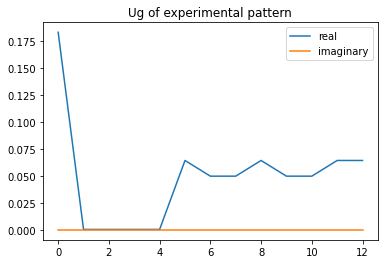

In [6]:
Ug = []
with open(file_dir, mode="r") as f:
    f.readline()
    for line in f:
        beam_id, Ug_re, Ug_im = line.strip().split(" ")[:3]
        Ug_re = float(Ug_re)
        Ug_im = float(Ug_im)
        Ug = np.append(Ug, [Ug_re, Ug_im])
        Ug = np.asarray(Ug)
        numUg = int(len(Ug)/2)
print(Ug.shape)

plt.plot(Ug[::2],label='real')
plt.plot(Ug[1::2],label='imaginary')
plt.legend()
plt.title('Ug of experimental pattern')

In [7]:
# join Ug and t:
Ug_t = np.append(Ug,t)
print(Ug_t.shape)

(27,)


experimental pattern:

the shape of the experimental pattern:  (1, 83, 83, 1)
0.9999989287512341


Text(0.5, 1.0, 'experimental Pattern')

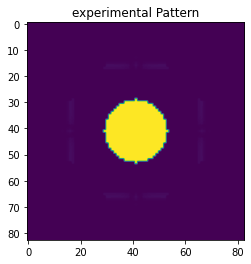

In [8]:
I = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/diff_pattern_" + name + ".csv", dtype=float) 
I = I.reshape(1,Nx,Nx,1)
print('the shape of the experimental pattern: ',I.shape)
print(I.max())

def nlogf(x):
    return np.log(1+1000*x)
nlog = np.vectorize(nlogf)

nlogf_I = nlogf(I)
plt.imshow(nlogf_I[0])
plt.title('experimental Pattern')

generate training&testing data:

>>> producing the 1. dataset...

The offset applied on thickness: -0.000670902816110658

The offset applied on Ug: -8.654173385412912

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.32909718388936
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg, zone = [0.0, 0.0, 1.0]


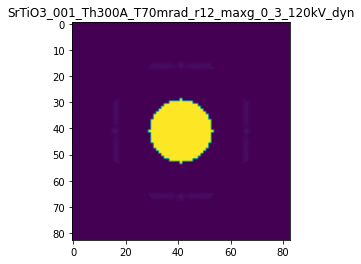

R-factor: 4.2369730097107466e-05

>>> producing the 2. dataset...

The offset applied on thickness: -0.00013282614340215759

The offset applied on Ug: 5.77033046267311

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.86717385659784
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

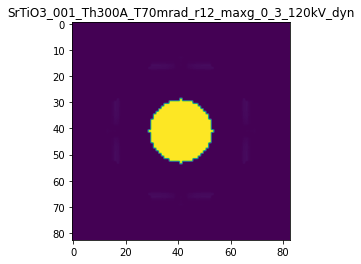

R-factor: 3.6022895501260685e-05

>>> producing the 3. dataset...

The offset applied on thickness: -0.0004192658692190732

The offset applied on Ug: -7.488860930406299

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5807341307809
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

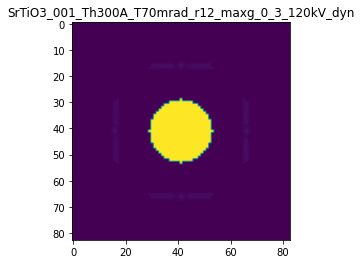

R-factor: 3.840352355191017e-05

>>> producing the 4. dataset...

The offset applied on thickness: -0.0005082859383179792

The offset applied on Ug: -9.04081839778352

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.491714061682
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

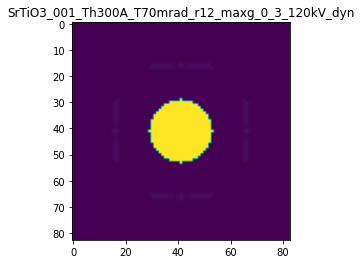

R-factor: 4.354400074668715e-05

>>> producing the 5. dataset...

The offset applied on thickness: -0.00017025438301613072

The offset applied on Ug: -9.175662501484279

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8297456169838
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

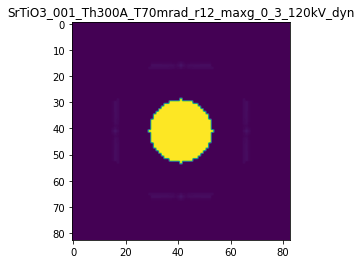

R-factor: 4.39318476352179e-05

>>> producing the 6. dataset...

The offset applied on thickness: 0.00023589084926694425

The offset applied on Ug: -7.514082242019526

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2358908492669
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

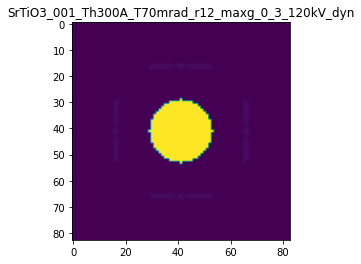

R-factor: 3.8482174047048714e-05

>>> producing the 7. dataset...

The offset applied on thickness: -0.0005535517869795081

The offset applied on Ug: -5.4298786381311475

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.44644821302046
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

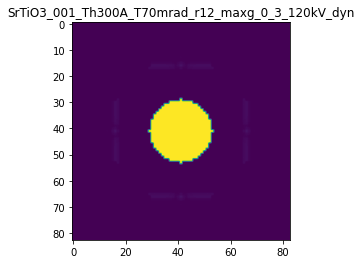

R-factor: 2.9674857612467652e-05

>>> producing the 8. dataset...

The offset applied on thickness: 0.0001532384717258035

The offset applied on Ug: 3.6732620644025453

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1532384717258
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

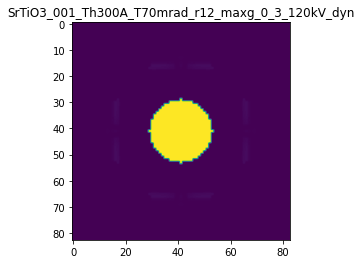

R-factor: 2.3038981253177334e-05

>>> producing the 9. dataset...

The offset applied on thickness: 0.0002094711687085138

The offset applied on Ug: 2.4003549127618133

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2094711687085
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

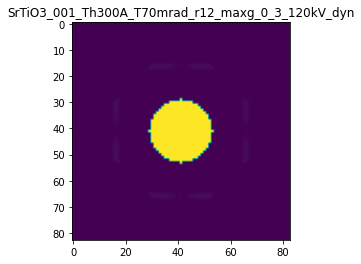

R-factor: 1.4976845865217132e-05

>>> producing the 10. dataset...

The offset applied on thickness: -0.0008729578124996347

The offset applied on Ug: 8.499307126422318

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.12704218750036
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

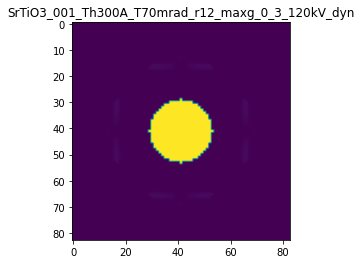

R-factor: 5.188038867522861e-05

>>> producing the 11. dataset...

The offset applied on thickness: -0.00043419069931592325

The offset applied on Ug: -8.420455295954287

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.56580930068407
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

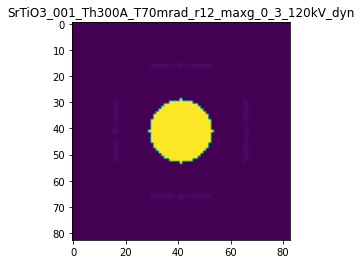

R-factor: 4.163305632502553e-05

>>> producing the 12. dataset...

The offset applied on thickness: -6.414174738817335e-06

The offset applied on Ug: -9.187657925182766

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.99358582526116
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

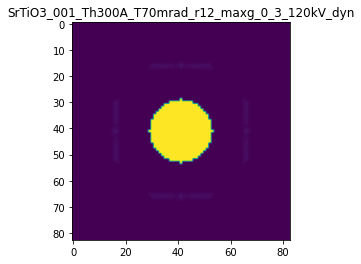

R-factor: 4.3948170509836034e-05

>>> producing the 13. dataset...

The offset applied on thickness: -0.0004081667194300629

The offset applied on Ug: 7.562851816646749

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5918332805699
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

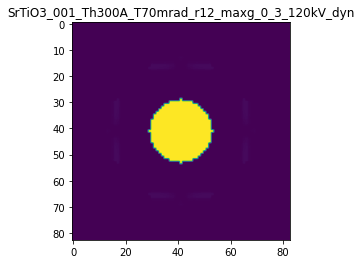

R-factor: 4.656808154610527e-05

>>> producing the 14. dataset...

The offset applied on thickness: 0.0005866761569106002

The offset applied on Ug: -7.560096908053256

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5866761569106
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

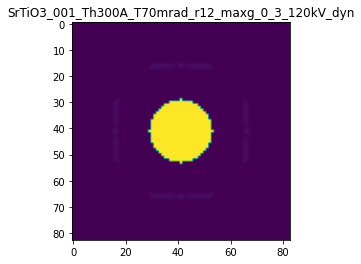

R-factor: 3.865120805204359e-05

>>> producing the 15. dataset...

The offset applied on thickness: -0.00015999793813959684

The offset applied on Ug: -0.4075713503217844

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8400020618604
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

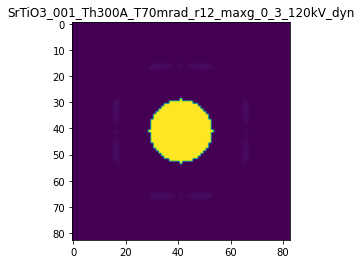

R-factor: 2.423226415652048e-06

>>> producing the 16. dataset...

The offset applied on thickness: -0.0003842692839676798

The offset applied on Ug: 2.897077849173204

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6157307160323
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

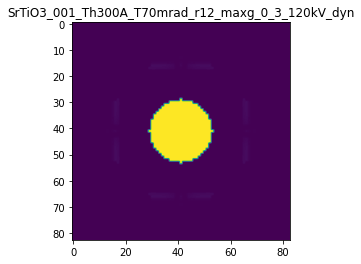

R-factor: 1.838994373317462e-05

>>> producing the 17. dataset...

The offset applied on thickness: -7.429220458705288e-05

The offset applied on Ug: 5.822778534300335

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.92570779541296
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

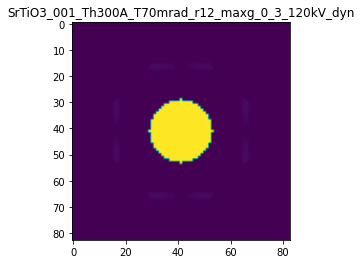

R-factor: 3.6318437845439017e-05

>>> producing the 18. dataset...

The offset applied on thickness: -8.629779848239827e-05

The offset applied on Ug: -6.185965807473906

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.9137022015176
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

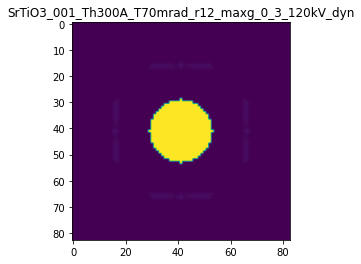

R-factor: 3.3117082041927486e-05

>>> producing the 19. dataset...

The offset applied on thickness: 0.0005198778330859173

The offset applied on Ug: -7.546129953350442

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5198778330859
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

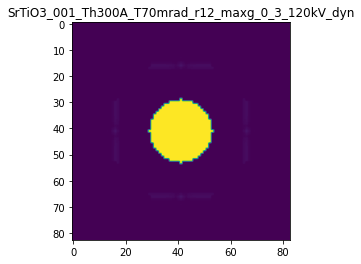

R-factor: 3.859950541457197e-05

>>> producing the 20. dataset...

The offset applied on thickness: -0.0003223087272873342

The offset applied on Ug: 5.51741718846584

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.67769127271265
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

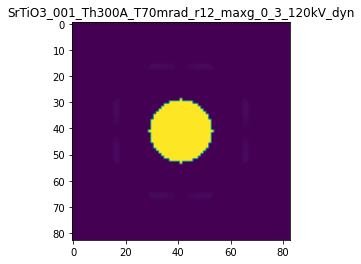

R-factor: 3.45606713392779e-05

>>> producing the 21. dataset...

The offset applied on thickness: -0.000981163286059116

The offset applied on Ug: -0.13327698593693413

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.01883671394086
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

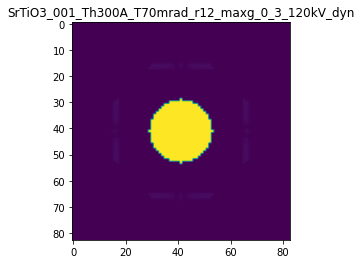

R-factor: 1.4512606605898238e-06

>>> producing the 22. dataset...

The offset applied on thickness: -0.0002976519869343246

The offset applied on Ug: 10.025815743460743

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.70234801306566
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

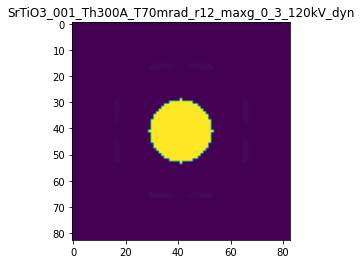

R-factor: 5.963722775167787e-05

>>> producing the 23. dataset...

The offset applied on thickness: 0.0009952756224103825

The offset applied on Ug: -1.387734297181039

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.99527562241036
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

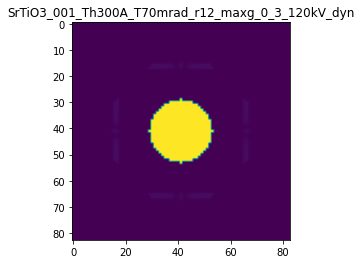

R-factor: 8.950282518240441e-06

>>> producing the 24. dataset...

The offset applied on thickness: 0.00010763175768951095

The offset applied on Ug: -3.3297491417866945

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1076317576895
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

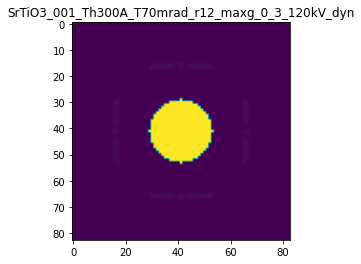

R-factor: 1.9213083466407055e-05

>>> producing the 25. dataset...

The offset applied on thickness: 0.0001442429108565988

The offset applied on Ug: 9.51833561952877

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1442429108566
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

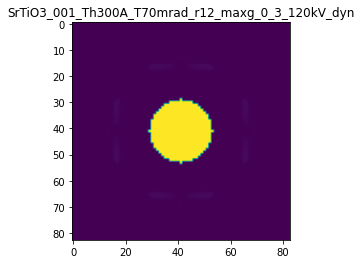

R-factor: 5.692495642216659e-05

>>> producing the 26. dataset...

The offset applied on thickness: 0.000775504987744978

The offset applied on Ug: 10.225772369686135

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.77550498774497
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

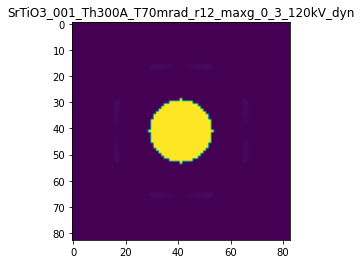

R-factor: 6.030148503862544e-05

>>> producing the 27. dataset...

The offset applied on thickness: 0.000526805147490156

The offset applied on Ug: 5.105378589987124

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.52680514749017
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

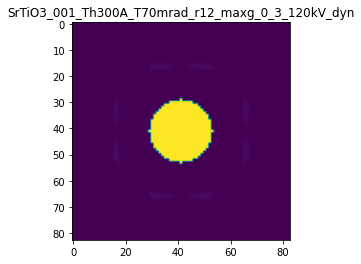

R-factor: 3.1746950465399674e-05

>>> producing the 28. dataset...

The offset applied on thickness: 0.00016505940048158242

The offset applied on Ug: -7.7874886773808

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.16505940048154
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

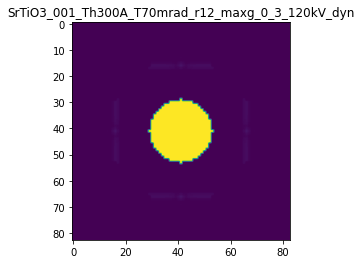

R-factor: 3.9470295215389664e-05

>>> producing the 29. dataset...

The offset applied on thickness: 0.0002264388441508345

The offset applied on Ug: 8.29096609874566

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.22643884415083
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

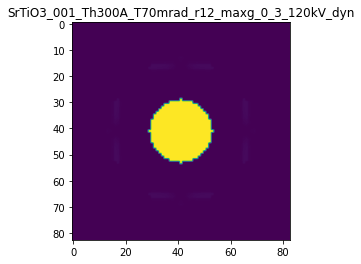

R-factor: 5.0398805461593826e-05

>>> producing the 30. dataset...

The offset applied on thickness: 0.00022764296598633328

The offset applied on Ug: 6.269103971548782

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2276429659863
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

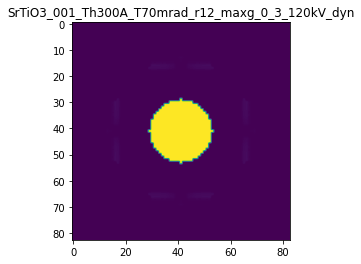

R-factor: 3.888042388781267e-05

>>> producing the 31. dataset...

The offset applied on thickness: -0.00023282498705140165

The offset applied on Ug: 8.192448818270218

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7671750129486
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

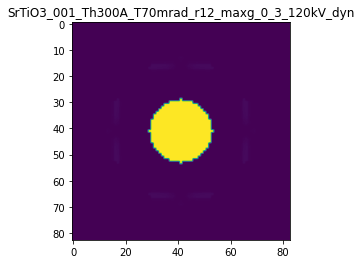

R-factor: 5.000770491506553e-05

>>> producing the 32. dataset...

The offset applied on thickness: 0.0005167928985662

The offset applied on Ug: 6.334423010095705

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5167928985662
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO3

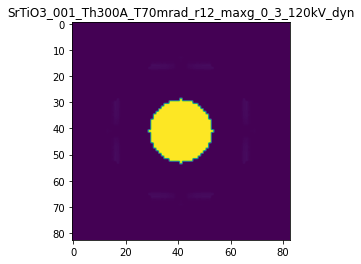

R-factor: 3.916950900805513e-05

>>> producing the 33. dataset...

The offset applied on thickness: 0.0005968689199832081

The offset applied on Ug: -4.244017520722268

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5968689199832
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

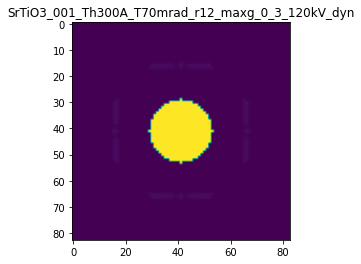

R-factor: 2.4075177637337137e-05

>>> producing the 34. dataset...

The offset applied on thickness: -0.0007645763696724492

The offset applied on Ug: -2.878955973605787

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2354236303275
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

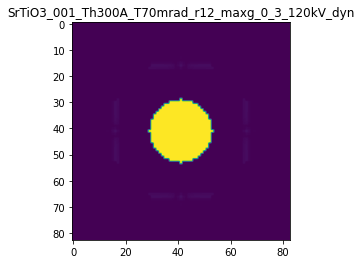

R-factor: 1.6585115938440934e-05

>>> producing the 35. dataset...

The offset applied on thickness: 0.0006833159752309917

The offset applied on Ug: 5.13787985428831

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.683315975231
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

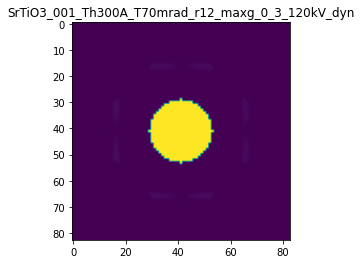

R-factor: 3.18911102756434e-05

>>> producing the 36. dataset...

The offset applied on thickness: 0.0009964375697686593

The offset applied on Ug: 9.543269070278416

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.9964375697686
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

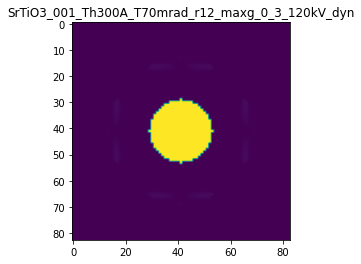

R-factor: 5.678697180779893e-05

>>> producing the 37. dataset...

The offset applied on thickness: -2.767513284130585e-05

The offset applied on Ug: 6.103011705315441

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.9723248671587
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

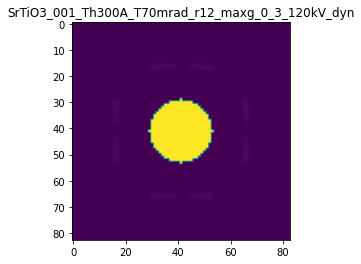

R-factor: 3.7980801431950364e-05

>>> producing the 38. dataset...

The offset applied on thickness: 0.000743052023063586

The offset applied on Ug: 0.546486749799517

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.74305202306357
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

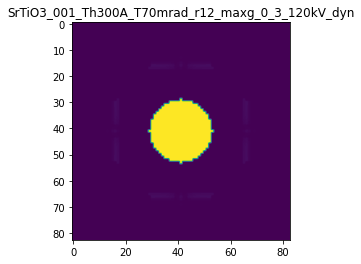

R-factor: 3.2503571227407358e-06

>>> producing the 39. dataset...

The offset applied on thickness: -0.0008331921242544646

The offset applied on Ug: 4.126916373934637

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1668078757455
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

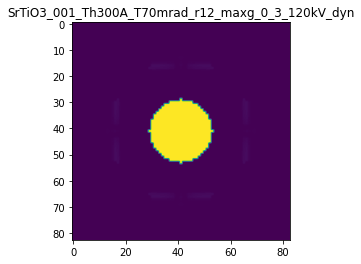

R-factor: 2.6281698655109638e-05

>>> producing the 40. dataset...

The offset applied on thickness: -6.93235021075489e-05

The offset applied on Ug: -7.742700076318085

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.9306764978925
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

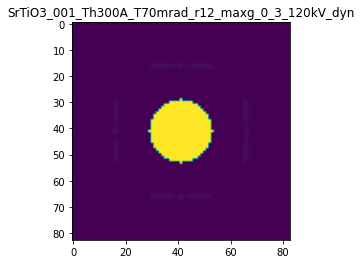

R-factor: 3.931806256012239e-05

>>> producing the 41. dataset...

The offset applied on thickness: 0.000663542698674434

The offset applied on Ug: 9.760271232307272

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6635426986744
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

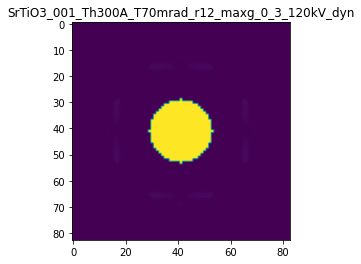

R-factor: 5.799707568960394e-05

>>> producing the 42. dataset...

The offset applied on thickness: 0.00043462789463106024

The offset applied on Ug: -8.797772688682176

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.43462789463103
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

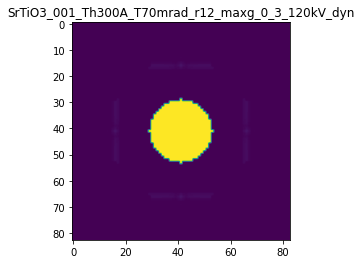

R-factor: 4.275621883876299e-05

>>> producing the 43. dataset...

The offset applied on thickness: -0.0008637643361775009

The offset applied on Ug: 2.7014299607768453

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.13623566382245
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

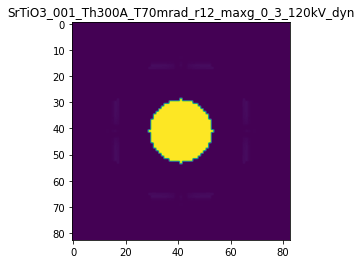

R-factor: 1.7384343742017098e-05

>>> producing the 44. dataset...

The offset applied on thickness: 0.00034469052297036675

The offset applied on Ug: 1.642187528634804

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3446905229704
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

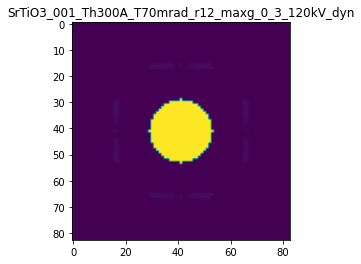

R-factor: 1.010571768731491e-05

>>> producing the 45. dataset...

The offset applied on thickness: 0.0002565266371950352

The offset applied on Ug: -4.267379781568834

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.25652663719507
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

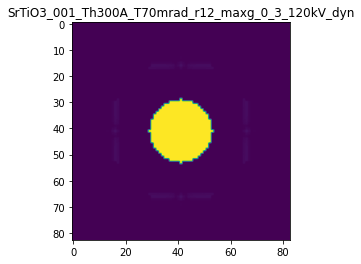

R-factor: 2.410566150202322e-05

>>> producing the 46. dataset...

The offset applied on thickness: 7.539843196516882e-05

The offset applied on Ug: -6.088058257522314

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0753984319652
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

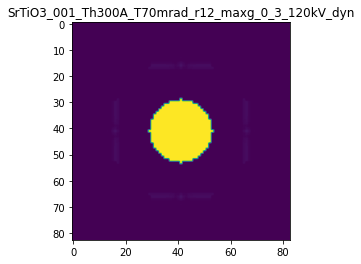

R-factor: 3.267526579470087e-05

>>> producing the 47. dataset...

The offset applied on thickness: 0.0007907476035205203

The offset applied on Ug: 4.640643979650024

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.7907476035205
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

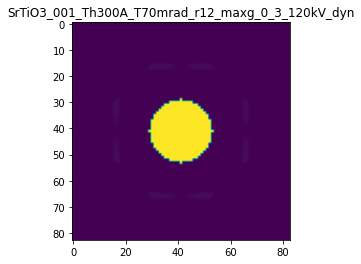

R-factor: 2.880162308818014e-05

>>> producing the 48. dataset...

The offset applied on thickness: 0.0008574050411495958

The offset applied on Ug: -9.43649242506614

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8574050411496
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

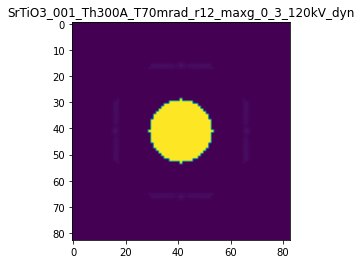

R-factor: 4.465002560357371e-05

>>> producing the 49. dataset...

The offset applied on thickness: -0.0006658245339420783

The offset applied on Ug: -5.288973246892738

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3341754660579
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

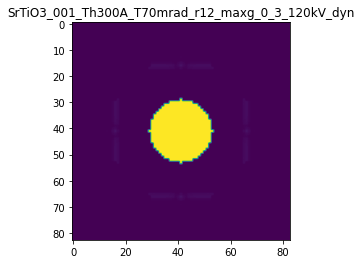

R-factor: 2.900883423053208e-05

>>> producing the 50. dataset...

The offset applied on thickness: 0.0009422571657620875

The offset applied on Ug: 8.500225470641224

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.94225716576204
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

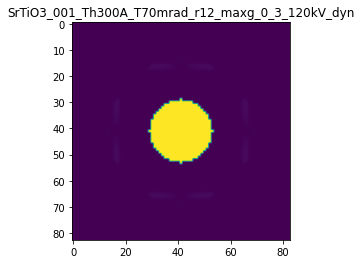

R-factor: 5.1309624697982016e-05

>>> producing the 51. dataset...

The offset applied on thickness: -0.0008396781978915428

The offset applied on Ug: -5.668774735159552

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.16032180210846
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

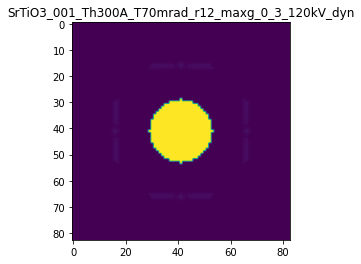

R-factor: 3.080660012496593e-05

>>> producing the 52. dataset...

The offset applied on thickness: 0.00045150811344861567

The offset applied on Ug: 1.2057535512397908

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4515081134486
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

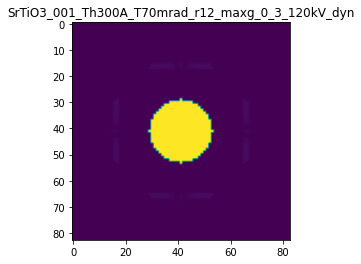

R-factor: 7.295712175367494e-06

>>> producing the 53. dataset...

The offset applied on thickness: -0.0005603348873577179

The offset applied on Ug: -2.9941841116695014

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4396651126423
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

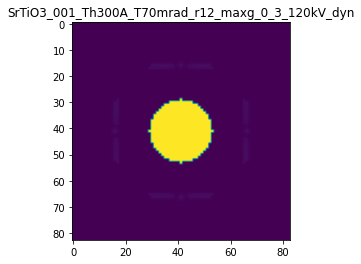

R-factor: 1.724798427842645e-05

>>> producing the 54. dataset...

The offset applied on thickness: -0.0006328793596514582

The offset applied on Ug: 9.34838939774831

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.36712064034856
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

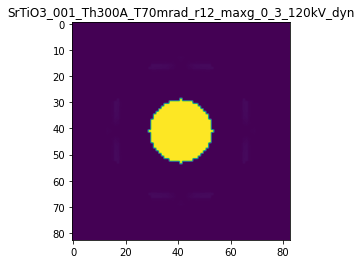

R-factor: 5.629270718747473e-05

>>> producing the 55. dataset...

The offset applied on thickness: -0.0006218139340207005

The offset applied on Ug: -1.664165922805364

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.37818606597926
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

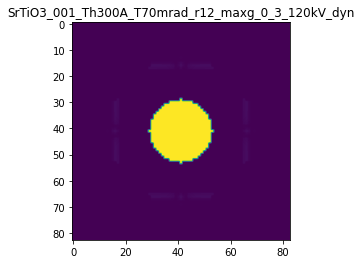

R-factor: 9.751733864371573e-06

>>> producing the 56. dataset...

The offset applied on thickness: -0.00033146634298470134

The offset applied on Ug: -6.864242523574083

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6685336570153
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

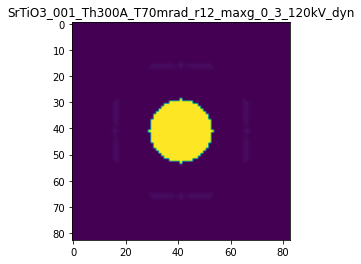

R-factor: 3.5982430787527655e-05

>>> producing the 57. dataset...

The offset applied on thickness: 0.0004229548389614177

The offset applied on Ug: -7.95831805088771

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4229548389614
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

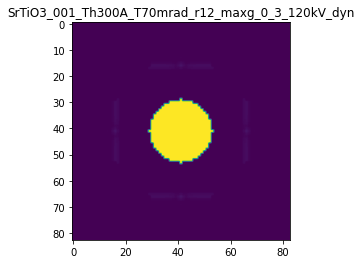

R-factor: 4.006416852247833e-05

>>> producing the 58. dataset...

The offset applied on thickness: -0.00020022992378126726

The offset applied on Ug: -7.023036497628834

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7997700762187
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

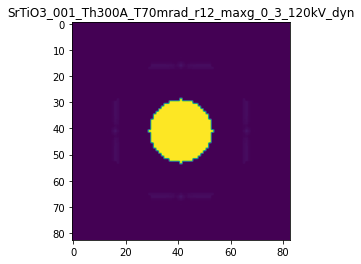

R-factor: 3.66092721474459e-05

>>> producing the 59. dataset...

The offset applied on thickness: -0.00043878581453711465

The offset applied on Ug: 0.11076378985071188

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.56121418546286
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

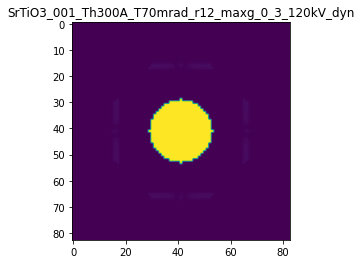

R-factor: 1.0221516995663042e-06

>>> producing the 60. dataset...

The offset applied on thickness: -0.0009829926155473818

The offset applied on Ug: -7.1054454500507065

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.0170073844526
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

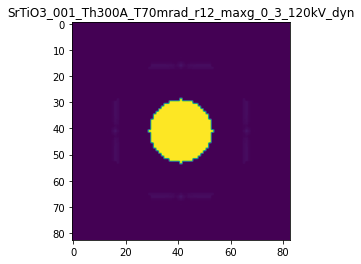

R-factor: 3.696812612681739e-05

>>> producing the 61. dataset...

The offset applied on thickness: -0.00037065908945938756

The offset applied on Ug: -10.035589176411403

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.62934091054063
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

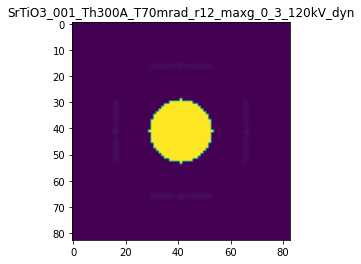

R-factor: 4.6762714799895344e-05

>>> producing the 62. dataset...

The offset applied on thickness: 0.0008373332118174318

The offset applied on Ug: -1.0460211259420271

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.83733321181745
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

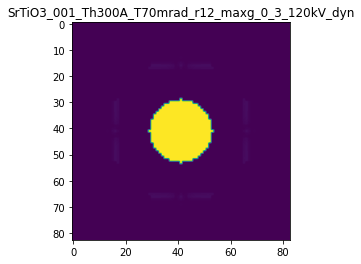

R-factor: 6.847474914964578e-06

>>> producing the 63. dataset...

The offset applied on thickness: -0.0006215436903556124

The offset applied on Ug: -2.072945556494026

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3784563096444
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

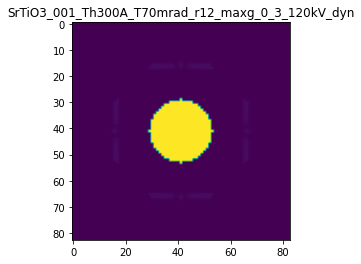

R-factor: 1.2093828283192085e-05

>>> producing the 64. dataset...

The offset applied on thickness: 0.00023333864216034205

The offset applied on Ug: -3.1467629472835212

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.23333864216033
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

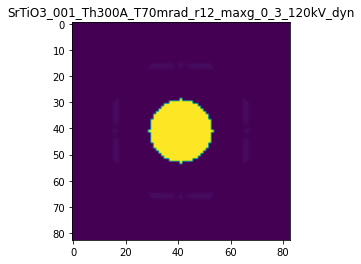

R-factor: 1.8274753576822964e-05

>>> producing the 65. dataset...

The offset applied on thickness: -0.0008916912416372486

The offset applied on Ug: -2.532451073481677

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.10830875836274
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

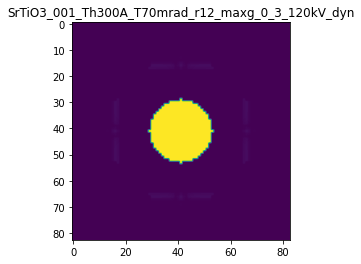

R-factor: 1.4644598479014946e-05

>>> producing the 66. dataset...

The offset applied on thickness: -0.00018067944319128038

The offset applied on Ug: -7.089701541612035

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8193205568087
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

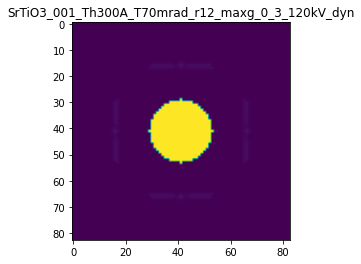

R-factor: 3.68730788342717e-05

>>> producing the 67. dataset...

The offset applied on thickness: -0.0006039807264468689

The offset applied on Ug: 6.848898218921745

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3960192735531
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

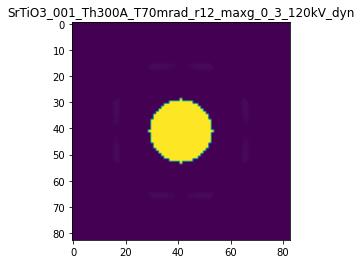

R-factor: 4.255717307952253e-05

>>> producing the 68. dataset...

The offset applied on thickness: 0.0008464003183620406

The offset applied on Ug: 8.78753469936606

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.84640031836204
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

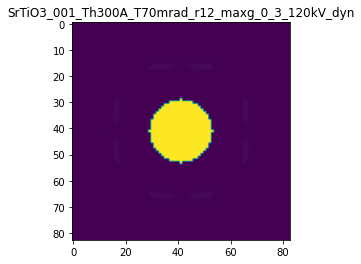

R-factor: 5.2882018772623856e-05

>>> producing the 69. dataset...

The offset applied on thickness: 0.0007833575030046767

The offset applied on Ug: 9.37392377321628

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.78335750300465
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

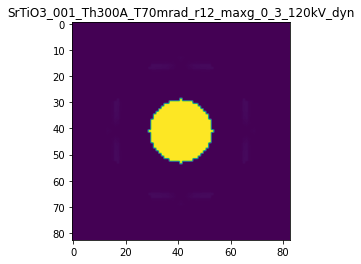

R-factor: 5.598030179432736e-05

>>> producing the 70. dataset...

The offset applied on thickness: 0.00043169497038224325

The offset applied on Ug: 7.630001021455187

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.43169497038224
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

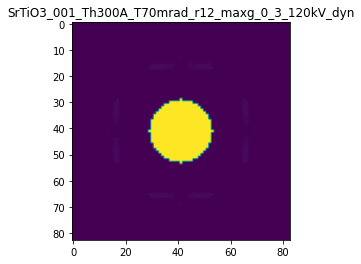

R-factor: 4.667284711029469e-05

>>> producing the 71. dataset...

The offset applied on thickness: -0.00011275094347972648

The offset applied on Ug: 5.941632890702417

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.88724905652026
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

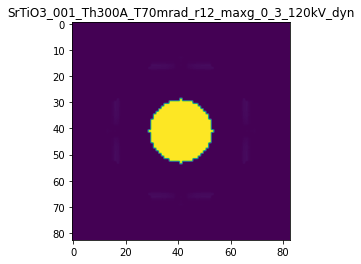

R-factor: 3.704564219193471e-05

>>> producing the 72. dataset...

The offset applied on thickness: -0.0002576801911622517

The offset applied on Ug: -1.6367283652282345

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.74231980883775
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

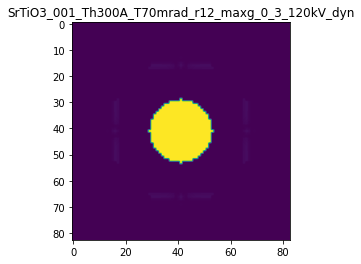

R-factor: 9.668068189753113e-06

>>> producing the 73. dataset...

The offset applied on thickness: 0.000461206306091553

The offset applied on Ug: -1.2793536310534797

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4612063060915
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

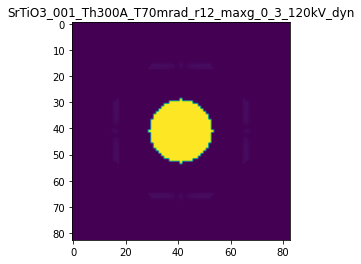

R-factor: 7.951939944399873e-06

>>> producing the 74. dataset...

The offset applied on thickness: -0.0009637950853683792

The offset applied on Ug: 3.170061516604733

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.03620491463164
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

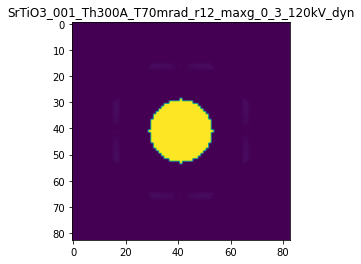

R-factor: 2.0379030774140475e-05

>>> producing the 75. dataset...

The offset applied on thickness: -0.0008953269817356342

The offset applied on Ug: 3.5561767835057663

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.10467301826435
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

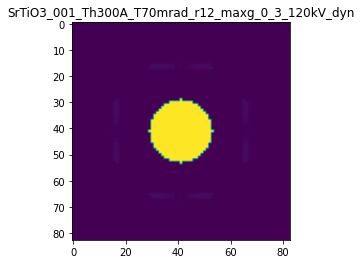

R-factor: 2.276103385269922e-05

>>> producing the 76. dataset...

The offset applied on thickness: -0.000520176935256976

The offset applied on Ug: -6.901233640615729

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.479823064743
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

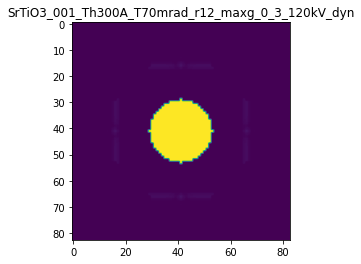

R-factor: 3.613431700793727e-05

>>> producing the 77. dataset...

The offset applied on thickness: 5.0013915857941797e-05

The offset applied on Ug: 8.342718021580465

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.05001391585796
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

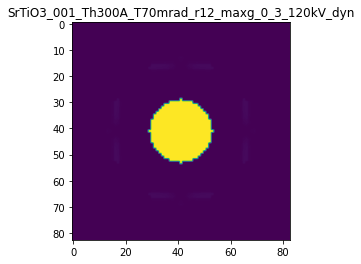

R-factor: 5.0736833466433995e-05

>>> producing the 78. dataset...

The offset applied on thickness: -0.00045681810631941015

The offset applied on Ug: -6.494109243725811

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5431818936806
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

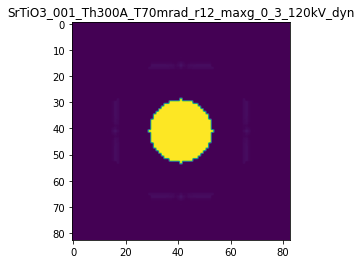

R-factor: 3.446127384951183e-05

>>> producing the 79. dataset...

The offset applied on thickness: -0.0006874626604177938

The offset applied on Ug: -3.360152272835048

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3125373395822
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

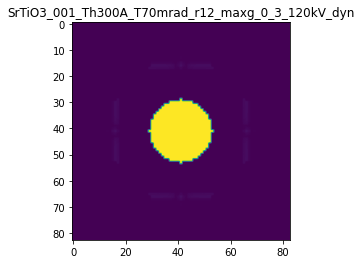

R-factor: 1.9209744126810292e-05

>>> producing the 80. dataset...

The offset applied on thickness: 0.0002190450547601186

The offset applied on Ug: 7.6702226588042395

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2190450547601
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

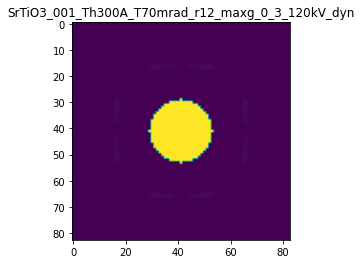

R-factor: 4.696726319308517e-05

>>> producing the 81. dataset...

The offset applied on thickness: -0.0005975137980070786

The offset applied on Ug: -0.938466835338379

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4024862019929
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

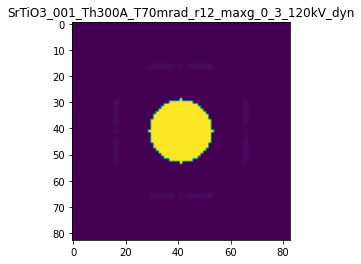

R-factor: 5.518550222989135e-06

>>> producing the 82. dataset...

The offset applied on thickness: -0.0001571087281267438

The offset applied on Ug: -9.510549359162416

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.84289127187327
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

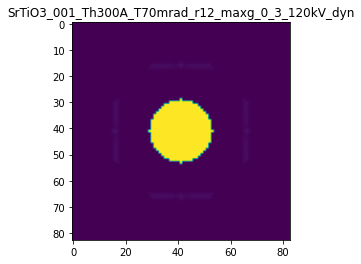

R-factor: 4.4998014806382444e-05

>>> producing the 83. dataset...

The offset applied on thickness: 0.0008046065046779016

The offset applied on Ug: 0.2180155746461469

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8046065046779
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

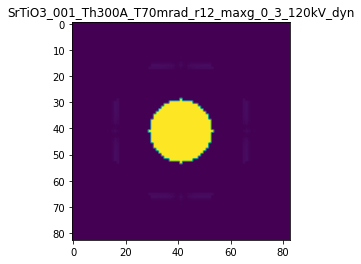

R-factor: 1.579659582345399e-06

>>> producing the 84. dataset...

The offset applied on thickness: 0.00030146128139284456

The offset applied on Ug: -1.1684908988790654

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.30146128139285
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

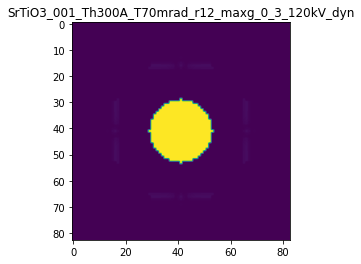

R-factor: 7.201454038940263e-06

>>> producing the 85. dataset...

The offset applied on thickness: 0.00032077706070765565

The offset applied on Ug: 3.290192550406143

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.32077706070766
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

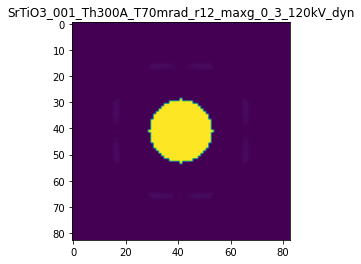

R-factor: 2.0562890626678212e-05

>>> producing the 86. dataset...

The offset applied on thickness: 0.00039354709910537354

The offset applied on Ug: -3.723495205916129

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3935470991054
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

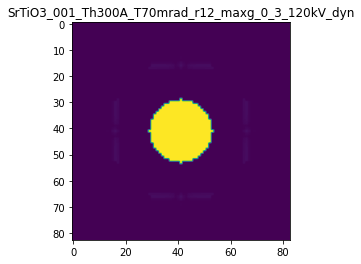

R-factor: 2.136868108050716e-05

>>> producing the 87. dataset...

The offset applied on thickness: 0.0008364989754281973

The offset applied on Ug: -6.60030767348768

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8364989754282
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

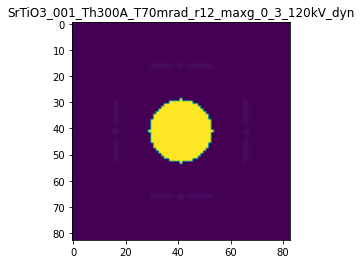

R-factor: 3.4900469306905486e-05

>>> producing the 88. dataset...

The offset applied on thickness: -0.00010871296678848697

The offset applied on Ug: 1.4915638124723865

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8912870332115
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

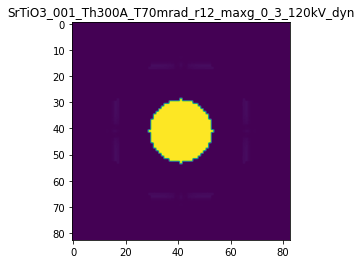

R-factor: 9.36823886759783e-06

>>> producing the 89. dataset...

The offset applied on thickness: 0.000389169770984348

The offset applied on Ug: -8.665041039799666

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3891697709843
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

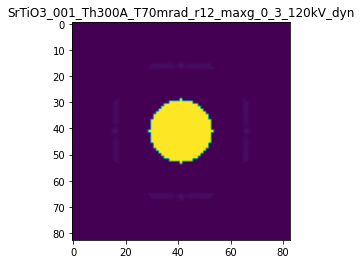

R-factor: 4.2358916586882494e-05

>>> producing the 90. dataset...

The offset applied on thickness: 0.00019143819822169795

The offset applied on Ug: -8.53142485867466

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1914381982217
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

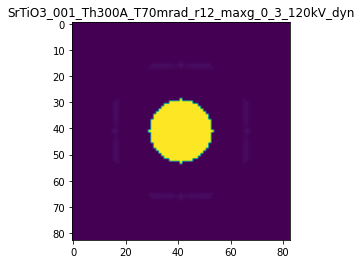

R-factor: 4.195205574311206e-05

>>> producing the 91. dataset...

The offset applied on thickness: -0.0003277135444572339

The offset applied on Ug: -1.0015479269520915

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6722864555428
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

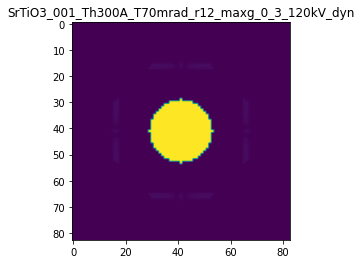

R-factor: 5.929811176302248e-06

>>> producing the 92. dataset...

The offset applied on thickness: -0.0008606891930753056

The offset applied on Ug: 7.907140935654698

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1393108069247
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

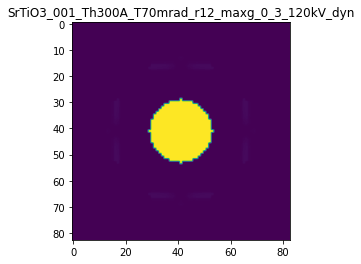

R-factor: 4.863882863267866e-05

>>> producing the 93. dataset...

The offset applied on thickness: -8.110634404500771e-05

The offset applied on Ug: 0.578537473992642

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.918893655955
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

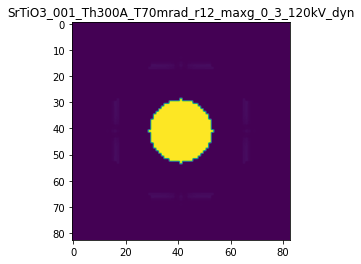

R-factor: 3.6232375690296048e-06

>>> producing the 94. dataset...

The offset applied on thickness: 0.0005313251570682713

The offset applied on Ug: 6.7896566473699345

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.53132515706824
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

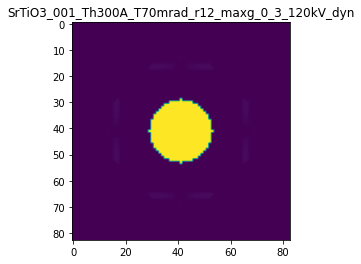

R-factor: 4.1832879351580066e-05

>>> producing the 95. dataset...

The offset applied on thickness: 0.00047227979647218213

The offset applied on Ug: 2.4951115322054376

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.47227979647215
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

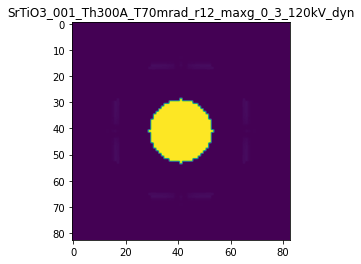

R-factor: 1.5463155061413634e-05

>>> producing the 96. dataset...

The offset applied on thickness: -0.0002550324438272806

The offset applied on Ug: 2.2440170556018484

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7449675561727
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

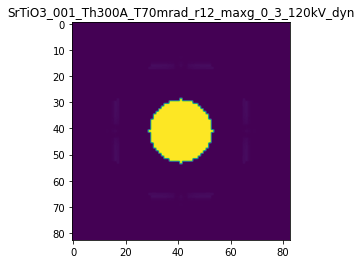

R-factor: 1.4197766563304733e-05

>>> producing the 97. dataset...

The offset applied on thickness: 0.0004992072872226838

The offset applied on Ug: 9.98180068213932

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4992072872227
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

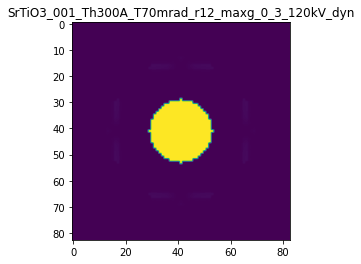

R-factor: 5.916529287948206e-05

>>> producing the 98. dataset...

The offset applied on thickness: -0.00057964489823621

The offset applied on Ug: 5.151763079684561

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4203551017638
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

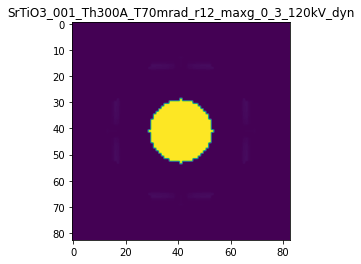

R-factor: 3.245085226687849e-05

>>> producing the 99. dataset...

The offset applied on thickness: 0.00048292816099484016

The offset applied on Ug: -5.8406747435550646

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4829281609948
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

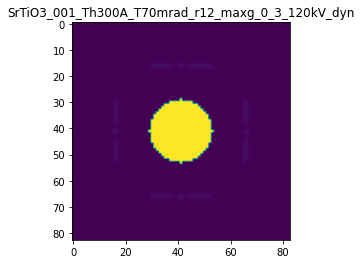

R-factor: 3.159321161853539e-05

>>> producing the 100. dataset...

The offset applied on thickness: -0.0008949761829831367

The offset applied on Ug: -7.039326004183904

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.10502381701684
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

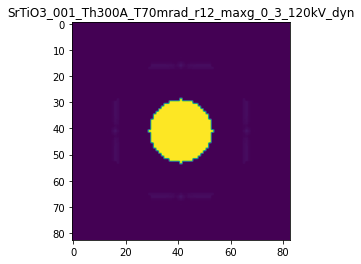

R-factor: 3.6705115586686254e-05

>>> producing the 101. dataset...

The offset applied on thickness: -0.0004959022672150273

The offset applied on Ug: 9.408920204385172

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.50409773278494
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

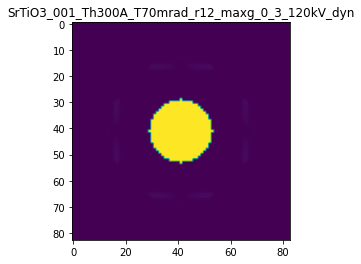

R-factor: 5.6562638164404064e-05

>>> producing the 102. dataset...

The offset applied on thickness: -0.00011359046599272382

The offset applied on Ug: -0.20854483174134658

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.88640953400727
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_f

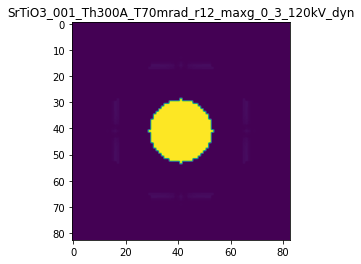

R-factor: 1.236142090118318e-06

>>> producing the 103. dataset...

The offset applied on thickness: 0.0009255474602595919

The offset applied on Ug: -10.089717862250486

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.92554746025957
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

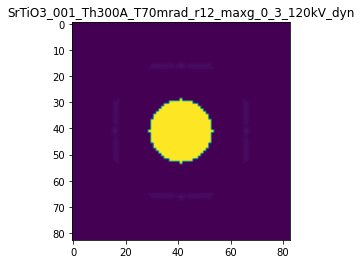

R-factor: 4.6691189779201134e-05

>>> producing the 104. dataset...

The offset applied on thickness: 1.9044322458811713e-05

The offset applied on Ug: 7.882326994954087

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0190443224588
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

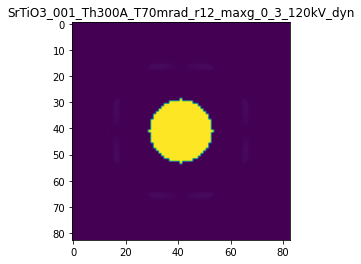

R-factor: 4.821628749581094e-05

>>> producing the 105. dataset...

The offset applied on thickness: 0.0001234283760298538

The offset applied on Ug: 7.318792267073157

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.12342837602984
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

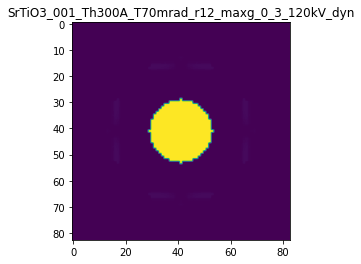

R-factor: 4.501217063019508e-05

>>> producing the 106. dataset...

The offset applied on thickness: 0.0002989167965437685

The offset applied on Ug: 4.5137084926926425

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2989167965437
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

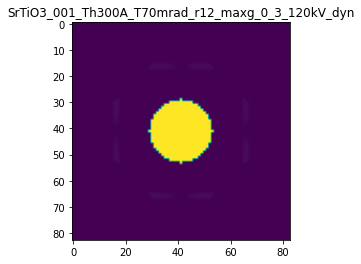

R-factor: 2.8210437725681628e-05

>>> producing the 107. dataset...

The offset applied on thickness: 0.0005902773461395177

The offset applied on Ug: 2.13406811232094

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.59027734613954
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

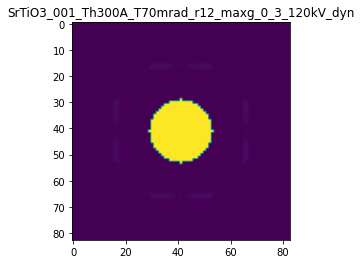

R-factor: 1.31151962125978e-05

>>> producing the 108. dataset...

The offset applied on thickness: 0.0006238146012235857

The offset applied on Ug: -7.140178013287571

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.62381460122356
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

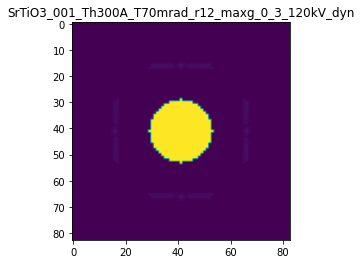

R-factor: 3.707831953400672e-05

>>> producing the 109. dataset...

The offset applied on thickness: 0.00080061674733186

The offset applied on Ug: 0.021892138448536116

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.80061674733184
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

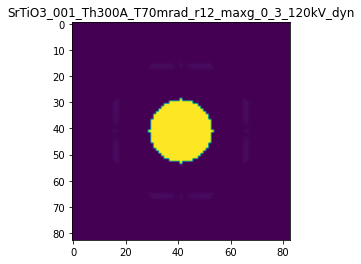

R-factor: 1.0357964951963162e-06

>>> producing the 110. dataset...

The offset applied on thickness: 0.0004687470067061377

The offset applied on Ug: 2.925402430913973

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4687470067061
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

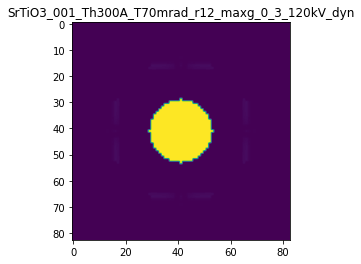

R-factor: 1.8195968816176146e-05

>>> producing the 111. dataset...

The offset applied on thickness: -0.00014062517520448183

The offset applied on Ug: 9.816922429765034

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8593748247955
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

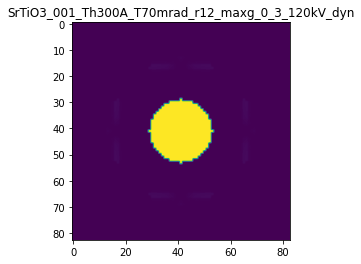

R-factor: 5.853693360971623e-05

>>> producing the 112. dataset...

The offset applied on thickness: 0.0007922164105310168

The offset applied on Ug: -6.690920434330767

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.792216410531
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

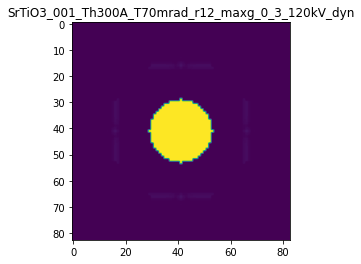

R-factor: 3.5279304980988596e-05

>>> producing the 113. dataset...

The offset applied on thickness: -0.0008056410820080049

The offset applied on Ug: -1.683520663229142

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.194358917992
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

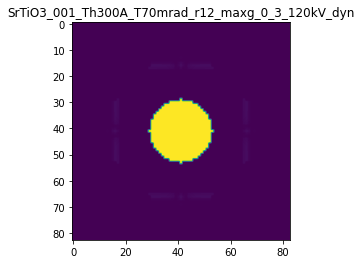

R-factor: 9.838574397633181e-06

>>> producing the 114. dataset...

The offset applied on thickness: 0.0007441185918405047

The offset applied on Ug: 0.4126168322870649

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.74411859184045
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

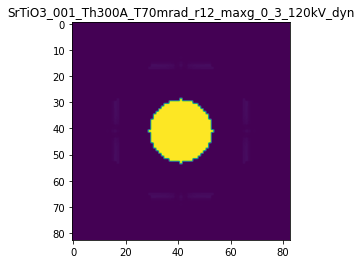

R-factor: 2.5192957298606895e-06

>>> producing the 115. dataset...

The offset applied on thickness: -0.00024291367805812358

The offset applied on Ug: -8.887270392859223

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.75708632194187
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_fil

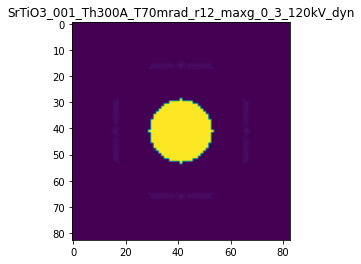

R-factor: 4.303695573769756e-05

>>> producing the 116. dataset...

The offset applied on thickness: 0.000791088249591124

The offset applied on Ug: 1.1605520251910753

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.7910882495911
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

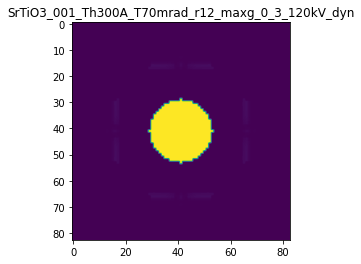

R-factor: 6.904303025908847e-06

>>> producing the 117. dataset...

The offset applied on thickness: -0.0004986133649005364

The offset applied on Ug: -4.904269020862182

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.50138663509944
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

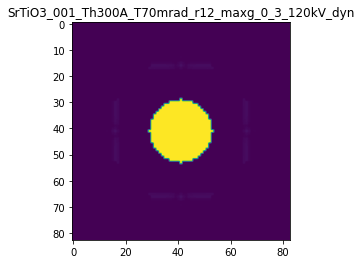

R-factor: 2.716149600525073e-05

>>> producing the 118. dataset...

The offset applied on thickness: 7.206885701962684e-05

The offset applied on Ug: 9.487518231762694

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0720688570196
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

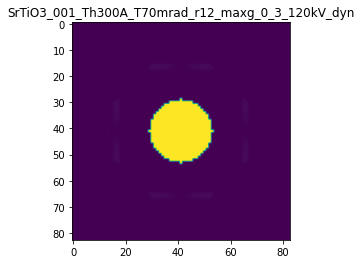

R-factor: 5.678922667222516e-05

>>> producing the 119. dataset...

The offset applied on thickness: 0.0006988694293784687

The offset applied on Ug: 1.1922392156765114

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6988694293785
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

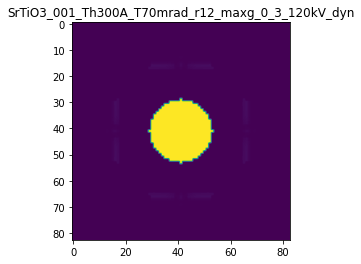

R-factor: 7.11980836792374e-06

>>> producing the 120. dataset...

The offset applied on thickness: 0.0006780961958104994

The offset applied on Ug: 3.813382337017913

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6780961958105
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

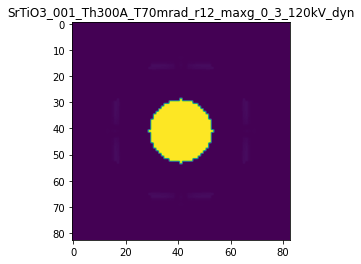

R-factor: 2.3706126459912816e-05

>>> producing the 121. dataset...

The offset applied on thickness: 0.0008500462314451864

The offset applied on Ug: -5.403417787510734

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.85004623144516
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

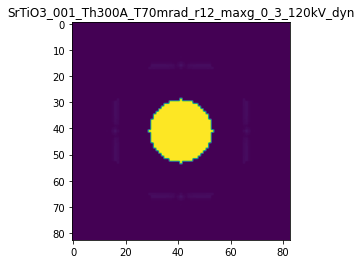

R-factor: 2.9671468679397668e-05

>>> producing the 122. dataset...

The offset applied on thickness: -0.00020027627368260782

The offset applied on Ug: 1.2689804237284648

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7997237263174
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

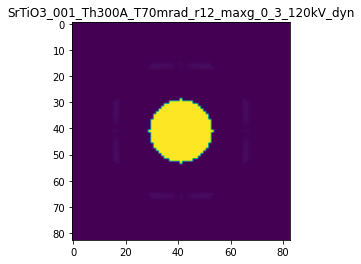

R-factor: 8.011047319848718e-06

>>> producing the 123. dataset...

The offset applied on thickness: 0.0005331819263150868

The offset applied on Ug: -4.961819372772132

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5331819263151
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

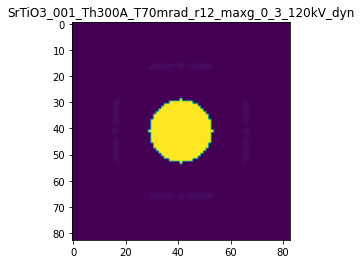

R-factor: 2.754748331575666e-05

>>> producing the 124. dataset...

The offset applied on thickness: 0.0003951893390634085

The offset applied on Ug: -8.536329713205694

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3951893390634
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

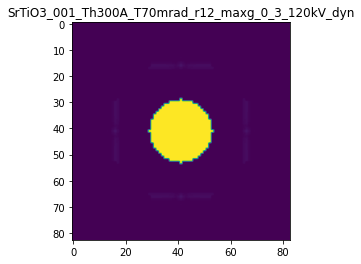

R-factor: 4.1959593146340295e-05

>>> producing the 125. dataset...

The offset applied on thickness: -0.00027588958354167394

The offset applied on Ug: -4.244268640267363

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7241104164583
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

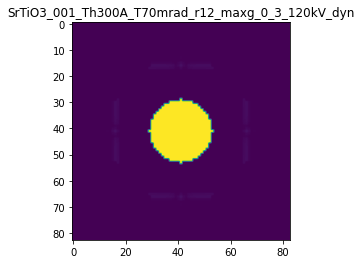

R-factor: 2.388674559946724e-05

>>> producing the 126. dataset...

The offset applied on thickness: -0.0002015004706320449

The offset applied on Ug: 3.790730171606624

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7984995293679
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

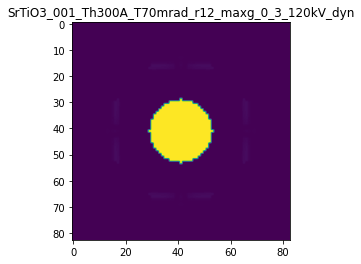

R-factor: 2.3921072052867142e-05

>>> producing the 127. dataset...

The offset applied on thickness: 0.00058790946502068

The offset applied on Ug: -4.809359640095936

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5879094650207
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

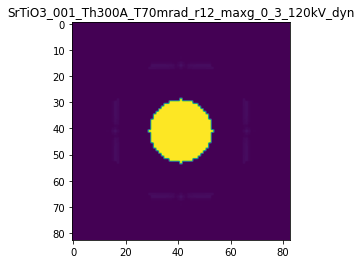

R-factor: 2.6834338247422734e-05

>>> producing the 128. dataset...

The offset applied on thickness: 0.000998439694518111

The offset applied on Ug: -2.230860583036474

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.99843969451814
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

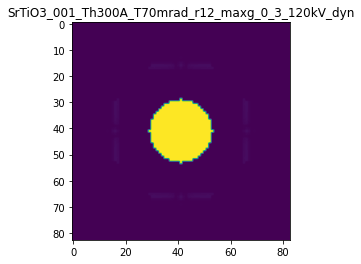

R-factor: 1.369076711998238e-05

>>> producing the 129. dataset...

The offset applied on thickness: -0.000695293542909363

The offset applied on Ug: 6.226927951004487

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3047064570906
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

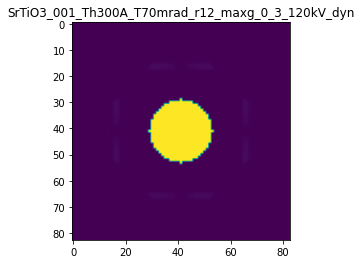

R-factor: 3.894719659658616e-05

>>> producing the 130. dataset...

The offset applied on thickness: 0.0004902526096597853

The offset applied on Ug: 3.0762317361020814

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.49025260965976
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

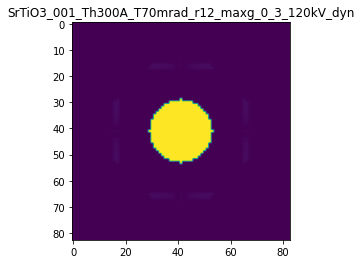

R-factor: 1.9141862942286176e-05

>>> producing the 131. dataset...

The offset applied on thickness: -0.0003601819436620337

The offset applied on Ug: -5.0112889562881655

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.63981805633796
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_fil

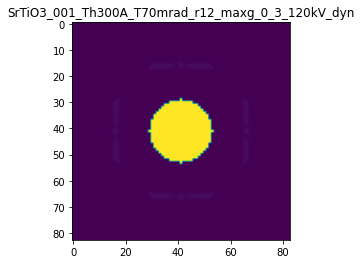

R-factor: 2.7688097024195166e-05

>>> producing the 132. dataset...

The offset applied on thickness: -0.0007277511277674158

The offset applied on Ug: -1.2193195089222173

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2722488722326
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

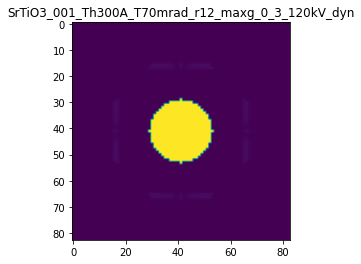

R-factor: 7.152366770528588e-06

>>> producing the 133. dataset...

The offset applied on thickness: 0.0005294305986852099

The offset applied on Ug: -0.5453075117703611

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5294305986852
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

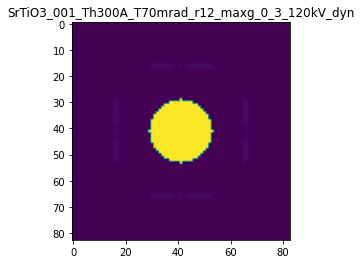

R-factor: 3.6591423600406196e-06

>>> producing the 134. dataset...

The offset applied on thickness: 0.0005778764428424987

The offset applied on Ug: 9.101842285465601

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5778764428425
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

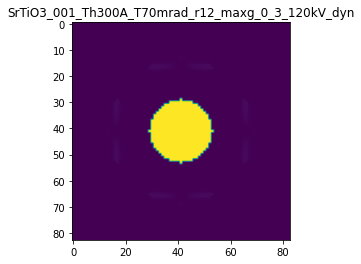

R-factor: 5.462668638472227e-05

>>> producing the 135. dataset...

The offset applied on thickness: 0.0003313872497672266

The offset applied on Ug: -5.956049042600748

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3313872497672
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

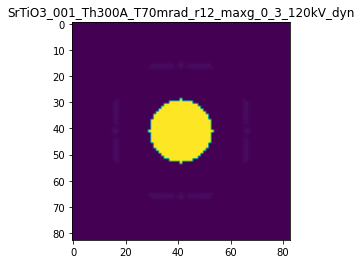

R-factor: 3.208839506385876e-05

>>> producing the 136. dataset...

The offset applied on thickness: 0.0007869637435453588

The offset applied on Ug: -2.858399038177304

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.78696374354536
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

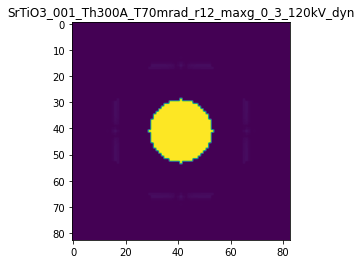

R-factor: 1.692822698246785e-05

>>> producing the 137. dataset...

The offset applied on thickness: -0.0008116005529098829

The offset applied on Ug: -3.0575550265932954

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1883994470901
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

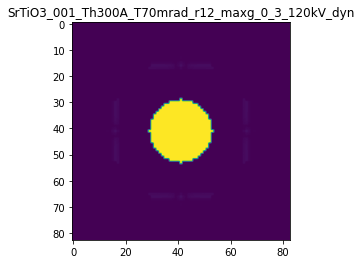

R-factor: 1.7556543928571125e-05

>>> producing the 138. dataset...

The offset applied on thickness: 0.0007356459161233006

The offset applied on Ug: -8.43602001614682

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.7356459161233
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

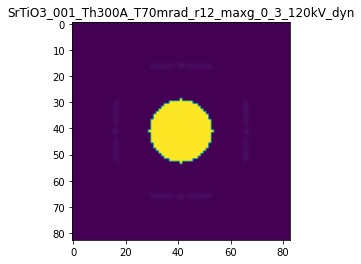

R-factor: 4.163899104546269e-05

>>> producing the 139. dataset...

The offset applied on thickness: 0.0008573568485006815

The offset applied on Ug: -2.6876572701514987

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8573568485007
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

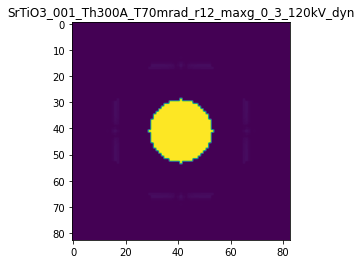

R-factor: 1.6050092763247625e-05

>>> producing the 140. dataset...

The offset applied on thickness: 0.0004162586159399122

The offset applied on Ug: 2.2457124443896532

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4162586159399
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

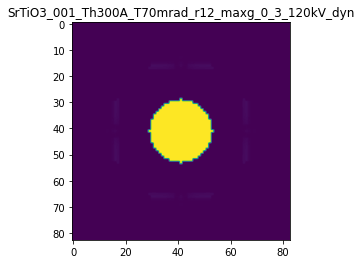

R-factor: 1.3902406542139276e-05



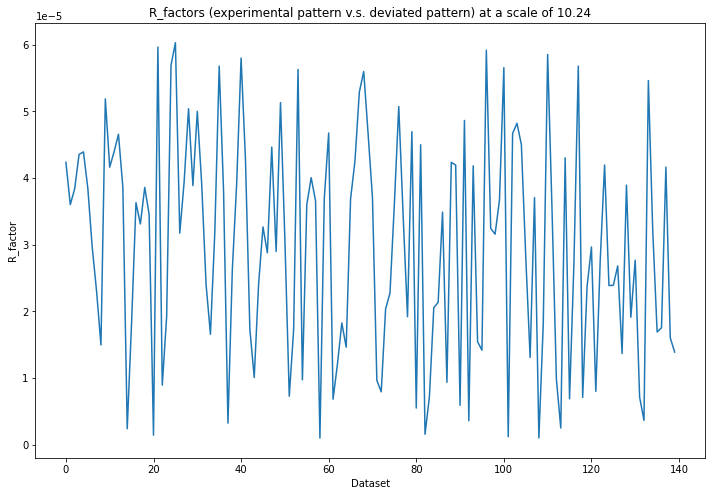

In [9]:
# define training set size & testing set size
trainsize = 100
testsize = 40
data_size = trainsize+testsize

# initial scale used to diverse Ug and t
scale_Ug, scale_t = 10.24, 0.001

# generate Datasets
X, y, R_factors = generate_diversed_data(Ug_t, scale_Ug=scale_Ug, scale_t=scale_t, data_size=data_size)

X_train = X[:trainsize,]
X_test = X[trainsize:trainsize+testsize,]
y_train = y[:trainsize,]
y_test = y[trainsize:trainsize+testsize,]


In [10]:
makeUniqueUgVector = True
beam1, beam2 = 4, 5

---------------------------------------------------------------------------------------------------------------

# II. Build the neural network

In [11]:
backend.clear_session()

num_of_features = 2*numUg+1

# invert the Input to the form which can be used in the ResNet50 Model
target_size = X_train.shape[1:3]
input_size = (*target_size, 3)

# insert ResNet50 Model
base_model = applications.ResNet50(include_top=False, weights='imagenet', input_shape=input_size)  

# combine the ResNet50 model with my model
x = Flatten()(base_model.output)
x = Dense(num_of_features*16, activation='tanh')(x)
x = Dense(num_of_features*4, activation='tanh')(x)
x = Dense(num_of_features, activation='tanh')(x)
x = Dense(num_of_features, activation='tanh')(x)
model = Model(inputs=base_model.input, outputs=x)

# remove the output layer and replaced it with the regression output layer we want in ResNet50
# keep the weights of the first 49 layers of the ResNet50 model unchanged during the training process 
for layer in base_model.layers[:-1]:
    layer.trainable = False

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 83, 83, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 89, 89, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 42, 42, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 42, 42, 64)   256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [12]:
opt = tf.keras.optimizers.Adam(lr=0.001) 
model.compile(loss='mse', optimizer=opt, metrics=['mae','acc'])

#save the model
model.save(name + ".h5")

_____________________________________________________________________________________________________________

# III. Replace the initial training set with new training set

>>>train the initial training set:
Epoch 1/20
5/5 [==============================] - 8s 1s/step - loss: 0.3481 - mean_absolute_error: 0.4746 - acc: 0.4900 - val_loss: 0.2700 - val_mean_absolute_error: 0.4044 - val_acc: 0.7500
Epoch 2/20
5/5 [==============================] - 3s 538ms/step - loss: 0.2473 - mean_absolute_error: 0.3785 - acc: 0.6600 - val_loss: 0.1898 - val_mean_absolute_error: 0.3252 - val_acc: 0.7500
Epoch 3/20
5/5 [==============================] - 3s 541ms/step - loss: 0.1758 - mean_absolute_error: 0.3038 - acc: 0.6600 - val_loss: 0.1312 - val_mean_absolute_error: 0.2541 - val_acc: 0.7500
Epoch 4/20
5/5 [==============================] - 3s 542ms/step - loss: 0.1199 - mean_absolute_error: 0.2344 - acc: 0.6600 - val_loss: 0.0808 - val_mean_absolute_error: 0.1913 - val_acc: 0.7500
Epoch 5/20
5/5 [==============================] - 3s 583ms/step - loss: 0.0769 - mean_absolute_error: 0.1844 - acc: 0.1400 - val_loss: 0.0594 - val_mean_absolute_error: 0.1665 - val_acc: 0.000

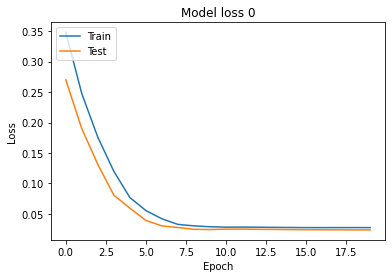

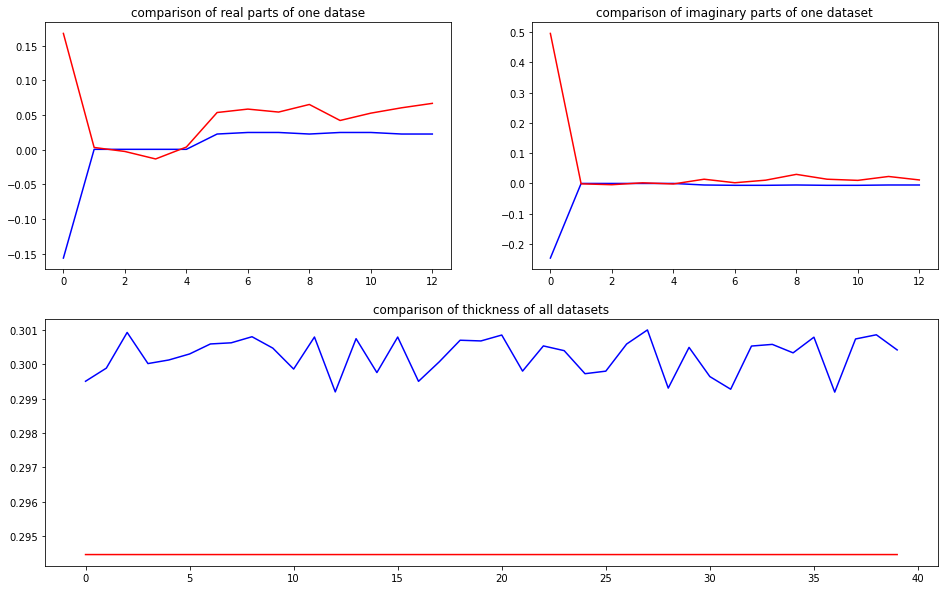

predicted thickness: 0.29319072


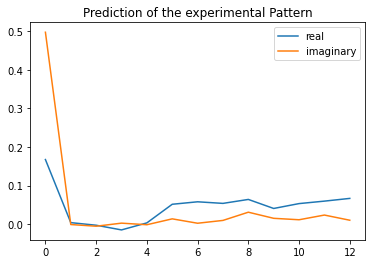

The offset applied on thickness: 0.0005335215451421953

The offset applied on Ug: -4.134115368558985

Applied shift of unit cell origin (fractional coordinates): -0.46101644139821335 -0.012275879357100646
Ug[ 0 ]: 0.97061 3.14159  =>  0.97061 3.14159
Ug[ 1 ]: 0.00229 1.31691  =>  0.00229 1.23978
Ug[ 2 ]: 0.00229 -1.31691  =>  0.00229 -1.23978
Ug[ 3 ]: 0.00641 2.89665  =>  0.00641 -0.0
Ug[ 4 ]: 0.00641 -2.89665  =>  0.00641 0.0
Ug[ 5 ]: 0.04198 -0.15426  =>  0.04198 -0.0
Ug[ 6 ]: 0.04283 -0.11187  =>  0.04283 -2.93139
Ug[ 7 ]: 0.0374 -0.10089  =>  0.0374 2.87289
Ug[ 8 ]: 0.04198 0.15426  =>  0.04198 0.0
Ug[ 9 ]: 0.0374 0.10089  =>  0.0374 -2.87289
Ug[ 10 ]: 0.04283 0.11187  =>  0.04283 2.93139
Ug[ 11 ]: 0.0458 0.14784  =>  0.0458 -0.34204
Ug[ 12 ]: 0.0458 -0.14784  =>  0.0458 0.34204
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

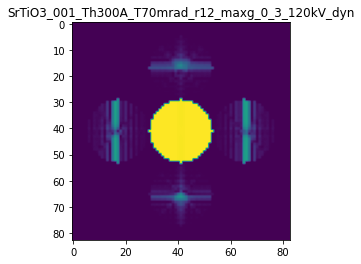

X_sim.max(): 0.9998214176692037
>>>replaced the 1. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 844ms/step - loss: 0.0279 - mean_absolute_error: 0.0463 - acc: 0.3400 - val_loss: 0.0217 - val_mean_absolute_error: 0.0400 - val_acc: 0.2250
Epoch 2/5
5/5 [==============================] - 3s 593ms/step - loss: 0.0280 - mean_absolute_error: 0.0469 - acc: 0.3400 - val_loss: 0.0219 - val_mean_absolute_error: 0.0407 - val_acc: 0.2250
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0279 - mean_absolute_error: 0.0461 - acc: 0.3400 - val_loss: 0.0217 - val_mean_absolute_error: 0.0408 - val_acc: 0.2250
Epoch 4/5
5/5 [==============================] - 3s 707ms/step - loss: 0.0279 - mean_absolute_error: 0.0462 - acc: 0.3400 - val_loss: 0.0219 - val_mean_absolute_error: 0.0414 - val_acc: 0.2250
Epoch 5/5
5/5 [==============================] - 4s 756ms/step - loss: 0.0279 - mean_absolute_error: 0.0459 - acc: 0.3400 - val_loss: 0.0219 - val_mean_absol

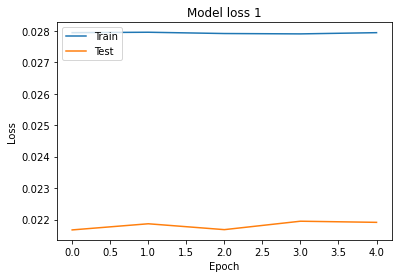

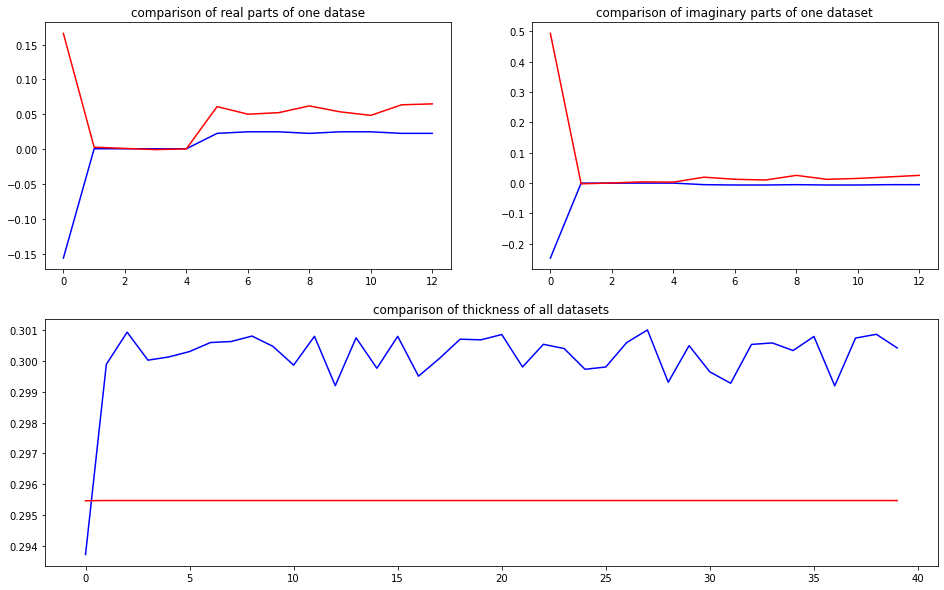

predicted thickness: 0.29423022


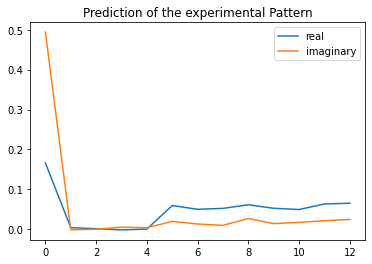

The offset applied on thickness: 0.0004917223621829552

The offset applied on Ug: 4.531448819423791

Applied shift of unit cell origin (fractional coordinates): -0.4033834161487862 -0.005956429330503033
Ug[ 0 ]: 1.39549 0.0  =>  1.39549 0.0
Ug[ 1 ]: 0.00234 -0.26511  =>  0.00234 -0.30254
Ug[ 2 ]: 0.00234 0.26511  =>  0.00234 0.30254
Ug[ 3 ]: 0.00121 2.53453  =>  0.00121 -0.0
Ug[ 4 ]: 0.00121 -2.53453  =>  0.00121 0.0
Ug[ 5 ]: 0.07897 -0.07485  =>  0.07897 0.0
Ug[ 6 ]: 0.06139 -0.03607  =>  0.06139 -2.53317
Ug[ 7 ]: 0.06494 -0.04046  =>  0.06494 2.5315
Ug[ 8 ]: 0.07897 0.07485  =>  0.07897 0.0
Ug[ 9 ]: 0.06494 0.04046  =>  0.06494 -2.5315
Ug[ 10 ]: 0.06139 0.03607  =>  0.06139 2.53317
Ug[ 11 ]: 0.08479 -0.0408  =>  0.08479 -1.25492
Ug[ 12 ]: 0.08479 0.0408  =>  0.08479 1.25492
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

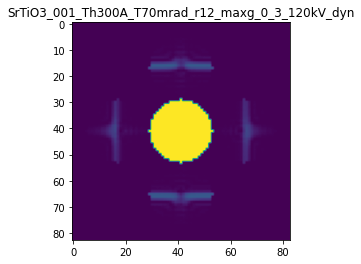

X_sim.max(): 0.9999743428687675
>>>replaced the 2. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0286 - mean_absolute_error: 0.0465 - acc: 0.3300 - val_loss: 0.0233 - val_mean_absolute_error: 0.0414 - val_acc: 0.2250
Epoch 2/5
5/5 [==============================] - 3s 646ms/step - loss: 0.0286 - mean_absolute_error: 0.0473 - acc: 0.3300 - val_loss: 0.0234 - val_mean_absolute_error: 0.0421 - val_acc: 0.2250
Epoch 3/5
5/5 [==============================] - 3s 629ms/step - loss: 0.0286 - mean_absolute_error: 0.0475 - acc: 0.3300 - val_loss: 0.0232 - val_mean_absolute_error: 0.0418 - val_acc: 0.2250
Epoch 4/5
5/5 [==============================] - 3s 653ms/step - loss: 0.0286 - mean_absolute_error: 0.0477 - acc: 0.3300 - val_loss: 0.0234 - val_mean_absolute_error: 0.0427 - val_acc: 0.2250
Epoch 5/5
5/5 [==============================] - 3s 662ms/step - loss: 0.0287 - mean_absolute_error: 0.0476 - acc: 0.3300 - val_loss: 0.0231 - val_mean_absolute

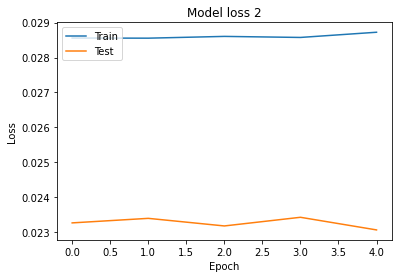

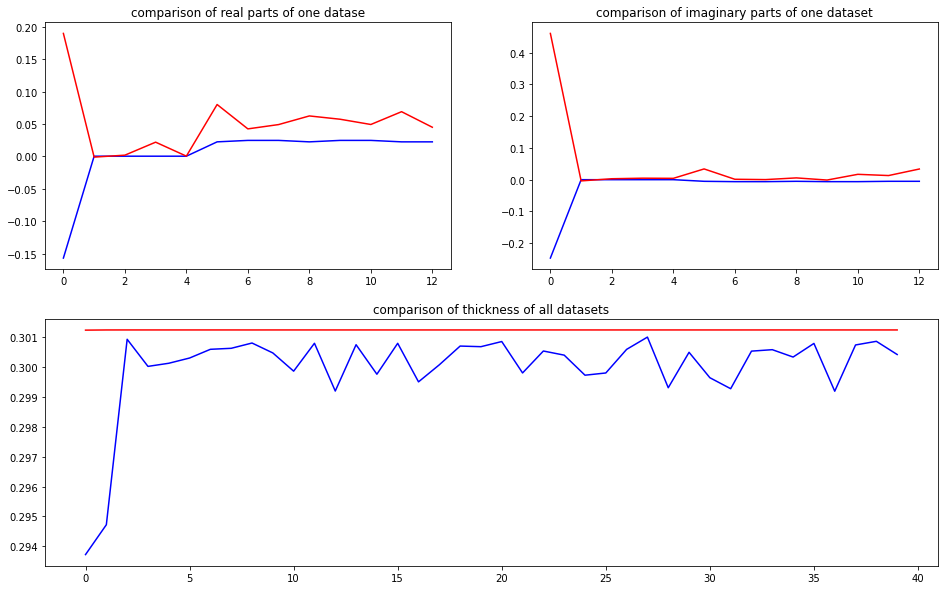

predicted thickness: 0.30002046


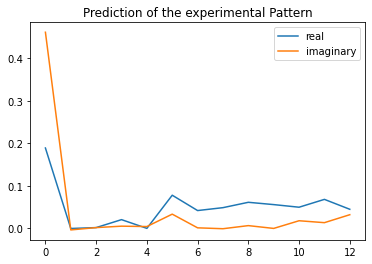

The offset applied on thickness: -0.0001204341790044976

The offset applied on Ug: -1.6252194453523416

Applied shift of unit cell origin (fractional coordinates): -0.0016859518415298402 0.014890225283275174
Ug[ 0 ]: 0.21524 3.14159  =>  0.21524 3.14159
Ug[ 1 ]: 0.00288 -1.24564  =>  0.00288 -1.15208
Ug[ 2 ]: 0.00288 1.24564  =>  0.00288 1.15208
Ug[ 3 ]: 0.01007 0.01059  =>  0.01007 0.0
Ug[ 4 ]: 0.01007 -0.01059  =>  0.01007 -0.0
Ug[ 5 ]: 0.06192 0.18712  =>  0.06192 0.0
Ug[ 6 ]: 0.04296 -0.17911  =>  0.04296 -0.28326
Ug[ 7 ]: 0.048 0.00227  =>  0.048 -0.0807
Ug[ 8 ]: 0.06192 -0.18712  =>  0.06192 0.0
Ug[ 9 ]: 0.048 -0.00227  =>  0.048 0.0807
Ug[ 10 ]: 0.04296 0.17911  =>  0.04296 0.28326
Ug[ 11 ]: 0.05133 -0.2025  =>  0.05133 -0.18132
Ug[ 12 ]: 0.05133 0.2025  =>  0.05133 0.18132
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

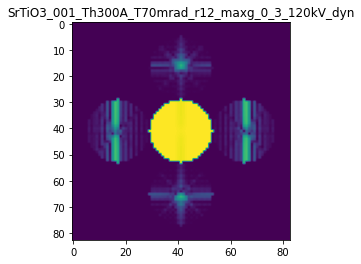

X_sim.max(): 0.9996129663579916
>>>replaced the 3. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 933ms/step - loss: 0.0286 - mean_absolute_error: 0.0479 - acc: 0.3300 - val_loss: 0.0234 - val_mean_absolute_error: 0.0448 - val_acc: 0.2250
Epoch 2/5
5/5 [==============================] - 2s 534ms/step - loss: 0.0286 - mean_absolute_error: 0.0476 - acc: 0.3300 - val_loss: 0.0231 - val_mean_absolute_error: 0.0434 - val_acc: 0.2250
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0286 - mean_absolute_error: 0.0473 - acc: 0.3300 - val_loss: 0.0230 - val_mean_absolute_error: 0.0424 - val_acc: 0.2250
Epoch 4/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0288 - mean_absolute_error: 0.0480 - acc: 0.3300 - val_loss: 0.0235 - val_mean_absolute_error: 0.0453 - val_acc: 0.2250
Epoch 5/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0286 - mean_absolute_error: 0.0488 - acc: 0.3300 - val_loss: 0.0229 - val_mean_absol

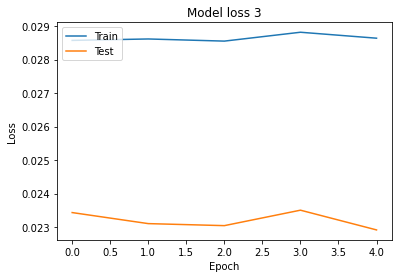

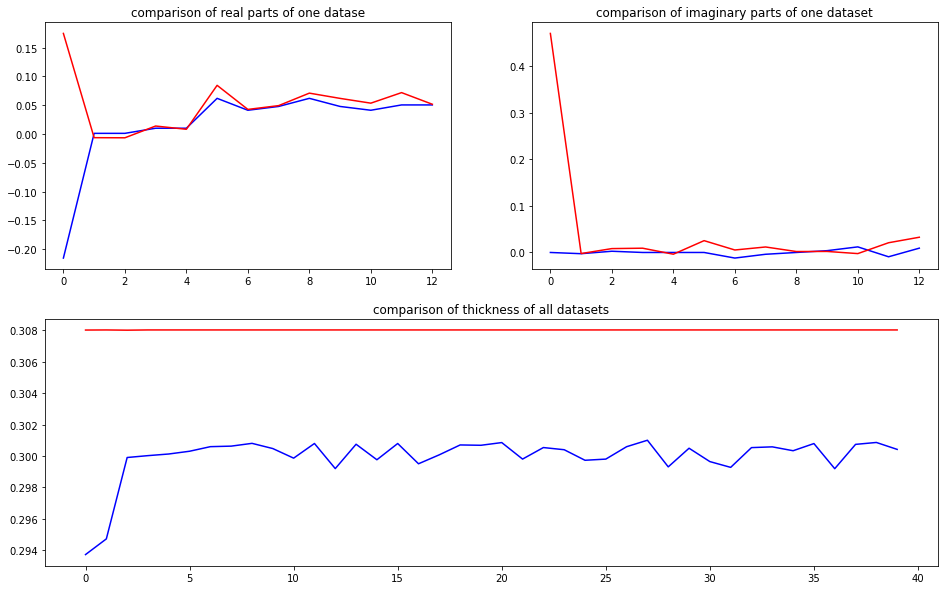

predicted thickness: 0.30682322


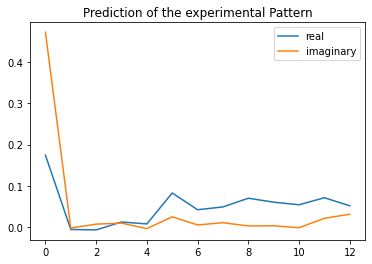

The offset applied on thickness: -0.0003637446054020486

The offset applied on Ug: 1.2245015932222045

Applied shift of unit cell origin (fractional coordinates): -0.09167375511407073 0.012308262601542401
Ug[ 0 ]: 0.48415 0.0  =>  0.48415 0.0
Ug[ 1 ]: 0.00761 -2.47367  =>  0.00761 -2.39634
Ug[ 2 ]: 0.00761 2.47367  =>  0.00761 2.39634
Ug[ 3 ]: 0.01242 0.576  =>  0.01242 -0.0
Ug[ 4 ]: 0.01242 -0.576  =>  0.01242 0.0
Ug[ 5 ]: 0.08499 0.15467  =>  0.08499 0.0
Ug[ 6 ]: 0.05121 0.04913  =>  0.05121 -0.60421
Ug[ 7 ]: 0.05869 0.04899  =>  0.05869 0.54766
Ug[ 8 ]: 0.08499 -0.15467  =>  0.08499 -0.0
Ug[ 9 ]: 0.05869 -0.04899  =>  0.05869 -0.54766
Ug[ 10 ]: 0.05121 -0.04913  =>  0.05121 0.60421
Ug[ 11 ]: 0.06724 -0.0521  =>  0.06724 1.0999
Ug[ 12 ]: 0.06724 0.0521  =>  0.06724 -1.0999
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

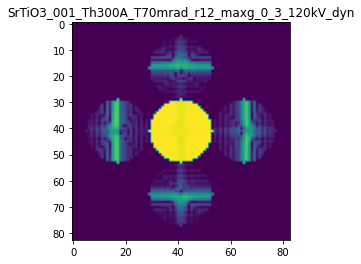

X_sim.max(): 0.9991636287713151
>>>replaced the 4. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 934ms/step - loss: 0.0287 - mean_absolute_error: 0.0480 - acc: 0.3300 - val_loss: 0.0222 - val_mean_absolute_error: 0.0404 - val_acc: 0.2000
Epoch 2/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0287 - mean_absolute_error: 0.0477 - acc: 0.3300 - val_loss: 0.0219 - val_mean_absolute_error: 0.0409 - val_acc: 0.2000
Epoch 3/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0286 - mean_absolute_error: 0.0490 - acc: 0.3300 - val_loss: 0.0225 - val_mean_absolute_error: 0.0432 - val_acc: 0.2000
Epoch 4/5
5/5 [==============================] - 3s 565ms/step - loss: 0.0285 - mean_absolute_error: 0.0479 - acc: 0.3300 - val_loss: 0.0220 - val_mean_absolute_error: 0.0427 - val_acc: 0.2000
Epoch 5/5
5/5 [==============================] - 3s 590ms/step - loss: 0.0286 - mean_absolute_error: 0.0475 - acc: 0.3300 - val_loss: 0.0223 - val_mean_absol

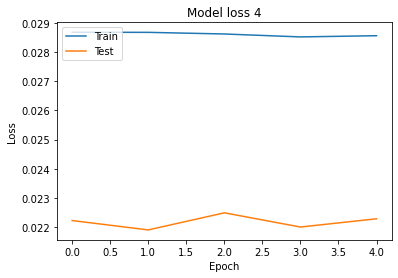

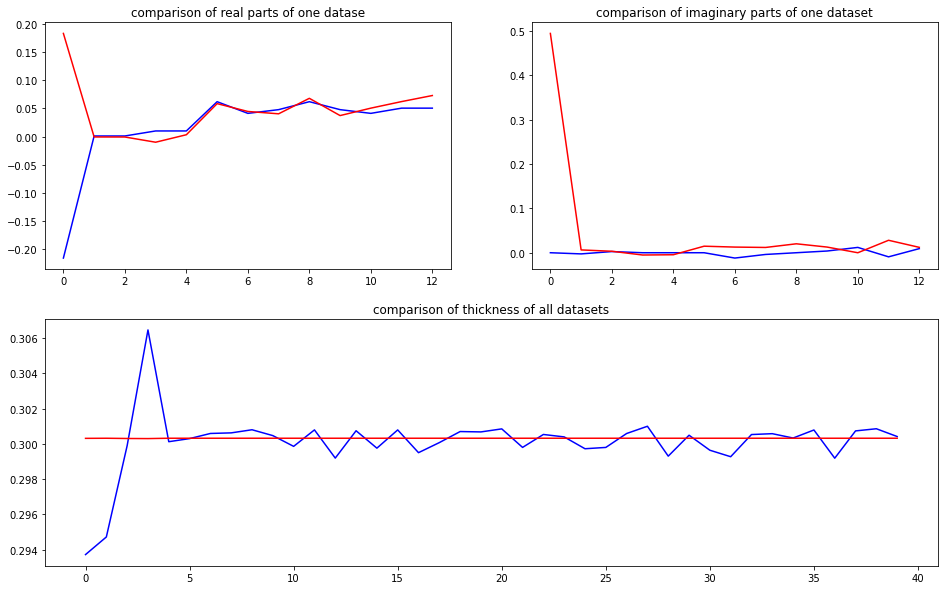

predicted thickness: 0.2991036


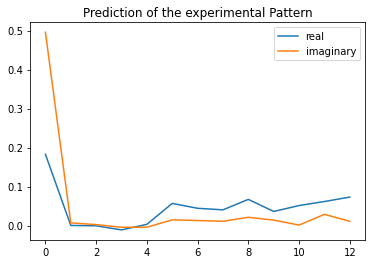

The offset applied on thickness: -0.0008467640819505336

The offset applied on Ug: 4.183373347272642

Applied shift of unit cell origin (fractional coordinates): -0.4956675633557758 -0.00930933652180458
Ug[ 0 ]: 1.3499 0.0  =>  1.3499 0.0
Ug[ 1 ]: 0.00225 1.64069  =>  0.00225 1.58219
Ug[ 2 ]: 0.00225 -1.64069  =>  0.00225 -1.58219
Ug[ 3 ]: 0.00376 3.11437  =>  0.00376 -0.0
Ug[ 4 ]: 0.00376 -3.11437  =>  0.00376 0.0
Ug[ 5 ]: 0.07988 -0.11698  =>  0.07988 0.0
Ug[ 6 ]: 0.05774 0.06941  =>  0.05774 -2.98646
Ug[ 7 ]: 0.04492 -0.01553  =>  0.04492 -3.12586
Ug[ 8 ]: 0.07988 0.11698  =>  0.07988 0.0
Ug[ 9 ]: 0.04492 0.01553  =>  0.04492 3.12586
Ug[ 10 ]: 0.05774 -0.06941  =>  0.05774 2.98646
Ug[ 11 ]: 0.0884 0.05608  =>  0.0884 0.00163
Ug[ 12 ]: 0.0884 -0.05608  =>  0.0884 -0.00163
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

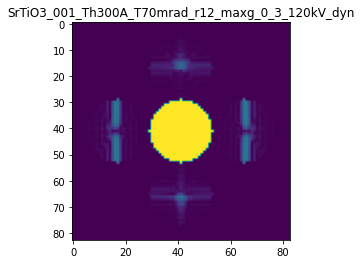

X_sim.max(): 0.9998997001174061
>>>replaced the 5. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 939ms/step - loss: 0.0289 - mean_absolute_error: 0.0469 - acc: 0.3300 - val_loss: 0.0230 - val_mean_absolute_error: 0.0420 - val_acc: 0.1750
Epoch 2/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0289 - mean_absolute_error: 0.0467 - acc: 0.3300 - val_loss: 0.0228 - val_mean_absolute_error: 0.0411 - val_acc: 0.1750
Epoch 3/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0289 - mean_absolute_error: 0.0467 - acc: 0.3300 - val_loss: 0.0227 - val_mean_absolute_error: 0.0418 - val_acc: 0.1750
Epoch 4/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0290 - mean_absolute_error: 0.0467 - acc: 0.3300 - val_loss: 0.0227 - val_mean_absolute_error: 0.0416 - val_acc: 0.1750
Epoch 5/5
5/5 [==============================] - 3s 607ms/step - loss: 0.0295 - mean_absolute_error: 0.0527 - acc: 0.3300 - val_loss: 0.0235 - val_mean_absol

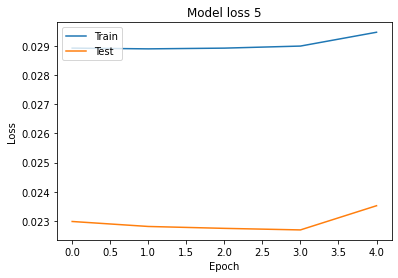

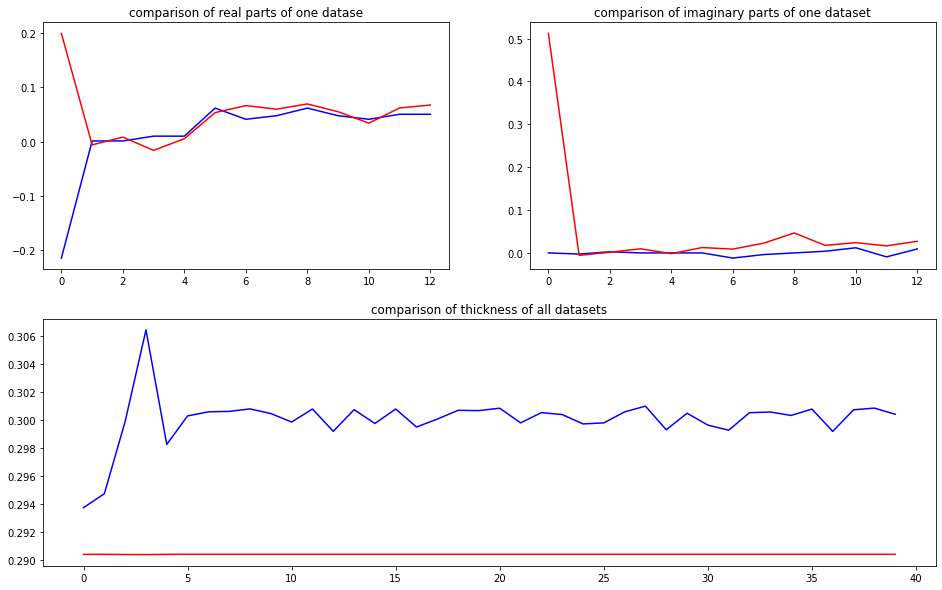

predicted thickness: 0.2891668


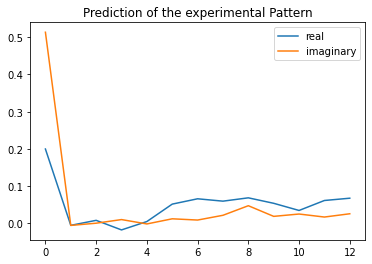

The offset applied on thickness: -0.0003859103508048747

The offset applied on Ug: 1.1063498841057475

Applied shift of unit cell origin (fractional coordinates): -0.3743203458893124 -0.02386437666502951
Ug[ 0 ]: 0.53543 0.0  =>  0.53543 0.0
Ug[ 1 ]: 0.00337 -1.08766  =>  0.00337 -1.2376
Ug[ 2 ]: 0.00337 1.08766  =>  0.00337 1.2376
Ug[ 3 ]: 0.00857 2.35192  =>  0.00857 0.0
Ug[ 4 ]: 0.00857 -2.35192  =>  0.00857 -0.0
Ug[ 5 ]: 0.06871 -0.29989  =>  0.06871 -0.0
Ug[ 6 ]: 0.05426 -0.11726  =>  0.05426 -2.31924
Ug[ 7 ]: 0.06092 0.03209  =>  0.06092 2.53396
Ug[ 8 ]: 0.06871 0.29989  =>  0.06871 0.0
Ug[ 9 ]: 0.06092 -0.03209  =>  0.06092 -2.53396
Ug[ 10 ]: 0.05426 0.11726  =>  0.05426 2.31924
Ug[ 11 ]: 0.06993 -0.07419  =>  0.06993 -1.65353
Ug[ 12 ]: 0.06993 0.07419  =>  0.06993 1.65353
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

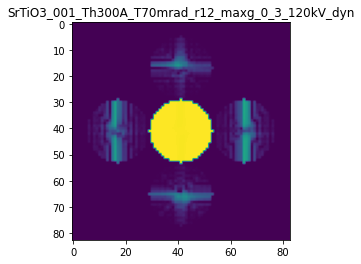

X_sim.max(): 0.9996794107820921
>>>replaced the 6. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 966ms/step - loss: 0.0292 - mean_absolute_error: 0.0520 - acc: 0.3300 - val_loss: 0.0231 - val_mean_absolute_error: 0.0475 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0292 - mean_absolute_error: 0.0511 - acc: 0.3300 - val_loss: 0.0241 - val_mean_absolute_error: 0.0473 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0292 - mean_absolute_error: 0.0512 - acc: 0.3300 - val_loss: 0.0230 - val_mean_absolute_error: 0.0454 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 3s 580ms/step - loss: 0.0290 - mean_absolute_error: 0.0492 - acc: 0.3300 - val_loss: 0.0234 - val_mean_absolute_error: 0.0456 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 3s 689ms/step - loss: 0.0290 - mean_absolute_error: 0.0493 - acc: 0.3300 - val_loss: 0.0233 - val_mean_absol

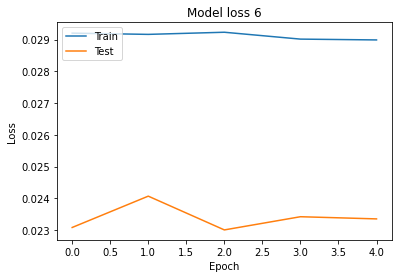

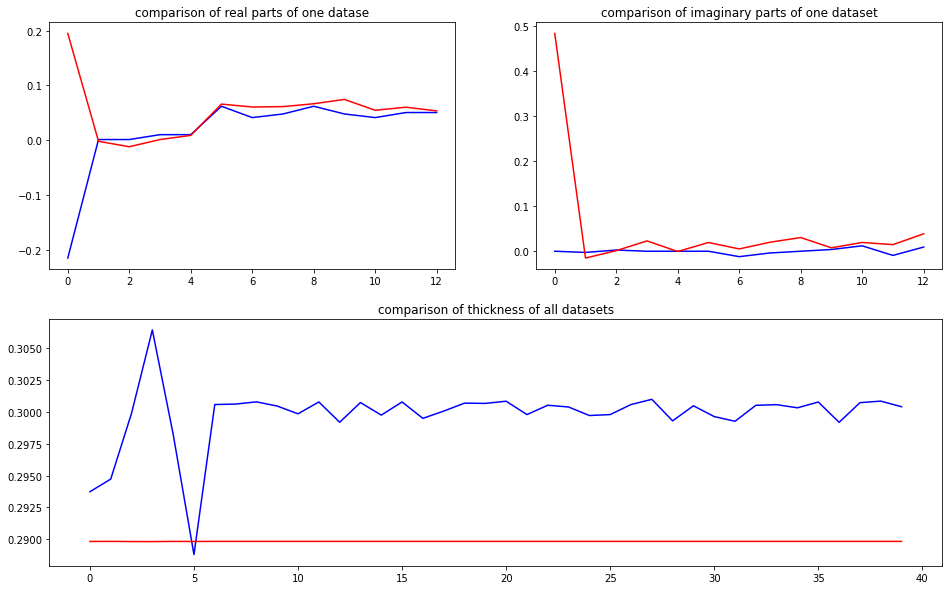

predicted thickness: 0.2886338


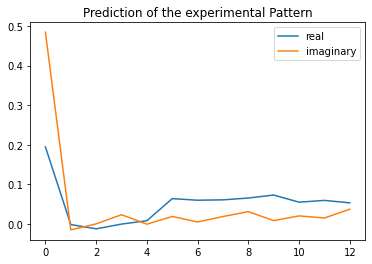

The offset applied on thickness: 0.0005244607991601597

The offset applied on Ug: -2.032982577904056

Applied shift of unit cell origin (fractional coordinates): -0.20276231915503767 -0.007878027601240775
Ug[ 0 ]: 0.35904 3.14159  =>  0.35904 3.14159
Ug[ 1 ]: 0.01041 -2.31246  =>  0.01041 -2.36196
Ug[ 2 ]: 0.01041 2.31246  =>  0.01041 2.36196
Ug[ 3 ]: 0.01197 1.27399  =>  0.01197 0.0
Ug[ 4 ]: 0.01197 -1.27399  =>  0.01197 0.0
Ug[ 5 ]: 0.05525 -0.099  =>  0.05525 0.0
Ug[ 6 ]: 0.05104 -0.15253  =>  0.05104 -1.37703
Ug[ 7 ]: 0.05778 0.10318  =>  0.05778 1.42667
Ug[ 8 ]: 0.05525 0.099  =>  0.05525 0.0
Ug[ 9 ]: 0.05778 -0.10318  =>  0.05778 -1.42667
Ug[ 10 ]: 0.05104 0.15253  =>  0.05104 1.37703
Ug[ 11 ]: 0.04957 -0.21547  =>  0.04957 2.33252
Ug[ 12 ]: 0.04957 0.21547  =>  0.04957 -2.33252
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

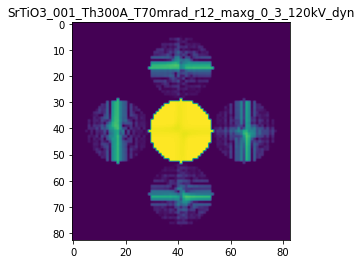

X_sim.max(): 0.9993728066501523
>>>replaced the 7. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 942ms/step - loss: 0.0291 - mean_absolute_error: 0.0490 - acc: 0.3300 - val_loss: 0.0239 - val_mean_absolute_error: 0.0463 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0291 - mean_absolute_error: 0.0483 - acc: 0.3300 - val_loss: 0.0238 - val_mean_absolute_error: 0.0450 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0292 - mean_absolute_error: 0.0485 - acc: 0.3300 - val_loss: 0.0240 - val_mean_absolute_error: 0.0460 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0291 - mean_absolute_error: 0.0489 - acc: 0.3300 - val_loss: 0.0236 - val_mean_absolute_error: 0.0448 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 3s 745ms/step - loss: 0.0291 - mean_absolute_error: 0.0479 - acc: 0.3300 - val_loss: 0.0240 - val_mean_absol

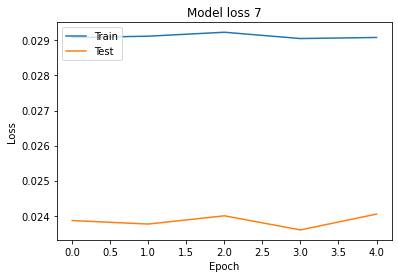

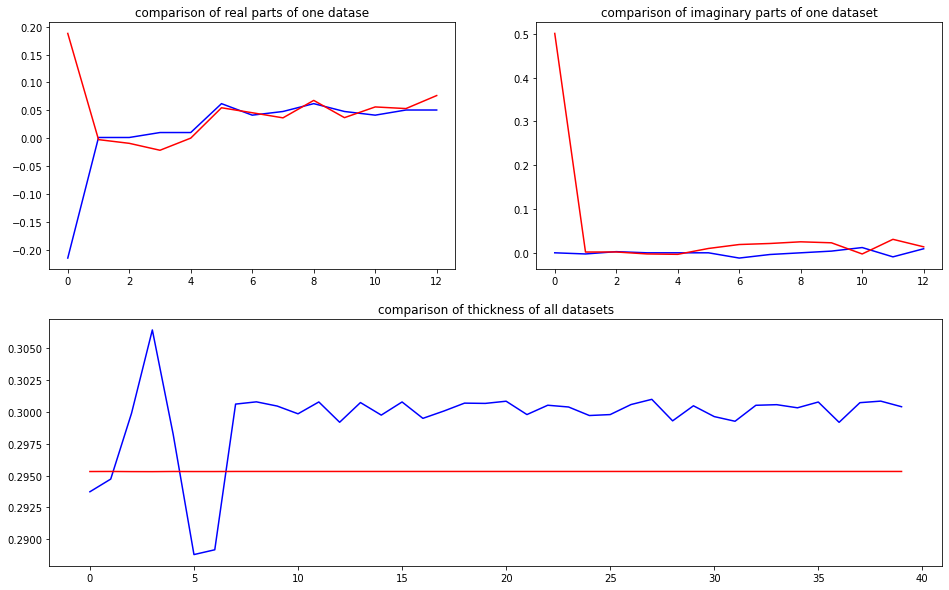

predicted thickness: 0.2941405


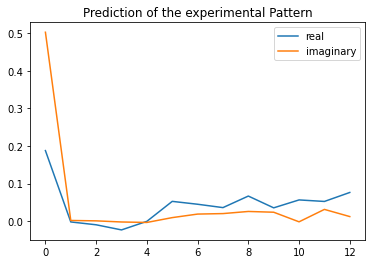

The offset applied on thickness: -0.0008137684485283441

The offset applied on Ug: 2.690491742967748

Applied shift of unit cell origin (fractional coordinates): -0.4818622630396063 -0.014269182884305964
Ug[ 0 ]: 0.96157 0.0  =>  0.96157 0.0
Ug[ 1 ]: 0.00552 3.06679  =>  0.00552 2.97714
Ug[ 2 ]: 0.00552 -3.06679  =>  0.00552 -2.97714
Ug[ 3 ]: 0.01099 3.02763  =>  0.01099 0.0
Ug[ 4 ]: 0.01099 -3.02763  =>  0.01099 -0.0
Ug[ 5 ]: 0.07185 -0.17931  =>  0.07185 -0.0
Ug[ 6 ]: 0.0591 0.14636  =>  0.0591 -2.79161
Ug[ 7 ]: 0.04078 -0.04897  =>  0.04078 3.06831
Ug[ 8 ]: 0.07185 0.17931  =>  0.07185 0.0
Ug[ 9 ]: 0.04078 0.04897  =>  0.04078 -3.06831
Ug[ 10 ]: 0.0591 -0.14636  =>  0.0591 2.79161
Ug[ 11 ]: 0.07781 0.05668  =>  0.07781 -0.17125
Ug[ 12 ]: 0.07781 -0.05668  =>  0.07781 0.17125
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

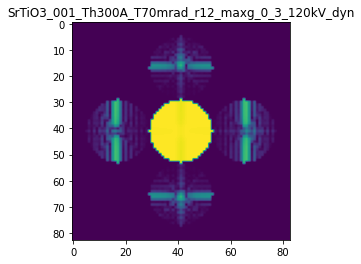

X_sim.max(): 0.9994710058309603
>>>replaced the 8. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 939ms/step - loss: 0.0295 - mean_absolute_error: 0.0492 - acc: 0.3200 - val_loss: 0.0239 - val_mean_absolute_error: 0.0454 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0295 - mean_absolute_error: 0.0486 - acc: 0.3200 - val_loss: 0.0243 - val_mean_absolute_error: 0.0449 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0296 - mean_absolute_error: 0.0486 - acc: 0.3200 - val_loss: 0.0240 - val_mean_absolute_error: 0.0451 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 3s 575ms/step - loss: 0.0295 - mean_absolute_error: 0.0501 - acc: 0.3200 - val_loss: 0.0245 - val_mean_absolute_error: 0.0471 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 3s 753ms/step - loss: 0.0296 - mean_absolute_error: 0.0498 - acc: 0.3200 - val_loss: 0.0237 - val_mean_absol

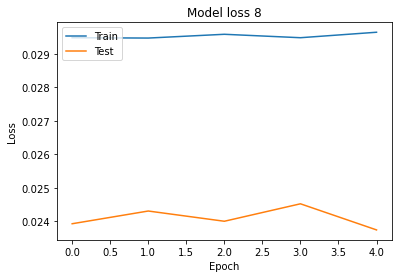

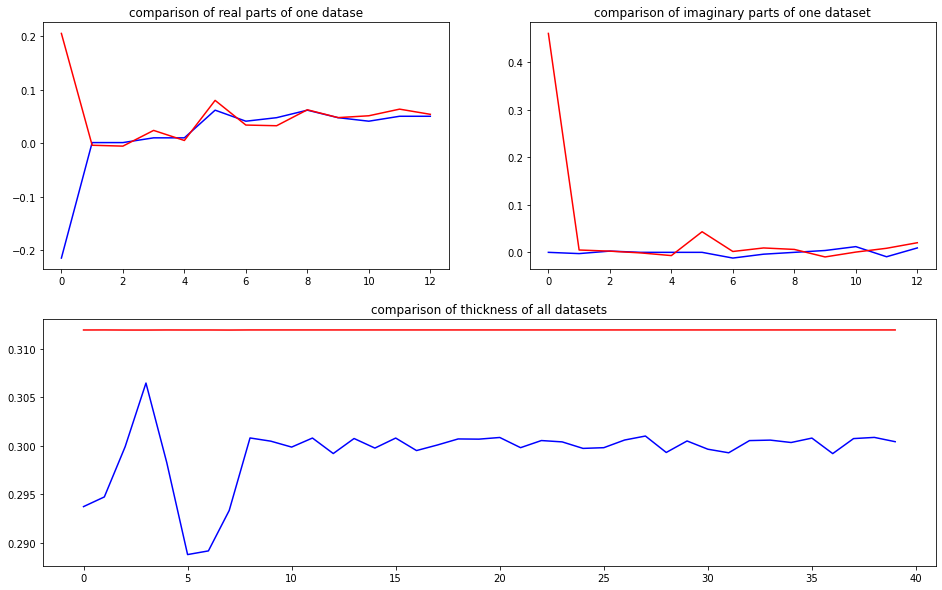

predicted thickness: 0.31080678


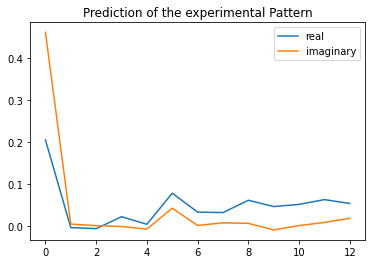

The offset applied on thickness: 0.00029682576008860774

The offset applied on Ug: 1.730200154433109

Applied shift of unit cell origin (fractional coordinates): -0.03743686877619663 0.02200978709116219
Ug[ 0 ]: 0.64646 0.0  =>  0.64646 0.0
Ug[ 1 ]: 0.00459 2.75105  =>  0.00459 2.88934
Ug[ 2 ]: 0.00459 -2.75105  =>  0.00459 -2.88934
Ug[ 3 ]: 0.0147 0.23522  =>  0.0147 -0.0
Ug[ 4 ]: 0.0147 -0.23522  =>  0.0147 0.0
Ug[ 5 ]: 0.08377 0.27658  =>  0.08377 0.0
Ug[ 6 ]: 0.04621 -0.03333  =>  0.04621 -0.40684
Ug[ 7 ]: 0.04332 0.16836  =>  0.04332 0.26529
Ug[ 8 ]: 0.08377 -0.27658  =>  0.08377 -0.0
Ug[ 9 ]: 0.04332 -0.16836  =>  0.04332 -0.26529
Ug[ 10 ]: 0.04621 0.03333  =>  0.04621 0.40684
Ug[ 11 ]: 0.06534 -0.06084  =>  0.06534 0.40961
Ug[ 12 ]: 0.06534 0.06084  =>  0.06534 -0.40961
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

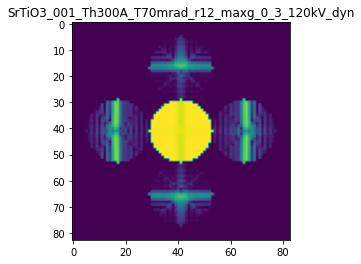

X_sim.max(): 0.9989080705781548
>>>replaced the 9. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 946ms/step - loss: 0.0295 - mean_absolute_error: 0.0503 - acc: 0.3200 - val_loss: 0.0246 - val_mean_absolute_error: 0.0478 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0295 - mean_absolute_error: 0.0502 - acc: 0.3200 - val_loss: 0.0241 - val_mean_absolute_error: 0.0471 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0295 - mean_absolute_error: 0.0494 - acc: 0.3200 - val_loss: 0.0244 - val_mean_absolute_error: 0.0470 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 3s 673ms/step - loss: 0.0298 - mean_absolute_error: 0.0518 - acc: 0.3200 - val_loss: 0.0246 - val_mean_absolute_error: 0.0479 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0295 - mean_absolute_error: 0.0505 - acc: 0.3200 - val_loss: 0.0243 - val_mean_absol

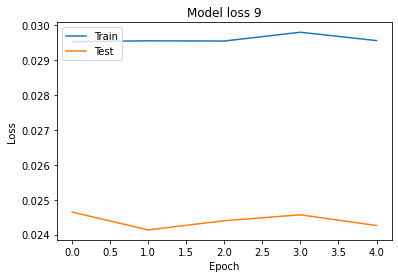

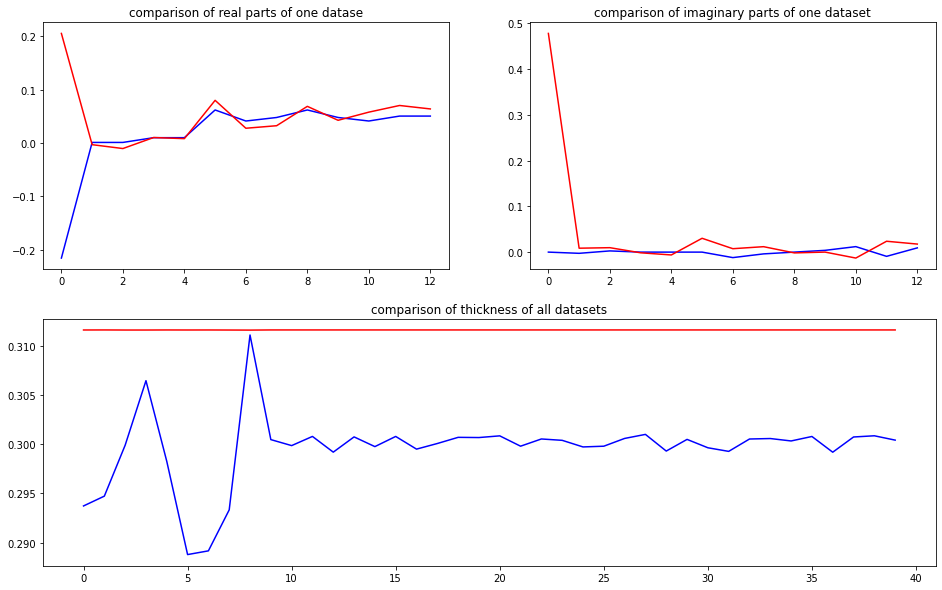

predicted thickness: 0.31049353


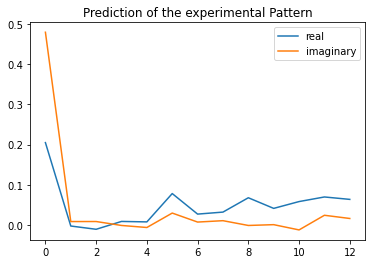

The offset applied on thickness: -0.0003303947720408751

The offset applied on Ug: -0.8232732264534626

Applied shift of unit cell origin (fractional coordinates): -0.046197883827186634 0.016700108406494673
Ug[ 0 ]: 0.0187 3.14159  =>  0.0187 3.14159
Ug[ 1 ]: 0.00644 -3.1411  =>  0.00644 -3.03617
Ug[ 2 ]: 0.00644 3.1411  =>  0.00644 3.03617
Ug[ 3 ]: 0.00884 0.29027  =>  0.00884 -0.0
Ug[ 4 ]: 0.00884 -0.29027  =>  0.00884 0.0
Ug[ 5 ]: 0.06991 0.20986  =>  0.06991 0.0
Ug[ 6 ]: 0.04251 0.25624  =>  0.04251 -0.13896
Ug[ 7 ]: 0.03612 0.14306  =>  0.03612 0.3284
Ug[ 8 ]: 0.06991 -0.20986  =>  0.06991 0.0
Ug[ 9 ]: 0.03612 -0.14306  =>  0.03612 -0.3284
Ug[ 10 ]: 0.04251 -0.25624  =>  0.04251 0.13896
Ug[ 11 ]: 0.06297 0.05702  =>  0.06297 0.63756
Ug[ 12 ]: 0.06297 -0.05702  =>  0.06297 -0.63756
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

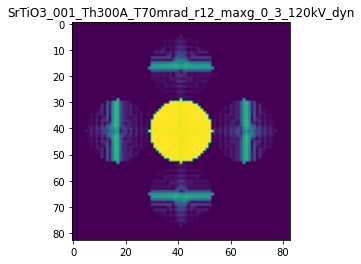

X_sim.max(): 0.9993851357036454
>>>replaced the 10. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 1s/step - loss: 0.0289 - mean_absolute_error: 0.0488 - acc: 0.3100 - val_loss: 0.0243 - val_mean_absolute_error: 0.0455 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0288 - mean_absolute_error: 0.0481 - acc: 0.3100 - val_loss: 0.0242 - val_mean_absolute_error: 0.0458 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0289 - mean_absolute_error: 0.0476 - acc: 0.3100 - val_loss: 0.0241 - val_mean_absolute_error: 0.0448 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 3s 728ms/step - loss: 0.0290 - mean_absolute_error: 0.0486 - acc: 0.3100 - val_loss: 0.0241 - val_mean_absolute_error: 0.0463 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 3s 540ms/step - loss: 0.0289 - mean_absolute_error: 0.0485 - acc: 0.3100 - val_loss: 0.0241 - val_mean_absolut

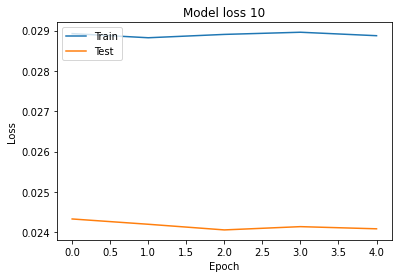

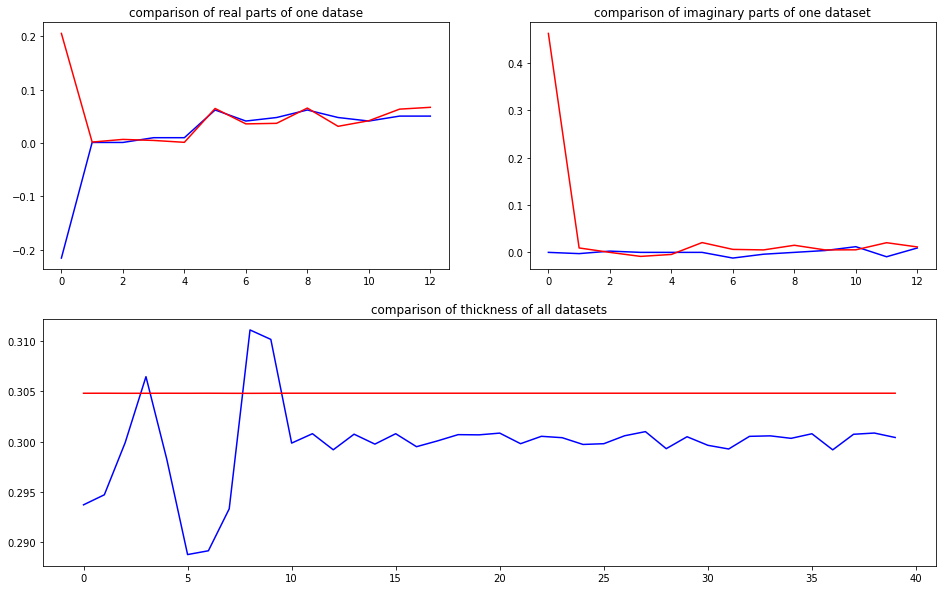

predicted thickness: 0.30371654


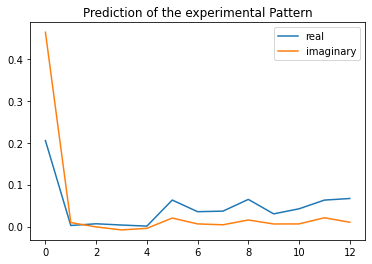

The offset applied on thickness: -0.00048166954756097405

The offset applied on Ug: 0.4021200634054671

Applied shift of unit cell origin (fractional coordinates): 0.10400757113579875 0.0027748157695395245
Ug[ 0 ]: 0.30827 0.0  =>  0.30827 0.0
Ug[ 1 ]: 0.007 0.83156  =>  0.007 0.849
Ug[ 2 ]: 0.007 -0.83156  =>  0.007 -0.849
Ug[ 3 ]: 0.00309 -0.6535  =>  0.00309 0.0
Ug[ 4 ]: 0.00309 0.6535  =>  0.00309 0.0
Ug[ 5 ]: 0.06587 0.03487  =>  0.06587 -0.0
Ug[ 6 ]: 0.03962 -0.0028  =>  0.03962 0.63326
Ug[ 7 ]: 0.03406 -0.02518  =>  0.03406 -0.69611
Ug[ 8 ]: 0.06587 -0.03487  =>  0.06587 0.0
Ug[ 9 ]: 0.03406 0.02518  =>  0.03406 0.69611
Ug[ 10 ]: 0.03962 0.0028  =>  0.03962 -0.63326
Ug[ 11 ]: 0.06709 0.07914  =>  0.06709 -1.22786
Ug[ 12 ]: 0.06709 -0.07914  =>  0.06709 1.22786
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad

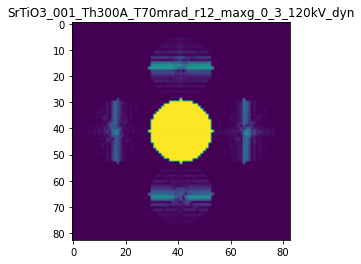

X_sim.max(): 0.9997386463891059
>>>replaced the 11. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 939ms/step - loss: 0.0289 - mean_absolute_error: 0.0482 - acc: 0.3100 - val_loss: 0.0205 - val_mean_absolute_error: 0.0458 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0288 - mean_absolute_error: 0.0488 - acc: 0.3100 - val_loss: 0.0199 - val_mean_absolute_error: 0.0440 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0289 - mean_absolute_error: 0.0485 - acc: 0.3100 - val_loss: 0.0202 - val_mean_absolute_error: 0.0427 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 3s 617ms/step - loss: 0.0289 - mean_absolute_error: 0.0483 - acc: 0.3100 - val_loss: 0.0199 - val_mean_absolute_error: 0.0421 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 3s 643ms/step - loss: 0.0288 - mean_absolute_error: 0.0479 - acc: 0.3100 - val_loss: 0.0202 - val_mean_abso

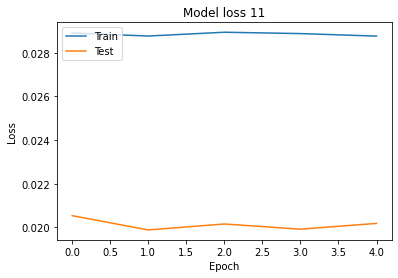

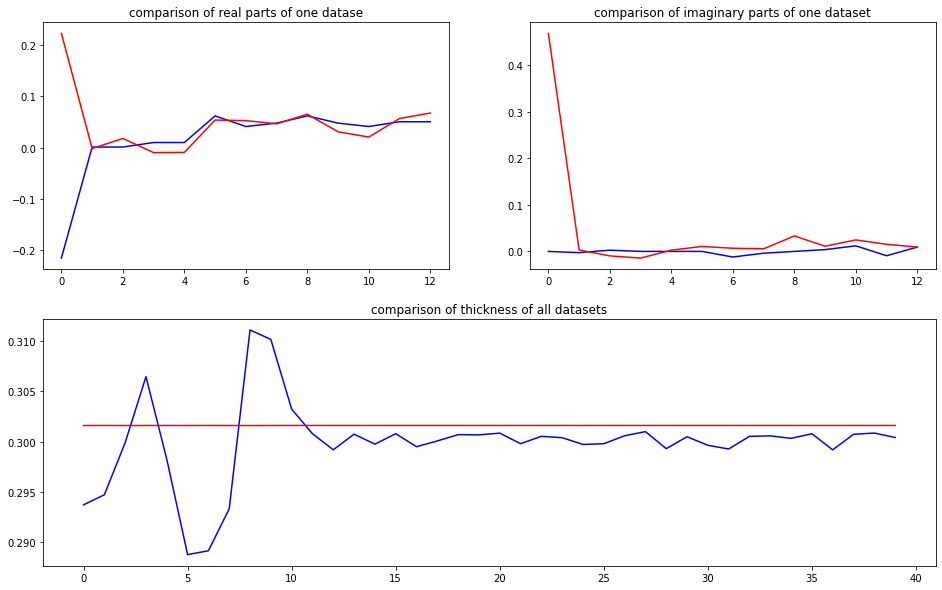

predicted thickness: 0.3005383


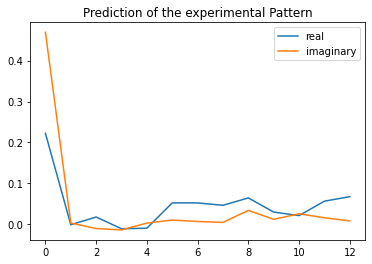

The offset applied on thickness: -3.401045849432061e-05

The offset applied on Ug: -3.6739376871244187

Applied shift of unit cell origin (fractional coordinates): 0.3922689188989797 -0.016983732840050333
Ug[ 0 ]: 0.76861 3.14159  =>  0.76861 3.14159
Ug[ 1 ]: 0.01063 0.7758  =>  0.01063 0.66908
Ug[ 2 ]: 0.01063 -0.7758  =>  0.01063 -0.66908
Ug[ 3 ]: 0.01397 -2.4647  =>  0.01397 -0.0
Ug[ 4 ]: 0.01397 2.4647  =>  0.01397 0.0
Ug[ 5 ]: 0.04443 -0.21342  =>  0.04443 0.0
Ug[ 6 ]: 0.03162 -0.35549  =>  0.03162 2.21592
Ug[ 7 ]: 0.03264 -0.15281  =>  0.03264 -2.5108
Ug[ 8 ]: 0.04443 0.21342  =>  0.04443 0.0
Ug[ 9 ]: 0.03264 0.15281  =>  0.03264 2.5108
Ug[ 10 ]: 0.03162 0.35549  =>  0.03162 -2.21592
Ug[ 11 ]: 0.04742 0.09793  =>  0.04742 1.45171
Ug[ 12 ]: 0.04742 -0.09793  =>  0.04742 -1.45171
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

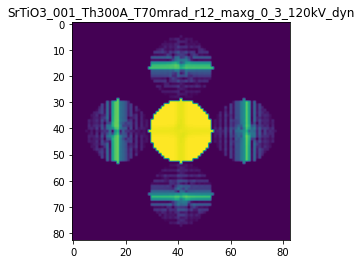

X_sim.max(): 0.999436447391645
>>>replaced the 12. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 933ms/step - loss: 0.0290 - mean_absolute_error: 0.0493 - acc: 0.3100 - val_loss: 0.0209 - val_mean_absolute_error: 0.0463 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0290 - mean_absolute_error: 0.0488 - acc: 0.3100 - val_loss: 0.0209 - val_mean_absolute_error: 0.0436 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0291 - mean_absolute_error: 0.0483 - acc: 0.3100 - val_loss: 0.0211 - val_mean_absolute_error: 0.0444 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 3s 756ms/step - loss: 0.0290 - mean_absolute_error: 0.0482 - acc: 0.3100 - val_loss: 0.0209 - val_mean_absolute_error: 0.0438 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0290 - mean_absolute_error: 0.0474 - acc: 0.3100 - val_loss: 0.0206 - val_mean_absol

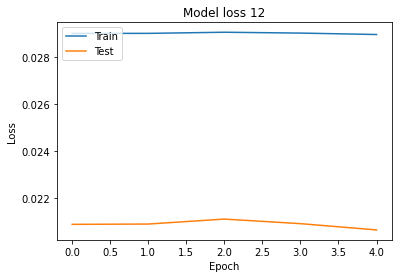

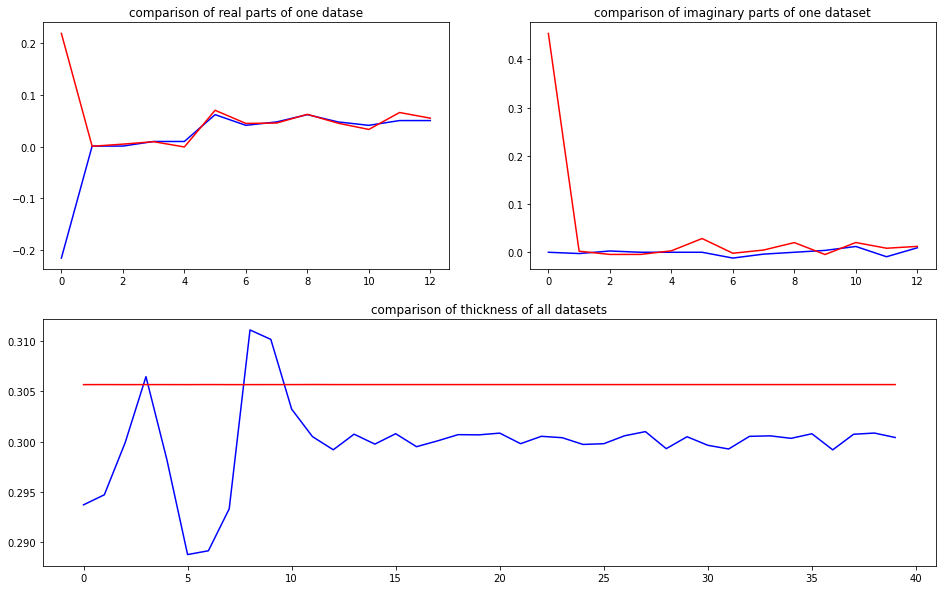

predicted thickness: 0.30461618


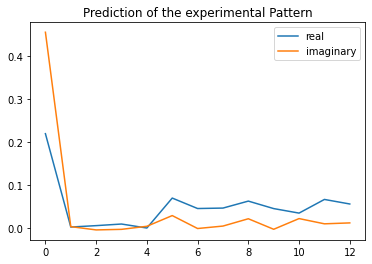

The offset applied on thickness: 0.0008430958689432871

The offset applied on Ug: 0.9317851680176323

Applied shift of unit cell origin (fractional coordinates): 0.11701875518394679 0.0049960864175120434
Ug[ 0 ]: 0.45586 0.0  =>  0.45586 0.0
Ug[ 1 ]: 0.00495 0.87567  =>  0.00495 0.90706
Ug[ 2 ]: 0.00495 -0.87567  =>  0.00495 -0.90706
Ug[ 3 ]: 0.00526 -0.73525  =>  0.00526 -0.0
Ug[ 4 ]: 0.00526 0.73525  =>  0.00526 0.0
Ug[ 5 ]: 0.07008 0.06278  =>  0.07008 0.0
Ug[ 6 ]: 0.04247 -0.27039  =>  0.04247 0.43347
Ug[ 7 ]: 0.04708 0.08071  =>  0.04708 -0.68594
Ug[ 8 ]: 0.07008 -0.06278  =>  0.07008 -0.0
Ug[ 9 ]: 0.04708 -0.08071  =>  0.04708 0.68594
Ug[ 10 ]: 0.04247 0.27039  =>  0.04247 -0.43347
Ug[ 11 ]: 0.06394 -0.00609  =>  0.06394 -1.47659
Ug[ 12 ]: 0.06394 0.00609  =>  0.06394 1.47659
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

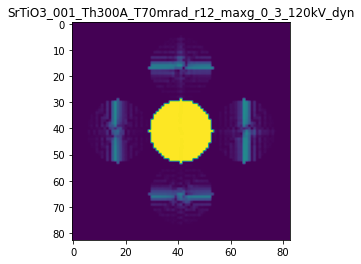

X_sim.max(): 0.9998670699911193
>>>replaced the 13. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 931ms/step - loss: 0.0288 - mean_absolute_error: 0.0477 - acc: 0.3000 - val_loss: 0.0210 - val_mean_absolute_error: 0.0449 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0288 - mean_absolute_error: 0.0485 - acc: 0.3000 - val_loss: 0.0209 - val_mean_absolute_error: 0.0452 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0289 - mean_absolute_error: 0.0478 - acc: 0.3000 - val_loss: 0.0205 - val_mean_absolute_error: 0.0439 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 4s 780ms/step - loss: 0.0287 - mean_absolute_error: 0.0477 - acc: 0.3000 - val_loss: 0.0207 - val_mean_absolute_error: 0.0451 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0288 - mean_absolute_error: 0.0481 - acc: 0.3000 - val_loss: 0.0207 - val_mean_abso

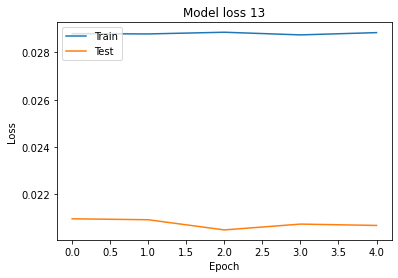

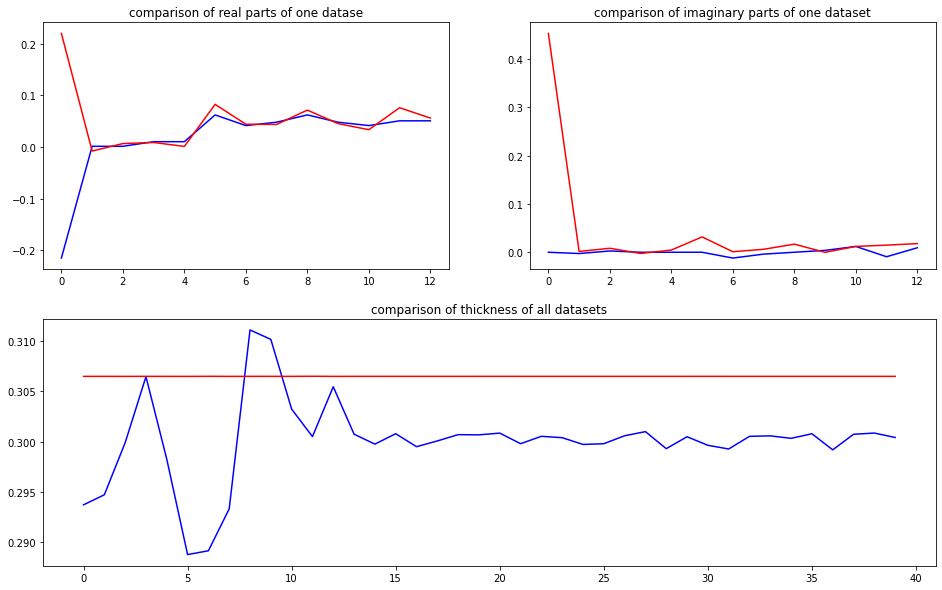

predicted thickness: 0.3054529


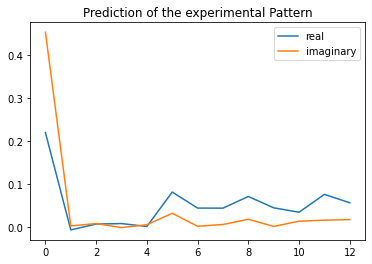

The offset applied on thickness: 0.0005999638044748728

The offset applied on Ug: 0.025617342636266603

Applied shift of unit cell origin (fractional coordinates): 0.10964119257000822 0.007317096172346696
Ug[ 0 ]: 0.22602 0.0  =>  0.22602 0.0
Ug[ 1 ]: 0.00286 -1.75458  =>  0.00286 -1.70861
Ug[ 2 ]: 0.00286 1.75458  =>  0.00286 1.70861
Ug[ 3 ]: 0.00526 -0.6889  =>  0.00526 0.0
Ug[ 4 ]: 0.00526 0.6889  =>  0.00526 0.0
Ug[ 5 ]: 0.07627 0.09195  =>  0.07627 0.0
Ug[ 6 ]: 0.03919 -0.1514  =>  0.03919 0.49152
Ug[ 7 ]: 0.0439 0.05171  =>  0.0439 -0.68316
Ug[ 8 ]: 0.07627 -0.09195  =>  0.07627 0.0
Ug[ 9 ]: 0.0439 -0.05171  =>  0.0439 0.68316
Ug[ 10 ]: 0.03919 0.1514  =>  0.03919 -0.49152
Ug[ 11 ]: 0.06586 -0.01074  =>  0.06586 -1.38853
Ug[ 12 ]: 0.06586 0.01074  =>  0.06586 1.38853
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

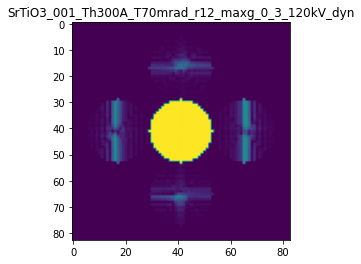

X_sim.max(): 0.9998247835175236
>>>replaced the 14. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 953ms/step - loss: 0.0289 - mean_absolute_error: 0.0482 - acc: 0.3000 - val_loss: 0.0208 - val_mean_absolute_error: 0.0445 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0288 - mean_absolute_error: 0.0476 - acc: 0.3000 - val_loss: 0.0205 - val_mean_absolute_error: 0.0438 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 621ms/step - loss: 0.0289 - mean_absolute_error: 0.0478 - acc: 0.3000 - val_loss: 0.0207 - val_mean_absolute_error: 0.0452 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 4s 898ms/step - loss: 0.0288 - mean_absolute_error: 0.0492 - acc: 0.3000 - val_loss: 0.0209 - val_mean_absolute_error: 0.0462 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 4s 685ms/step - loss: 0.0289 - mean_absolute_error: 0.0493 - acc: 0.3000 - val_loss: 0.0208 - val_mean_abso

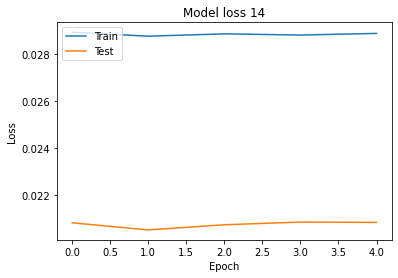

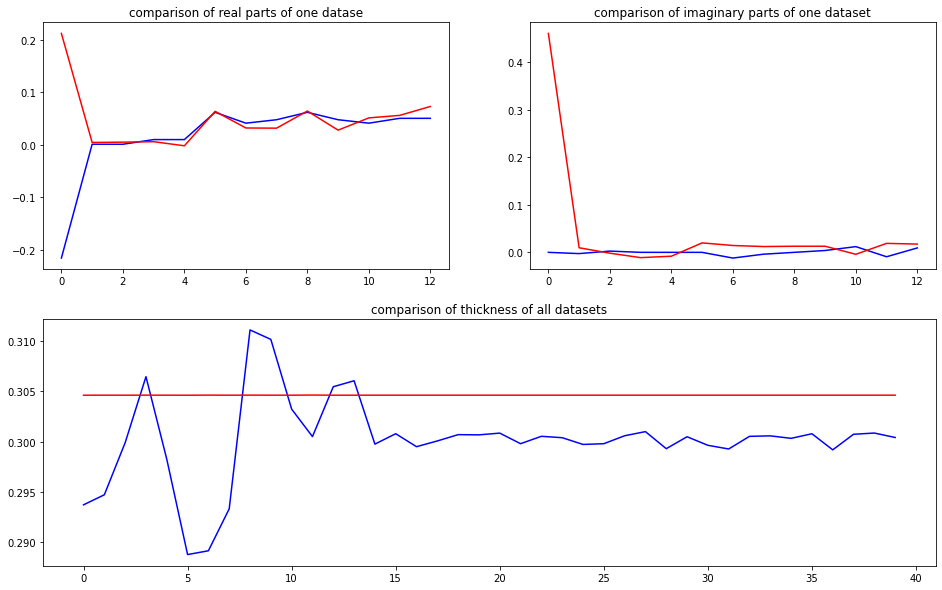

predicted thickness: 0.30357456


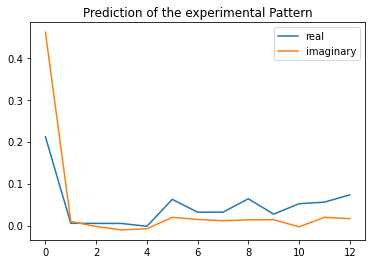

The offset applied on thickness: 0.00015271767277847426

The offset applied on Ug: 1.53426588742633

Applied shift of unit cell origin (fractional coordinates): 0.10641246190432363 0.003432903784297429
Ug[ 0 ]: 0.6065 0.0  =>  0.6065 0.0
Ug[ 1 ]: 0.00811 0.86261  =>  0.00811 0.88418
Ug[ 2 ]: 0.00811 -0.86261  =>  0.00811 -0.88418
Ug[ 3 ]: 0.00209 -0.66861  =>  0.00209 0.0
Ug[ 4 ]: 0.00209 0.66861  =>  0.00209 0.0
Ug[ 5 ]: 0.06968 0.04314  =>  0.06968 0.0
Ug[ 6 ]: 0.04546 0.1639  =>  0.04546 0.81094
Ug[ 7 ]: 0.03101 -0.03362  =>  0.03101 -0.7238
Ug[ 8 ]: 0.06968 -0.04314  =>  0.06968 0.0
Ug[ 9 ]: 0.03101 0.03362  =>  0.03101 0.7238
Ug[ 10 ]: 0.04546 -0.1639  =>  0.04546 -0.81094
Ug[ 11 ]: 0.07141 -0.00791  =>  0.07141 -1.34513
Ug[ 12 ]: 0.07141 0.00791  =>  0.07141 1.34513
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

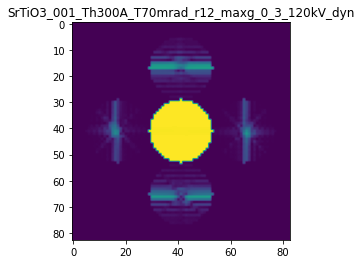

X_sim.max(): 0.999755319024308
>>>replaced the 15. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 941ms/step - loss: 0.0289 - mean_absolute_error: 0.0482 - acc: 0.3000 - val_loss: 0.0203 - val_mean_absolute_error: 0.0433 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0289 - mean_absolute_error: 0.0484 - acc: 0.3000 - val_loss: 0.0204 - val_mean_absolute_error: 0.0441 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 637ms/step - loss: 0.0288 - mean_absolute_error: 0.0477 - acc: 0.3000 - val_loss: 0.0205 - val_mean_absolute_error: 0.0441 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 705s 176s/step - loss: 0.0289 - mean_absolute_error: 0.0500 - acc: 0.3000 - val_loss: 0.0209 - val_mean_absolute_error: 0.0458 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 3s 746ms/step - loss: 0.0288 - mean_absolute_error: 0.0489 - acc: 0.3000 - val_loss: 0.0207 - val_mean_abso

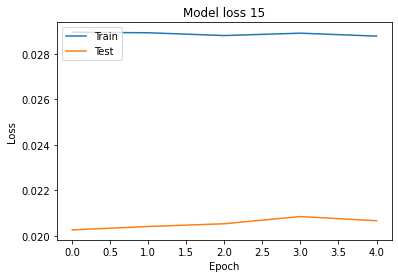

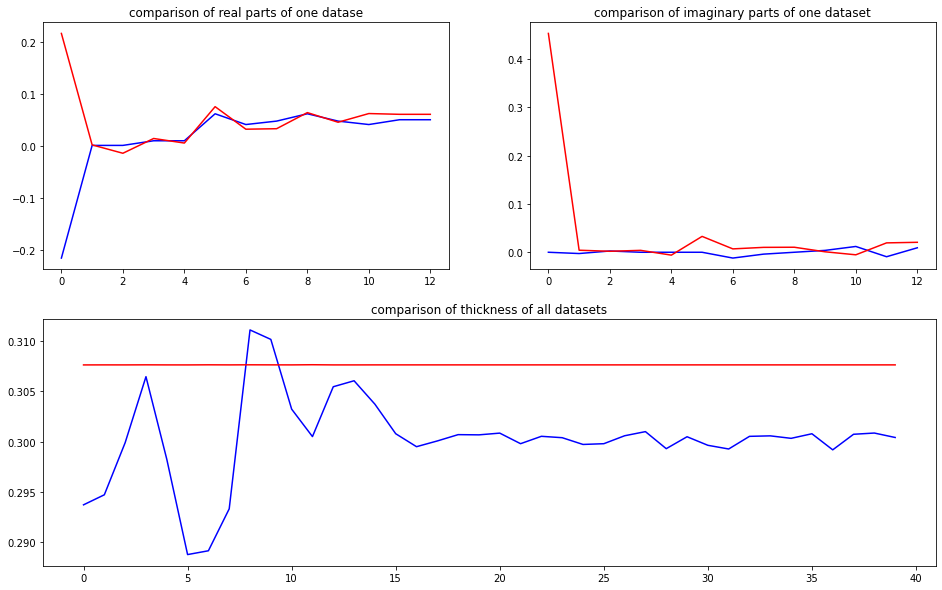

predicted thickness: 0.30659735


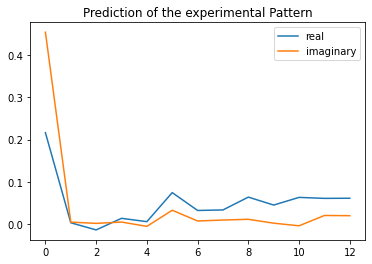

The offset applied on thickness: 0.0005322140552240249

The offset applied on Ug: 0.5669351810855671

Applied shift of unit cell origin (fractional coordinates): -0.0791392035354756 0.012582672128991569
Ug[ 0 ]: 0.35942 0.0  =>  0.35942 0.0
Ug[ 1 ]: 0.00575 2.88668  =>  0.00575 2.96574
Ug[ 2 ]: 0.00575 -2.88668  =>  0.00575 -2.96574
Ug[ 3 ]: 0.01079 0.49725  =>  0.01079 0.0
Ug[ 4 ]: 0.01079 -0.49725  =>  0.01079 -0.0
Ug[ 5 ]: 0.07286 0.15812  =>  0.07286 -0.0
Ug[ 6 ]: 0.04911 0.09802  =>  0.04911 -0.47828
Ug[ 7 ]: 0.04005 0.08681  =>  0.04005 0.505
Ug[ 8 ]: 0.07286 -0.15812  =>  0.07286 0.0
Ug[ 9 ]: 0.04005 -0.08681  =>  0.04005 -0.505
Ug[ 10 ]: 0.04911 -0.09802  =>  0.04911 0.47828
Ug[ 11 ]: 0.06309 0.00408  =>  0.06309 0.99857
Ug[ 12 ]: 0.06309 -0.00408  =>  0.06309 -0.99857
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

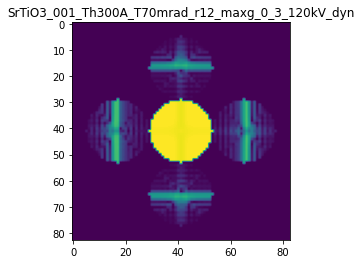

X_sim.max(): 0.9993280206033377
>>>replaced the 16. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 1s/step - loss: 0.0289 - mean_absolute_error: 0.0489 - acc: 0.3000 - val_loss: 0.0211 - val_mean_absolute_error: 0.0453 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0290 - mean_absolute_error: 0.0488 - acc: 0.3000 - val_loss: 0.0203 - val_mean_absolute_error: 0.0445 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 641ms/step - loss: 0.0292 - mean_absolute_error: 0.0510 - acc: 0.3000 - val_loss: 0.0214 - val_mean_absolute_error: 0.0484 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 3s 638ms/step - loss: 0.0291 - mean_absolute_error: 0.0497 - acc: 0.3000 - val_loss: 0.0205 - val_mean_absolute_error: 0.0460 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 3s 655ms/step - loss: 0.0289 - mean_absolute_error: 0.0498 - acc: 0.3000 - val_loss: 0.0210 - val_mean_absolut

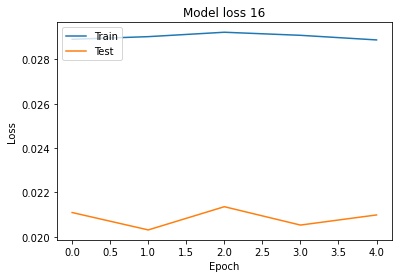

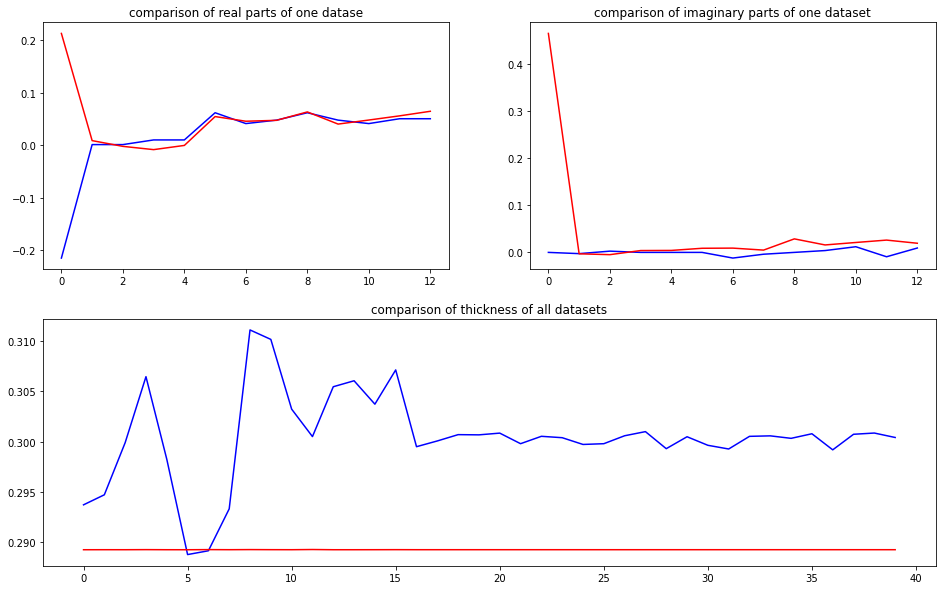

predicted thickness: 0.28821415


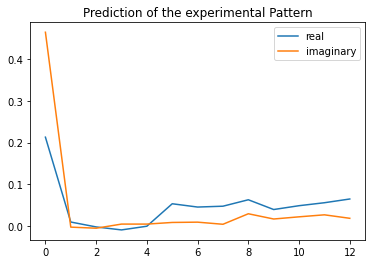

The offset applied on thickness: -0.000350200660090616

The offset applied on Ug: 1.5768063922913473

Applied shift of unit cell origin (fractional coordinates): -0.4975556313316007 -0.01509927212048789
Ug[ 0 ]: 0.62538 0.0  =>  0.62538 0.0
Ug[ 1 ]: 0.00389 0.35606  =>  0.00389 0.26119
Ug[ 2 ]: 0.00389 -0.35606  =>  0.00389 -0.26119
Ug[ 3 ]: 0.00496 3.12623  =>  0.00496 -0.0
Ug[ 4 ]: 0.00496 -3.12623  =>  0.00496 0.0
Ug[ 5 ]: 0.06533 -0.18974  =>  0.06533 -0.0
Ug[ 6 ]: 0.05142 -0.13771  =>  0.05142 3.11411
Ug[ 7 ]: 0.04702 -0.12547  =>  0.04702 3.09563
Ug[ 8 ]: 0.06533 0.18974  =>  0.06533 0.0
Ug[ 9 ]: 0.04702 0.12547  =>  0.04702 -3.09563
Ug[ 10 ]: 0.05142 0.13771  =>  0.05142 -3.11411
Ug[ 11 ]: 0.06689 0.05097  =>  0.06689 0.02026
Ug[ 12 ]: 0.06689 -0.05097  =>  0.06689 -0.02026
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

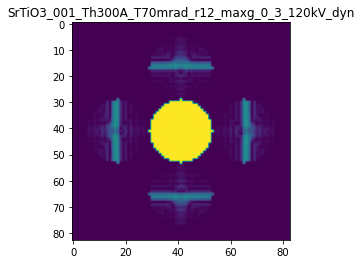

X_sim.max(): 0.9999410185740334
>>>replaced the 17. dataset and train: 
Epoch 1/5
5/5 [==============================] - 10s 1s/step - loss: 0.0293 - mean_absolute_error: 0.0504 - acc: 0.2900 - val_loss: 0.0202 - val_mean_absolute_error: 0.0437 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 3s 732ms/step - loss: 0.0292 - mean_absolute_error: 0.0522 - acc: 0.2900 - val_loss: 0.0210 - val_mean_absolute_error: 0.0467 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 3s 618ms/step - loss: 0.0295 - mean_absolute_error: 0.0511 - acc: 0.2900 - val_loss: 0.0209 - val_mean_absolute_error: 0.0475 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 4s 873ms/step - loss: 0.0290 - mean_absolute_error: 0.0501 - acc: 0.2900 - val_loss: 0.0209 - val_mean_absolute_error: 0.0456 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 4s 806ms/step - loss: 0.0291 - mean_absolute_error: 0.0492 - acc: 0.2900 - val_loss: 0.0209 - val_mean_absolu

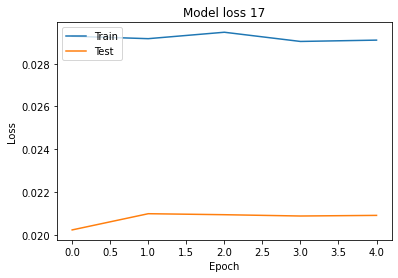

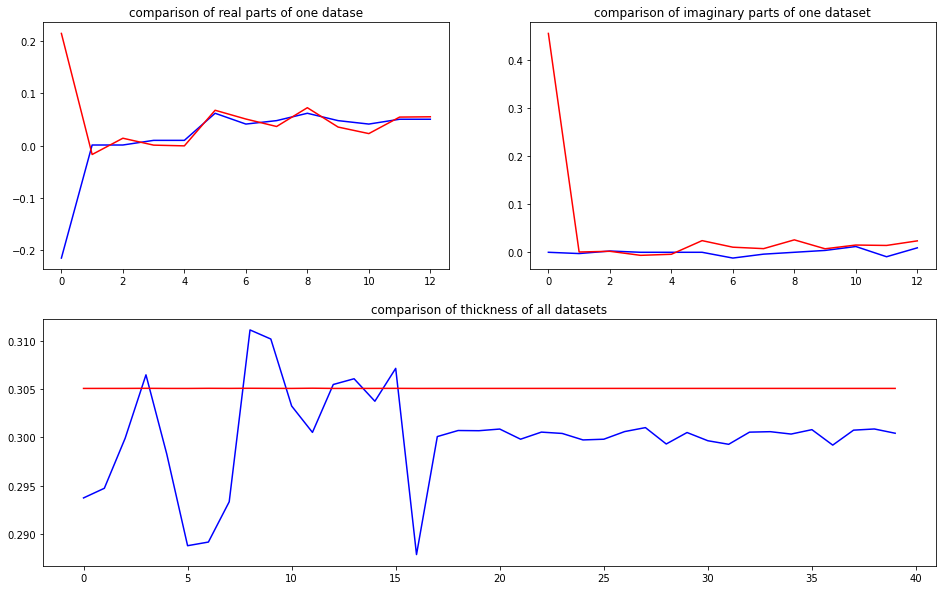

predicted thickness: 0.30409145


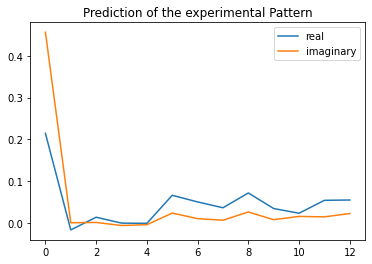

The offset applied on thickness: -0.00011024642791178141

The offset applied on Ug: -1.8350344837852544

Applied shift of unit cell origin (fractional coordinates): 0.3141088055207603 -0.0009870256321916479
Ug[ 0 ]: 0.25194 3.14159  =>  0.25194 3.14159
Ug[ 1 ]: 0.00166 -2.8545  =>  0.00166 -2.8607
Ug[ 2 ]: 0.00166 2.8545  =>  0.00166 2.8607
Ug[ 3 ]: 0.00105 -1.9736  =>  0.00105 0.0
Ug[ 4 ]: 0.00105 1.9736  =>  0.00105 -0.0
Ug[ 5 ]: 0.05926 -0.0124  =>  0.05926 -0.0
Ug[ 6 ]: 0.03411 -0.11734  =>  0.03411 1.86247
Ug[ 7 ]: 0.03326 -0.02191  =>  0.03326 -1.98931
Ug[ 8 ]: 0.05926 0.0124  =>  0.05926 0.0
Ug[ 9 ]: 0.03326 0.02191  =>  0.03326 1.98931
Ug[ 10 ]: 0.03411 0.11734  =>  0.03411 -1.86247
Ug[ 11 ]: 0.04875 -0.07556  =>  0.04875 2.26042
Ug[ 12 ]: 0.04875 0.07556  =>  0.04875 -2.26042
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

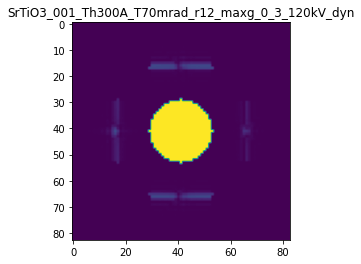

X_sim.max(): 0.9999762631558474
>>>replaced the 18. dataset and train: 
Epoch 1/5
5/5 [==============================] - 8s 953ms/step - loss: 0.0291 - mean_absolute_error: 0.0498 - acc: 0.2900 - val_loss: 0.0176 - val_mean_absolute_error: 0.0451 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 2s 533ms/step - loss: 0.0291 - mean_absolute_error: 0.0504 - acc: 0.2900 - val_loss: 0.0178 - val_mean_absolute_error: 0.0441 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 3s 579ms/step - loss: 0.0291 - mean_absolute_error: 0.0487 - acc: 0.2900 - val_loss: 0.0177 - val_mean_absolute_error: 0.0438 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 3s 572ms/step - loss: 0.0290 - mean_absolute_error: 0.0481 - acc: 0.2900 - val_loss: 0.0174 - val_mean_absolute_error: 0.0430 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 3s 629ms/step - loss: 0.0289 - mean_absolute_error: 0.0473 - acc: 0.2900 - val_loss: 0.0169 - val_mean_abso

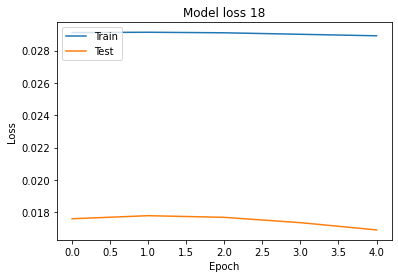

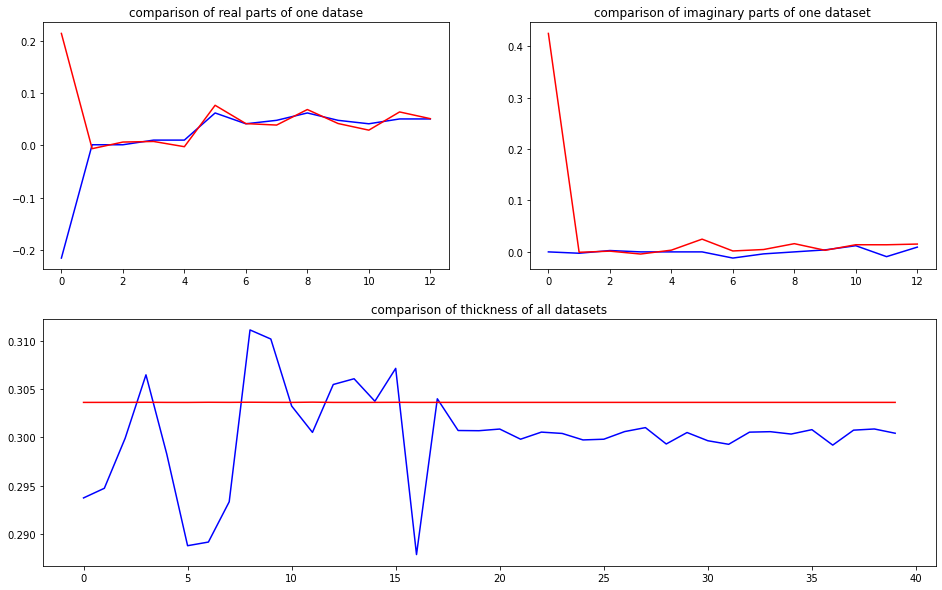

predicted thickness: 0.30268332


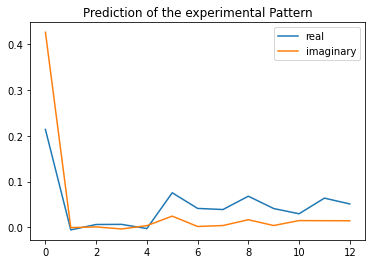

The offset applied on thickness: -0.0008001151421863266

The offset applied on Ug: 3.748672324389248

Applied shift of unit cell origin (fractional coordinates): 0.16783150791427548 0.007686320939197705
Ug[ 0 ]: 1.06472 0.0  =>  1.06472 0.0
Ug[ 1 ]: 0.00089 -1.10828  =>  0.00089 -1.05999
Ug[ 2 ]: 0.00089 1.10828  =>  0.00089 1.05999
Ug[ 3 ]: 0.0041 -1.05452  =>  0.0041 -0.0
Ug[ 4 ]: 0.0041 1.05452  =>  0.0041 0.0
Ug[ 5 ]: 0.09307 0.09659  =>  0.09307 0.0
Ug[ 6 ]: 0.04096 -0.11535  =>  0.04096 0.89088
Ug[ 7 ]: 0.04596 -0.01096  =>  0.04596 -1.11378
Ug[ 8 ]: 0.09307 -0.09659  =>  0.09307 0.0
Ug[ 9 ]: 0.04596 0.01096  =>  0.04596 1.11378
Ug[ 10 ]: 0.04096 0.11535  =>  0.04096 -0.89088
Ug[ 11 ]: 0.07083 0.06943  =>  0.07083 -2.0396
Ug[ 12 ]: 0.07083 -0.06943  =>  0.07083 2.0396
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

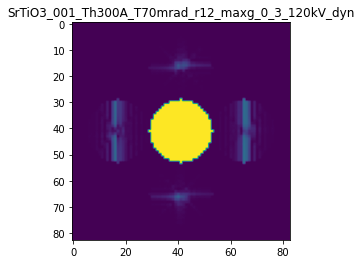

X_sim.max(): 0.9999469914932597
>>>replaced the 19. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 979ms/step - loss: 0.0292 - mean_absolute_error: 0.0480 - acc: 0.2900 - val_loss: 0.0178 - val_mean_absolute_error: 0.0439 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0294 - mean_absolute_error: 0.0497 - acc: 0.2900 - val_loss: 0.0175 - val_mean_absolute_error: 0.0455 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0293 - mean_absolute_error: 0.0492 - acc: 0.2900 - val_loss: 0.0179 - val_mean_absolute_error: 0.0445 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 3s 608ms/step - loss: 0.0293 - mean_absolute_error: 0.0512 - acc: 0.2900 - val_loss: 0.0182 - val_mean_absolute_error: 0.0457 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 3s 636ms/step - loss: 0.0292 - mean_absolute_error: 0.0497 - acc: 0.2900 - val_loss: 0.0180 - val_mean_abso

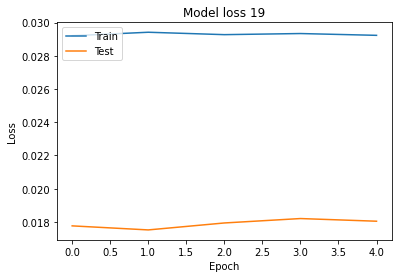

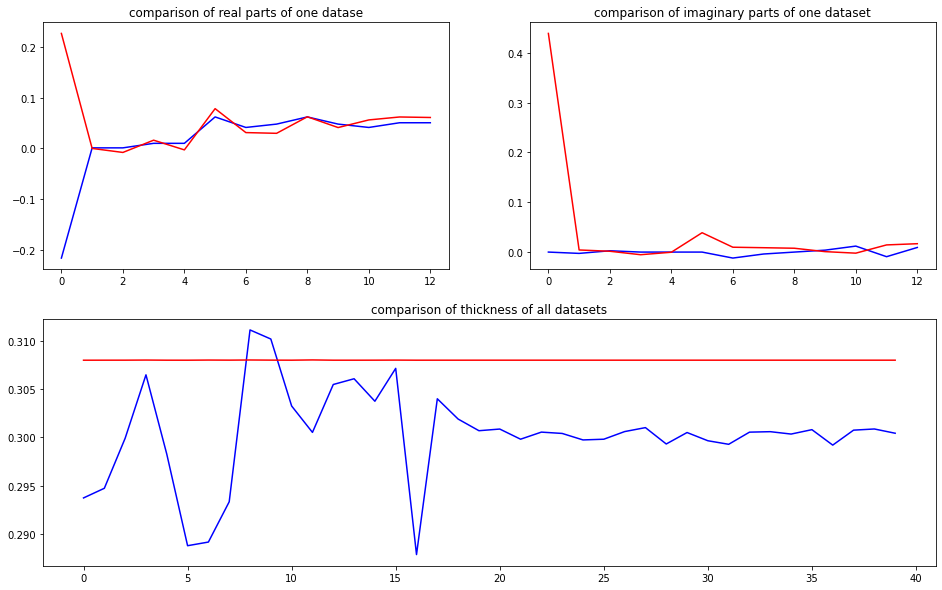

predicted thickness: 0.3070448


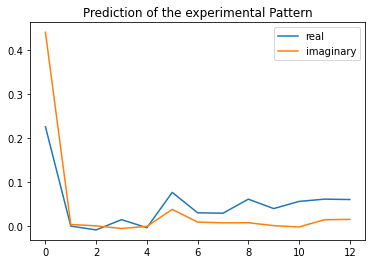

The offset applied on thickness: -0.00099546346018463

The offset applied on Ug: -1.4183026122263709

Applied shift of unit cell origin (fractional coordinates): 0.06392027971420274 0.01688171146326536
Ug[ 0 ]: 0.12091 3.14159  =>  0.12091 3.14159
Ug[ 1 ]: 0.00406 2.72474  =>  0.00406 2.83081
Ug[ 2 ]: 0.00406 -2.72474  =>  0.00406 -2.83081
Ug[ 3 ]: 0.00647 -0.40162  =>  0.00647 -0.0
Ug[ 4 ]: 0.00647 0.40162  =>  0.00647 0.0
Ug[ 5 ]: 0.06276 0.21214  =>  0.06276 0.0
Ug[ 6 ]: 0.04126 0.16567  =>  0.04126 0.46122
Ug[ 7 ]: 0.03343 0.10742  =>  0.03343 -0.40027
Ug[ 8 ]: 0.06276 -0.21214  =>  0.06276 -0.0
Ug[ 9 ]: 0.03343 -0.10742  =>  0.03343 0.40027
Ug[ 10 ]: 0.04126 -0.16567  =>  0.04126 -0.46122
Ug[ 11 ]: 0.05561 -0.00836  =>  0.05561 -0.81161
Ug[ 12 ]: 0.05561 0.00836  =>  0.05561 0.81161
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

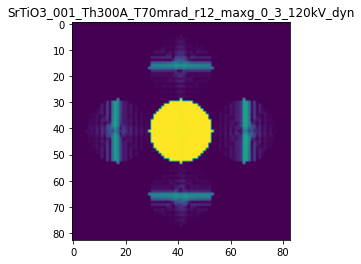

X_sim.max(): 0.9997751135509514
>>>replaced the 20. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 901ms/step - loss: 0.0293 - mean_absolute_error: 0.0484 - acc: 0.2800 - val_loss: 0.0183 - val_mean_absolute_error: 0.0447 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 2s 534ms/step - loss: 0.0293 - mean_absolute_error: 0.0487 - acc: 0.2800 - val_loss: 0.0183 - val_mean_absolute_error: 0.0458 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0292 - mean_absolute_error: 0.0486 - acc: 0.2800 - val_loss: 0.0183 - val_mean_absolute_error: 0.0458 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0293 - mean_absolute_error: 0.0483 - acc: 0.2800 - val_loss: 0.0185 - val_mean_absolute_error: 0.0453 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 3s 656ms/step - loss: 0.0293 - mean_absolute_error: 0.0481 - acc: 0.2800 - val_loss: 0.0183 - val_mean_abso

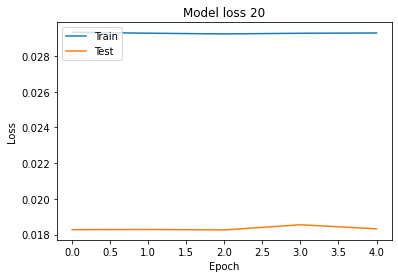

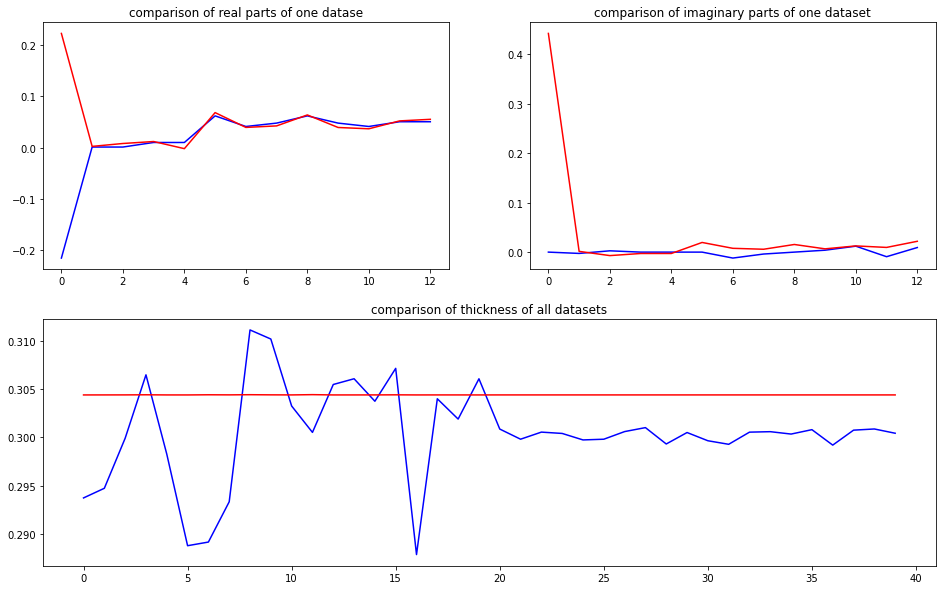

predicted thickness: 0.30345646


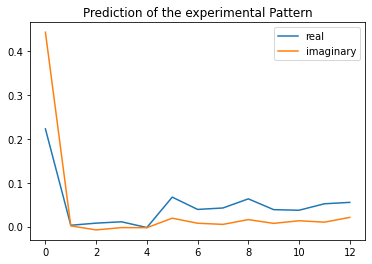

The offset applied on thickness: 0.0006181786368721112

The offset applied on Ug: 0.8950841994070473

Applied shift of unit cell origin (fractional coordinates): -0.005919258005958826 0.002238488830205617
Ug[ 0 ]: 0.44224 0.0  =>  0.44224 0.0
Ug[ 1 ]: 0.00717 0.68298  =>  0.00717 0.69705
Ug[ 2 ]: 0.00717 -0.68298  =>  0.00717 -0.69705
Ug[ 3 ]: 0.00448 0.03719  =>  0.00448 0.0
Ug[ 4 ]: 0.00448 -0.03719  =>  0.00448 0.0
Ug[ 5 ]: 0.06932 0.02813  =>  0.06932 0.0
Ug[ 6 ]: 0.03971 -0.07089  =>  0.03971 -0.12215
Ug[ 7 ]: 0.04205 -0.02425  =>  0.04205 -0.00112
Ug[ 8 ]: 0.06932 -0.02813  =>  0.06932 0.0
Ug[ 9 ]: 0.04205 0.02425  =>  0.04205 0.00112
Ug[ 10 ]: 0.03971 0.07089  =>  0.03971 0.12215
Ug[ 11 ]: 0.05672 -0.10211  =>  0.05672 -0.02772
Ug[ 12 ]: 0.05672 0.10211  =>  0.05672 0.02772
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

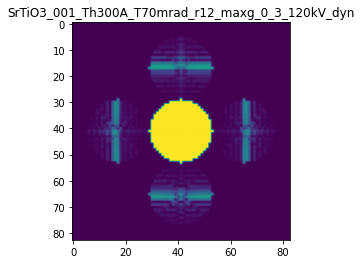

X_sim.max(): 0.9996718674614139
>>>replaced the 21. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 1s/step - loss: 0.0294 - mean_absolute_error: 0.0479 - acc: 0.2800 - val_loss: 0.0181 - val_mean_absolute_error: 0.0439 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 3s 572ms/step - loss: 0.0294 - mean_absolute_error: 0.0494 - acc: 0.2800 - val_loss: 0.0184 - val_mean_absolute_error: 0.0458 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 3s 611ms/step - loss: 0.0297 - mean_absolute_error: 0.0500 - acc: 0.2800 - val_loss: 0.0181 - val_mean_absolute_error: 0.0458 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 3s 651ms/step - loss: 0.0295 - mean_absolute_error: 0.0522 - acc: 0.2800 - val_loss: 0.0189 - val_mean_absolute_error: 0.0481 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 3s 634ms/step - loss: 0.0293 - mean_absolute_error: 0.0506 - acc: 0.2800 - val_loss: 0.0179 - val_mean_absolut

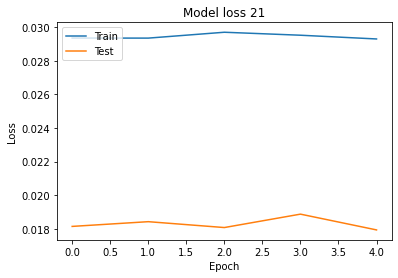

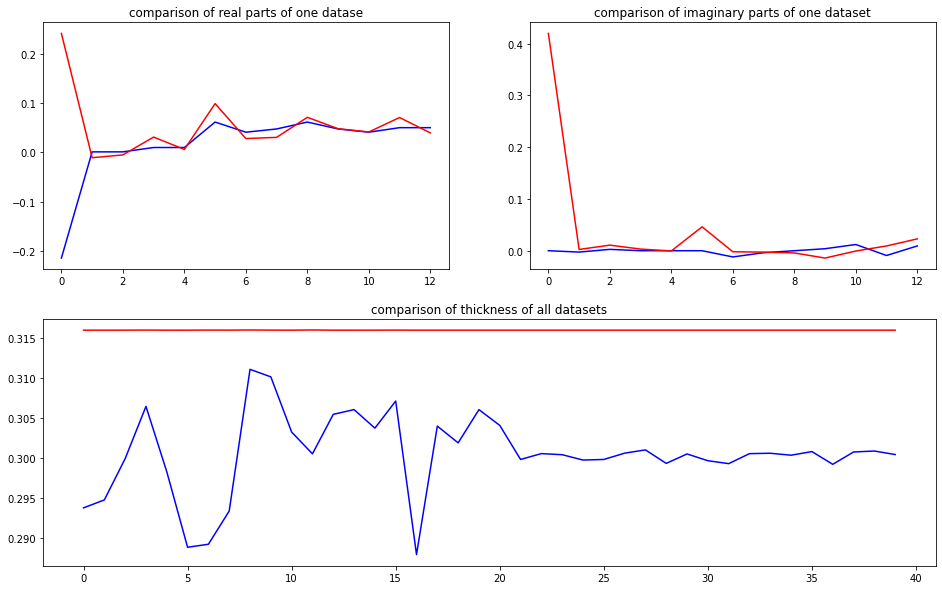

predicted thickness: 0.31514034


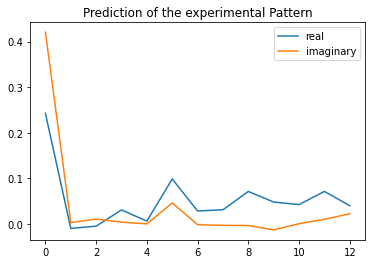

The offset applied on thickness: -0.0006583523233109243

The offset applied on Ug: 1.231738831136087

Applied shift of unit cell origin (fractional coordinates): -0.021281050910174033 0.02448500715592346
Ug[ 0 ]: 0.53271 0.0  =>  0.53271 0.0
Ug[ 1 ]: 0.00845 -2.6592  =>  0.00845 -2.50536
Ug[ 2 ]: 0.00845 2.6592  =>  0.00845 2.50536
Ug[ 3 ]: 0.01896 0.13371  =>  0.01896 0.0
Ug[ 4 ]: 0.01896 -0.13371  =>  0.01896 0.0
Ug[ 5 ]: 0.09985 0.30769  =>  0.09985 0.0
Ug[ 6 ]: 0.03674 -0.04796  =>  0.03674 -0.33552
Ug[ 7 ]: 0.04157 0.09521  =>  0.04157 0.07508
Ug[ 8 ]: 0.09985 -0.30769  =>  0.09985 0.0
Ug[ 9 ]: 0.04157 -0.09521  =>  0.04157 -0.07508
Ug[ 10 ]: 0.03674 0.04796  =>  0.03674 0.33552
Ug[ 11 ]: 0.06001 -0.06278  =>  0.06001 0.20464
Ug[ 12 ]: 0.06001 0.06278  =>  0.06001 -0.20464
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

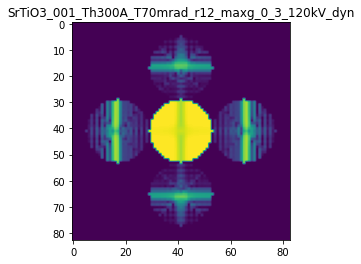

X_sim.max(): 0.9979815095817116
>>>replaced the 22. dataset and train: 
Epoch 1/5
5/5 [==============================] - 8s 1s/step - loss: 0.0275 - mean_absolute_error: 0.0483 - acc: 0.2700 - val_loss: 0.0181 - val_mean_absolute_error: 0.0440 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 3s 692ms/step - loss: 0.0275 - mean_absolute_error: 0.0477 - acc: 0.2700 - val_loss: 0.0176 - val_mean_absolute_error: 0.0438 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 4s 796ms/step - loss: 0.0276 - mean_absolute_error: 0.0483 - acc: 0.2700 - val_loss: 0.0173 - val_mean_absolute_error: 0.0458 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 4s 890ms/step - loss: 0.0277 - mean_absolute_error: 0.0511 - acc: 0.2700 - val_loss: 0.0177 - val_mean_absolute_error: 0.0486 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 3s 670ms/step - loss: 0.0276 - mean_absolute_error: 0.0491 - acc: 0.2700 - val_loss: 0.0176 - val_mean_absolut

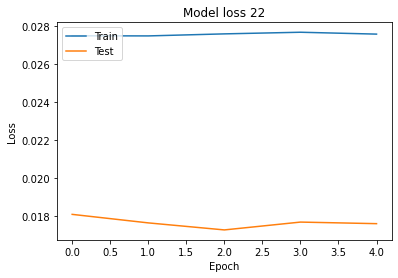

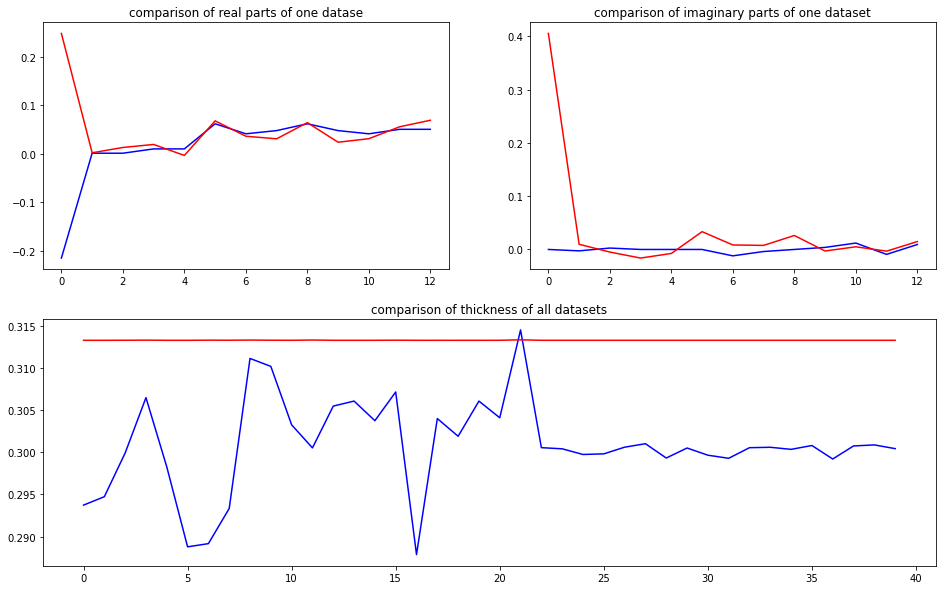

predicted thickness: 0.31242424


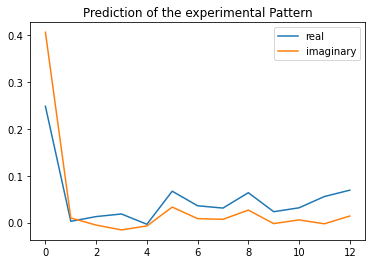

The offset applied on thickness: -0.000500968166381

The offset applied on Ug: 2.88914163622984

Applied shift of unit cell origin (fractional coordinates): 0.06177694199231911 0.004979523642511302
Ug[ 0 ]: 0.90356 0.0  =>  0.90356 0.0
Ug[ 1 ]: 0.01104 0.736  =>  0.01104 0.76728
Ug[ 2 ]: 0.01104 -0.736  =>  0.01104 -0.76728
Ug[ 3 ]: 0.00899 -0.38816  =>  0.00899 -0.0
Ug[ 4 ]: 0.00899 0.38816  =>  0.00899 0.0
Ug[ 5 ]: 0.08054 0.06257  =>  0.08054 0.0
Ug[ 6 ]: 0.03726 0.05318  =>  0.03726 0.41005
Ug[ 7 ]: 0.02984 0.181  =>  0.02984 -0.23845
Ug[ 8 ]: 0.08054 -0.06257  =>  0.08054 0.0
Ug[ 9 ]: 0.02984 -0.181  =>  0.02984 0.23845
Ug[ 10 ]: 0.03726 -0.05318  =>  0.03726 -0.41005
Ug[ 11 ]: 0.07518 -0.16875  =>  0.07518 -0.94506
Ug[ 12 ]: 0.07518 0.16875  =>  0.07518 0.94506
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad

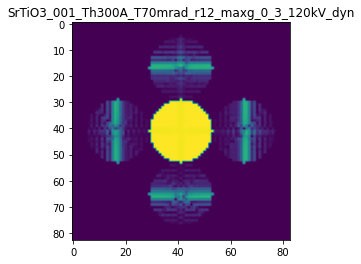

X_sim.max(): 0.9987098846961612
>>>replaced the 23. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0277 - mean_absolute_error: 0.0491 - acc: 0.2700 - val_loss: 0.0179 - val_mean_absolute_error: 0.0462 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 3s 649ms/step - loss: 0.0276 - mean_absolute_error: 0.0480 - acc: 0.2700 - val_loss: 0.0179 - val_mean_absolute_error: 0.0446 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 3s 640ms/step - loss: 0.0275 - mean_absolute_error: 0.0469 - acc: 0.2700 - val_loss: 0.0179 - val_mean_absolute_error: 0.0438 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 3s 692ms/step - loss: 0.0276 - mean_absolute_error: 0.0474 - acc: 0.2700 - val_loss: 0.0176 - val_mean_absolute_error: 0.0438 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 4s 741ms/step - loss: 0.0275 - mean_absolute_error: 0.0474 - acc: 0.2700 - val_loss: 0.0181 - val_mean_absolut

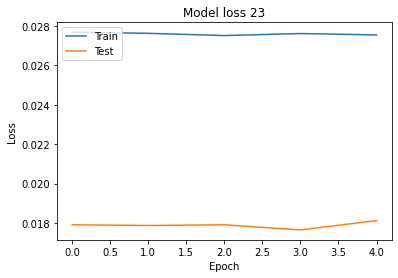

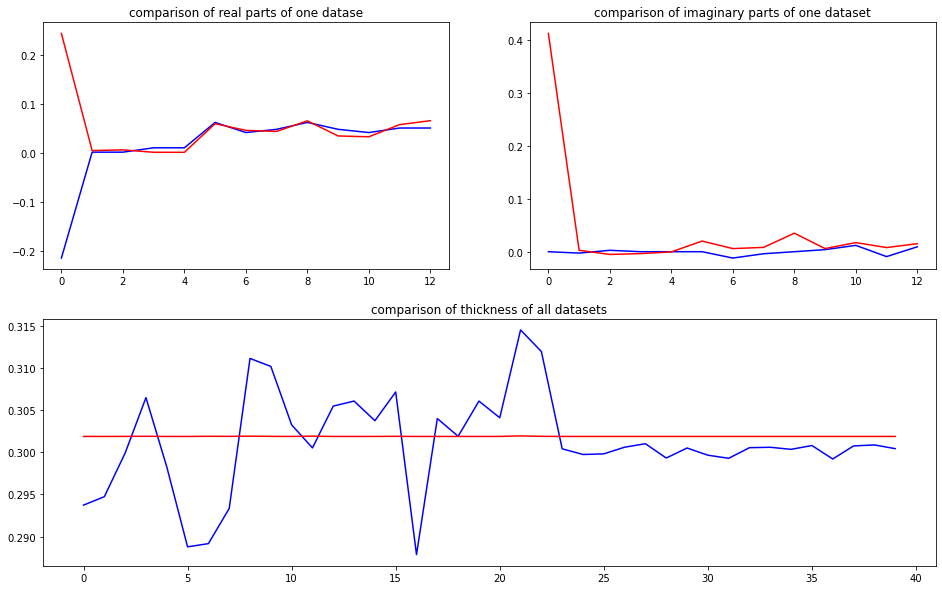

predicted thickness: 0.3010241


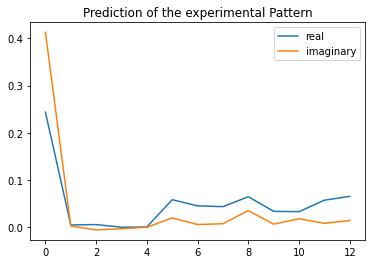

The offset applied on thickness: -0.0003523266379339543

The offset applied on Ug: -2.377136345080865

Applied shift of unit cell origin (fractional coordinates): 0.21181661582845318 -0.010181483987736037
Ug[ 0 ]: 0.30301 3.14159  =>  0.30301 3.14159
Ug[ 1 ]: 0.00672 0.67726  =>  0.00672 0.61329
Ug[ 2 ]: 0.00672 -0.67726  =>  0.00672 -0.61329
Ug[ 3 ]: 0.00159 -1.33088  =>  0.00159 -0.0
Ug[ 4 ]: 0.00159 1.33088  =>  0.00159 0.0
Ug[ 5 ]: 0.05098 -0.12794  =>  0.05098 -0.0
Ug[ 6 ]: 0.03566 -0.18615  =>  0.03566 1.2087
Ug[ 7 ]: 0.03495 -0.00719  =>  0.03495 -1.27411
Ug[ 8 ]: 0.05098 0.12794  =>  0.05098 0.0
Ug[ 9 ]: 0.03495 0.00719  =>  0.03495 1.27411
Ug[ 10 ]: 0.03566 0.18615  =>  0.03566 -1.2087
Ug[ 11 ]: 0.05214 -0.04123  =>  0.05214 -2.70299
Ug[ 12 ]: 0.05214 0.04123  =>  0.05214 2.70299
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

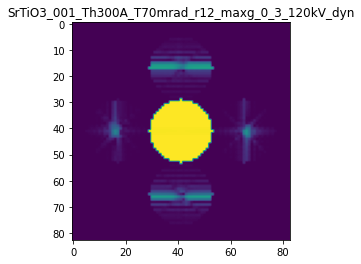

X_sim.max(): 0.9998592769209201
>>>replaced the 24. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 1s/step - loss: 0.0279 - mean_absolute_error: 0.0480 - acc: 0.2700 - val_loss: 0.0181 - val_mean_absolute_error: 0.0451 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 3s 629ms/step - loss: 0.0277 - mean_absolute_error: 0.0491 - acc: 0.2700 - val_loss: 0.0183 - val_mean_absolute_error: 0.0464 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 3s 577ms/step - loss: 0.0277 - mean_absolute_error: 0.0480 - acc: 0.2700 - val_loss: 0.0183 - val_mean_absolute_error: 0.0452 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 3s 641ms/step - loss: 0.0276 - mean_absolute_error: 0.0474 - acc: 0.2700 - val_loss: 0.0186 - val_mean_absolute_error: 0.0451 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 3s 633ms/step - loss: 0.0276 - mean_absolute_error: 0.0475 - acc: 0.2700 - val_loss: 0.0181 - val_mean_absolut

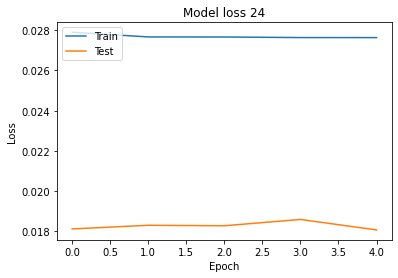

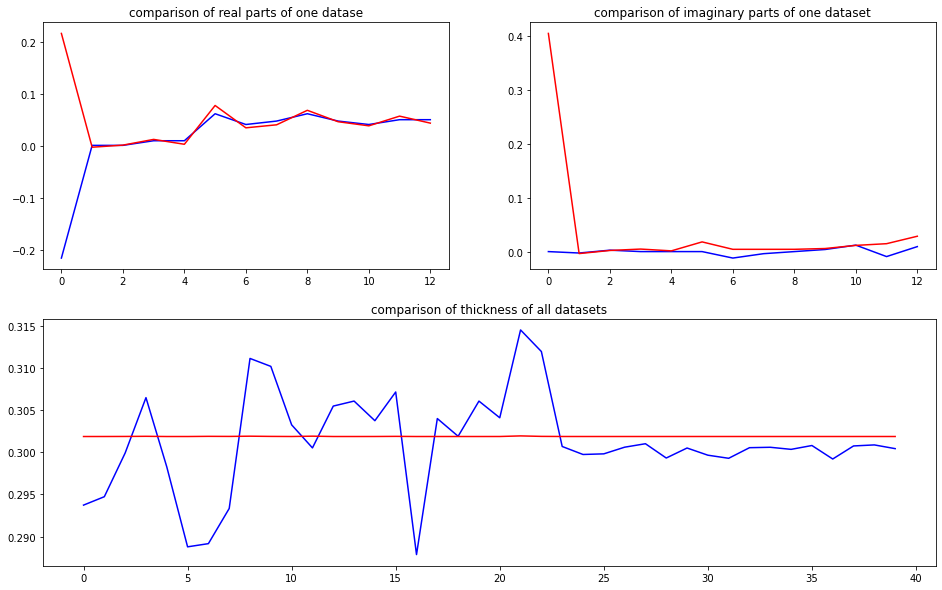

predicted thickness: 0.30102682


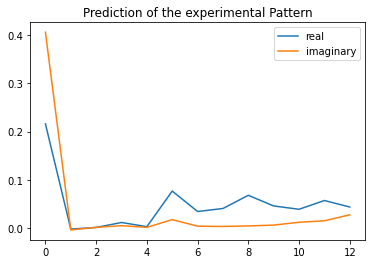

The offset applied on thickness: 0.000588757365254513

The offset applied on Ug: 1.8579906632584586

Applied shift of unit cell origin (fractional coordinates): -0.038894498034426336 0.00824150760768218
Ug[ 0 ]: 0.60888 0.0  =>  0.60888 0.0
Ug[ 1 ]: 0.00265 -1.62249  =>  0.00265 -1.57071
Ug[ 2 ]: 0.00265 1.62249  =>  0.00265 1.57071
Ug[ 3 ]: 0.00787 0.24438  =>  0.00787 0.0
Ug[ 4 ]: 0.00787 -0.24438  =>  0.00787 0.0
Ug[ 5 ]: 0.08302 0.10357  =>  0.08302 0.0
Ug[ 6 ]: 0.03983 -0.11434  =>  0.03983 -0.4105
Ug[ 7 ]: 0.04703 -0.04206  =>  0.04703 0.15054
Ug[ 8 ]: 0.08302 -0.10357  =>  0.08302 0.0
Ug[ 9 ]: 0.04703 0.04206  =>  0.04703 -0.15054
Ug[ 10 ]: 0.03983 0.11434  =>  0.03983 0.4105
Ug[ 11 ]: 0.05661 -0.0913  =>  0.05661 0.39746
Ug[ 12 ]: 0.05661 0.0913  =>  0.05661 -0.39746
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

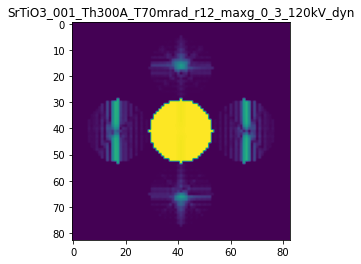

X_sim.max(): 0.9997214747477673
>>>replaced the 25. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0263 - mean_absolute_error: 0.0468 - acc: 0.2600 - val_loss: 0.0179 - val_mean_absolute_error: 0.0443 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0262 - mean_absolute_error: 0.0468 - acc: 0.2600 - val_loss: 0.0178 - val_mean_absolute_error: 0.0449 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0263 - mean_absolute_error: 0.0464 - acc: 0.2600 - val_loss: 0.0176 - val_mean_absolute_error: 0.0445 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 3s 601ms/step - loss: 0.0263 - mean_absolute_error: 0.0460 - acc: 0.2600 - val_loss: 0.0174 - val_mean_absolute_error: 0.0435 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 3s 637ms/step - loss: 0.0262 - mean_absolute_error: 0.0470 - acc: 0.2600 - val_loss: 0.0179 - val_mean_absolut

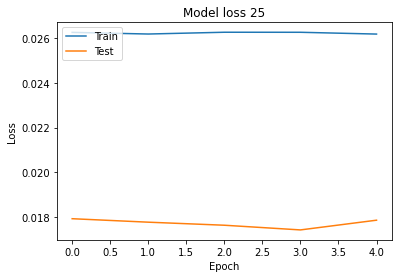

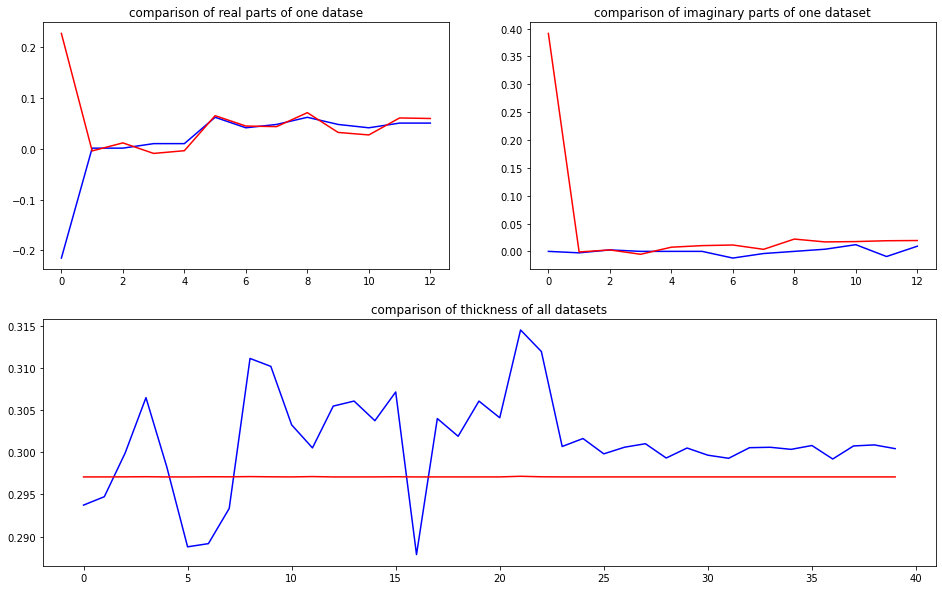

predicted thickness: 0.29627597


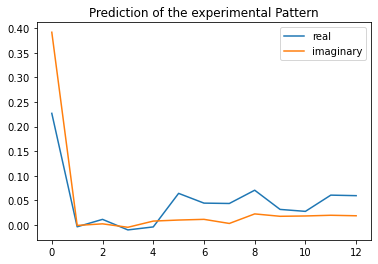

The offset applied on thickness: 0.00015029407240418124

The offset applied on Ug: -1.3614549309304316

Applied shift of unit cell origin (fractional coordinates): 0.38509672312756293 -0.00727128541547917
Ug[ 0 ]: 0.05224 3.14159  =>  0.05224 3.14159
Ug[ 1 ]: 0.00401 -0.39238  =>  0.00401 -0.43806
Ug[ 2 ]: 0.00401 0.39238  =>  0.00401 0.43806
Ug[ 3 ]: 0.00957 -2.41963  =>  0.00957 0.0
Ug[ 4 ]: 0.00957 2.41963  =>  0.00957 0.0
Ug[ 5 ]: 0.06107 -0.09137  =>  0.06107 -0.0
Ug[ 6 ]: 0.03407 -0.11784  =>  0.03407 2.34748
Ug[ 7 ]: 0.03625 -0.21181  =>  0.03625 -2.58575
Ug[ 8 ]: 0.06107 0.09137  =>  0.06107 0.0
Ug[ 9 ]: 0.03625 0.21181  =>  0.03625 2.58575
Ug[ 10 ]: 0.03407 0.11784  =>  0.03407 -2.34748
Ug[ 11 ]: 0.05468 0.00775  =>  0.05468 1.45167
Ug[ 12 ]: 0.05468 -0.00775  =>  0.05468 -1.45167
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

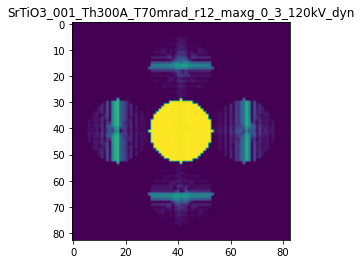

X_sim.max(): 0.9997794784422378
>>>replaced the 26. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0240 - mean_absolute_error: 0.0463 - acc: 0.2500 - val_loss: 0.0174 - val_mean_absolute_error: 0.0458 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0240 - mean_absolute_error: 0.0460 - acc: 0.2500 - val_loss: 0.0178 - val_mean_absolute_error: 0.0453 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 3s 595ms/step - loss: 0.0241 - mean_absolute_error: 0.0469 - acc: 0.2500 - val_loss: 0.0174 - val_mean_absolute_error: 0.0458 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 3s 584ms/step - loss: 0.0240 - mean_absolute_error: 0.0464 - acc: 0.2500 - val_loss: 0.0170 - val_mean_absolute_error: 0.0434 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 3s 605ms/step - loss: 0.0240 - mean_absolute_error: 0.0452 - acc: 0.2500 - val_loss: 0.0174 - val_mean_absolut

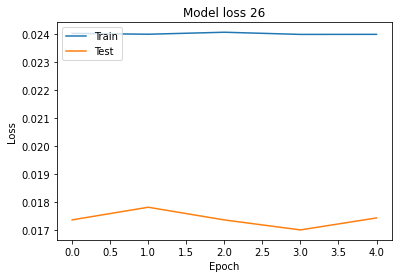

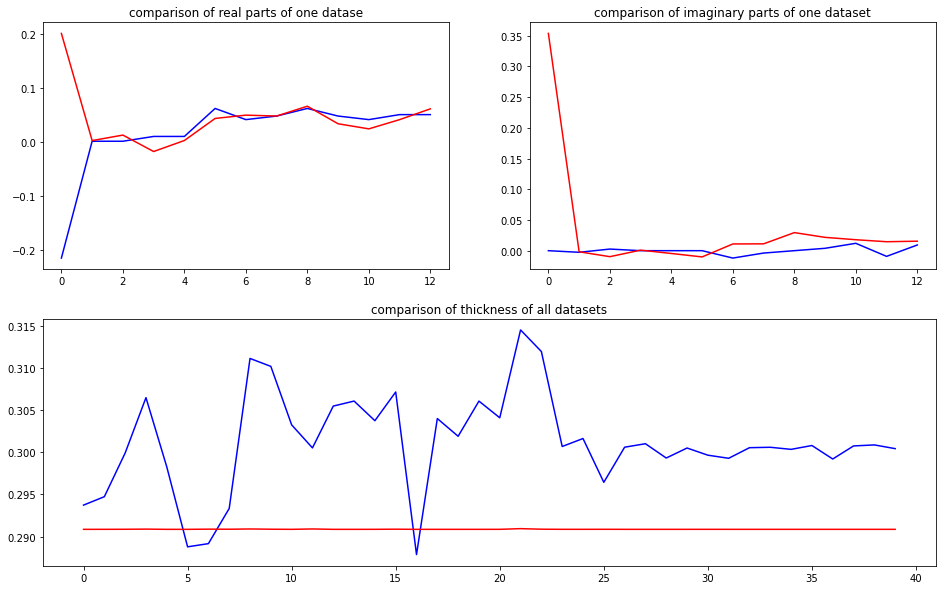

predicted thickness: 0.29009512


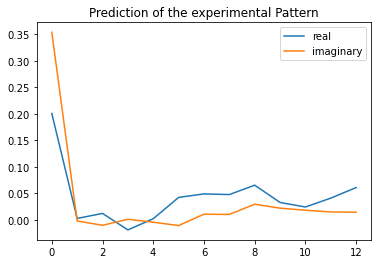

The offset applied on thickness: -0.00021601545844960346

The offset applied on Ug: 1.403379971558146

Applied shift of unit cell origin (fractional coordinates): -0.4425685450281485 -0.029447707694950625
Ug[ 0 ]: 0.43352 0.0  =>  0.43352 0.0
Ug[ 1 ]: 0.00882 0.46783  =>  0.00882 0.2828
Ug[ 2 ]: 0.00882 -0.46783  =>  0.00882 -0.2828
Ug[ 3 ]: 0.00842 2.78074  =>  0.00842 -0.0
Ug[ 4 ]: 0.00842 -2.78074  =>  0.00842 0.0
Ug[ 5 ]: 0.06345 -0.37005  =>  0.06345 0.0
Ug[ 6 ]: 0.03941 -0.06199  =>  0.03941 -2.65771
Ug[ 7 ]: 0.04366 -0.11934  =>  0.04366 2.84642
Ug[ 8 ]: 0.06345 0.37005  =>  0.06345 0.0
Ug[ 9 ]: 0.04366 0.11934  =>  0.04366 -2.84642
Ug[ 10 ]: 0.03941 0.06199  =>  0.03941 2.65771
Ug[ 11 ]: 0.05541 -0.02741  =>  0.05541 -0.74911
Ug[ 12 ]: 0.05541 0.02741  =>  0.05541 0.74911
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

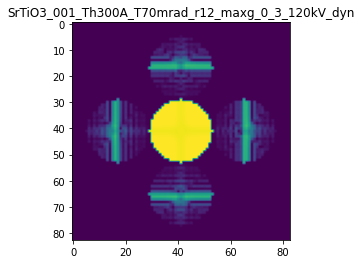

X_sim.max(): 0.9999317724810486
>>>replaced the 27. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 944ms/step - loss: 0.0240 - mean_absolute_error: 0.0457 - acc: 0.2400 - val_loss: 0.0167 - val_mean_absolute_error: 0.0435 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0241 - mean_absolute_error: 0.0446 - acc: 0.2400 - val_loss: 0.0168 - val_mean_absolute_error: 0.0433 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0240 - mean_absolute_error: 0.0461 - acc: 0.2400 - val_loss: 0.0173 - val_mean_absolute_error: 0.0452 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 3s 626ms/step - loss: 0.0240 - mean_absolute_error: 0.0455 - acc: 0.2400 - val_loss: 0.0172 - val_mean_absolute_error: 0.0450 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 3s 631ms/step - loss: 0.0240 - mean_absolute_error: 0.0452 - acc: 0.2400 - val_loss: 0.0175 - val_mean_abso

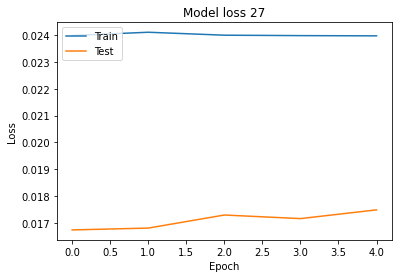

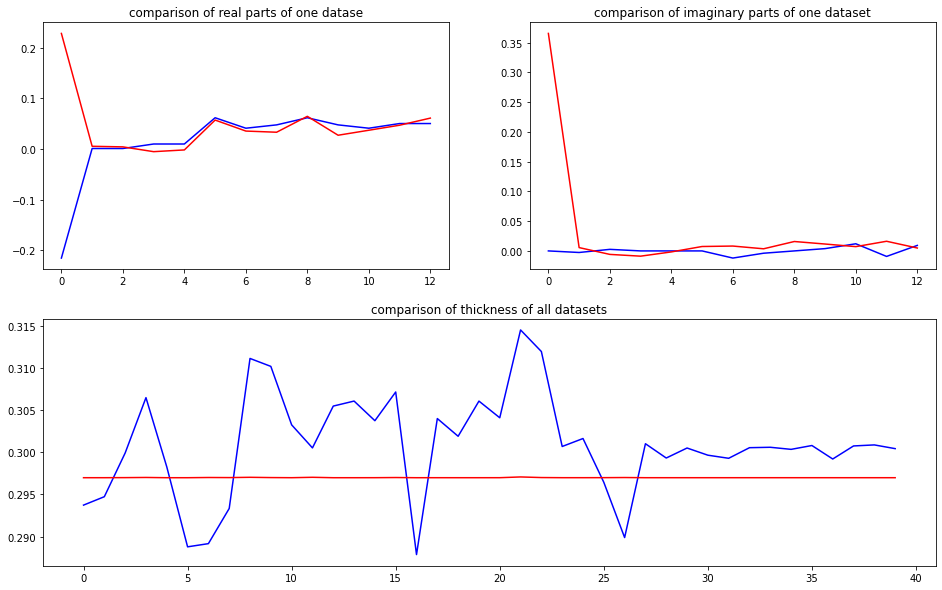

predicted thickness: 0.29620788


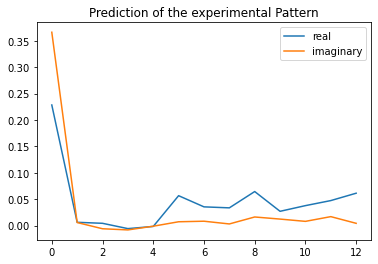

The offset applied on thickness: -0.0001262290831791708

The offset applied on Ug: -3.744142462873451

Applied shift of unit cell origin (fractional coordinates): 0.38124023605535623 -0.006081173117938507
Ug[ 0 ]: 0.46929 3.14159  =>  0.46929 3.14159
Ug[ 1 ]: 0.00765 0.87385  =>  0.00765 0.83564
Ug[ 2 ]: 0.00765 -0.87385  =>  0.00765 -0.83564
Ug[ 3 ]: 0.00547 -2.3954  =>  0.00547 0.0
Ug[ 4 ]: 0.00547 2.3954  =>  0.00547 -0.0
Ug[ 5 ]: 0.04626 -0.07642  =>  0.04626 0.0
Ug[ 6 ]: 0.03129 0.01074  =>  0.03129 2.44435
Ug[ 7 ]: 0.0269 -0.18345  =>  0.0269 -2.54065
Ug[ 8 ]: 0.04626 0.07642  =>  0.04626 0.0
Ug[ 9 ]: 0.0269 0.18345  =>  0.0269 2.54065
Ug[ 10 ]: 0.03129 -0.01074  =>  0.03129 -2.44435
Ug[ 11 ]: 0.04311 0.1706  =>  0.04311 1.66298
Ug[ 12 ]: 0.04311 -0.1706  =>  0.04311 -1.66298
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

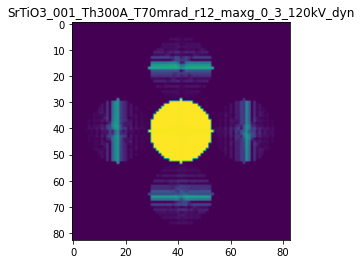

X_sim.max(): 0.9999350140910841
>>>replaced the 28. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 970ms/step - loss: 0.0242 - mean_absolute_error: 0.0470 - acc: 0.2400 - val_loss: 0.0179 - val_mean_absolute_error: 0.0463 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0241 - mean_absolute_error: 0.0456 - acc: 0.2400 - val_loss: 0.0177 - val_mean_absolute_error: 0.0453 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0243 - mean_absolute_error: 0.0457 - acc: 0.2400 - val_loss: 0.0176 - val_mean_absolute_error: 0.0447 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 3s 581ms/step - loss: 0.0242 - mean_absolute_error: 0.0475 - acc: 0.2400 - val_loss: 0.0178 - val_mean_absolute_error: 0.0460 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 3s 660ms/step - loss: 0.0243 - mean_absolute_error: 0.0460 - acc: 0.2400 - val_loss: 0.0178 - val_mean_abso

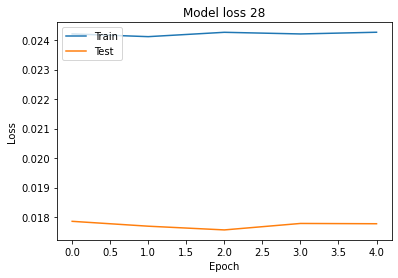

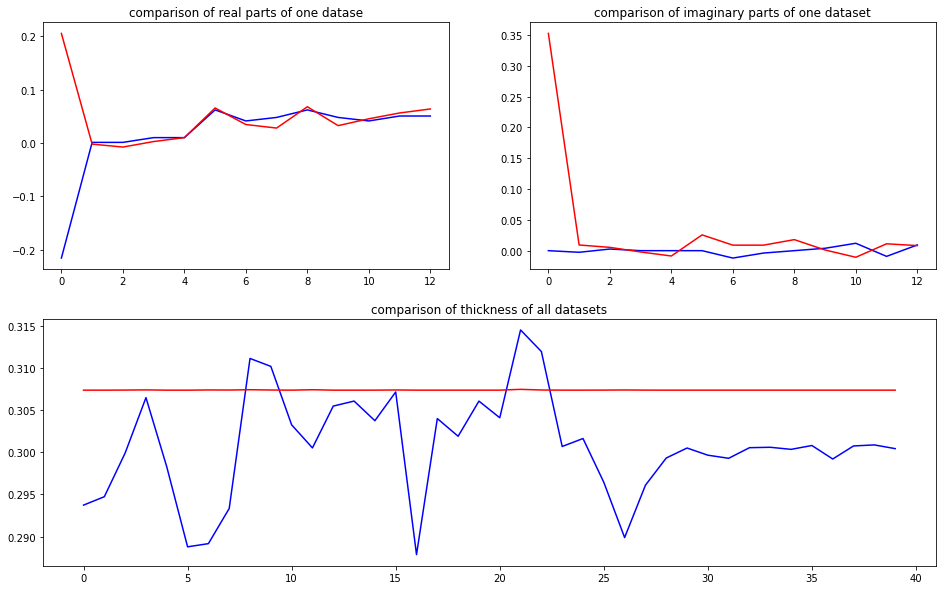

predicted thickness: 0.30661485


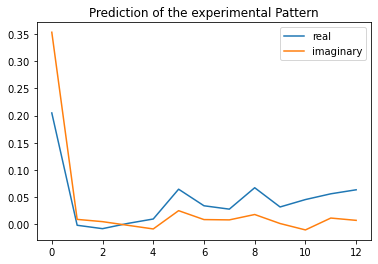

The offset applied on thickness: -0.0004509092428786619

The offset applied on Ug: -0.6041030157665818

Applied shift of unit cell origin (fractional coordinates): -0.0830772212694027 0.004449542180533111
Ug[ 0 ]: 0.10417 0.0  =>  0.10417 0.0
Ug[ 1 ]: 0.00515 2.72652  =>  0.00515 2.75447
Ug[ 2 ]: 0.00515 -2.72652  =>  0.00515 -2.75447
Ug[ 3 ]: 0.0068 0.52199  =>  0.0068 0.0
Ug[ 4 ]: 0.0068 -0.52199  =>  0.0068 -0.0
Ug[ 5 ]: 0.06328 0.05591  =>  0.06328 0.0
Ug[ 6 ]: 0.04017 0.24541  =>  0.04017 -0.30454
Ug[ 7 ]: 0.02972 0.11441  =>  0.02972 0.60844
Ug[ 8 ]: 0.06328 -0.05591  =>  0.06328 -0.0
Ug[ 9 ]: 0.02972 -0.11441  =>  0.02972 -0.60844
Ug[ 10 ]: 0.04017 -0.24541  =>  0.04017 0.30454
Ug[ 11 ]: 0.05779 0.04033  =>  0.05779 1.08431
Ug[ 12 ]: 0.05779 -0.04033  =>  0.05779 -1.08431
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

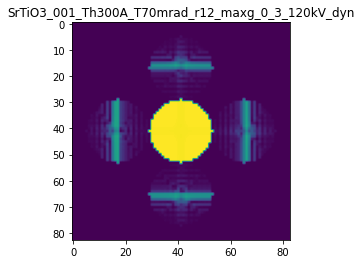

X_sim.max(): 0.9996937560909993
>>>replaced the 29. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0235 - mean_absolute_error: 0.0451 - acc: 0.2300 - val_loss: 0.0170 - val_mean_absolute_error: 0.0435 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0234 - mean_absolute_error: 0.0444 - acc: 0.2300 - val_loss: 0.0176 - val_mean_absolute_error: 0.0457 - val_acc: 0.0250
Epoch 3/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0234 - mean_absolute_error: 0.0443 - acc: 0.2300 - val_loss: 0.0171 - val_mean_absolute_error: 0.0441 - val_acc: 0.0250
Epoch 4/5
5/5 [==============================] - 3s 673ms/step - loss: 0.0234 - mean_absolute_error: 0.0439 - acc: 0.2300 - val_loss: 0.0171 - val_mean_absolute_error: 0.0430 - val_acc: 0.0250
Epoch 5/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0235 - mean_absolute_error: 0.0438 - acc: 0.2300 - val_loss: 0.0169 - val_mean_absolut

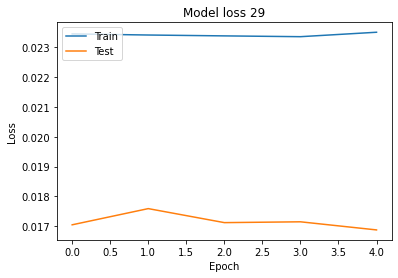

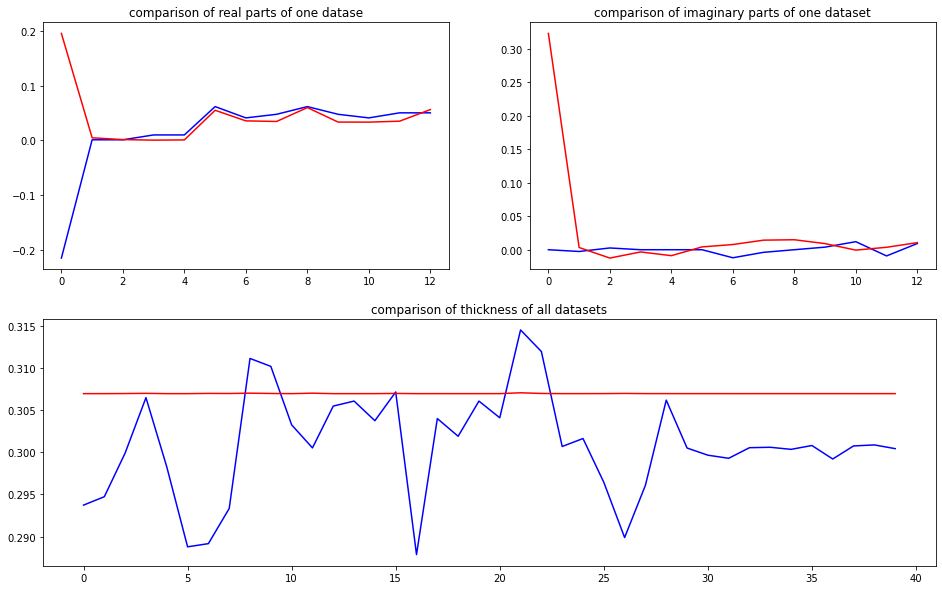

predicted thickness: 0.30623558


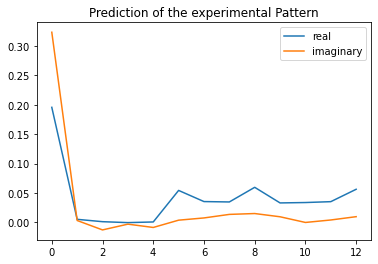

The offset applied on thickness: 0.000726804174470192

The offset applied on Ug: -3.1403986293558876

Applied shift of unit cell origin (fractional coordinates): -0.24004484476595747 -0.008370474044058022
Ug[ 0 ]: 0.25311 3.14159  =>  0.25311 3.14159
Ug[ 1 ]: 0.00874 1.21678  =>  0.00874 1.16418
Ug[ 2 ]: 0.00874 -1.21678  =>  0.00874 -1.16418
Ug[ 3 ]: 0.00292 1.50825  =>  0.00292 -0.0
Ug[ 4 ]: 0.00292 -1.50825  =>  0.00292 0.0
Ug[ 5 ]: 0.04673 -0.10519  =>  0.04673 0.0
Ug[ 6 ]: 0.03105 0.11736  =>  0.03105 -1.33829
Ug[ 7 ]: 0.03002 0.05931  =>  0.03002 1.62015
Ug[ 8 ]: 0.04673 0.10519  =>  0.04673 0.0
Ug[ 9 ]: 0.03002 -0.05931  =>  0.03002 -1.62015
Ug[ 10 ]: 0.03105 -0.11736  =>  0.03105 1.33829
Ug[ 11 ]: 0.03877 -0.023  =>  0.03877 2.99349
Ug[ 12 ]: 0.03877 0.023  =>  0.03877 -2.99349
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

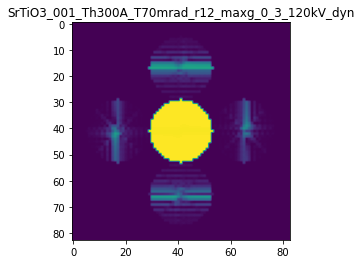

X_sim.max(): 0.9996806031713982
>>>replaced the 30. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0235 - mean_absolute_error: 0.0470 - acc: 0.2200 - val_loss: 0.0171 - val_mean_absolute_error: 0.0457 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 3s 605ms/step - loss: 0.0235 - mean_absolute_error: 0.0461 - acc: 0.2200 - val_loss: 0.0173 - val_mean_absolute_error: 0.0446 - val_acc: 0.0250
Epoch 3/5
5/5 [==============================] - 3s 608ms/step - loss: 0.0234 - mean_absolute_error: 0.0442 - acc: 0.2200 - val_loss: 0.0168 - val_mean_absolute_error: 0.0441 - val_acc: 0.0250
Epoch 4/5
5/5 [==============================] - 4s 792ms/step - loss: 0.0235 - mean_absolute_error: 0.0441 - acc: 0.5200 - val_loss: 0.0169 - val_mean_absolute_error: 0.0448 - val_acc: 0.0250
Epoch 5/5
5/5 [==============================] - 3s 648ms/step - loss: 0.0235 - mean_absolute_error: 0.0478 - acc: 0.2200 - val_loss: 0.0171 - val_mean_absolut

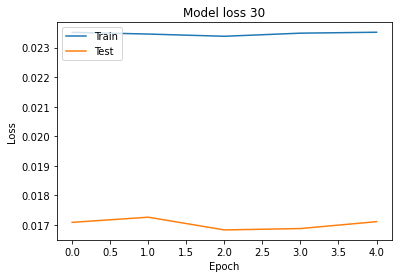

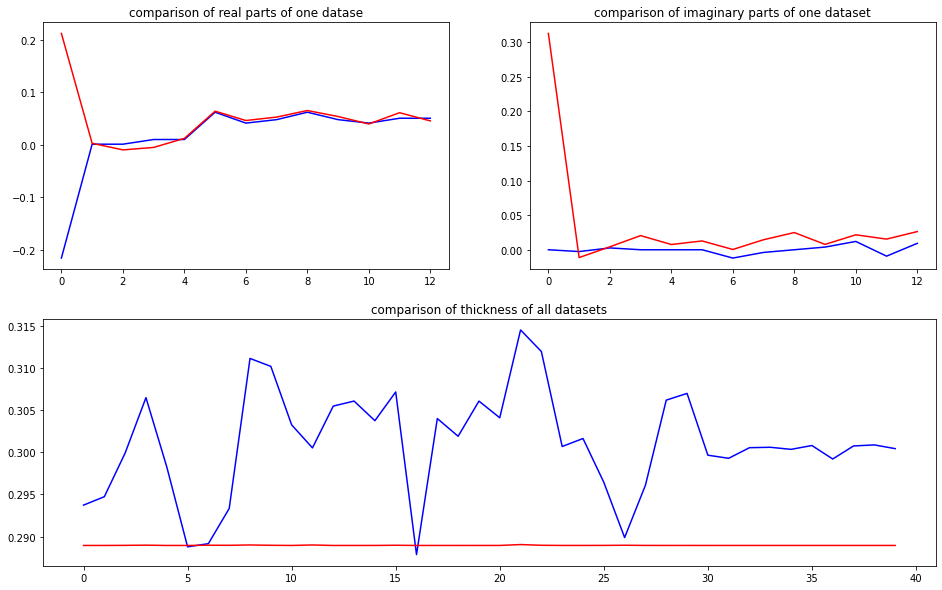

predicted thickness: 0.28823632


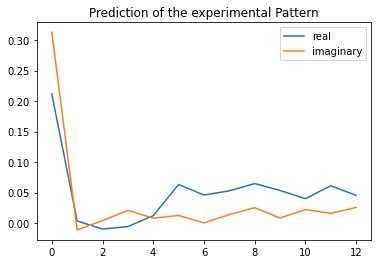

The offset applied on thickness: 0.0006733556186188772

The offset applied on Ug: -3.211289285972996

Applied shift of unit cell origin (fractional coordinates): -0.19629299614346365 -0.009086729585994607
Ug[ 0 ]: 0.24679 3.14159  =>  0.24679 3.14159
Ug[ 1 ]: 0.00848 -2.01325  =>  0.00848 -2.07034
Ug[ 2 ]: 0.00848 2.01325  =>  0.00848 2.07034
Ug[ 3 ]: 0.00638 1.23335  =>  0.00638 0.0
Ug[ 4 ]: 0.00638 -1.23335  =>  0.00638 -0.0
Ug[ 5 ]: 0.04992 -0.11419  =>  0.04992 0.0
Ug[ 6 ]: 0.03782 -0.29058  =>  0.03782 -1.46683
Ug[ 7 ]: 0.04374 0.06282  =>  0.04374 1.35325
Ug[ 8 ]: 0.04992 0.11419  =>  0.04992 -0.0
Ug[ 9 ]: 0.04374 -0.06282  =>  0.04374 -1.35325
Ug[ 10 ]: 0.03782 0.29058  =>  0.03782 1.46683
Ug[ 11 ]: 0.0429 -0.13527  =>  0.0429 2.33142
Ug[ 12 ]: 0.0429 0.13527  =>  0.0429 -2.33142
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

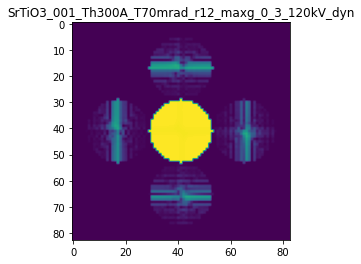

X_sim.max(): 0.9998800625095677
>>>replaced the 31. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 972ms/step - loss: 0.0228 - mean_absolute_error: 0.0454 - acc: 0.2100 - val_loss: 0.0173 - val_mean_absolute_error: 0.0458 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 3s 602ms/step - loss: 0.0226 - mean_absolute_error: 0.0439 - acc: 0.2100 - val_loss: 0.0175 - val_mean_absolute_error: 0.0466 - val_acc: 0.0250
Epoch 3/5
5/5 [==============================] - 3s 572ms/step - loss: 0.0229 - mean_absolute_error: 0.0443 - acc: 0.4400 - val_loss: 0.0169 - val_mean_absolute_error: 0.0441 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 4s 798ms/step - loss: 0.0229 - mean_absolute_error: 0.0458 - acc: 0.3700 - val_loss: 0.0170 - val_mean_absolute_error: 0.0451 - val_acc: 0.0250
Epoch 5/5
5/5 [==============================] - 4s 803ms/step - loss: 0.0227 - mean_absolute_error: 0.0440 - acc: 0.5300 - val_loss: 0.0168 - val_mean_abso

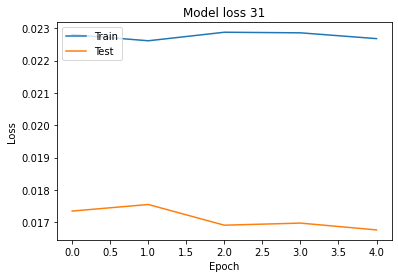

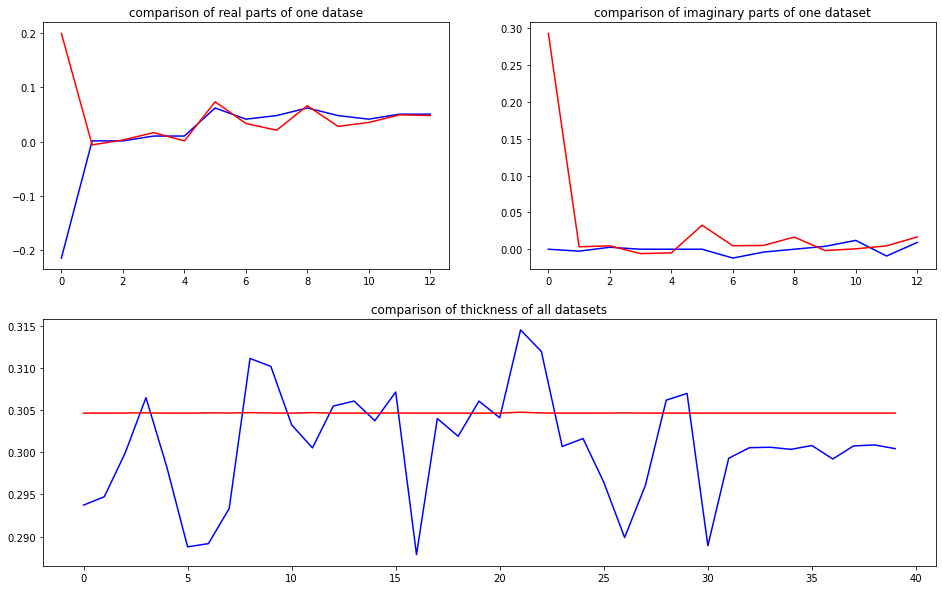

predicted thickness: 0.30397177


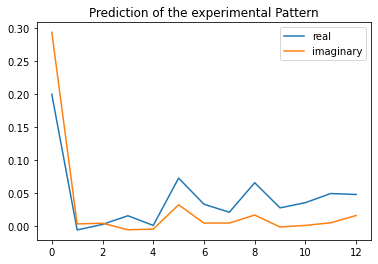

The offset applied on thickness: -0.0006951815056207431

The offset applied on Ug: -2.281656418535752

Applied shift of unit cell origin (fractional coordinates): 0.015047406137232228 0.009077877653681168
Ug[ 0 ]: 0.0878 3.14159  =>  0.0878 3.14159
Ug[ 1 ]: 0.00176 -2.82331  =>  0.00176 -2.76627
Ug[ 2 ]: 0.00176 2.82331  =>  0.00176 2.76627
Ug[ 3 ]: 0.00807 -0.09455  =>  0.00807 -0.0
Ug[ 4 ]: 0.00807 0.09455  =>  0.00807 0.0
Ug[ 5 ]: 0.0571 0.11408  =>  0.0571 0.0
Ug[ 6 ]: 0.03167 0.05928  =>  0.03167 0.09679
Ug[ 7 ]: 0.02316 0.14231  =>  0.02316 -0.00927
Ug[ 8 ]: 0.0571 -0.11408  =>  0.0571 0.0
Ug[ 9 ]: 0.02316 -0.14231  =>  0.02316 0.00927
Ug[ 10 ]: 0.03167 -0.05928  =>  0.03167 -0.09679
Ug[ 11 ]: 0.04324 -0.12507  =>  0.04324 -0.31416
Ug[ 12 ]: 0.04324 0.12507  =>  0.04324 0.31416
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

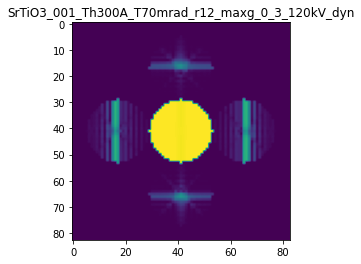

X_sim.max(): 0.9997819655018423
>>>replaced the 32. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 928ms/step - loss: 0.0229 - mean_absolute_error: 0.0458 - acc: 0.2500 - val_loss: 0.0175 - val_mean_absolute_error: 0.0455 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0227 - mean_absolute_error: 0.0453 - acc: 0.4400 - val_loss: 0.0165 - val_mean_absolute_error: 0.0441 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0228 - mean_absolute_error: 0.0453 - acc: 0.5700 - val_loss: 0.0172 - val_mean_absolute_error: 0.0475 - val_acc: 0.0250
Epoch 4/5
5/5 [==============================] - 3s 772ms/step - loss: 0.0226 - mean_absolute_error: 0.0449 - acc: 0.2000 - val_loss: 0.0168 - val_mean_absolute_error: 0.0466 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 3s 578ms/step - loss: 0.0227 - mean_absolute_error: 0.0447 - acc: 0.6300 - val_loss: 0.0170 - val_mean_abso

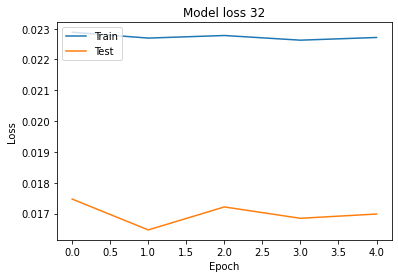

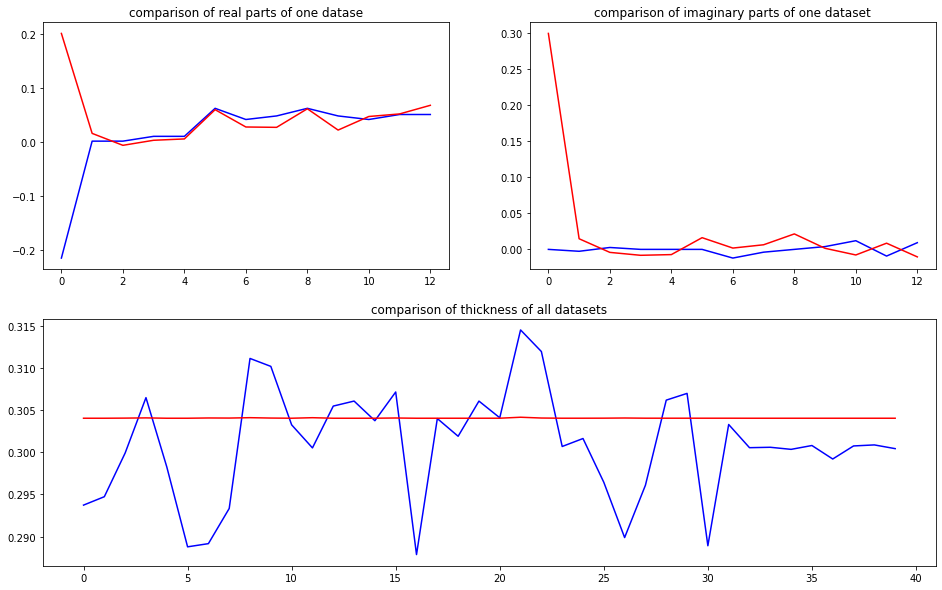

predicted thickness: 0.30338725


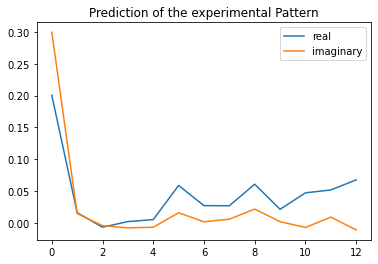

The offset applied on thickness: 7.050980492217085e-05

The offset applied on Ug: 0.6842017028773867

Applied shift of unit cell origin (fractional coordinates): 0.020454529396820416 -0.0038926002383835967
Ug[ 0 ]: 0.28936 0.0  =>  0.28936 0.0
Ug[ 1 ]: 0.01081 1.11038  =>  0.01081 1.08592
Ug[ 2 ]: 0.01081 -1.11038  =>  0.01081 -1.08592
Ug[ 3 ]: 0.00372 -0.12852  =>  0.00372 0.0
Ug[ 4 ]: 0.00372 0.12852  =>  0.00372 -0.0
Ug[ 5 ]: 0.06256 -0.04892  =>  0.06256 -0.0
Ug[ 6 ]: 0.0384 0.10151  =>  0.0384 0.25448
Ug[ 7 ]: 0.02467 0.08369  =>  0.02467 -0.02038
Ug[ 8 ]: 0.06256 0.04892  =>  0.06256 0.0
Ug[ 9 ]: 0.02467 -0.08369  =>  0.02467 0.02038
Ug[ 10 ]: 0.0384 -0.10151  =>  0.0384 -0.25448
Ug[ 11 ]: 0.06287 0.14859  =>  0.06287 -0.10845
Ug[ 12 ]: 0.06287 -0.14859  =>  0.06287 0.10845
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

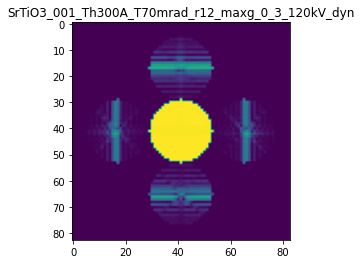

X_sim.max(): 0.9994735796058511
>>>replaced the 33. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 925ms/step - loss: 0.0226 - mean_absolute_error: 0.0441 - acc: 0.3500 - val_loss: 0.0169 - val_mean_absolute_error: 0.0443 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0225 - mean_absolute_error: 0.0430 - acc: 0.6000 - val_loss: 0.0167 - val_mean_absolute_error: 0.0436 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0226 - mean_absolute_error: 0.0429 - acc: 0.4200 - val_loss: 0.0171 - val_mean_absolute_error: 0.0443 - val_acc: 0.0250
Epoch 4/5
5/5 [==============================] - 3s 679ms/step - loss: 0.0226 - mean_absolute_error: 0.0429 - acc: 0.4100 - val_loss: 0.0166 - val_mean_absolute_error: 0.0429 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0226 - mean_absolute_error: 0.0426 - acc: 0.6300 - val_loss: 0.0166 - val_mean_abso

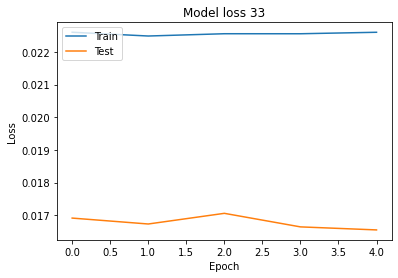

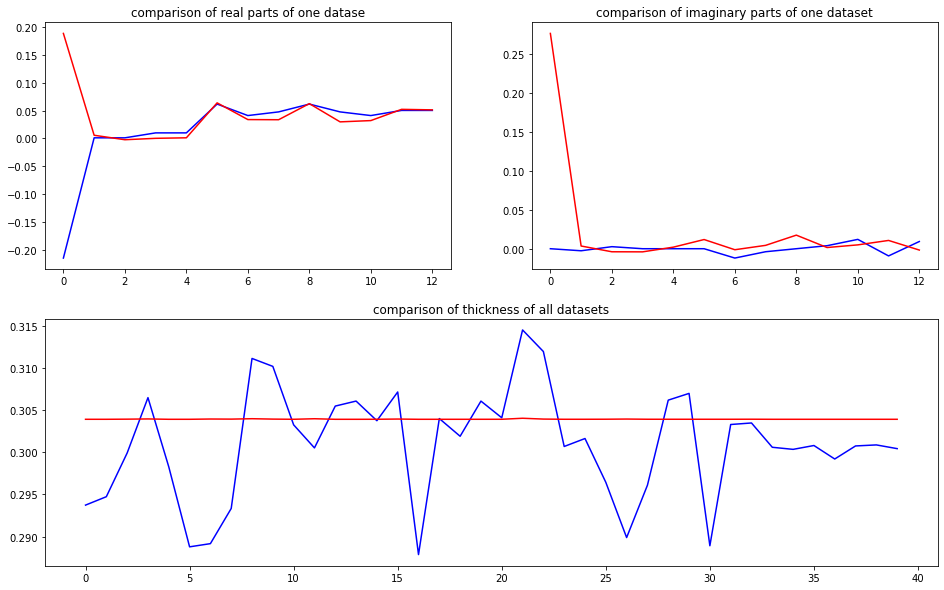

predicted thickness: 0.30328804


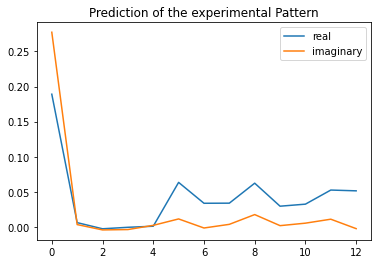

The offset applied on thickness: 0.0003014701573750067

The offset applied on Ug: 2.8303943529998574

Applied shift of unit cell origin (fractional coordinates): 0.2278813188254819 -0.0033381836607397036
Ug[ 0 ]: 0.50778 0.0  =>  0.50778 0.0
Ug[ 1 ]: 0.00433 1.09035  =>  0.00433 1.06937
Ug[ 2 ]: 0.00433 -1.09035  =>  0.00433 -1.06937
Ug[ 3 ]: 0.00302 -1.43182  =>  0.00302 -0.0
Ug[ 4 ]: 0.00302 1.43182  =>  0.00302 0.0
Ug[ 5 ]: 0.0749 -0.04195  =>  0.0749 -0.0
Ug[ 6 ]: 0.03651 -0.09149  =>  0.03651 1.36131
Ug[ 7 ]: 0.03475 0.04172  =>  0.03475 -1.36912
Ug[ 8 ]: 0.0749 0.04195  =>  0.0749 0.0
Ug[ 9 ]: 0.03475 -0.04172  =>  0.03475 1.36912
Ug[ 10 ]: 0.03651 0.09149  =>  0.03651 -1.36131
Ug[ 11 ]: 0.06036 0.11941  =>  0.06036 -2.74423
Ug[ 12 ]: 0.06036 -0.11941  =>  0.06036 2.74423
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

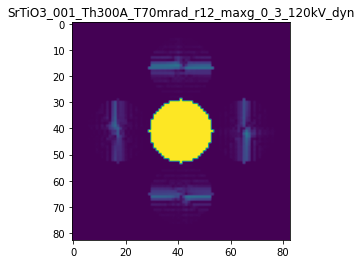

X_sim.max(): 0.9998933282257367
>>>replaced the 34. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 926ms/step - loss: 0.0226 - mean_absolute_error: 0.0426 - acc: 0.5200 - val_loss: 0.0138 - val_mean_absolute_error: 0.0429 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 3s 598ms/step - loss: 0.0227 - mean_absolute_error: 0.0442 - acc: 0.2000 - val_loss: 0.0138 - val_mean_absolute_error: 0.0441 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 689ms/step - loss: 0.0227 - mean_absolute_error: 0.0452 - acc: 0.6200 - val_loss: 0.0136 - val_mean_absolute_error: 0.0411 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 5s 1s/step - loss: 0.0226 - mean_absolute_error: 0.0451 - acc: 0.2400 - val_loss: 0.0137 - val_mean_absolute_error: 0.0433 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0227 - mean_absolute_error: 0.0439 - acc: 0.5300 - val_loss: 0.0130 - val_mean_ab

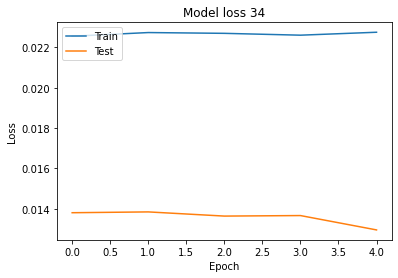

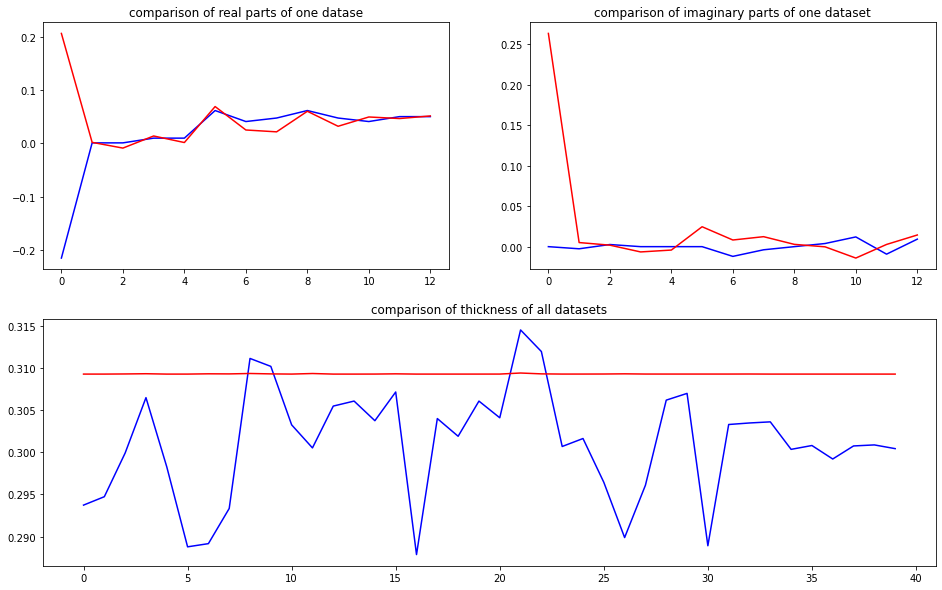

predicted thickness: 0.30867073


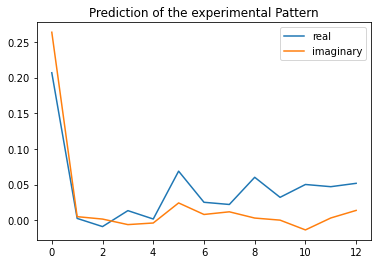

The offset applied on thickness: 0.00039269101963262297

The offset applied on Ug: -1.1526321357814644

Applied shift of unit cell origin (fractional coordinates): 0.026111409471502513 0.013034270002134508
Ug[ 0 ]: 0.07742 0.0  =>  0.07742 0.0
Ug[ 1 ]: 0.00363 2.64685  =>  0.00363 2.72875
Ug[ 2 ]: 0.00363 -2.64685  =>  0.00363 -2.72875
Ug[ 3 ]: 0.00759 -0.16406  =>  0.00759 -0.0
Ug[ 4 ]: 0.00759 0.16406  =>  0.00759 0.0
Ug[ 5 ]: 0.06018 0.16379  =>  0.06018 -0.0
Ug[ 6 ]: 0.03763 0.31967  =>  0.03763 0.40183
Ug[ 7 ]: 0.02687 0.22683  =>  0.02687 -0.01913
Ug[ 8 ]: 0.06018 -0.16379  =>  0.06018 0.0
Ug[ 9 ]: 0.02687 -0.22683  =>  0.02687 0.01913
Ug[ 10 ]: 0.03763 -0.31967  =>  0.03763 -0.40183
Ug[ 11 ]: 0.04676 -0.10691  =>  0.04676 -0.43503
Ug[ 12 ]: 0.04676 0.10691  =>  0.04676 0.43503
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

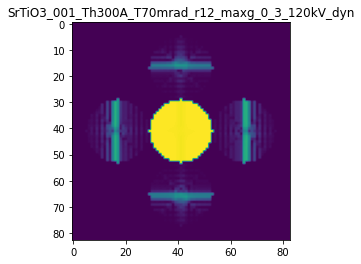

X_sim.max(): 0.9996801624519747
>>>replaced the 35. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 947ms/step - loss: 0.0227 - mean_absolute_error: 0.0450 - acc: 0.3400 - val_loss: 0.0136 - val_mean_absolute_error: 0.0430 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 533ms/step - loss: 0.0226 - mean_absolute_error: 0.0439 - acc: 0.6300 - val_loss: 0.0131 - val_mean_absolute_error: 0.0417 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0227 - mean_absolute_error: 0.0429 - acc: 0.6300 - val_loss: 0.0139 - val_mean_absolute_error: 0.0449 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0226 - mean_absolute_error: 0.0439 - acc: 0.4900 - val_loss: 0.0135 - val_mean_absolute_error: 0.0422 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 904ms/step - loss: 0.0226 - mean_absolute_error: 0.0434 - acc: 0.6300 - val_loss: 0.0138 - val_mean_

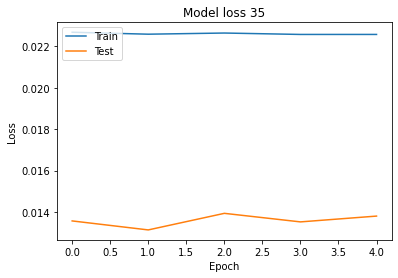

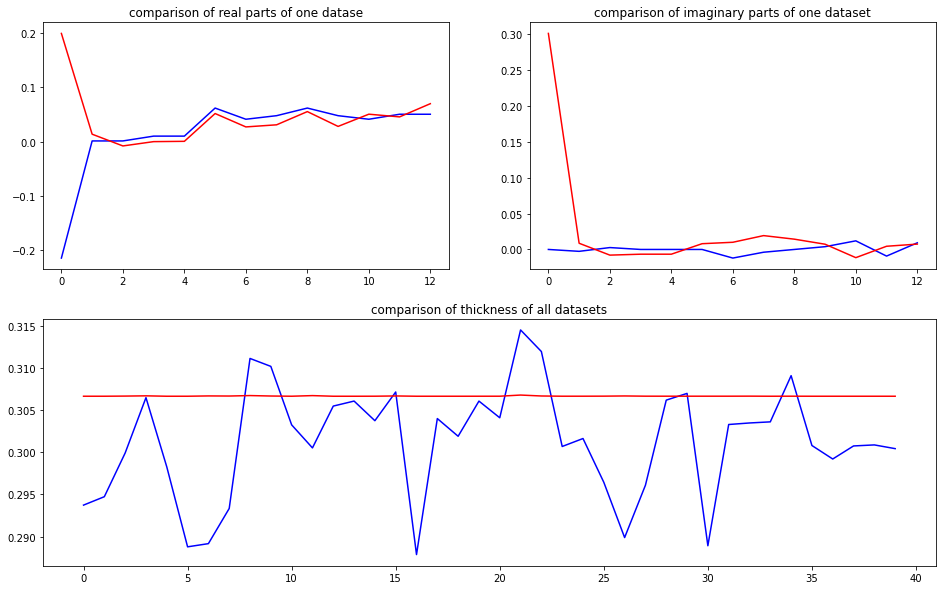

predicted thickness: 0.3060506


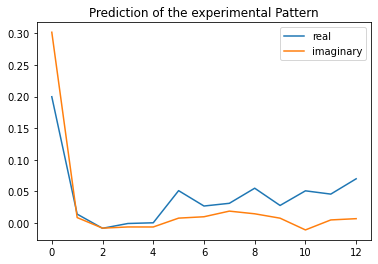

The offset applied on thickness: 0.0003850455041528256

The offset applied on Ug: -0.2682282367207012

Applied shift of unit cell origin (fractional coordinates): -0.4777756331865955 -0.0050918471094882215
Ug[ 0 ]: 0.16466 0.0  =>  0.16466 0.0
Ug[ 1 ]: 0.00882 1.24254  =>  0.00882 1.21055
Ug[ 2 ]: 0.00882 -1.24254  =>  0.00882 -1.21055
Ug[ 3 ]: 0.00017 3.00195  =>  0.00017 -0.0
Ug[ 4 ]: 0.00017 -3.00195  =>  0.00017 0.0
Ug[ 5 ]: 0.05247 -0.06399  =>  0.05247 0.0
Ug[ 6 ]: 0.03991 0.27019  =>  0.03991 -2.69977
Ug[ 7 ]: 0.02974 0.18651  =>  0.02974 -3.06273
Ug[ 8 ]: 0.05247 0.06399  =>  0.05247 0.0
Ug[ 9 ]: 0.02974 -0.18651  =>  0.02974 3.06273
Ug[ 10 ]: 0.03991 -0.27019  =>  0.03991 2.69977
Ug[ 11 ]: 0.05694 -0.0112  =>  0.05694 -0.29048
Ug[ 12 ]: 0.05694 0.0112  =>  0.05694 0.29048
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

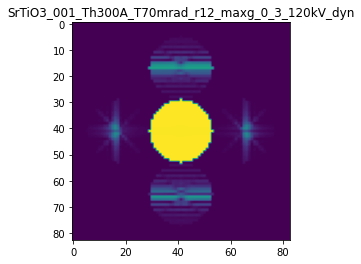

X_sim.max(): 0.9997424948638318
>>>replaced the 36. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 939ms/step - loss: 0.0209 - mean_absolute_error: 0.0438 - acc: 0.2500 - val_loss: 0.0134 - val_mean_absolute_error: 0.0425 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 535ms/step - loss: 0.0210 - mean_absolute_error: 0.0439 - acc: 0.6400 - val_loss: 0.0128 - val_mean_absolute_error: 0.0415 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 561ms/step - loss: 0.0210 - mean_absolute_error: 0.0455 - acc: 0.4600 - val_loss: 0.0134 - val_mean_absolute_error: 0.0446 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 729ms/step - loss: 0.0211 - mean_absolute_error: 0.0443 - acc: 0.6400 - val_loss: 0.0122 - val_mean_absolute_error: 0.0409 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0210 - mean_absolute_error: 0.0452 - acc: 0.6400 - val_loss: 0.0135 - val_mean_absolut

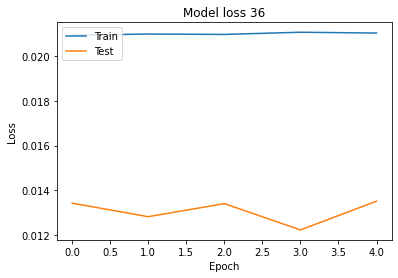

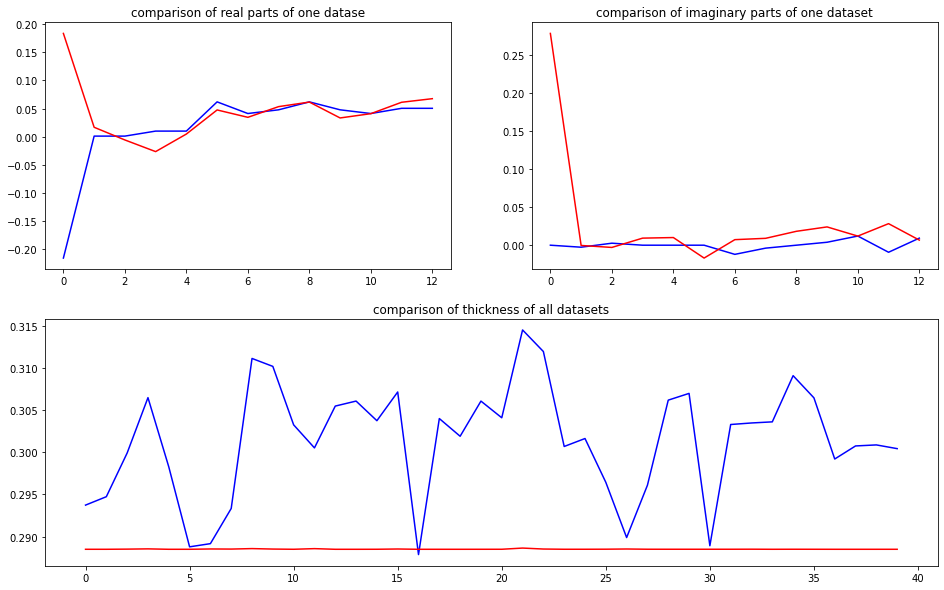

predicted thickness: 0.28794733


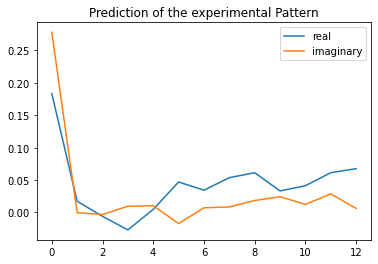

The offset applied on thickness: 5.2441051216928656e-05

The offset applied on Ug: -2.9047164869342734

Applied shift of unit cell origin (fractional coordinates): 0.4803312055870035 -0.028162459563918628
Ug[ 0 ]: 0.13894 3.14159  =>  0.13894 3.14159
Ug[ 1 ]: 0.0053 0.20013  =>  0.0053 0.02318
Ug[ 2 ]: 0.0053 -0.20013  =>  0.0053 -0.02318
Ug[ 3 ]: 0.01253 -3.01801  =>  0.01253 -0.0
Ug[ 4 ]: 0.01253 3.01801  =>  0.01253 0.0
Ug[ 5 ]: 0.04753 -0.3539  =>  0.04753 0.0
Ug[ 6 ]: 0.03341 -0.05997  =>  0.03341 3.13499
Ug[ 7 ]: 0.03778 -0.23829  =>  0.03778 -3.07935
Ug[ 8 ]: 0.04753 0.3539  =>  0.04753 0.0
Ug[ 9 ]: 0.03778 0.23829  =>  0.03778 3.07935
Ug[ 10 ]: 0.03341 0.05997  =>  0.03341 -3.13499
Ug[ 11 ]: 0.05231 0.21265  =>  0.05231 0.45982
Ug[ 12 ]: 0.05231 -0.21265  =>  0.05231 -0.45982
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

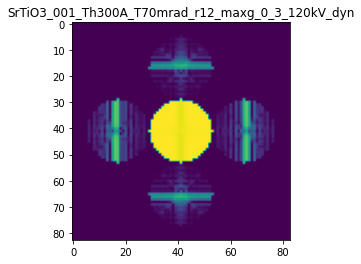

X_sim.max(): 0.9996111507328131
>>>replaced the 37. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 944ms/step - loss: 0.0207 - mean_absolute_error: 0.0436 - acc: 0.6500 - val_loss: 0.0130 - val_mean_absolute_error: 0.0438 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0209 - mean_absolute_error: 0.0443 - acc: 0.6500 - val_loss: 0.0128 - val_mean_absolute_error: 0.0410 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0208 - mean_absolute_error: 0.0431 - acc: 0.6500 - val_loss: 0.0129 - val_mean_absolute_error: 0.0422 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0207 - mean_absolute_error: 0.0419 - acc: 0.6500 - val_loss: 0.0128 - val_mean_absolute_error: 0.0426 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 974ms/step - loss: 0.0207 - mean_absolute_error: 0.0419 - acc: 0.6500 - val_loss: 0.0126 - val_mean_abso

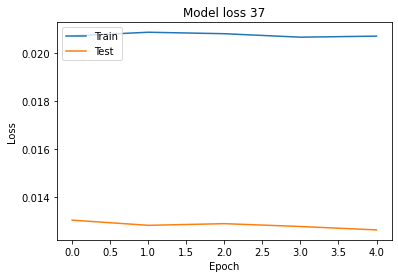

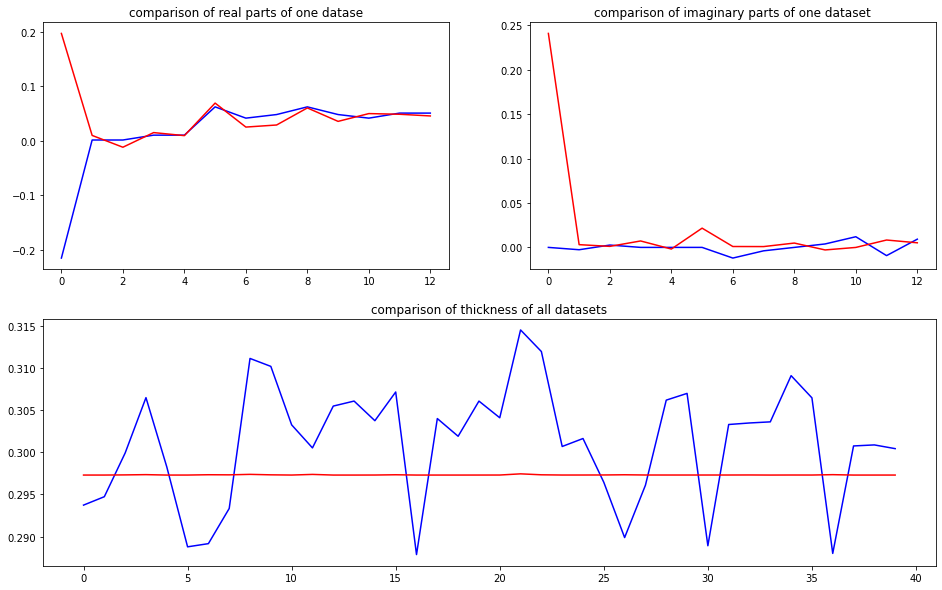

predicted thickness: 0.2967798


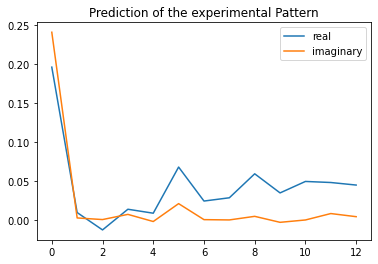

The offset applied on thickness: 0.0006398838609847772

The offset applied on Ug: -1.9930264257626642

Applied shift of unit cell origin (fractional coordinates): -0.059028501922662874 0.01015921495996661
Ug[ 0 ]: 0.00349 0.0  =>  0.00349 0.0
Ug[ 1 ]: 0.00178 2.48169  =>  0.00178 2.54552
Ug[ 2 ]: 0.00178 -2.48169  =>  0.00178 -2.54552
Ug[ 3 ]: 0.01218 0.37089  =>  0.01218 -0.0
Ug[ 4 ]: 0.01218 -0.37089  =>  0.01218 0.0
Ug[ 5 ]: 0.05579 0.12766  =>  0.05579 -0.0
Ug[ 6 ]: 0.03428 0.04888  =>  0.03428 -0.38584
Ug[ 7 ]: 0.03005 0.06211  =>  0.03005 0.36917
Ug[ 8 ]: 0.05579 -0.12766  =>  0.05579 0.0
Ug[ 9 ]: 0.03005 -0.06211  =>  0.03005 -0.36917
Ug[ 10 ]: 0.03428 -0.04888  =>  0.03428 0.38584
Ug[ 11 ]: 0.04245 0.04087  =>  0.04245 0.78265
Ug[ 12 ]: 0.04245 -0.04087  =>  0.04245 -0.78265
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

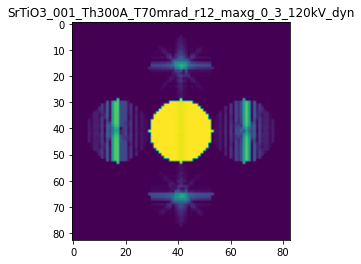

X_sim.max(): 0.9995698048685184
>>>replaced the 38. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0208 - mean_absolute_error: 0.0419 - acc: 0.6500 - val_loss: 0.0128 - val_mean_absolute_error: 0.0412 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 641ms/step - loss: 0.0207 - mean_absolute_error: 0.0427 - acc: 0.6500 - val_loss: 0.0127 - val_mean_absolute_error: 0.0411 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 571ms/step - loss: 0.0207 - mean_absolute_error: 0.0419 - acc: 0.6500 - val_loss: 0.0130 - val_mean_absolute_error: 0.0411 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 769ms/step - loss: 0.0207 - mean_absolute_error: 0.0410 - acc: 0.6500 - val_loss: 0.0127 - val_mean_absolute_error: 0.0394 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 967ms/step - loss: 0.0208 - mean_absolute_error: 0.0414 - acc: 0.6500 - val_loss: 0.0125 - val_mean_absolut

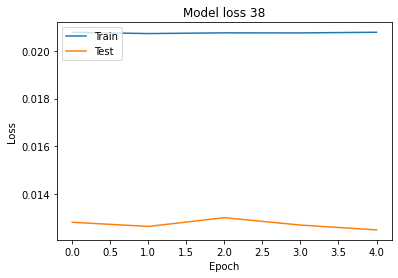

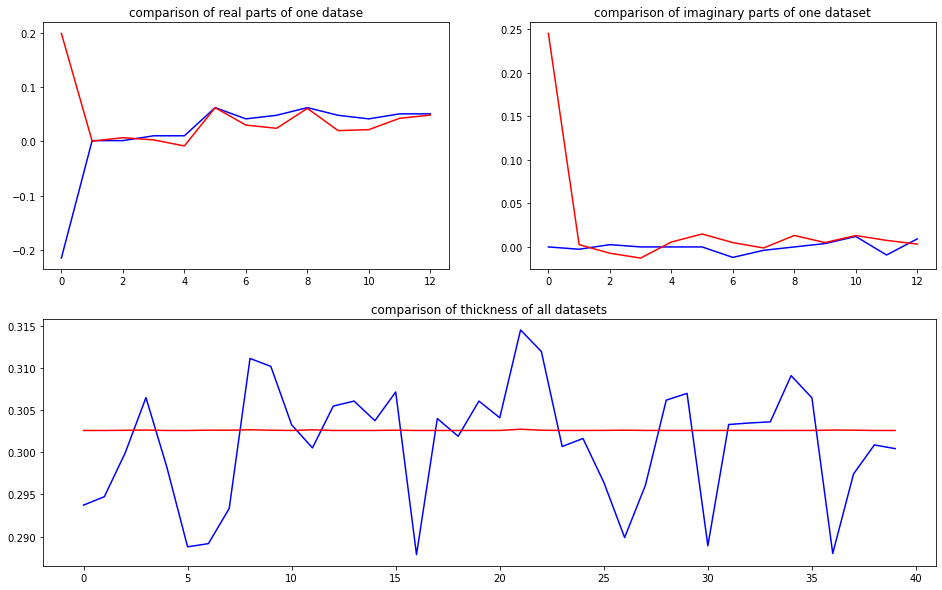

predicted thickness: 0.30209124


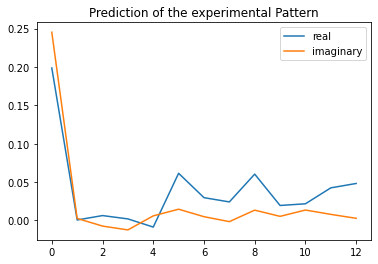

The offset applied on thickness: 0.0005092420222457554

The offset applied on Ug: -0.3404846343091227

Applied shift of unit cell origin (fractional coordinates): 0.30626952260433293 0.0007919612814914381
Ug[ 0 ]: 0.16475 0.0  =>  0.16475 0.0
Ug[ 1 ]: 0.00608 0.96596  =>  0.00608 0.97093
Ug[ 2 ]: 0.00608 -0.96596  =>  0.00608 -0.97093
Ug[ 3 ]: 0.00976 -1.92435  =>  0.00976 -0.0
Ug[ 4 ]: 0.00976 1.92435  =>  0.00976 0.0
Ug[ 5 ]: 0.05956 0.00995  =>  0.05956 0.0
Ug[ 6 ]: 0.02579 -0.17052  =>  0.02579 1.74886
Ug[ 7 ]: 0.02192 -0.15879  =>  0.02192 -2.08812
Ug[ 8 ]: 0.05956 -0.00995  =>  0.05956 0.0
Ug[ 9 ]: 0.02192 0.15879  =>  0.02192 2.08812
Ug[ 10 ]: 0.02579 0.17052  =>  0.02579 -1.74886
Ug[ 11 ]: 0.04468 0.0591  =>  0.04468 2.49359
Ug[ 12 ]: 0.04468 -0.0591  =>  0.04468 -2.49359
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

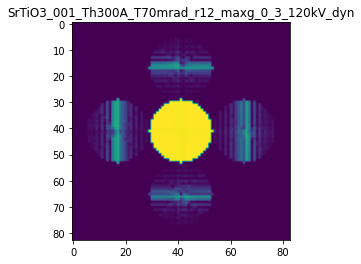

X_sim.max(): 0.9995635632238055
>>>replaced the 39. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 989ms/step - loss: 0.0207 - mean_absolute_error: 0.0419 - acc: 0.6600 - val_loss: 0.0128 - val_mean_absolute_error: 0.0421 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 578ms/step - loss: 0.0209 - mean_absolute_error: 0.0414 - acc: 0.6600 - val_loss: 0.0121 - val_mean_absolute_error: 0.0393 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 569ms/step - loss: 0.0208 - mean_absolute_error: 0.0430 - acc: 0.6600 - val_loss: 0.0130 - val_mean_absolute_error: 0.0424 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 750ms/step - loss: 0.0207 - mean_absolute_error: 0.0426 - acc: 0.6600 - val_loss: 0.0128 - val_mean_absolute_error: 0.0412 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 971ms/step - loss: 0.0208 - mean_absolute_error: 0.0419 - acc: 0.6600 - val_loss: 0.0132 - val_mean_abso

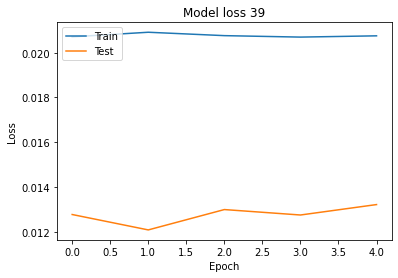

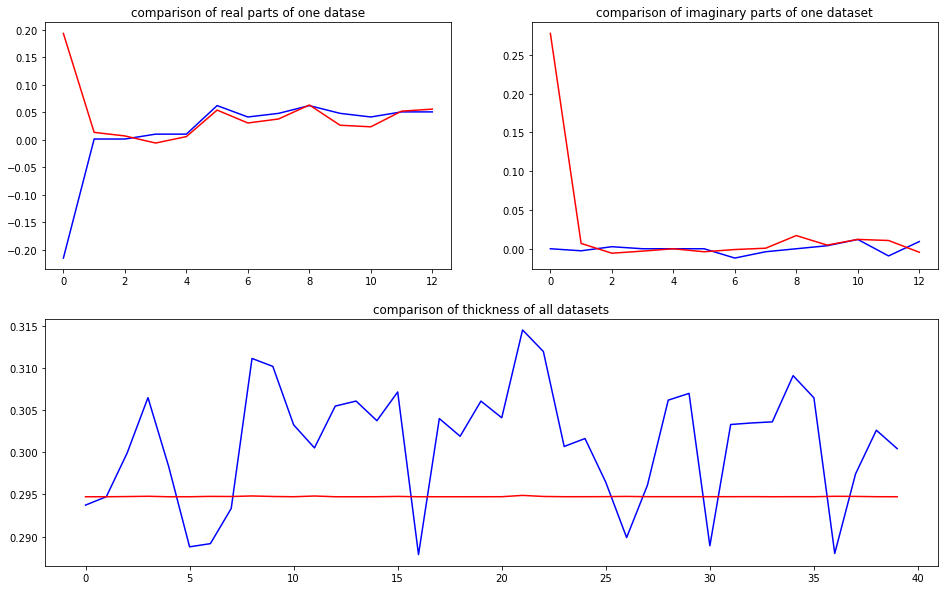

predicted thickness: 0.2942363


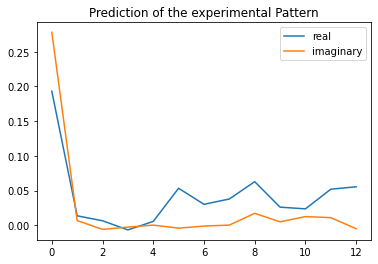

The offset applied on thickness: -0.0002612219029546021

The offset applied on Ug: -0.8893663651911535

Applied shift of unit cell origin (fractional coordinates): 0.30878856202601257 -0.01453637610805547
Ug[ 0 ]: 0.09121 0.0  =>  0.09121 0.0
Ug[ 1 ]: 0.0118 0.56326  =>  0.0118 0.47192
Ug[ 2 ]: 0.0118 -0.56326  =>  0.0118 -0.47192
Ug[ 3 ]: 0.00158 -1.94018  =>  0.00158 -0.0
Ug[ 4 ]: 0.00158 1.94018  =>  0.00158 0.0
Ug[ 5 ]: 0.05585 -0.18267  =>  0.05585 0.0
Ug[ 6 ]: 0.02713 -0.25755  =>  0.02713 1.77396
Ug[ 7 ]: 0.03117 -0.08469  =>  0.03117 -1.93353
Ug[ 8 ]: 0.05585 0.18267  =>  0.05585 -0.0
Ug[ 9 ]: 0.03117 0.08469  =>  0.03117 1.93353
Ug[ 10 ]: 0.02713 0.25755  =>  0.02713 -1.77396
Ug[ 11 ]: 0.05174 0.1569  =>  0.05174 2.55973
Ug[ 12 ]: 0.05174 -0.1569  =>  0.05174 -2.55973
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

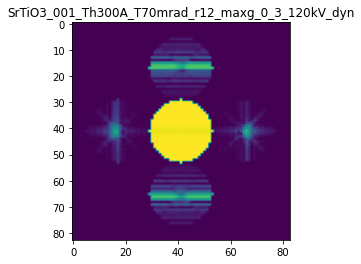

X_sim.max(): 0.9995845942429079
>>>replaced the 40. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0207 - mean_absolute_error: 0.0412 - acc: 0.6600 - val_loss: 0.0131 - val_mean_absolute_error: 0.0417 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 581ms/step - loss: 0.0207 - mean_absolute_error: 0.0411 - acc: 0.6600 - val_loss: 0.0127 - val_mean_absolute_error: 0.0409 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 768ms/step - loss: 0.0208 - mean_absolute_error: 0.0402 - acc: 0.6600 - val_loss: 0.0124 - val_mean_absolute_error: 0.0396 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 5s 1s/step - loss: 0.0209 - mean_absolute_error: 0.0438 - acc: 0.6600 - val_loss: 0.0129 - val_mean_absolute_error: 0.0421 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 958ms/step - loss: 0.0209 - mean_absolute_error: 0.0426 - acc: 0.6600 - val_loss: 0.0123 - val_mean_absolute_e

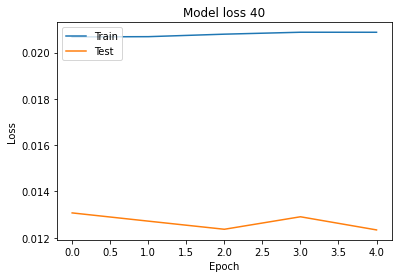

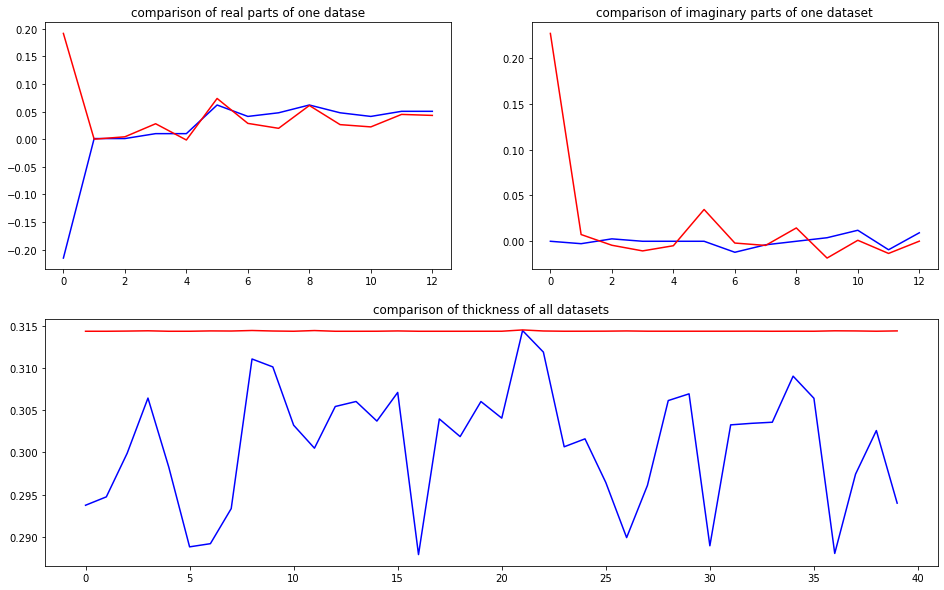

predicted thickness: 0.31397027


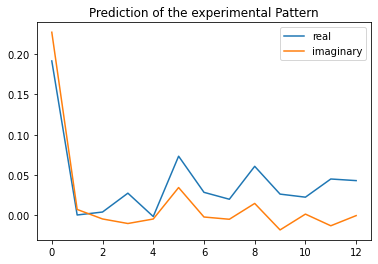

The offset applied on thickness: 0.00023273381051178022

The offset applied on Ug: 1.7693254665834364

Applied shift of unit cell origin (fractional coordinates): 0.02253191805034748 0.01345579344330266
Ug[ 0 ]: 0.34772 0.0  =>  0.34772 0.0
Ug[ 1 ]: 0.00637 1.19146  =>  0.00637 1.276
Ug[ 2 ]: 0.00637 -1.19146  =>  0.00637 -1.276
Ug[ 3 ]: 0.01395 -0.14157  =>  0.01395 -0.0
Ug[ 4 ]: 0.01395 0.14157  =>  0.01395 0.0
Ug[ 5 ]: 0.07747 0.16909  =>  0.07747 0.0
Ug[ 6 ]: 0.02677 -0.0555  =>  0.02677 0.00152
Ug[ 7 ]: 0.02517 0.24139  =>  0.02517 0.01527
Ug[ 8 ]: 0.07747 -0.16909  =>  0.07747 -0.0
Ug[ 9 ]: 0.02517 -0.24139  =>  0.02517 -0.01527
Ug[ 10 ]: 0.02677 0.0555  =>  0.02677 -0.00152
Ug[ 11 ]: 0.04804 -0.1237  =>  0.04804 -0.40685
Ug[ 12 ]: 0.04804 0.1237  =>  0.04804 0.40685
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

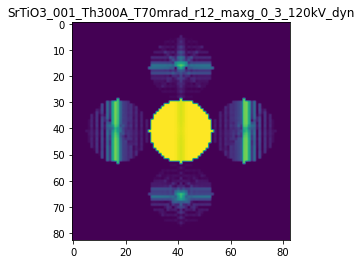

X_sim.max(): 0.9986898630802866
>>>replaced the 41. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 985ms/step - loss: 0.0186 - mean_absolute_error: 0.0408 - acc: 0.6600 - val_loss: 0.0115 - val_mean_absolute_error: 0.0402 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0187 - mean_absolute_error: 0.0402 - acc: 0.6600 - val_loss: 0.0110 - val_mean_absolute_error: 0.0385 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 3s 690ms/step - loss: 0.0187 - mean_absolute_error: 0.0390 - acc: 0.6600 - val_loss: 0.0112 - val_mean_absolute_error: 0.0388 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 4s 968ms/step - loss: 0.0186 - mean_absolute_error: 0.0397 - acc: 0.6600 - val_loss: 0.0111 - val_mean_absolute_error: 0.0394 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0186 - mean_absolute_error: 0.0394 - acc: 0.6600 - val_loss: 0.0110 - val_mean_absolut

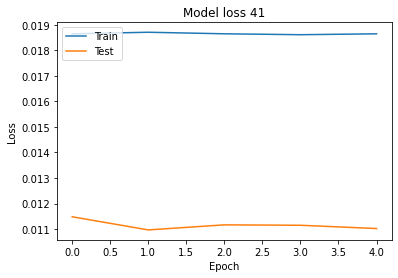

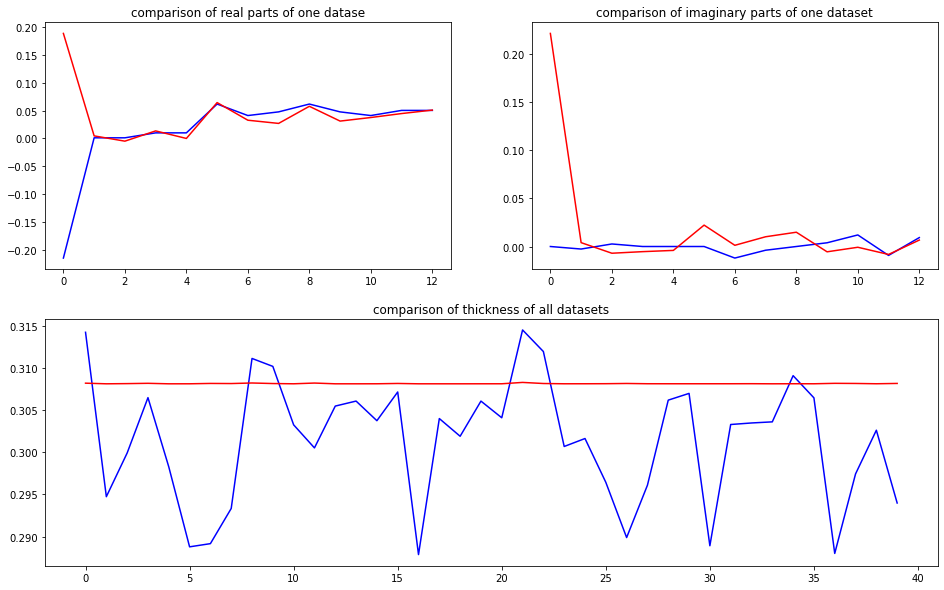

predicted thickness: 0.30768546


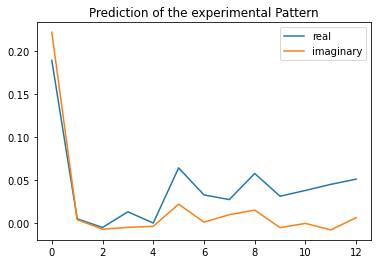

The offset applied on thickness: -0.0006631137669717204

The offset applied on Ug: 2.93932748969454

Applied shift of unit cell origin (fractional coordinates): 0.007133284639150044 0.00643358710783448
Ug[ 0 ]: 0.43855 0.0  =>  0.43855 0.0
Ug[ 1 ]: 0.00551 1.54693  =>  0.00551 1.58735
Ug[ 2 ]: 0.00551 -1.54693  =>  0.00551 -1.58735
Ug[ 3 ]: 0.0069 -0.04482  =>  0.0069 -0.0
Ug[ 4 ]: 0.0069 0.04482  =>  0.0069 0.0
Ug[ 5 ]: 0.07313 0.08085  =>  0.07313 0.0
Ug[ 6 ]: 0.03905 0.00017  =>  0.03905 0.00456
Ug[ 7 ]: 0.03281 0.22222  =>  0.03281 0.13698
Ug[ 8 ]: 0.07313 -0.08085  =>  0.07313 0.0
Ug[ 9 ]: 0.03281 -0.22222  =>  0.03281 -0.13698
Ug[ 10 ]: 0.03905 -0.00017  =>  0.03905 -0.00456
Ug[ 11 ]: 0.05561 -0.14961  =>  0.05561 -0.23925
Ug[ 12 ]: 0.05561 0.14961  =>  0.05561 0.23925
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

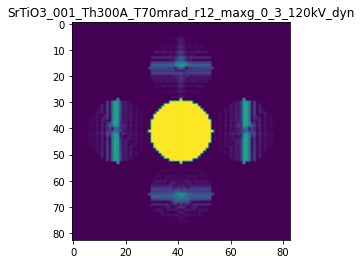

X_sim.max(): 0.9994866691938784
>>>replaced the 42. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 976ms/step - loss: 0.0187 - mean_absolute_error: 0.0398 - acc: 0.6500 - val_loss: 0.0097 - val_mean_absolute_error: 0.0364 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 3s 705ms/step - loss: 0.0186 - mean_absolute_error: 0.0387 - acc: 0.6500 - val_loss: 0.0097 - val_mean_absolute_error: 0.0367 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 4s 779ms/step - loss: 0.0186 - mean_absolute_error: 0.0382 - acc: 0.6500 - val_loss: 0.0096 - val_mean_absolute_error: 0.0360 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 5s 996ms/step - loss: 0.0186 - mean_absolute_error: 0.0378 - acc: 0.6500 - val_loss: 0.0094 - val_mean_absolute_error: 0.0356 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 5s 971ms/step - loss: 0.0186 - mean_absolute_error: 0.0373 - acc: 0.6500 - val_loss: 0.0097 - val_mean_abso

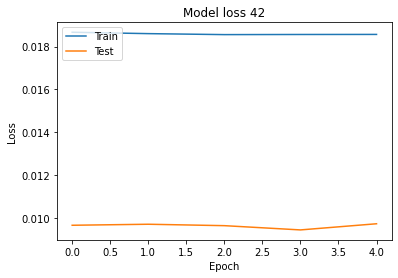

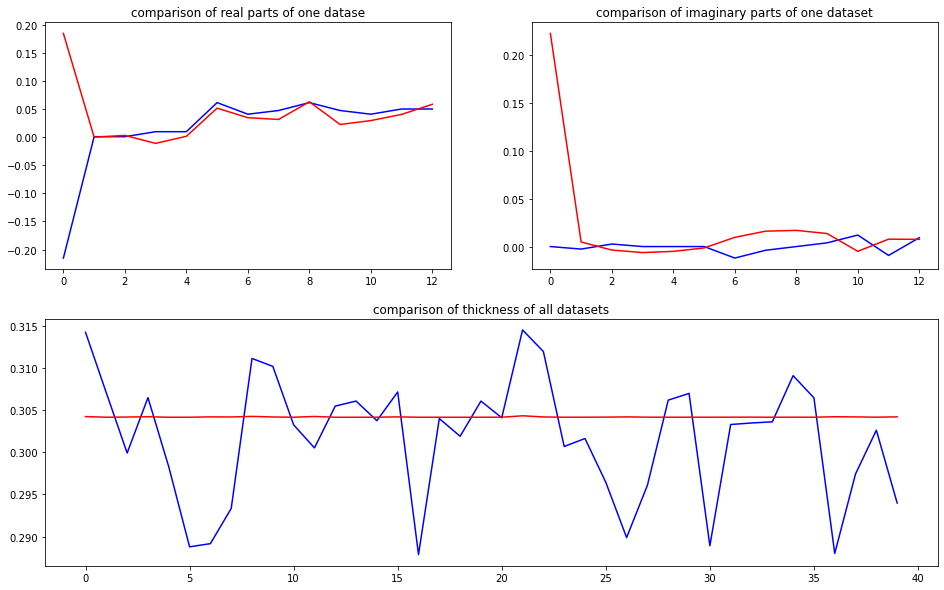

predicted thickness: 0.30374148


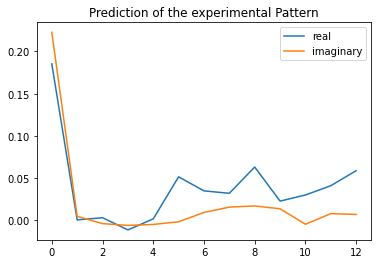

The offset applied on thickness: 0.0008907036575623193

The offset applied on Ug: -2.8744325828918553

Applied shift of unit cell origin (fractional coordinates): 0.47491699099546386 -0.013331491244080939
Ug[ 0 ]: 0.05601 3.14159  =>  0.05601 3.14159
Ug[ 1 ]: 0.00466 1.164  =>  0.00466 1.08023
Ug[ 2 ]: 0.00466 -1.164  =>  0.00466 -1.08023
Ug[ 3 ]: 0.00501 -2.98399  =>  0.00501 -0.0
Ug[ 4 ]: 0.00501 2.98399  =>  0.00501 0.0
Ug[ 5 ]: 0.0481 -0.16753  =>  0.0481 0.0
Ug[ 6 ]: 0.03005 0.22077  =>  0.03005 -2.99466
Ug[ 7 ]: 0.02465 0.01454  =>  0.02465 -2.88569
Ug[ 8 ]: 0.0481 0.16753  =>  0.0481 -0.0
Ug[ 9 ]: 0.02465 -0.01454  =>  0.02465 2.88569
Ug[ 10 ]: 0.03005 -0.22077  =>  0.03005 2.99466
Ug[ 11 ]: 0.04247 0.04756  =>  0.04247 0.36276
Ug[ 12 ]: 0.04247 -0.04756  =>  0.04247 -0.36276
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

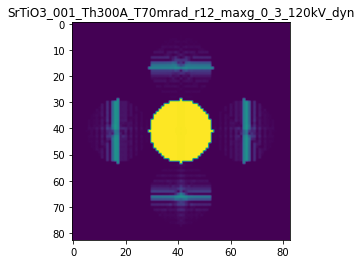

X_sim.max(): 0.9997414341396476
>>>replaced the 43. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 931ms/step - loss: 0.0186 - mean_absolute_error: 0.0381 - acc: 0.6500 - val_loss: 0.0096 - val_mean_absolute_error: 0.0364 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 3s 683ms/step - loss: 0.0186 - mean_absolute_error: 0.0384 - acc: 0.6500 - val_loss: 0.0097 - val_mean_absolute_error: 0.0362 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 3s 664ms/step - loss: 0.0187 - mean_absolute_error: 0.0392 - acc: 0.6500 - val_loss: 0.0097 - val_mean_absolute_error: 0.0368 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 4s 942ms/step - loss: 0.0186 - mean_absolute_error: 0.0394 - acc: 0.6500 - val_loss: 0.0098 - val_mean_absolute_error: 0.0383 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 4s 941ms/step - loss: 0.0186 - mean_absolute_error: 0.0389 - acc: 0.6500 - val_loss: 0.0095 - val_mean_abso

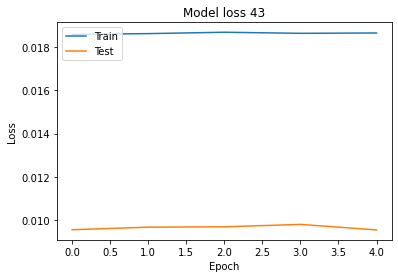

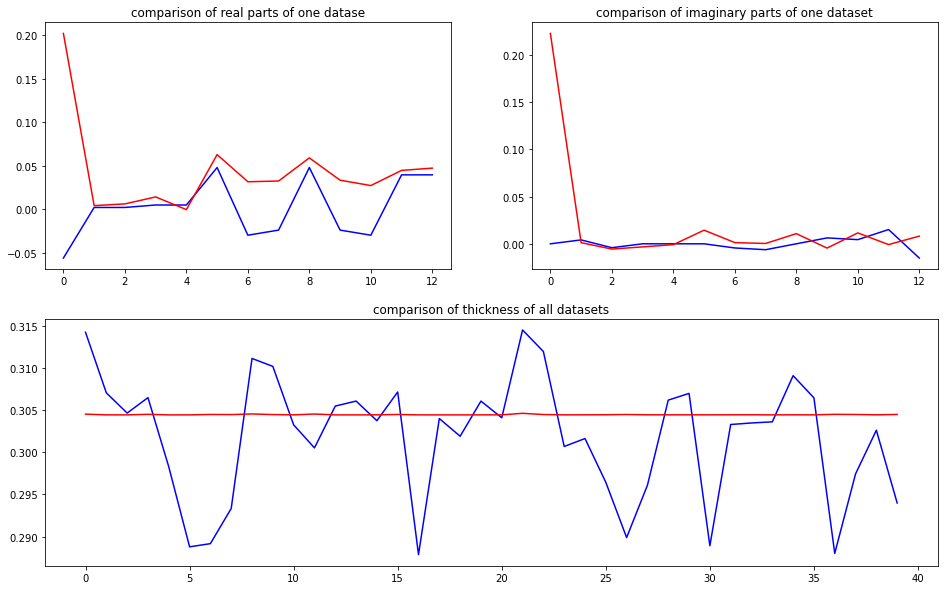

predicted thickness: 0.30402336


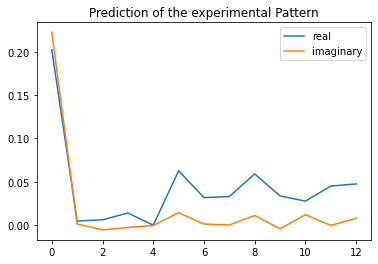

The offset applied on thickness: 0.0009471123130676429

The offset applied on Ug: 1.0766226865396245

Applied shift of unit cell origin (fractional coordinates): 0.022963658085367558 0.002388981477433957
Ug[ 0 ]: 0.29986 0.0  =>  0.29986 0.0
Ug[ 1 ]: 0.00635 0.56297  =>  0.00635 0.57798
Ug[ 2 ]: 0.00635 -0.56297  =>  0.00635 -0.57798
Ug[ 3 ]: 0.00701 -0.14428  =>  0.00701 0.0
Ug[ 4 ]: 0.00701 0.14428  =>  0.00701 0.0
Ug[ 5 ]: 0.06501 0.03002  =>  0.06501 0.0
Ug[ 6 ]: 0.03114 -0.17326  =>  0.03114 -0.04398
Ug[ 7 ]: 0.03449 0.06327  =>  0.03449 -0.09602
Ug[ 8 ]: 0.06501 -0.03002  =>  0.06501 0.0
Ug[ 9 ]: 0.03449 -0.06327  =>  0.03449 0.09602
Ug[ 10 ]: 0.03114 0.17326  =>  0.03114 0.04398
Ug[ 11 ]: 0.04876 -0.0874  =>  0.04876 -0.37597
Ug[ 12 ]: 0.04876 0.0874  =>  0.04876 0.37597
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

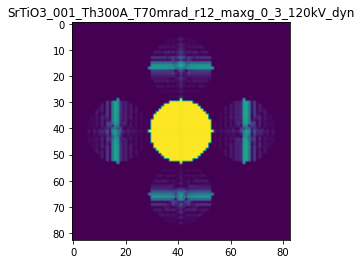

X_sim.max(): 0.9995350806079825
>>>replaced the 44. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 930ms/step - loss: 0.0187 - mean_absolute_error: 0.0381 - acc: 0.6500 - val_loss: 0.0096 - val_mean_absolute_error: 0.0356 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 2s 519ms/step - loss: 0.0187 - mean_absolute_error: 0.0378 - acc: 0.6500 - val_loss: 0.0091 - val_mean_absolute_error: 0.0352 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 2s 520ms/step - loss: 0.0187 - mean_absolute_error: 0.0387 - acc: 0.6500 - val_loss: 0.0097 - val_mean_absolute_error: 0.0371 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 2s 518ms/step - loss: 0.0186 - mean_absolute_error: 0.0385 - acc: 0.6500 - val_loss: 0.0095 - val_mean_absolute_error: 0.0365 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 3s 759ms/step - loss: 0.0187 - mean_absolute_error: 0.0392 - acc: 0.6500 - val_loss: 0.0098 - val_mean_abso

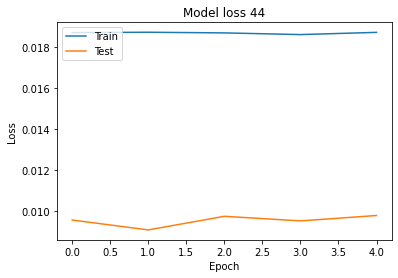

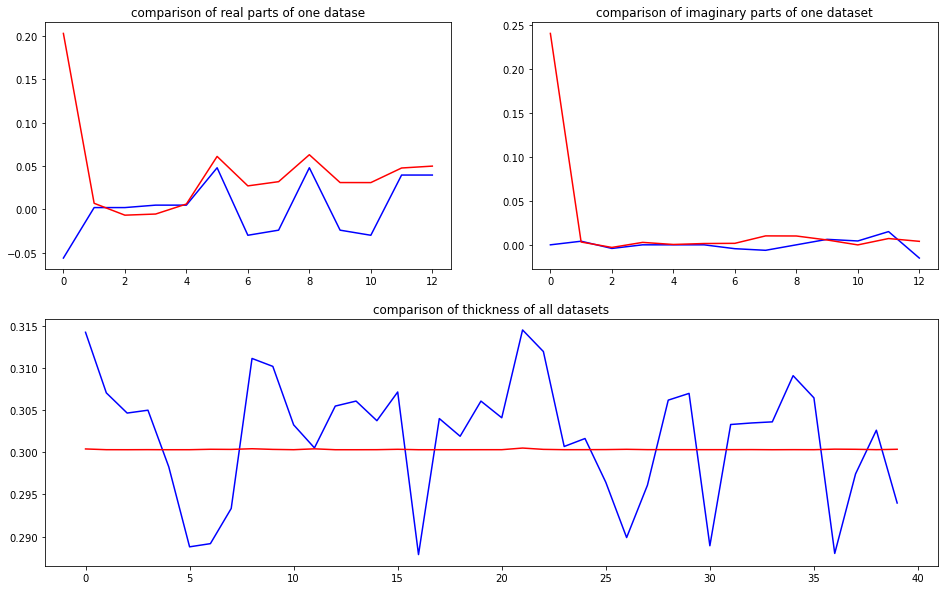

predicted thickness: 0.29990333


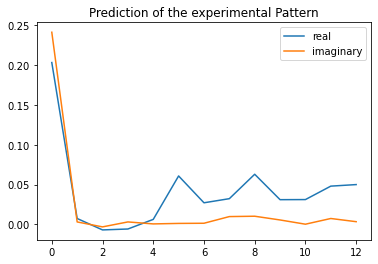

The offset applied on thickness: -0.00016628311485883973

The offset applied on Ug: 2.5085648918709955

Applied shift of unit cell origin (fractional coordinates): -0.19601534164548856 -0.005751890864661072
Ug[ 0 ]: 0.45215 0.0  =>  0.45215 0.0
Ug[ 1 ]: 0.00316 1.42151  =>  0.00316 1.38537
Ug[ 2 ]: 0.00316 -1.42151  =>  0.00316 -1.38537
Ug[ 3 ]: 0.00132 1.2316  =>  0.00132 0.0
Ug[ 4 ]: 0.00132 -1.2316  =>  0.00132 -0.0
Ug[ 5 ]: 0.07182 -0.07228  =>  0.07182 0.0
Ug[ 6 ]: 0.03135 0.00746  =>  0.03135 -1.188
Ug[ 7 ]: 0.03447 0.06798  =>  0.03447 1.33572
Ug[ 8 ]: 0.07182 0.07228  =>  0.07182 0.0
Ug[ 9 ]: 0.03447 -0.06798  =>  0.03447 -1.33572
Ug[ 10 ]: 0.03135 -0.00746  =>  0.03135 1.188
Ug[ 11 ]: 0.05518 0.03142  =>  0.05518 2.49462
Ug[ 12 ]: 0.05518 -0.03142  =>  0.05518 -2.49462
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

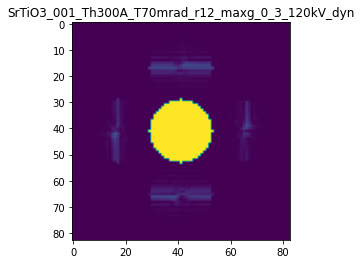

X_sim.max(): 0.9999660459770933
>>>replaced the 45. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0186 - mean_absolute_error: 0.0390 - acc: 0.6400 - val_loss: 0.0084 - val_mean_absolute_error: 0.0350 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 644ms/step - loss: 0.0187 - mean_absolute_error: 0.0382 - acc: 0.6400 - val_loss: 0.0082 - val_mean_absolute_error: 0.0349 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 5s 979ms/step - loss: 0.0186 - mean_absolute_error: 0.0382 - acc: 0.6400 - val_loss: 0.0081 - val_mean_absolute_error: 0.0348 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 5s 970ms/step - loss: 0.0186 - mean_absolute_error: 0.0387 - acc: 0.6400 - val_loss: 0.0083 - val_mean_absolute_error: 0.0351 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0186 - mean_absolute_error: 0.0385 - acc: 0.6400 - val_loss: 0.0085 - val_mean_absolute_e

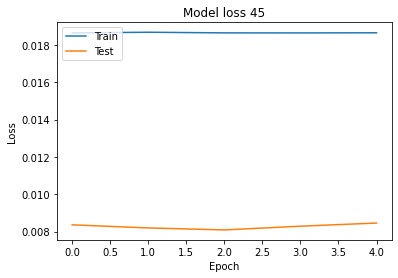

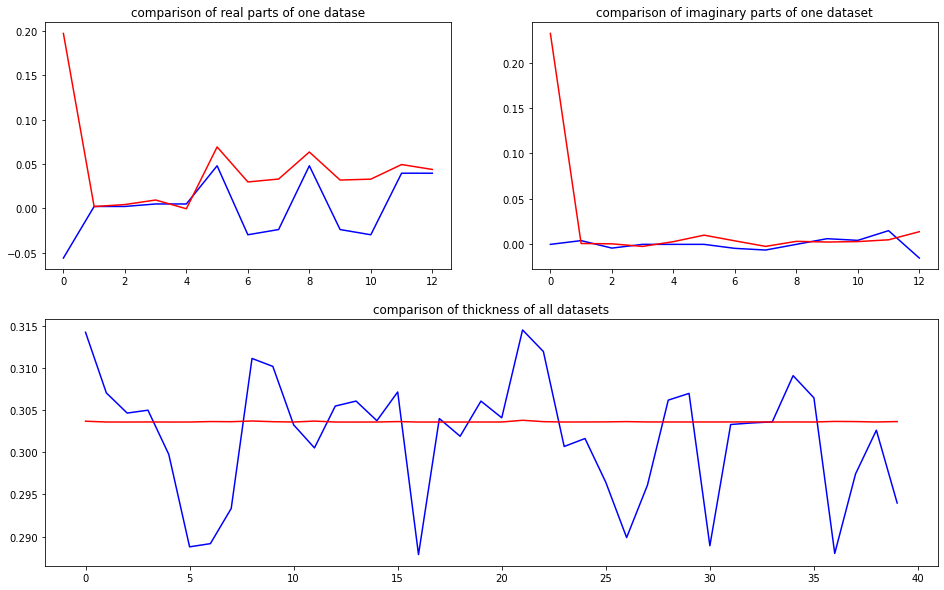

predicted thickness: 0.30320132


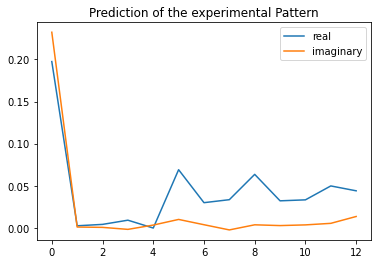

The offset applied on thickness: -0.0006633652866656475

The offset applied on Ug: -3.078778929104881

Applied shift of unit cell origin (fractional coordinates): 0.08930809158789041 0.0038904684923855
Ug[ 0 ]: 0.08865 3.14159  =>  0.08865 3.14159
Ug[ 1 ]: 0.0032 0.06896  =>  0.0032 0.09341
Ug[ 2 ]: 0.0032 -0.06896  =>  0.0032 -0.09341
Ug[ 3 ]: 0.005 -0.56114  =>  0.005 0.0
Ug[ 4 ]: 0.005 0.56114  =>  0.005 0.0
Ug[ 5 ]: 0.05259 0.04889  =>  0.05259 0.0
Ug[ 6 ]: 0.02841 0.01181  =>  0.02841 0.5485
Ug[ 7 ]: 0.02952 -0.0906  =>  0.02952 -0.67618
Ug[ 8 ]: 0.05259 -0.04889  =>  0.05259 0.0
Ug[ 9 ]: 0.02952 0.0906  =>  0.02952 0.67618
Ug[ 10 ]: 0.02841 -0.01181  =>  0.02841 -0.5485
Ug[ 11 ]: 0.03997 -0.11017  =>  0.03997 -1.23244
Ug[ 12 ]: 0.03997 0.11017  =>  0.03997 1.23244
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70m

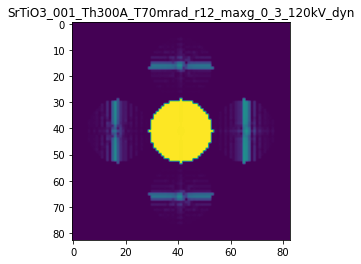

X_sim.max(): 0.9997795574965058
>>>replaced the 46. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0187 - mean_absolute_error: 0.0395 - acc: 0.6400 - val_loss: 0.0083 - val_mean_absolute_error: 0.0345 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 3s 580ms/step - loss: 0.0187 - mean_absolute_error: 0.0399 - acc: 0.6400 - val_loss: 0.0084 - val_mean_absolute_error: 0.0345 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 4s 954ms/step - loss: 0.0187 - mean_absolute_error: 0.0385 - acc: 0.6400 - val_loss: 0.0079 - val_mean_absolute_error: 0.0345 - val_acc: 0.5750
Epoch 4/5
5/5 [==============================] - 4s 949ms/step - loss: 0.0187 - mean_absolute_error: 0.0382 - acc: 0.6400 - val_loss: 0.0080 - val_mean_absolute_error: 0.0344 - val_acc: 0.5750
Epoch 5/5
5/5 [==============================] - 4s 964ms/step - loss: 0.0187 - mean_absolute_error: 0.0390 - acc: 0.6400 - val_loss: 0.0081 - val_mean_absolut

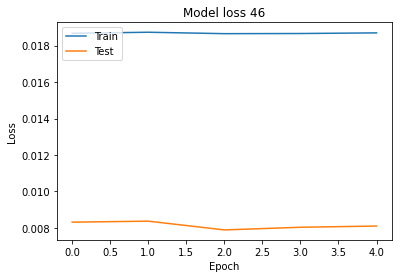

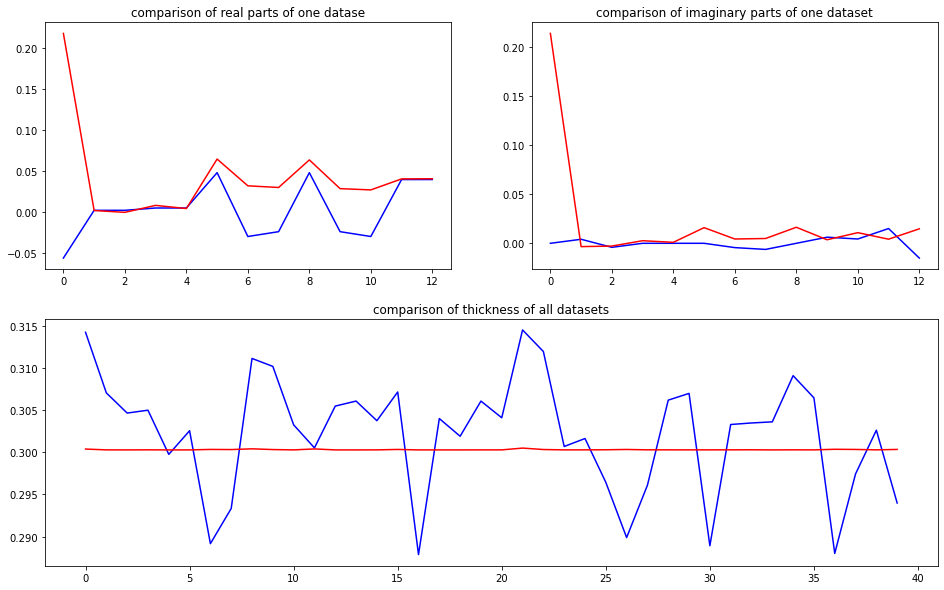

predicted thickness: 0.29991052


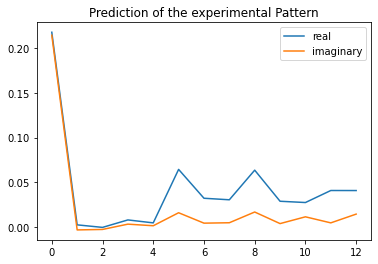

The offset applied on thickness: 0.0007166423154774873

The offset applied on Ug: 1.9894364807327845

Applied shift of unit cell origin (fractional coordinates): -0.023876469683437093 -0.00031442597063104197
Ug[ 0 ]: 0.40384 0.0  =>  0.40384 0.0
Ug[ 1 ]: 0.0009 -0.28389  =>  0.0009 -0.28586
Ug[ 2 ]: 0.0009 0.28389  =>  0.0009 0.28586
Ug[ 3 ]: 0.00629 0.15002  =>  0.00629 0.0
Ug[ 4 ]: 0.00629 -0.15002  =>  0.00629 -0.0
Ug[ 5 ]: 0.07256 -0.00395  =>  0.07256 0.0
Ug[ 6 ]: 0.03172 -0.10518  =>  0.03172 -0.25323
Ug[ 7 ]: 0.03127 0.01918  =>  0.03127 0.17118
Ug[ 8 ]: 0.07256 0.00395  =>  0.07256 0.0
Ug[ 9 ]: 0.03127 -0.01918  =>  0.03127 -0.17118
Ug[ 10 ]: 0.03172 0.10518  =>  0.03172 0.25323
Ug[ 11 ]: 0.0445 -0.11514  =>  0.0445 0.1849
Ug[ 12 ]: 0.0445 0.11514  =>  0.0445 -0.1849
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

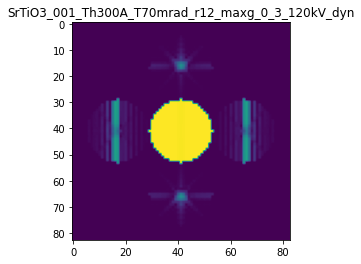

X_sim.max(): 0.9998858285551804
>>>replaced the 47. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 943ms/step - loss: 0.0187 - mean_absolute_error: 0.0389 - acc: 0.6400 - val_loss: 0.0080 - val_mean_absolute_error: 0.0335 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 540ms/step - loss: 0.0187 - mean_absolute_error: 0.0387 - acc: 0.6400 - val_loss: 0.0079 - val_mean_absolute_error: 0.0338 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0187 - mean_absolute_error: 0.0390 - acc: 0.6400 - val_loss: 0.0078 - val_mean_absolute_error: 0.0337 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 741ms/step - loss: 0.0186 - mean_absolute_error: 0.0387 - acc: 0.6400 - val_loss: 0.0077 - val_mean_absolute_error: 0.0331 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 962ms/step - loss: 0.0186 - mean_absolute_error: 0.0385 - acc: 0.6400 - val_loss: 0.0078 - val_mean_abso

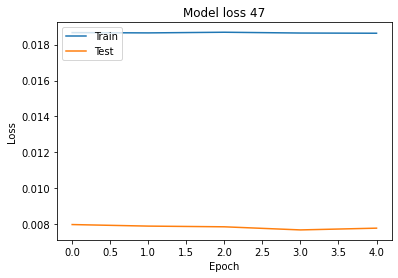

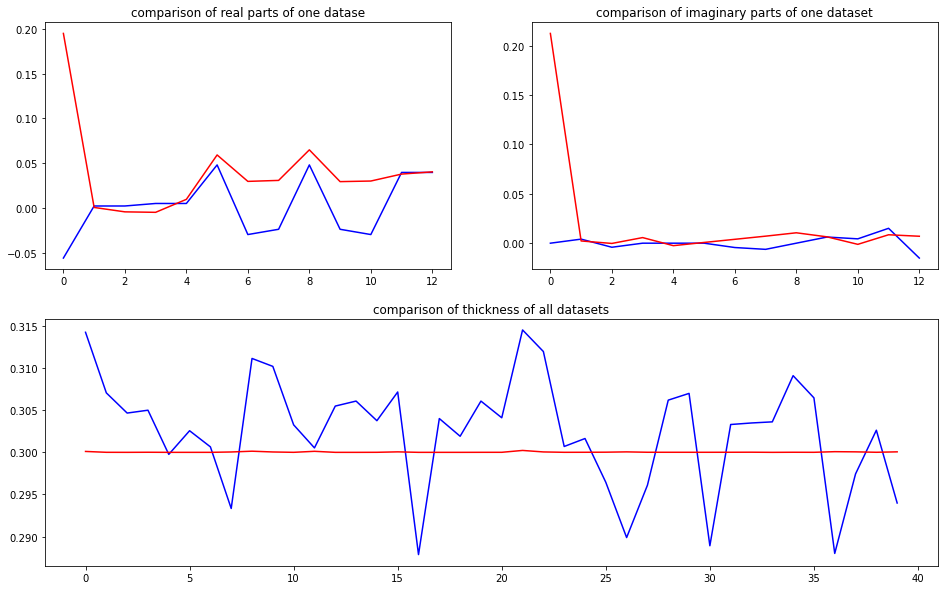

predicted thickness: 0.29964235


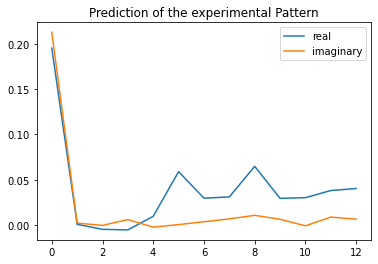

The offset applied on thickness: 0.0008546853853574961

The offset applied on Ug: 2.84247169005948

Applied shift of unit cell origin (fractional coordinates): -0.1639270101832932 -0.007593063263303508
Ug[ 0 ]: 0.43201 0.0  =>  0.43201 0.0
Ug[ 1 ]: 0.00223 2.55009  =>  0.00223 2.50238
Ug[ 2 ]: 0.00223 -2.55009  =>  0.00223 -2.50238
Ug[ 3 ]: 0.00477 1.02998  =>  0.00477 0.0
Ug[ 4 ]: 0.00477 -1.02998  =>  0.00477 -0.0
Ug[ 5 ]: 0.07329 -0.09542  =>  0.07329 0.0
Ug[ 6 ]: 0.03263 0.06778  =>  0.03263 -0.9145
Ug[ 7 ]: 0.03304 0.01175  =>  0.03304 1.08944
Ug[ 8 ]: 0.07329 0.09542  =>  0.07329 0.0
Ug[ 9 ]: 0.03304 -0.01175  =>  0.03304 -1.08944
Ug[ 10 ]: 0.03263 -0.06778  =>  0.03263 0.9145
Ug[ 11 ]: 0.04381 0.01998  =>  0.04381 2.07995
Ug[ 12 ]: 0.04381 -0.01998  =>  0.04381 -2.07995
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

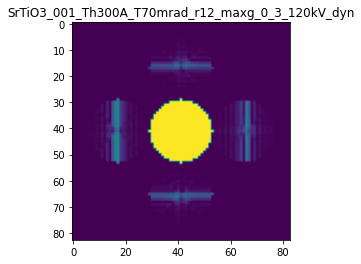

X_sim.max(): 0.9999215541669397
>>>replaced the 48. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 959ms/step - loss: 0.0187 - mean_absolute_error: 0.0389 - acc: 0.6300 - val_loss: 0.0075 - val_mean_absolute_error: 0.0335 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0187 - mean_absolute_error: 0.0389 - acc: 0.6300 - val_loss: 0.0072 - val_mean_absolute_error: 0.0329 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 612ms/step - loss: 0.0189 - mean_absolute_error: 0.0424 - acc: 0.6300 - val_loss: 0.0077 - val_mean_absolute_error: 0.0364 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 686ms/step - loss: 0.0188 - mean_absolute_error: 0.0423 - acc: 0.6300 - val_loss: 0.0073 - val_mean_absolute_error: 0.0340 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 980ms/step - loss: 0.0188 - mean_absolute_error: 0.0430 - acc: 0.6300 - val_loss: 0.0075 - val_mean_abso

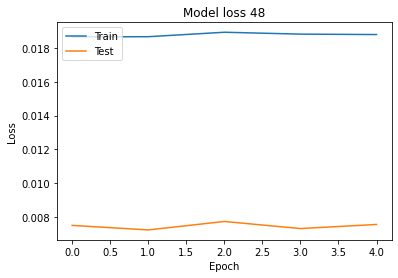

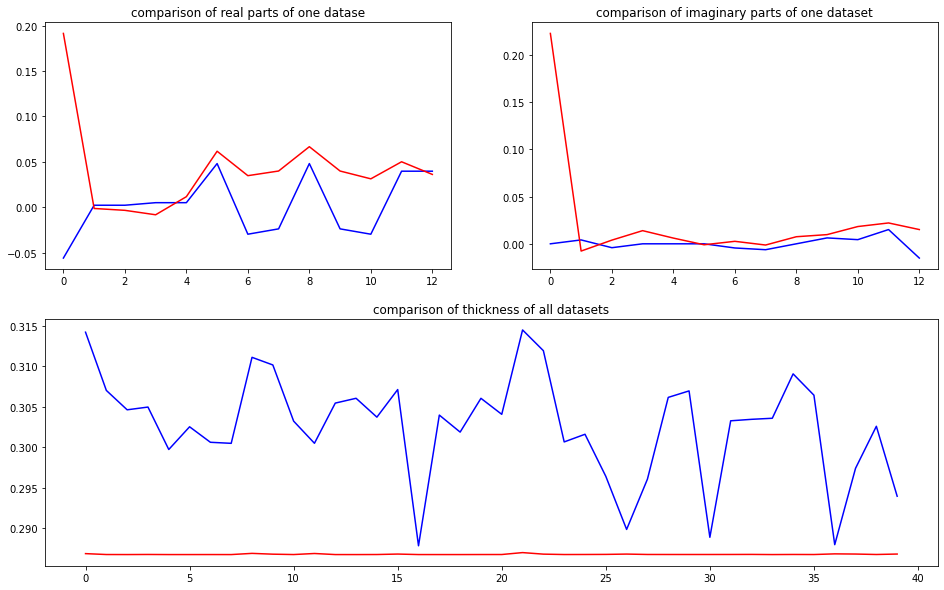

predicted thickness: 0.28644887


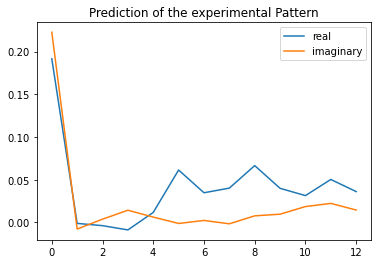

The offset applied on thickness: 0.00016607543812309912

The offset applied on Ug: 2.780215430335709

Applied shift of unit cell origin (fractional coordinates): -0.17298152482062482 -0.006356060401956954
Ug[ 0 ]: 0.43141 0.0  =>  0.43141 0.0
Ug[ 1 ]: 0.00616 -1.94911  =>  0.00616 -1.98904
Ug[ 2 ]: 0.00616 1.94911  =>  0.00616 1.98904
Ug[ 3 ]: 0.00465 1.08687  =>  0.00465 -0.0
Ug[ 4 ]: 0.00465 -1.08687  =>  0.00465 0.0
Ug[ 5 ]: 0.0757 -0.07987  =>  0.0757 0.0
Ug[ 6 ]: 0.03758 -0.22264  =>  0.03758 -1.26957
Ug[ 7 ]: 0.04507 -0.12812  =>  0.04507 0.99869
Ug[ 8 ]: 0.0757 0.07987  =>  0.0757 -0.0
Ug[ 9 ]: 0.04507 0.12812  =>  0.04507 -0.99869
Ug[ 10 ]: 0.03758 0.22264  =>  0.03758 1.26957
Ug[ 11 ]: 0.05004 0.13687  =>  0.05004 2.31062
Ug[ 12 ]: 0.05004 -0.13687  =>  0.05004 -2.31062
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

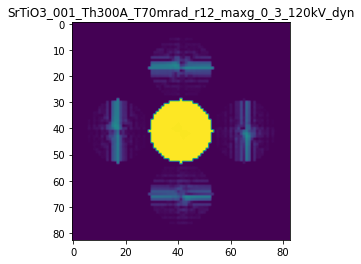

X_sim.max(): 0.9999352958729646
>>>replaced the 49. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 924ms/step - loss: 0.0187 - mean_absolute_error: 0.0413 - acc: 0.6200 - val_loss: 0.0070 - val_mean_absolute_error: 0.0337 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0187 - mean_absolute_error: 0.0414 - acc: 0.6200 - val_loss: 0.0072 - val_mean_absolute_error: 0.0346 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 2s 533ms/step - loss: 0.0188 - mean_absolute_error: 0.0410 - acc: 0.6200 - val_loss: 0.0069 - val_mean_absolute_error: 0.0324 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0186 - mean_absolute_error: 0.0393 - acc: 0.6200 - val_loss: 0.0073 - val_mean_absolute_error: 0.0352 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 950ms/step - loss: 0.0188 - mean_absolute_error: 0.0408 - acc: 0.6200 - val_loss: 0.0076 - val_mean_abso

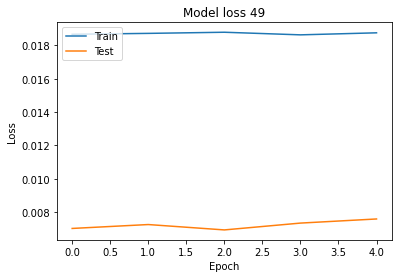

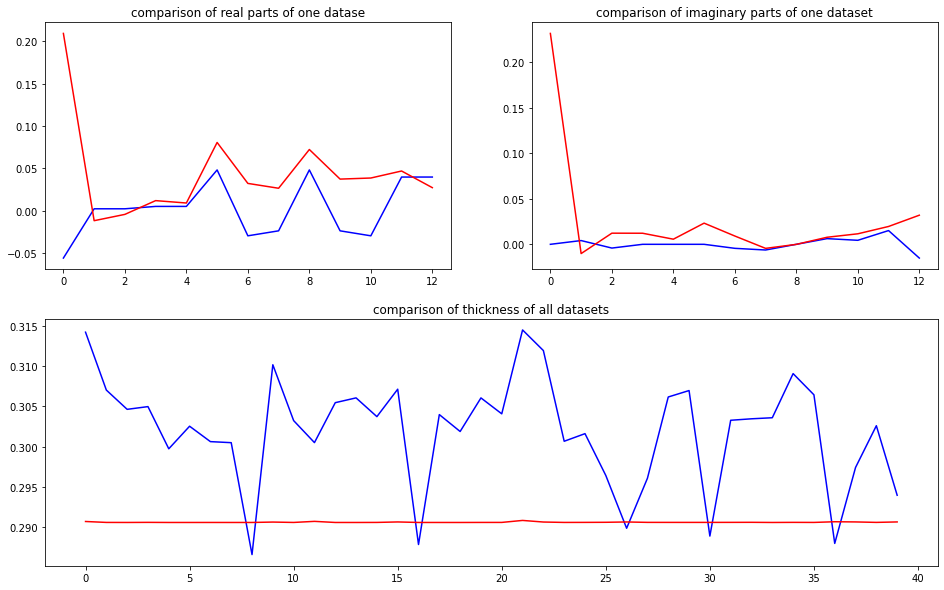

predicted thickness: 0.29029706


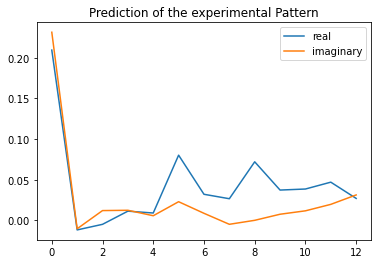

The offset applied on thickness: -8.485917281365829e-05

The offset applied on Ug: 1.6708650854361444

Applied shift of unit cell origin (fractional coordinates): -0.05046727033647555 0.012323557724066942
Ug[ 0 ]: 0.37218 0.0  =>  0.37218 0.0
Ug[ 1 ]: 0.01359 -2.18309  =>  0.01359 -2.10566
Ug[ 2 ]: 0.01359 2.18309  =>  0.01359 2.10566
Ug[ 3 ]: 0.01123 0.3171  =>  0.01123 0.0
Ug[ 4 ]: 0.01123 -0.3171  =>  0.01123 0.0
Ug[ 5 ]: 0.08743 0.15486  =>  0.08743 0.0
Ug[ 6 ]: 0.0378 -0.05397  =>  0.0378 -0.44849
Ug[ 7 ]: 0.0346 -0.20036  =>  0.0346 0.0393
Ug[ 8 ]: 0.08743 -0.15486  =>  0.08743 0.0
Ug[ 9 ]: 0.0346 0.20036  =>  0.0346 -0.0393
Ug[ 10 ]: 0.0378 0.05397  =>  0.0378 0.44849
Ug[ 11 ]: 0.04103 -0.11802  =>  0.04103 0.51617
Ug[ 12 ]: 0.04103 0.11802  =>  0.04103 -0.51617
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mr

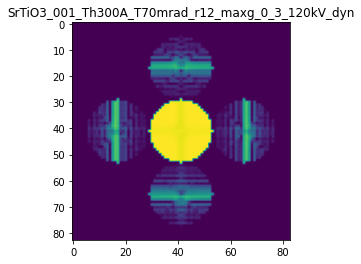

X_sim.max(): 0.9996110198871574
>>>replaced the 50. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 934ms/step - loss: 0.0177 - mean_absolute_error: 0.0399 - acc: 0.6200 - val_loss: 0.0076 - val_mean_absolute_error: 0.0344 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0176 - mean_absolute_error: 0.0387 - acc: 0.6200 - val_loss: 0.0072 - val_mean_absolute_error: 0.0329 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0175 - mean_absolute_error: 0.0377 - acc: 0.6200 - val_loss: 0.0066 - val_mean_absolute_error: 0.0313 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0176 - mean_absolute_error: 0.0372 - acc: 0.6200 - val_loss: 0.0067 - val_mean_absolute_error: 0.0327 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 4s 957ms/step - loss: 0.0176 - mean_absolute_error: 0.0376 - acc: 0.6200 - val_loss: 0.0065 - val_mean_abso

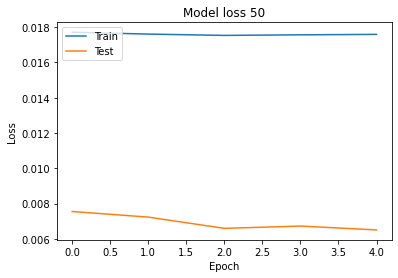

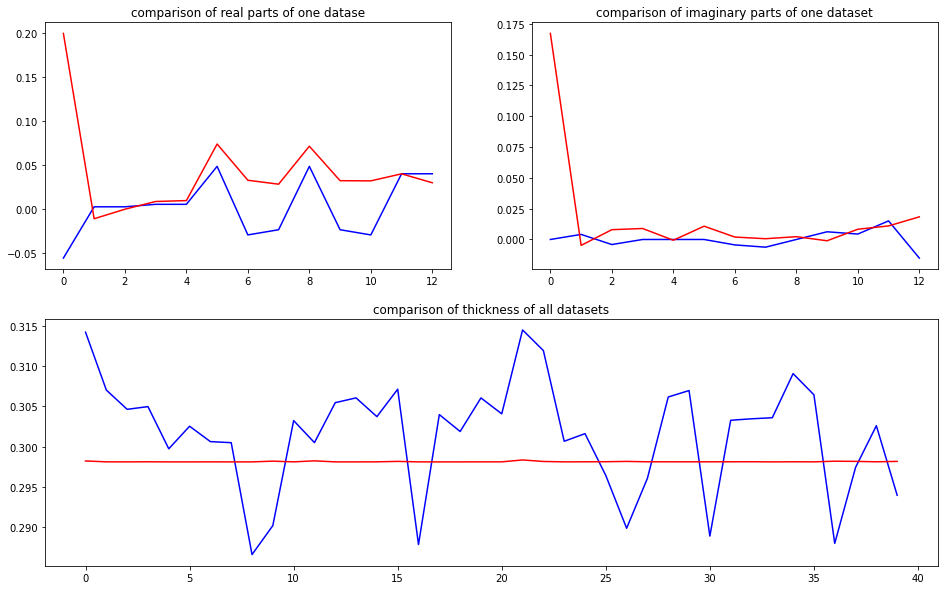

predicted thickness: 0.2978643


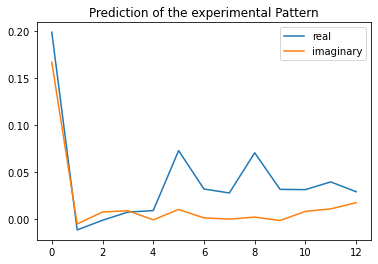

The offset applied on thickness: -0.0004962658442918448

The offset applied on Ug: -0.6654586745833253

Applied shift of unit cell origin (fractional coordinates): -0.08173294907340761 0.004535998087117473
Ug[ 0 ]: 0.15415 0.0  =>  0.15415 0.0
Ug[ 1 ]: 0.00882 -2.32973  =>  0.00882 -2.30123
Ug[ 2 ]: 0.00882 2.32973  =>  0.00882 2.30123
Ug[ 3 ]: 0.00982 0.51354  =>  0.00982 0.0
Ug[ 4 ]: 0.00982 -0.51354  =>  0.00982 0.0
Ug[ 5 ]: 0.06871 0.057  =>  0.06871 -0.0
Ug[ 6 ]: 0.03153 -0.11005  =>  0.03153 -0.65209
Ug[ 7 ]: 0.0295 0.02828  =>  0.0295 0.51332
Ug[ 8 ]: 0.06871 -0.057  =>  0.06871 0.0
Ug[ 9 ]: 0.0295 -0.02828  =>  0.0295 -0.51332
Ug[ 10 ]: 0.03153 0.11005  =>  0.03153 0.65209
Ug[ 11 ]: 0.03392 -0.10193  =>  0.03392 0.92515
Ug[ 12 ]: 0.03392 0.10193  =>  0.03392 -0.92515
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

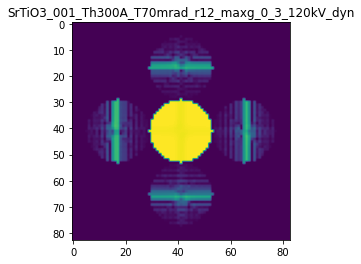

X_sim.max(): 0.999863814593231
>>>replaced the 51. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 928ms/step - loss: 0.0176 - mean_absolute_error: 0.0365 - acc: 0.6200 - val_loss: 0.0067 - val_mean_absolute_error: 0.0324 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 2s 533ms/step - loss: 0.0175 - mean_absolute_error: 0.0379 - acc: 0.6200 - val_loss: 0.0070 - val_mean_absolute_error: 0.0329 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0175 - mean_absolute_error: 0.0382 - acc: 0.6200 - val_loss: 0.0072 - val_mean_absolute_error: 0.0335 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0176 - mean_absolute_error: 0.0378 - acc: 0.6200 - val_loss: 0.0071 - val_mean_absolute_error: 0.0318 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 954ms/step - loss: 0.0176 - mean_absolute_error: 0.0370 - acc: 0.6200 - val_loss: 0.0070 - val_mean_absol

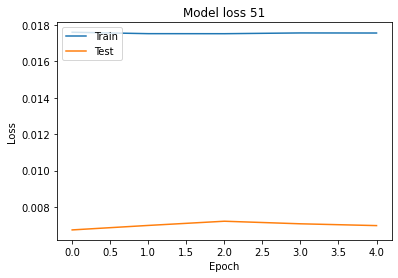

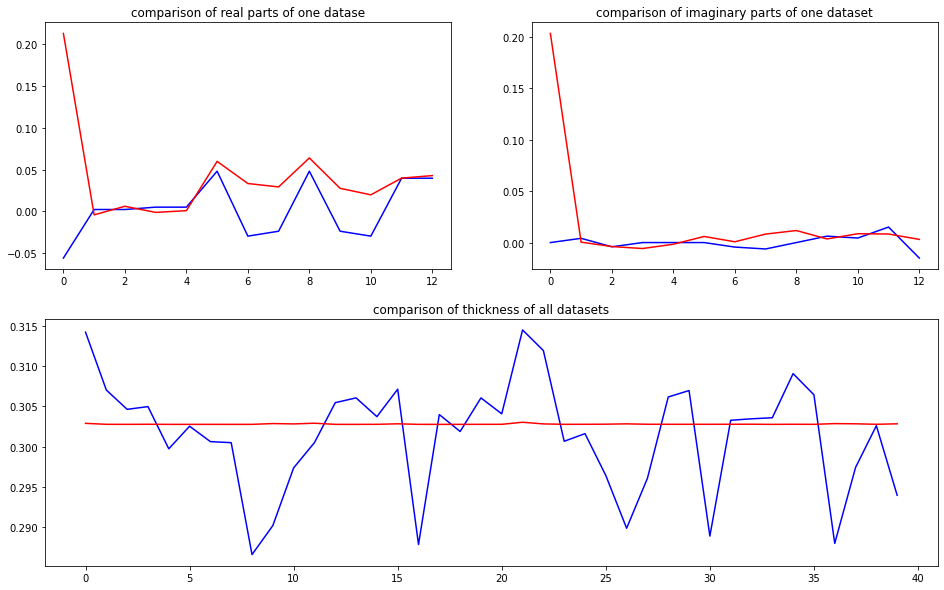

predicted thickness: 0.30253544


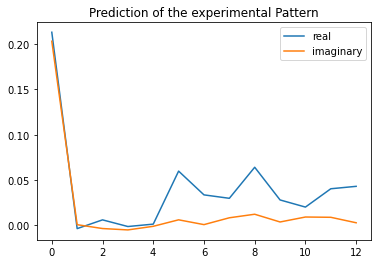

The offset applied on thickness: -0.0008242125777842788

The offset applied on Ug: 1.3688969100220822

Applied shift of unit cell origin (fractional coordinates): 0.2739283353286447 -0.004303812583809038
Ug[ 0 ]: 0.33226 0.0  =>  0.33226 0.0
Ug[ 1 ]: 0.0023 1.15659  =>  0.0023 1.12955
Ug[ 2 ]: 0.0023 -1.15659  =>  0.0023 -1.12955
Ug[ 3 ]: 0.002 -1.72114  =>  0.002 -0.0
Ug[ 4 ]: 0.002 1.72114  =>  0.002 0.0
Ug[ 5 ]: 0.06726 -0.05408  =>  0.06726 0.0
Ug[ 6 ]: 0.02795 -0.13324  =>  0.02795 1.61495
Ug[ 7 ]: 0.02995 0.0816  =>  0.02995 -1.6125
Ug[ 8 ]: 0.06726 0.05408  =>  0.06726 0.0
Ug[ 9 ]: 0.02995 -0.0816  =>  0.02995 1.6125
Ug[ 10 ]: 0.02795 0.13324  =>  0.02795 -1.61495
Ug[ 11 ]: 0.04399 0.06596  =>  0.04399 2.90686
Ug[ 12 ]: 0.04399 -0.06596  =>  0.04399 -2.90686
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r

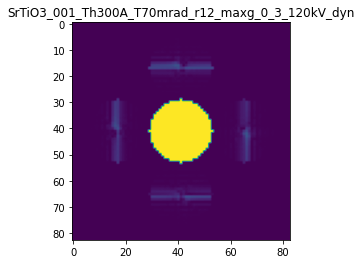

X_sim.max(): 0.9999765876232312
>>>replaced the 52. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 942ms/step - loss: 0.0179 - mean_absolute_error: 0.0401 - acc: 0.6100 - val_loss: 0.0065 - val_mean_absolute_error: 0.0342 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0181 - mean_absolute_error: 0.0424 - acc: 0.6100 - val_loss: 0.0055 - val_mean_absolute_error: 0.0322 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0179 - mean_absolute_error: 0.0442 - acc: 0.6100 - val_loss: 0.0064 - val_mean_absolute_error: 0.0368 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 3s 706ms/step - loss: 0.0177 - mean_absolute_error: 0.0426 - acc: 0.6100 - val_loss: 0.0060 - val_mean_absolute_error: 0.0335 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 4s 978ms/step - loss: 0.0177 - mean_absolute_error: 0.0404 - acc: 0.6100 - val_loss: 0.0063 - val_mean_abso

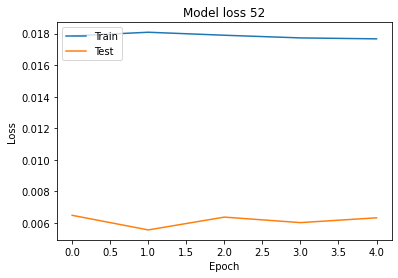

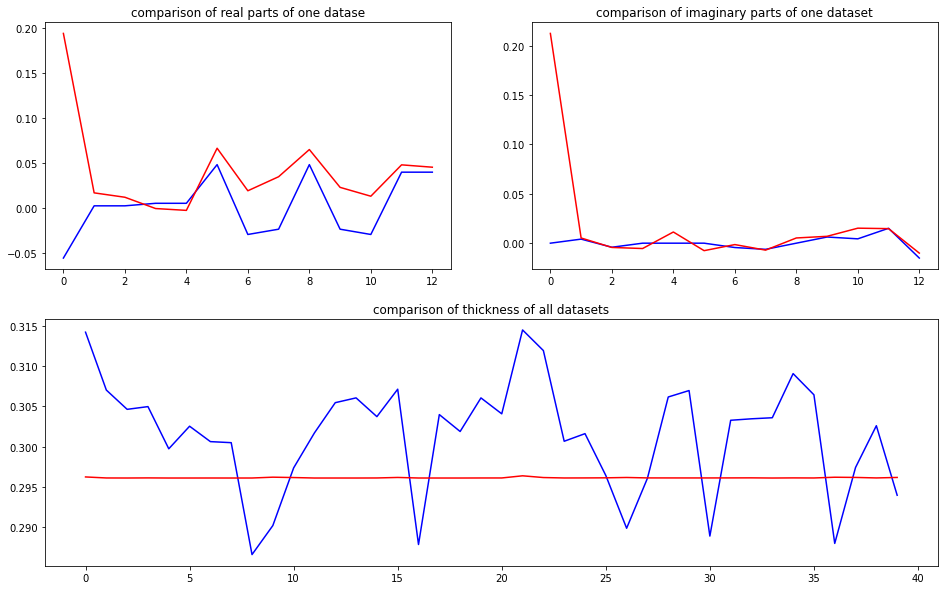

predicted thickness: 0.29591796


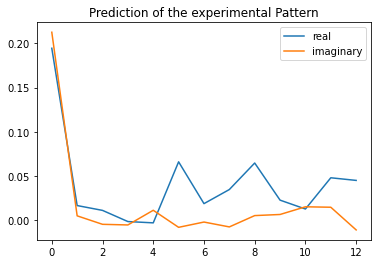

The offset applied on thickness: -0.0003980681535836168

The offset applied on Ug: -1.2335477702833173

Applied shift of unit cell origin (fractional coordinates): 0.2885837881748158 -0.008848555579212682
Ug[ 0 ]: 0.0921 0.0  =>  0.0921 0.0
Ug[ 1 ]: 0.01463 0.3261  =>  0.01463 0.2705
Ug[ 2 ]: 0.01463 -0.3261  =>  0.01463 -0.2705
Ug[ 3 ]: 0.00846 -1.81323  =>  0.00846 0.0
Ug[ 4 ]: 0.00846 1.81323  =>  0.00846 -0.0
Ug[ 5 ]: 0.06056 -0.11119  =>  0.06056 0.0
Ug[ 6 ]: 0.01773 -0.50497  =>  0.01773 1.36385
Ug[ 7 ]: 0.02879 -0.25999  =>  0.02879 -2.01762
Ug[ 8 ]: 0.06056 0.11119  =>  0.06056 0.0
Ug[ 9 ]: 0.02879 0.25999  =>  0.02879 2.01762
Ug[ 10 ]: 0.01773 0.50497  =>  0.01773 -1.36385
Ug[ 11 ]: 0.0456 0.27984  =>  0.0456 2.93658
Ug[ 12 ]: 0.0456 -0.27984  =>  0.0456 -2.93658
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

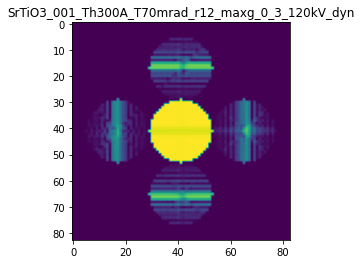

X_sim.max(): 0.9985391925193572
>>>replaced the 53. dataset and train: 
Epoch 1/5
5/5 [==============================] - 8s 919ms/step - loss: 0.0176 - mean_absolute_error: 0.0395 - acc: 0.6100 - val_loss: 0.0062 - val_mean_absolute_error: 0.0339 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 2s 523ms/step - loss: 0.0179 - mean_absolute_error: 0.0389 - acc: 0.6100 - val_loss: 0.0058 - val_mean_absolute_error: 0.0327 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0177 - mean_absolute_error: 0.0403 - acc: 0.6100 - val_loss: 0.0061 - val_mean_absolute_error: 0.0330 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 781ms/step - loss: 0.0176 - mean_absolute_error: 0.0391 - acc: 0.6100 - val_loss: 0.0062 - val_mean_absolute_error: 0.0330 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 4s 942ms/step - loss: 0.0176 - mean_absolute_error: 0.0387 - acc: 0.6100 - val_loss: 0.0060 - val_mean_abso

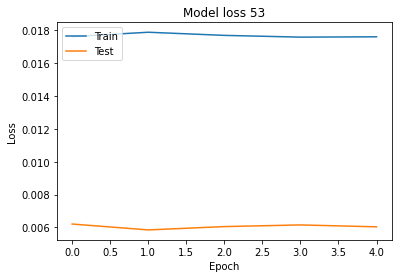

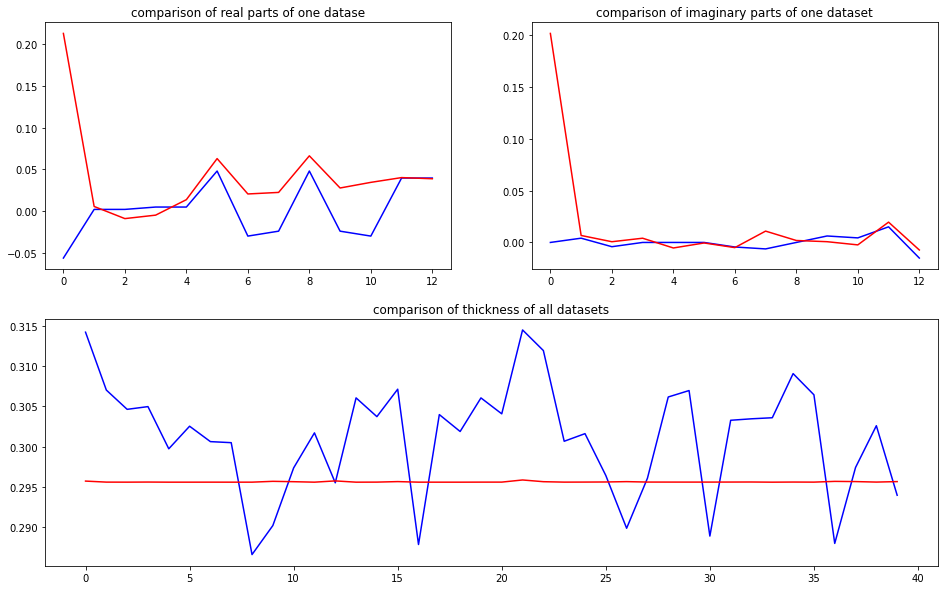

predicted thickness: 0.29541796


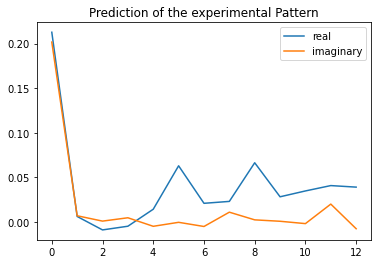

The offset applied on thickness: -0.0007629617619060587

The offset applied on Ug: 2.6712279840503155

Applied shift of unit cell origin (fractional coordinates): -0.11904069338485573 -0.0024383174679142162
Ug[ 0 ]: 0.4425 0.0  =>  0.4425 0.0
Ug[ 1 ]: 0.00332 2.00782  =>  0.00332 1.9925
Ug[ 2 ]: 0.00332 -2.00782  =>  0.00332 -1.9925
Ug[ 3 ]: 0.00665 0.74795  =>  0.00665 0.0
Ug[ 4 ]: 0.00665 -0.74795  =>  0.00665 0.0
Ug[ 5 ]: 0.0757 -0.03064  =>  0.0757 0.0
Ug[ 6 ]: 0.03 -0.09501  =>  0.03 -0.82765
Ug[ 7 ]: 0.02776 0.17556  =>  0.02776 0.93883
Ug[ 8 ]: 0.0757 0.03064  =>  0.0757 0.0
Ug[ 9 ]: 0.02776 -0.17556  =>  0.02776 -0.93883
Ug[ 10 ]: 0.03 0.09501  =>  0.03 0.82765
Ug[ 11 ]: 0.04691 0.31715  =>  0.04691 1.81306
Ug[ 12 ]: 0.04691 -0.31715  =>  0.04691 -1.81306
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12

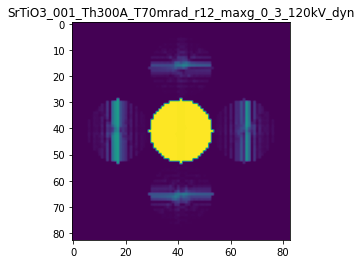

X_sim.max(): 0.9999138505022767
>>>replaced the 54. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 936ms/step - loss: 0.0159 - mean_absolute_error: 0.0372 - acc: 0.6100 - val_loss: 0.0058 - val_mean_absolute_error: 0.0303 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 2s 534ms/step - loss: 0.0160 - mean_absolute_error: 0.0376 - acc: 0.6100 - val_loss: 0.0059 - val_mean_absolute_error: 0.0317 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 2s 529ms/step - loss: 0.0159 - mean_absolute_error: 0.0373 - acc: 0.6100 - val_loss: 0.0056 - val_mean_absolute_error: 0.0309 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 4s 811ms/step - loss: 0.0160 - mean_absolute_error: 0.0386 - acc: 0.6100 - val_loss: 0.0059 - val_mean_absolute_error: 0.0325 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 4s 953ms/step - loss: 0.0160 - mean_absolute_error: 0.0383 - acc: 0.6100 - val_loss: 0.0054 - val_mean_abso

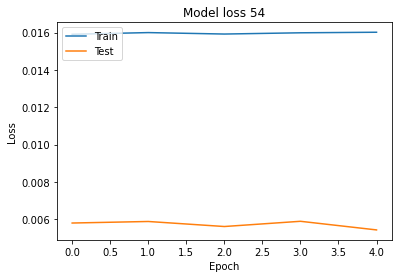

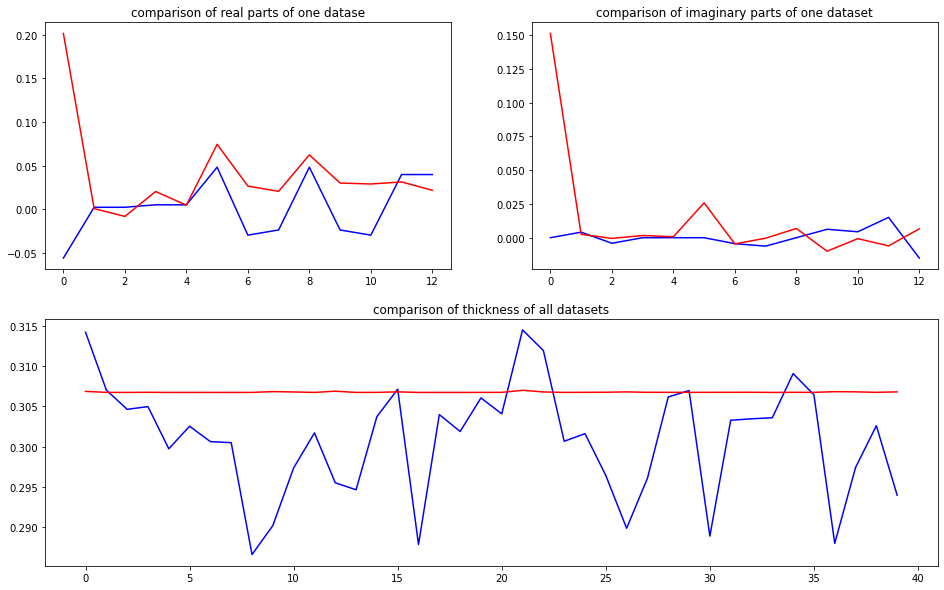

predicted thickness: 0.30657786


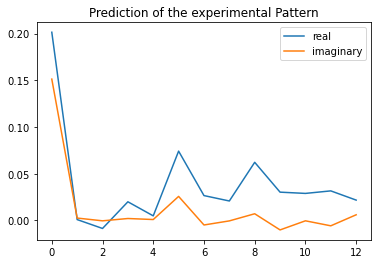

The offset applied on thickness: -0.0005160258550844983

The offset applied on Ug: 0.38561506047228894

Applied shift of unit cell origin (fractional coordinates): -0.007906669016283431 0.011005780343715726
Ug[ 0 ]: 0.22599 0.0  =>  0.22599 0.0
Ug[ 1 ]: 0.00415 2.7788  =>  0.00415 2.84795
Ug[ 2 ]: 0.00415 -2.7788  =>  0.00415 -2.84795
Ug[ 3 ]: 0.01248 0.04968  =>  0.01248 0.0
Ug[ 4 ]: 0.01248 -0.04968  =>  0.01248 0.0
Ug[ 5 ]: 0.0708 0.1383  =>  0.0708 0.0
Ug[ 6 ]: 0.02812 -0.08029  =>  0.02812 -0.19912
Ug[ 7 ]: 0.02621 0.1809  =>  0.02621 0.16143
Ug[ 8 ]: 0.0708 -0.1383  =>  0.0708 0.0
Ug[ 9 ]: 0.02621 -0.1809  =>  0.02621 -0.16143
Ug[ 10 ]: 0.02812 0.08029  =>  0.02812 0.19912
Ug[ 11 ]: 0.02757 -0.21204  =>  0.02757 -0.11268
Ug[ 12 ]: 0.02757 0.21204  =>  0.02757 0.11268
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

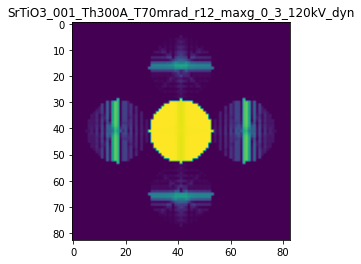

X_sim.max(): 0.9993682782655073
>>>replaced the 55. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 929ms/step - loss: 0.0159 - mean_absolute_error: 0.0371 - acc: 0.6100 - val_loss: 0.0057 - val_mean_absolute_error: 0.0316 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 2s 532ms/step - loss: 0.0162 - mean_absolute_error: 0.0392 - acc: 0.6100 - val_loss: 0.0059 - val_mean_absolute_error: 0.0338 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0160 - mean_absolute_error: 0.0391 - acc: 0.6100 - val_loss: 0.0059 - val_mean_absolute_error: 0.0313 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 3s 596ms/step - loss: 0.0159 - mean_absolute_error: 0.0373 - acc: 0.6100 - val_loss: 0.0056 - val_mean_absolute_error: 0.0303 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0158 - mean_absolute_error: 0.0362 - acc: 0.6100 - val_loss: 0.0053 - val_mean_absolut

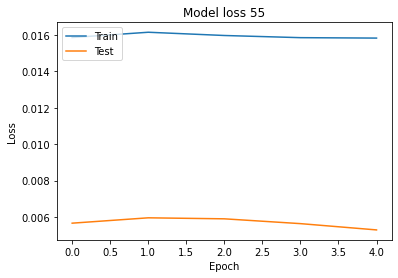

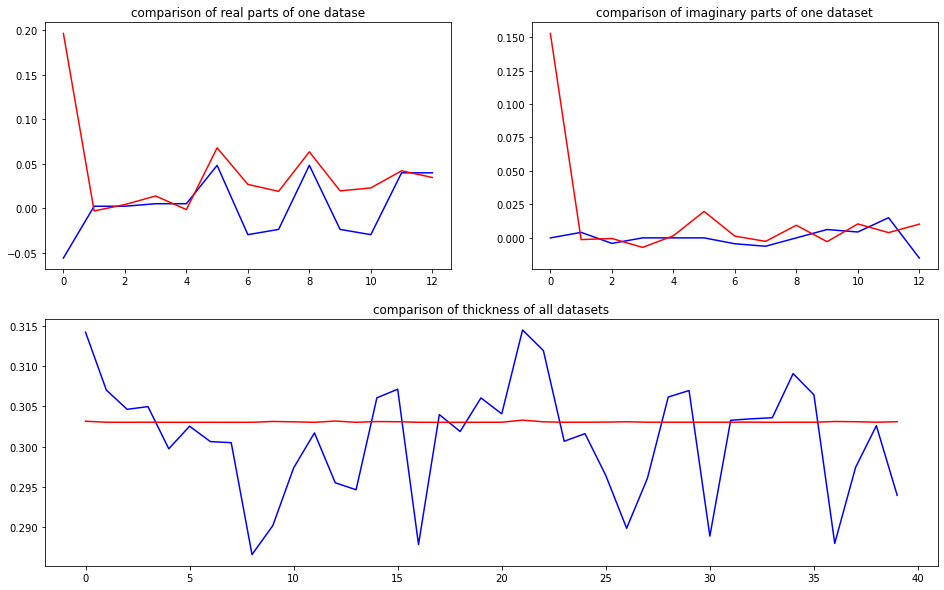

predicted thickness: 0.3028967


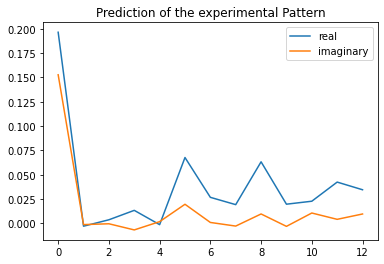

The offset applied on thickness: -0.00019408580273276745

The offset applied on Ug: 1.5166461736959413

Applied shift of unit cell origin (fractional coordinates): 0.09256985614702265 0.006397843957663517
Ug[ 0 ]: 0.2902 0.0  =>  0.2902 0.0
Ug[ 1 ]: 0.0006 -0.80119  =>  0.0006 -0.76099
Ug[ 2 ]: 0.0006 0.80119  =>  0.0006 0.76099
Ug[ 3 ]: 0.00741 -0.58163  =>  0.00741 0.0
Ug[ 4 ]: 0.00741 0.58163  =>  0.00741 0.0
Ug[ 5 ]: 0.07255 0.0804  =>  0.07255 -0.0
Ug[ 6 ]: 0.02621 -0.18313  =>  0.02621 0.35831
Ug[ 7 ]: 0.02006 0.00656  =>  0.02006 -0.61528
Ug[ 8 ]: 0.07255 -0.0804  =>  0.07255 0.0
Ug[ 9 ]: 0.02006 -0.00656  =>  0.02006 0.61528
Ug[ 10 ]: 0.02621 0.18313  =>  0.02621 -0.35831
Ug[ 11 ]: 0.04089 -0.05539  =>  0.04089 -1.21866
Ug[ 12 ]: 0.04089 0.05539  =>  0.04089 1.21866
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

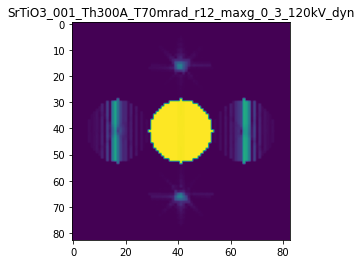

X_sim.max(): 0.9998432346802388
>>>replaced the 56. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 931ms/step - loss: 0.0159 - mean_absolute_error: 0.0362 - acc: 0.6100 - val_loss: 0.0053 - val_mean_absolute_error: 0.0294 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0160 - mean_absolute_error: 0.0359 - acc: 0.6100 - val_loss: 0.0052 - val_mean_absolute_error: 0.0293 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 2s 525ms/step - loss: 0.0159 - mean_absolute_error: 0.0378 - acc: 0.6100 - val_loss: 0.0057 - val_mean_absolute_error: 0.0309 - val_acc: 0.5750
Epoch 4/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0158 - mean_absolute_error: 0.0373 - acc: 0.6100 - val_loss: 0.0057 - val_mean_absolute_error: 0.0305 - val_acc: 0.5750
Epoch 5/5
5/5 [==============================] - 4s 847ms/step - loss: 0.0159 - mean_absolute_error: 0.0369 - acc: 0.6100 - val_loss: 0.0056 - val_mean_abso

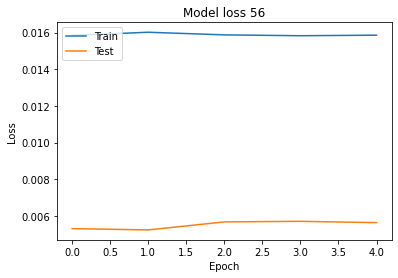

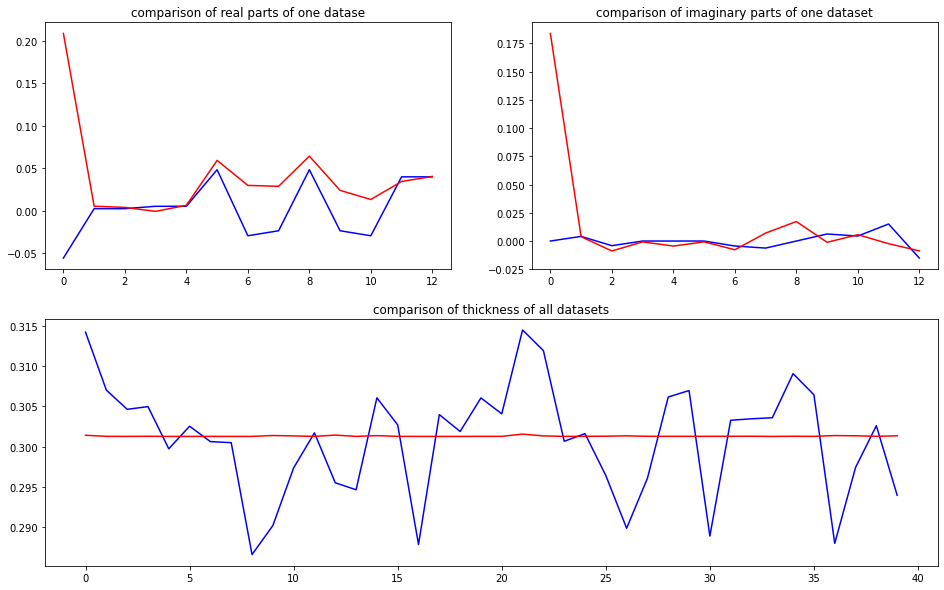

predicted thickness: 0.3011592


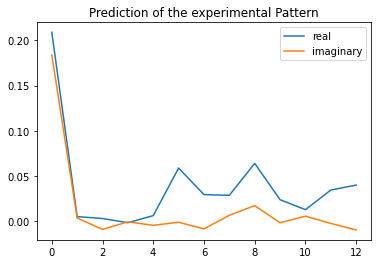

The offset applied on thickness: -0.00021436518299721552

The offset applied on Ug: 0.5354748829848235

Applied shift of unit cell origin (fractional coordinates): -0.10149226862650733 -0.011728139287915131
Ug[ 0 ]: 0.25025 0.0  =>  0.25025 0.0
Ug[ 1 ]: 0.00763 0.96499  =>  0.00763 0.8913
Ug[ 2 ]: 0.00763 -0.96499  =>  0.00763 -0.8913
Ug[ 3 ]: 0.00321 0.63769  =>  0.00321 0.0
Ug[ 4 ]: 0.00321 -0.63769  =>  0.00321 0.0
Ug[ 5 ]: 0.06436 -0.14738  =>  0.06436 -0.0
Ug[ 6 ]: 0.0227 -0.30333  =>  0.0227 -0.86733
Ug[ 7 ]: 0.02717 0.15527  =>  0.02717 0.86665
Ug[ 8 ]: 0.06436 0.14738  =>  0.06436 0.0
Ug[ 9 ]: 0.02717 -0.15527  =>  0.02717 -0.86665
Ug[ 10 ]: 0.0227 0.30333  =>  0.0227 0.86733
Ug[ 11 ]: 0.03835 0.08997  =>  0.03835 1.36536
Ug[ 12 ]: 0.03835 -0.08997  =>  0.03835 -1.36536
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

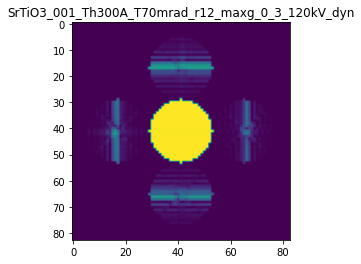

X_sim.max(): 0.9997281953615478
>>>replaced the 57. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 926ms/step - loss: 0.0158 - mean_absolute_error: 0.0364 - acc: 0.6100 - val_loss: 0.0054 - val_mean_absolute_error: 0.0299 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0158 - mean_absolute_error: 0.0363 - acc: 0.6100 - val_loss: 0.0055 - val_mean_absolute_error: 0.0299 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 2s 530ms/step - loss: 0.0158 - mean_absolute_error: 0.0361 - acc: 0.6100 - val_loss: 0.0053 - val_mean_absolute_error: 0.0291 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 3s 634ms/step - loss: 0.0157 - mean_absolute_error: 0.0361 - acc: 0.6100 - val_loss: 0.0055 - val_mean_absolute_error: 0.0300 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 4s 946ms/step - loss: 0.0158 - mean_absolute_error: 0.0357 - acc: 0.6100 - val_loss: 0.0053 - val_mean_abso

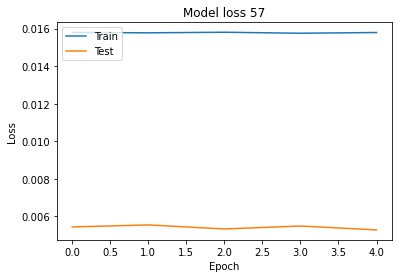

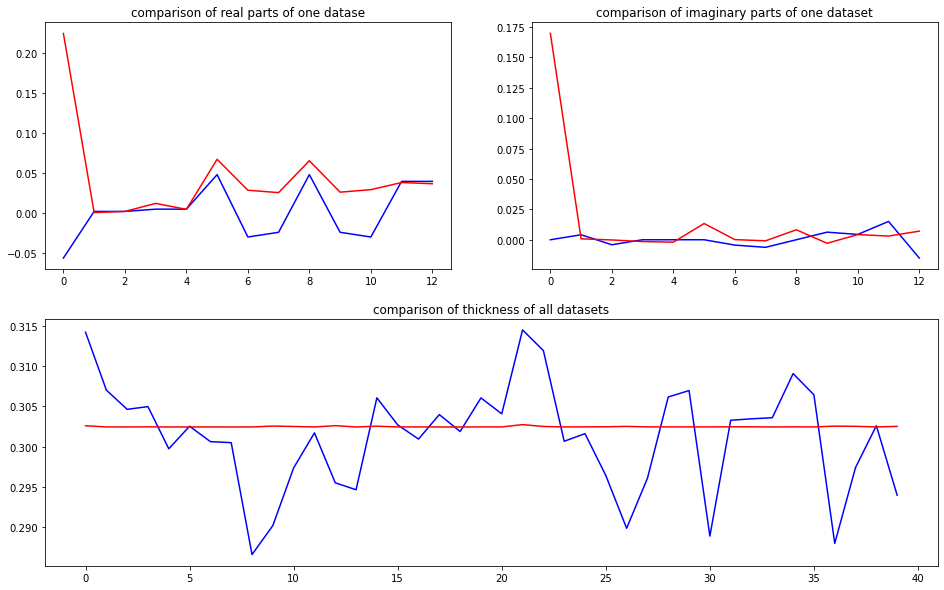

predicted thickness: 0.3023393


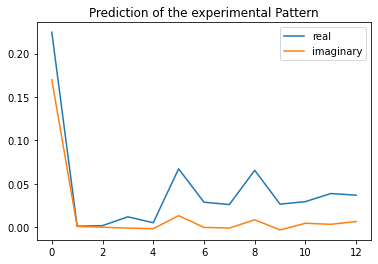

The offset applied on thickness: 0.00021937461673826353

The offset applied on Ug: -0.6683268876939845

Applied shift of unit cell origin (fractional coordinates): -0.005592972481949195 0.0028940966241967347
Ug[ 0 ]: 0.17156 0.0  =>  0.17156 0.0
Ug[ 1 ]: 0.00145 0.30362  =>  0.00145 0.32181
Ug[ 2 ]: 0.00145 -0.30362  =>  0.00145 -0.32181
Ug[ 3 ]: 0.00844 0.03514  =>  0.00844 -0.0
Ug[ 4 ]: 0.00844 -0.03514  =>  0.00844 0.0
Ug[ 5 ]: 0.06336 0.03637  =>  0.06336 0.0
Ug[ 6 ]: 0.02857 -0.083  =>  0.02857 -0.13633
Ug[ 7 ]: 0.02582 0.04211  =>  0.02582 0.05906
Ug[ 8 ]: 0.06336 -0.03637  =>  0.06336 -0.0
Ug[ 9 ]: 0.02582 -0.04211  =>  0.02582 -0.05906
Ug[ 10 ]: 0.02857 0.083  =>  0.02857 0.13633
Ug[ 11 ]: 0.03683 -0.04436  =>  0.03683 0.02593
Ug[ 12 ]: 0.03683 0.04436  =>  0.03683 -0.02593
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

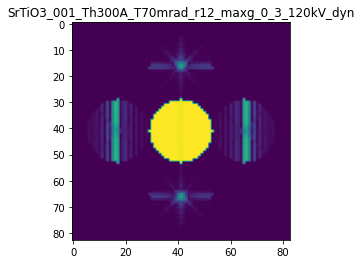

X_sim.max(): 0.9997770004617897
>>>replaced the 58. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 932ms/step - loss: 0.0158 - mean_absolute_error: 0.0358 - acc: 0.6100 - val_loss: 0.0053 - val_mean_absolute_error: 0.0282 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0160 - mean_absolute_error: 0.0366 - acc: 0.6100 - val_loss: 0.0050 - val_mean_absolute_error: 0.0283 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 2s 526ms/step - loss: 0.0159 - mean_absolute_error: 0.0381 - acc: 0.6100 - val_loss: 0.0056 - val_mean_absolute_error: 0.0315 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 3s 702ms/step - loss: 0.0158 - mean_absolute_error: 0.0379 - acc: 0.6100 - val_loss: 0.0053 - val_mean_absolute_error: 0.0311 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 4s 945ms/step - loss: 0.0159 - mean_absolute_error: 0.0368 - acc: 0.6100 - val_loss: 0.0051 - val_mean_abso

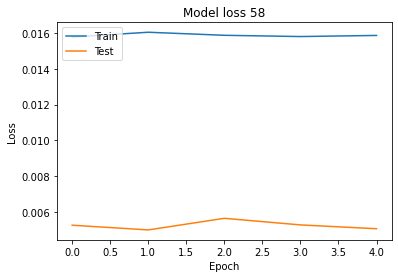

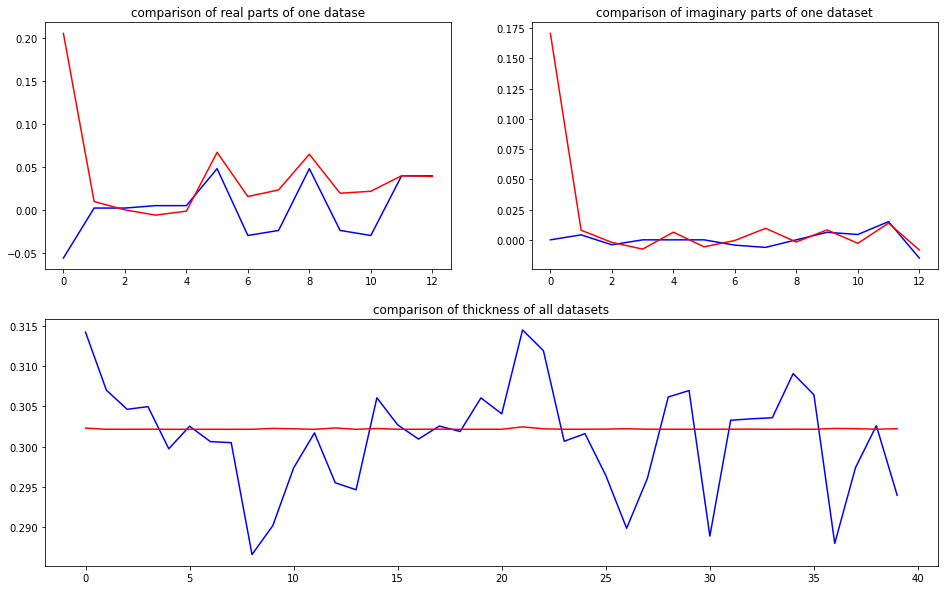

predicted thickness: 0.30208257


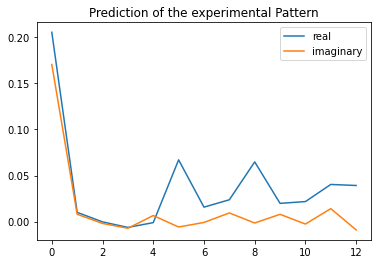

The offset applied on thickness: 0.00016505312757332847

The offset applied on Ug: 1.0309678668440965

Applied shift of unit cell origin (fractional coordinates): 0.32791811978518126 -0.002234339748601793
Ug[ 0 ]: 0.27922 0.0  =>  0.27922 0.0
Ug[ 1 ]: 0.00707 0.80164  =>  0.00707 0.7876
Ug[ 2 ]: 0.00707 -0.80164  =>  0.00707 -0.7876
Ug[ 3 ]: 0.00781 -2.06037  =>  0.00781 -0.0
Ug[ 4 ]: 0.00781 2.06037  =>  0.00781 0.0
Ug[ 5 ]: 0.07045 -0.02808  =>  0.07045 0.0
Ug[ 6 ]: 0.01908 0.03895  =>  0.01908 2.11336
Ug[ 7 ]: 0.02231 0.03792  =>  0.02231 -2.00841
Ug[ 8 ]: 0.07045 0.02808  =>  0.07045 0.0
Ug[ 9 ]: 0.02231 -0.03792  =>  0.02231 2.00841
Ug[ 10 ]: 0.01908 -0.03895  =>  0.01908 -2.11336
Ug[ 11 ]: 0.04313 0.27394  =>  0.04313 2.43638
Ug[ 12 ]: 0.04313 -0.27394  =>  0.04313 -2.43638
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

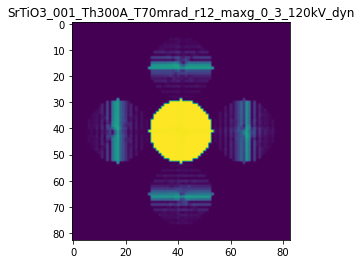

X_sim.max(): 0.9996267691242335
>>>replaced the 59. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 987ms/step - loss: 0.0158 - mean_absolute_error: 0.0367 - acc: 0.6100 - val_loss: 0.0044 - val_mean_absolute_error: 0.0284 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0158 - mean_absolute_error: 0.0361 - acc: 0.6100 - val_loss: 0.0046 - val_mean_absolute_error: 0.0277 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0158 - mean_absolute_error: 0.0358 - acc: 0.6100 - val_loss: 0.0045 - val_mean_absolute_error: 0.0270 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 4s 782ms/step - loss: 0.0157 - mean_absolute_error: 0.0353 - acc: 0.6100 - val_loss: 0.0045 - val_mean_absolute_error: 0.0276 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 950ms/step - loss: 0.0157 - mean_absolute_error: 0.0360 - acc: 0.6100 - val_loss: 0.0046 - val_mean_abso

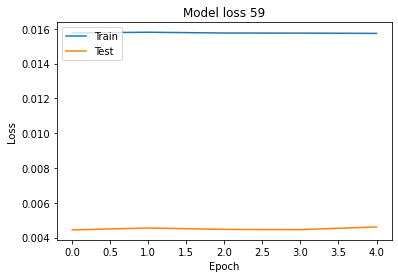

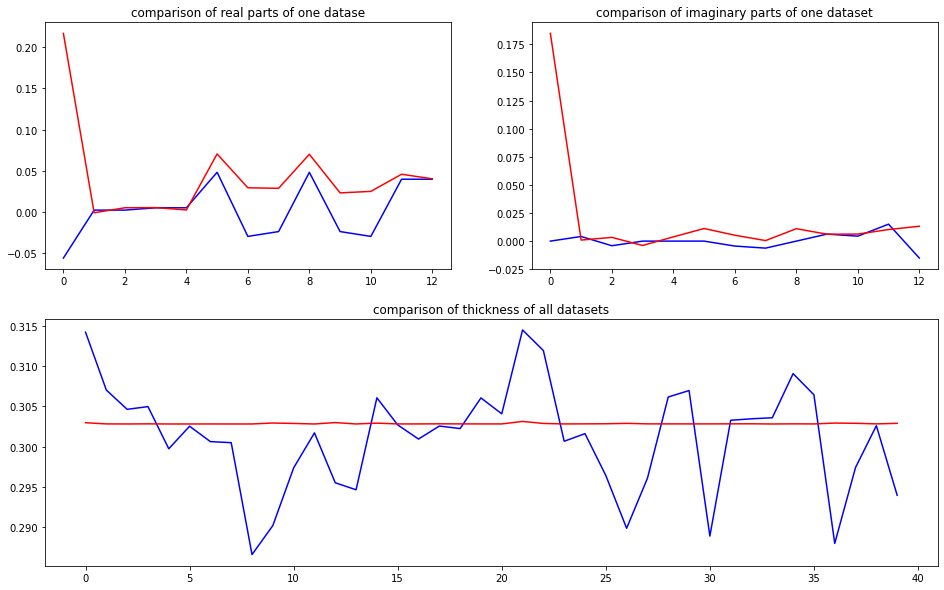

predicted thickness: 0.30275136


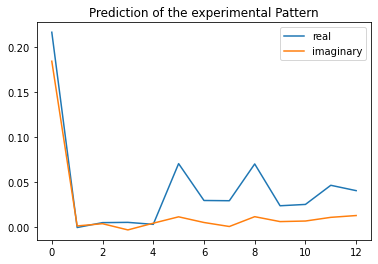

The offset applied on thickness: 0.0007811162257028093

The offset applied on Ug: 1.485950044585545

Applied shift of unit cell origin (fractional coordinates): 0.12246843545051327 -3.135871601167038e-05
Ug[ 0 ]: 0.33736 0.0  =>  0.33736 0.0
Ug[ 1 ]: 0.0023 -0.58401  =>  0.0023 -0.58421
Ug[ 2 ]: 0.0023 0.58401  =>  0.0023 0.58421
Ug[ 3 ]: 0.00537 -0.76949  =>  0.00537 0.0
Ug[ 4 ]: 0.00537 0.76949  =>  0.00537 0.0
Ug[ 5 ]: 0.07773 -0.00039  =>  0.07773 -0.0
Ug[ 6 ]: 0.02827 -0.02234  =>  0.02827 0.74735
Ug[ 7 ]: 0.02741 -0.09194  =>  0.02741 -0.86123
Ug[ 8 ]: 0.07773 0.00039  =>  0.07773 0.0
Ug[ 9 ]: 0.02741 0.09194  =>  0.02741 0.86123
Ug[ 10 ]: 0.02827 0.02234  =>  0.02827 -0.74735
Ug[ 11 ]: 0.04626 -0.01257  =>  0.04626 -1.55155
Ug[ 12 ]: 0.04626 0.01257  =>  0.04626 1.55155
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

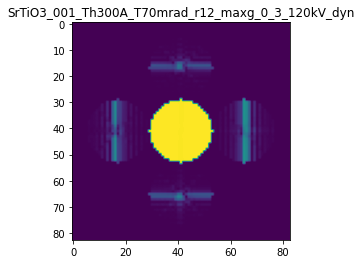

X_sim.max(): 0.9998547572140046
>>>replaced the 60. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 934ms/step - loss: 0.0158 - mean_absolute_error: 0.0362 - acc: 0.6000 - val_loss: 0.0043 - val_mean_absolute_error: 0.0273 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 2s 534ms/step - loss: 0.0159 - mean_absolute_error: 0.0382 - acc: 0.6000 - val_loss: 0.0048 - val_mean_absolute_error: 0.0301 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0157 - mean_absolute_error: 0.0380 - acc: 0.6000 - val_loss: 0.0044 - val_mean_absolute_error: 0.0292 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 4s 862ms/step - loss: 0.0159 - mean_absolute_error: 0.0384 - acc: 0.6000 - val_loss: 0.0045 - val_mean_absolute_error: 0.0281 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 4s 951ms/step - loss: 0.0158 - mean_absolute_error: 0.0373 - acc: 0.6000 - val_loss: 0.0043 - val_mean_abso

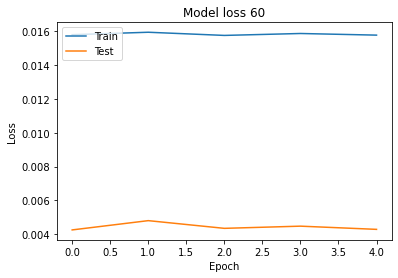

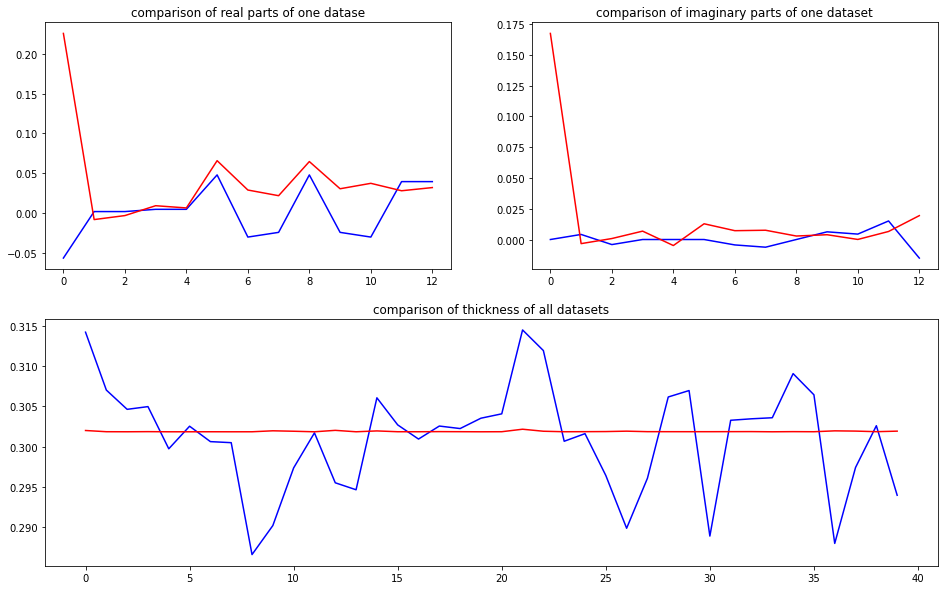

predicted thickness: 0.30179423


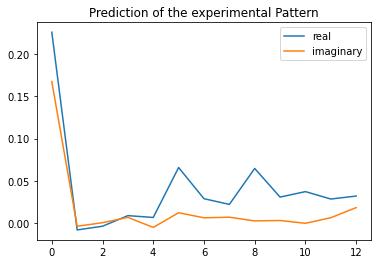

The offset applied on thickness: -0.0002535024323729458

The offset applied on Ug: -1.677893055853504

Applied shift of unit cell origin (fractional coordinates): -0.10093961007727577 0.0063431759042103025
Ug[ 0 ]: 0.09321 0.0  =>  0.09321 0.0
Ug[ 1 ]: 0.00591 -2.76642  =>  0.00591 -2.72657
Ug[ 2 ]: 0.00591 2.76642  =>  0.00591 2.72657
Ug[ 3 ]: 0.0099 0.63422  =>  0.0099 0.0
Ug[ 4 ]: 0.0099 -0.63422  =>  0.0099 0.0
Ug[ 5 ]: 0.05826 0.07971  =>  0.05826 0.0
Ug[ 6 ]: 0.03164 0.11403  =>  0.03164 -0.56005
Ug[ 7 ]: 0.02558 0.08753  =>  0.02558 0.68189
Ug[ 8 ]: 0.05826 -0.07971  =>  0.05826 0.0
Ug[ 9 ]: 0.02558 -0.08753  =>  0.02558 -0.68189
Ug[ 10 ]: 0.03164 -0.11403  =>  0.03164 0.56005
Ug[ 11 ]: 0.0292 -0.19281  =>  0.0292 1.07563
Ug[ 12 ]: 0.0292 0.19281  =>  0.0292 -1.07563
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

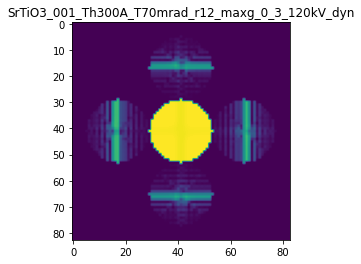

X_sim.max(): 0.9996751152877313
>>>replaced the 61. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 924ms/step - loss: 0.0156 - mean_absolute_error: 0.0357 - acc: 0.6000 - val_loss: 0.0042 - val_mean_absolute_error: 0.0270 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 2s 527ms/step - loss: 0.0156 - mean_absolute_error: 0.0356 - acc: 0.6000 - val_loss: 0.0043 - val_mean_absolute_error: 0.0276 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0157 - mean_absolute_error: 0.0362 - acc: 0.6000 - val_loss: 0.0043 - val_mean_absolute_error: 0.0276 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0157 - mean_absolute_error: 0.0358 - acc: 0.6000 - val_loss: 0.0042 - val_mean_absolute_error: 0.0275 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 952ms/step - loss: 0.0158 - mean_absolute_error: 0.0379 - acc: 0.6000 - val_loss: 0.0050 - val_mean_abso

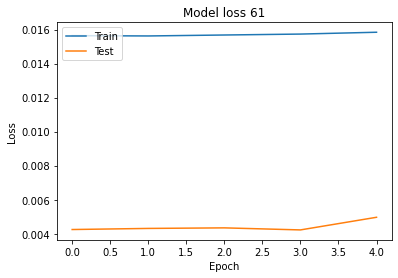

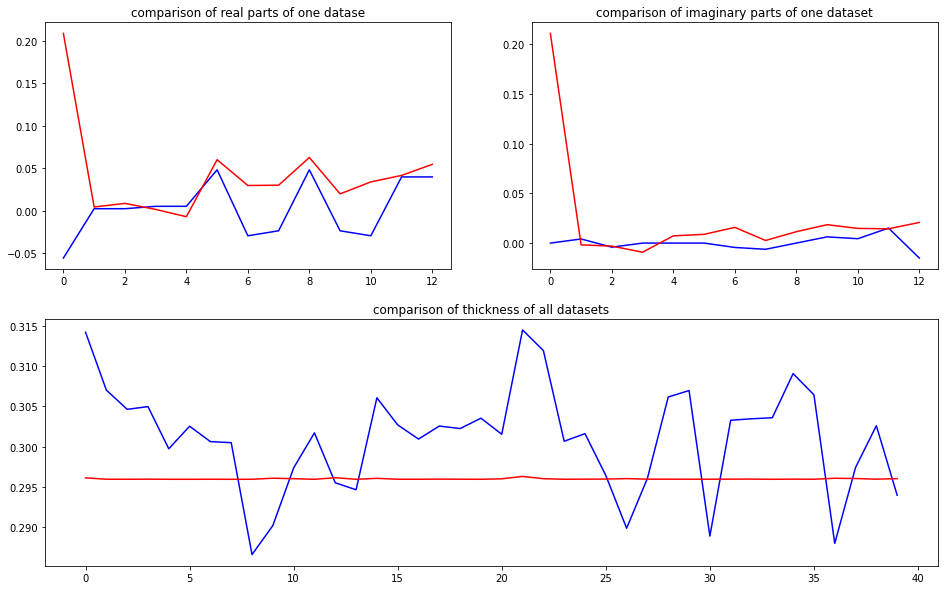

predicted thickness: 0.2959348


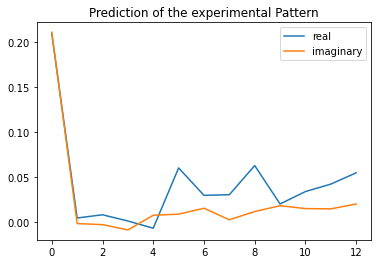

The offset applied on thickness: -0.0007232122946367709

The offset applied on Ug: 1.896367855212356

Applied shift of unit cell origin (fractional coordinates): 0.3013591063489474 -0.002262195425588106
Ug[ 0 ]: 0.37627 0.0  =>  0.37627 0.0
Ug[ 1 ]: 0.00634 0.08534  =>  0.00634 0.07113
Ug[ 2 ]: 0.00634 -0.08534  =>  0.00634 -0.07113
Ug[ 3 ]: 0.00862 -1.8935  =>  0.00862 0.0
Ug[ 4 ]: 0.00862 1.8935  =>  0.00862 -0.0
Ug[ 5 ]: 0.06872 -0.02843  =>  0.06872 0.0
Ug[ 6 ]: 0.03404 -0.00283  =>  0.03404 1.90488
Ug[ 7 ]: 0.02778 -0.27546  =>  0.02778 -2.15475
Ug[ 8 ]: 0.06872 0.02843  =>  0.06872 0.0
Ug[ 9 ]: 0.02778 0.27546  =>  0.02778 2.15475
Ug[ 10 ]: 0.03404 0.00283  =>  0.03404 -1.90488
Ug[ 11 ]: 0.05361 -0.08299  =>  0.05361 2.41321
Ug[ 12 ]: 0.05361 0.08299  =>  0.05361 -2.41321
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

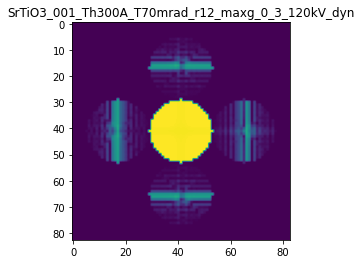

X_sim.max(): 0.9996359262865151
>>>replaced the 62. dataset and train: 
Epoch 1/5
5/5 [==============================] - 8s 1s/step - loss: 0.0158 - mean_absolute_error: 0.0386 - acc: 0.5900 - val_loss: 0.0044 - val_mean_absolute_error: 0.0304 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 576ms/step - loss: 0.0157 - mean_absolute_error: 0.0383 - acc: 0.5900 - val_loss: 0.0047 - val_mean_absolute_error: 0.0317 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 4s 881ms/step - loss: 0.0157 - mean_absolute_error: 0.0382 - acc: 0.5900 - val_loss: 0.0043 - val_mean_absolute_error: 0.0297 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 5s 968ms/step - loss: 0.0157 - mean_absolute_error: 0.0368 - acc: 0.5900 - val_loss: 0.0043 - val_mean_absolute_error: 0.0279 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 949ms/step - loss: 0.0157 - mean_absolute_error: 0.0370 - acc: 0.5900 - val_loss: 0.0044 - val_mean_absolut

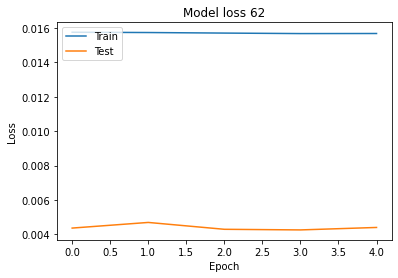

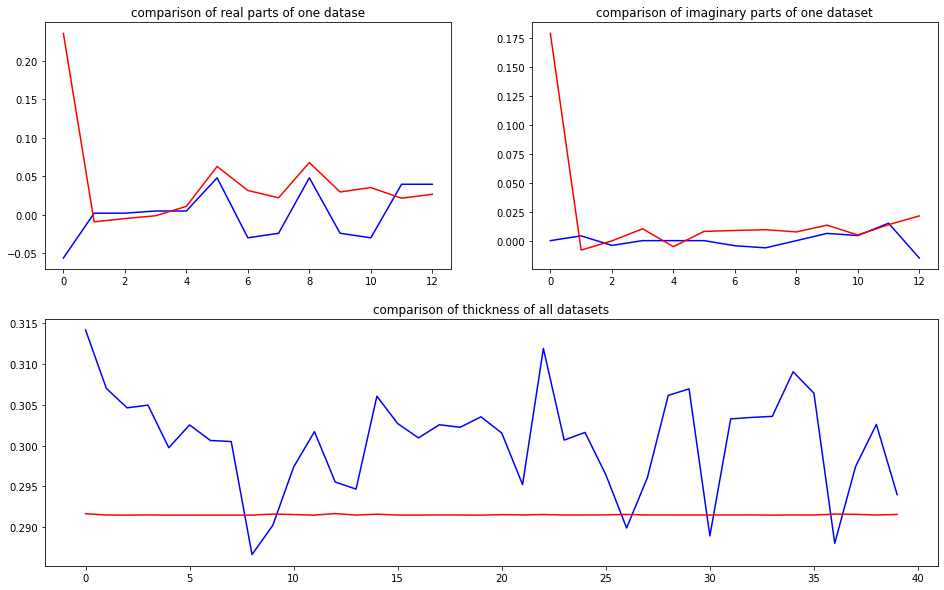

predicted thickness: 0.29144198


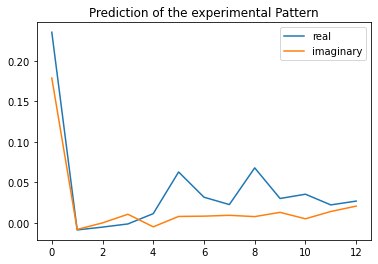

The offset applied on thickness: 0.0004261827716745985

The offset applied on Ug: -2.549326801603973

Applied shift of unit cell origin (fractional coordinates): -0.16447011268514303 0.0008269784166834393
Ug[ 0 ]: 0.01247 0.0  =>  0.01247 0.0
Ug[ 1 ]: 0.00837 -2.61665  =>  0.00837 -2.61145
Ug[ 2 ]: 0.00837 2.61665  =>  0.00837 2.61145
Ug[ 3 ]: 0.00909 1.0334  =>  0.00909 0.0
Ug[ 4 ]: 0.00909 -1.0334  =>  0.00909 -0.0
Ug[ 5 ]: 0.05432 0.01039  =>  0.05432 0.0
Ug[ 6 ]: 0.03058 0.05972  =>  0.03058 -0.97887
Ug[ 7 ]: 0.02423 -0.05499  =>  0.02423 0.97321
Ug[ 8 ]: 0.05432 -0.01039  =>  0.05432 0.0
Ug[ 9 ]: 0.02423 0.05499  =>  0.02423 -0.97321
Ug[ 10 ]: 0.03058 -0.05972  =>  0.03058 0.97887
Ug[ 11 ]: 0.02235 -0.1267  =>  0.02235 1.94009
Ug[ 12 ]: 0.02235 0.1267  =>  0.02235 -1.94009
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

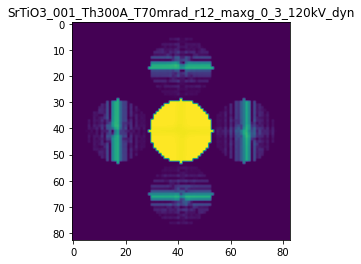

X_sim.max(): 0.9998890982267734
>>>replaced the 63. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0370 - acc: 0.5900 - val_loss: 0.0040 - val_mean_absolute_error: 0.0268 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 4s 835ms/step - loss: 0.0157 - mean_absolute_error: 0.0360 - acc: 0.5900 - val_loss: 0.0040 - val_mean_absolute_error: 0.0270 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 4s 820ms/step - loss: 0.0156 - mean_absolute_error: 0.0359 - acc: 0.5900 - val_loss: 0.0039 - val_mean_absolute_error: 0.0273 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 4s 762ms/step - loss: 0.0156 - mean_absolute_error: 0.0357 - acc: 0.5900 - val_loss: 0.0040 - val_mean_absolute_error: 0.0275 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 851ms/step - loss: 0.0156 - mean_absolute_error: 0.0361 - acc: 0.5900 - val_loss: 0.0041 - val_mean_absolut

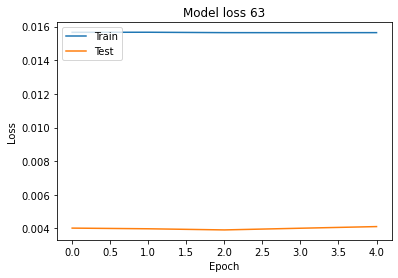

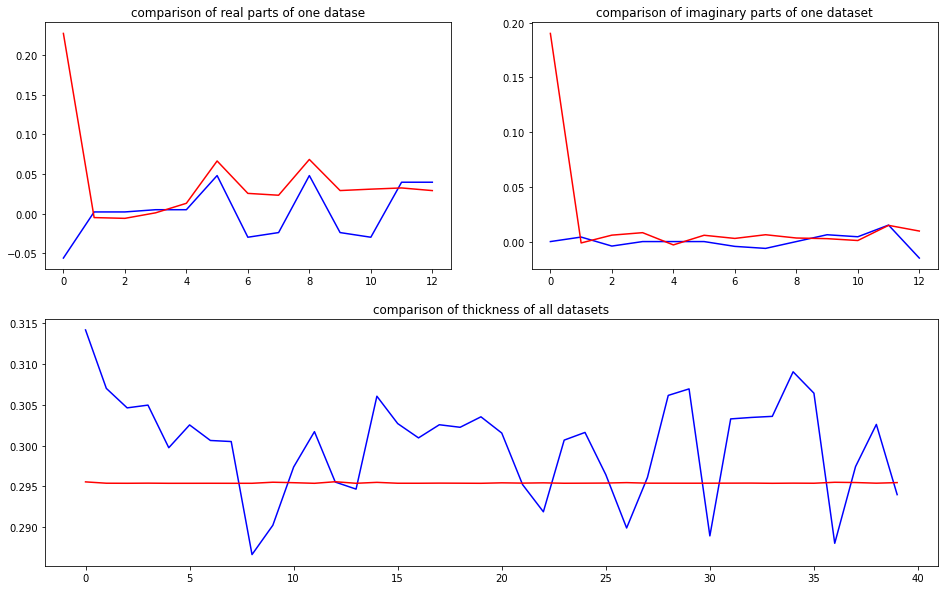

predicted thickness: 0.29536933


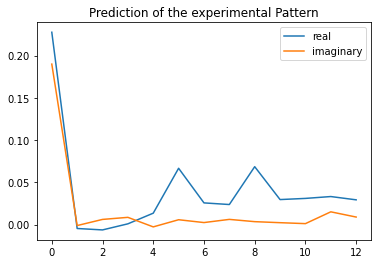

The offset applied on thickness: -0.0008156433440540838

The offset applied on Ug: -1.506881289190553

Applied shift of unit cell origin (fractional coordinates): -0.10985699643513251 0.0016517079992454757
Ug[ 0 ]: 0.09519 0.0  =>  0.09519 0.0
Ug[ 1 ]: 0.00667 -2.57225  =>  0.00667 -2.56187
Ug[ 2 ]: 0.00667 2.57225  =>  0.00667 2.56187
Ug[ 3 ]: 0.009 0.69025  =>  0.009 0.0
Ug[ 4 ]: 0.009 -0.69025  =>  0.009 -0.0
Ug[ 5 ]: 0.06066 0.02076  =>  0.06066 -0.0
Ug[ 6 ]: 0.02707 0.03049  =>  0.02707 -0.67014
Ug[ 7 ]: 0.0256 0.08369  =>  0.0256 0.76356
Ug[ 8 ]: 0.06066 -0.02076  =>  0.06066 0.0
Ug[ 9 ]: 0.0256 -0.08369  =>  0.0256 -0.76356
Ug[ 10 ]: 0.02707 -0.03049  =>  0.02707 0.67014
Ug[ 11 ]: 0.02962 0.09589  =>  0.02962 1.47639
Ug[ 12 ]: 0.02962 -0.09589  =>  0.02962 -1.47639
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

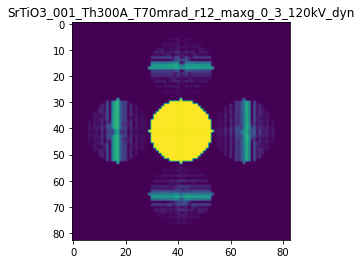

X_sim.max(): 0.9999124231710046
>>>replaced the 64. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0365 - acc: 0.5900 - val_loss: 0.0039 - val_mean_absolute_error: 0.0266 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 4s 862ms/step - loss: 0.0157 - mean_absolute_error: 0.0358 - acc: 0.5900 - val_loss: 0.0035 - val_mean_absolute_error: 0.0262 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 4s 885ms/step - loss: 0.0157 - mean_absolute_error: 0.0360 - acc: 0.5900 - val_loss: 0.0036 - val_mean_absolute_error: 0.0264 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 4s 916ms/step - loss: 0.0157 - mean_absolute_error: 0.0374 - acc: 0.5900 - val_loss: 0.0038 - val_mean_absolute_error: 0.0268 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 869ms/step - loss: 0.0157 - mean_absolute_error: 0.0372 - acc: 0.5900 - val_loss: 0.0038 - val_mean_absolut

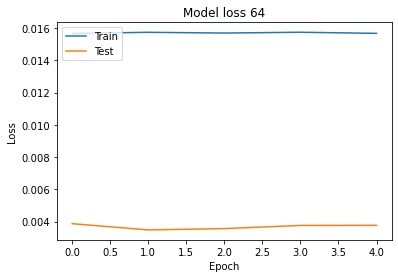

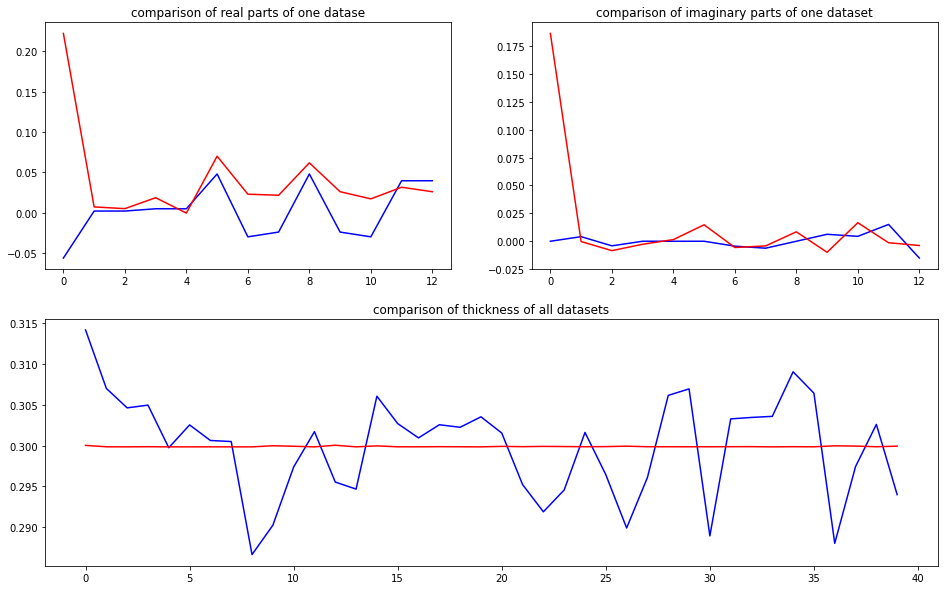

predicted thickness: 0.2998628


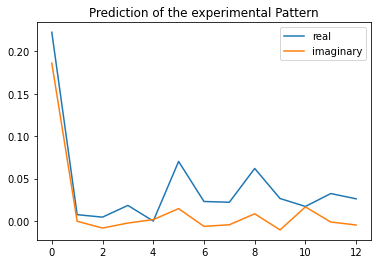

The offset applied on thickness: -0.00026771898383684946

The offset applied on Ug: -0.7255849639202757

Applied shift of unit cell origin (fractional coordinates): 0.037120278619080356 0.0033503240446786974
Ug[ 0 ]: 0.16138 0.0  =>  0.16138 0.0
Ug[ 1 ]: 0.00725 0.58621  =>  0.00725 0.60726
Ug[ 2 ]: 0.00725 -0.58621  =>  0.00725 -0.60726
Ug[ 3 ]: 0.00937 -0.23323  =>  0.00937 0.0
Ug[ 4 ]: 0.00937 0.23323  =>  0.00937 0.0
Ug[ 5 ]: 0.06286 0.0421  =>  0.06286 0.0
Ug[ 6 ]: 0.0228 -0.52525  =>  0.0228 -0.31307
Ug[ 7 ]: 0.02409 0.13027  =>  0.02409 -0.12401
Ug[ 8 ]: 0.06286 -0.0421  =>  0.06286 0.0
Ug[ 9 ]: 0.02409 -0.13027  =>  0.02409 0.12401
Ug[ 10 ]: 0.0228 0.52525  =>  0.0228 0.31307
Ug[ 11 ]: 0.02872 0.05705  =>  0.02872 -0.40942
Ug[ 12 ]: 0.02872 -0.05705  =>  0.02872 0.40942
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

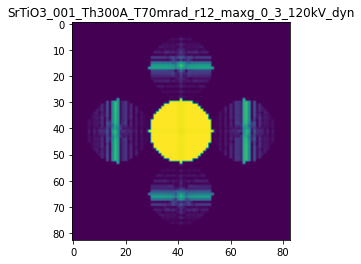

X_sim.max(): 0.9990431706087803
>>>replaced the 65. dataset and train: 
Epoch 1/5
5/5 [==============================] - 11s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0361 - acc: 0.5900 - val_loss: 0.0035 - val_mean_absolute_error: 0.0259 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 4s 908ms/step - loss: 0.0156 - mean_absolute_error: 0.0361 - acc: 0.5900 - val_loss: 0.0036 - val_mean_absolute_error: 0.0266 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 5s 979ms/step - loss: 0.0157 - mean_absolute_error: 0.0357 - acc: 0.5900 - val_loss: 0.0035 - val_mean_absolute_error: 0.0253 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 5s 1s/step - loss: 0.0156 - mean_absolute_error: 0.0359 - acc: 0.5900 - val_loss: 0.0037 - val_mean_absolute_error: 0.0265 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 6s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0367 - acc: 0.5900 - val_loss: 0.0040 - val_mean_absolute_err

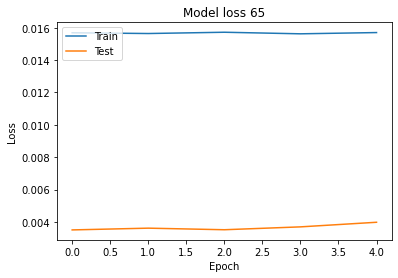

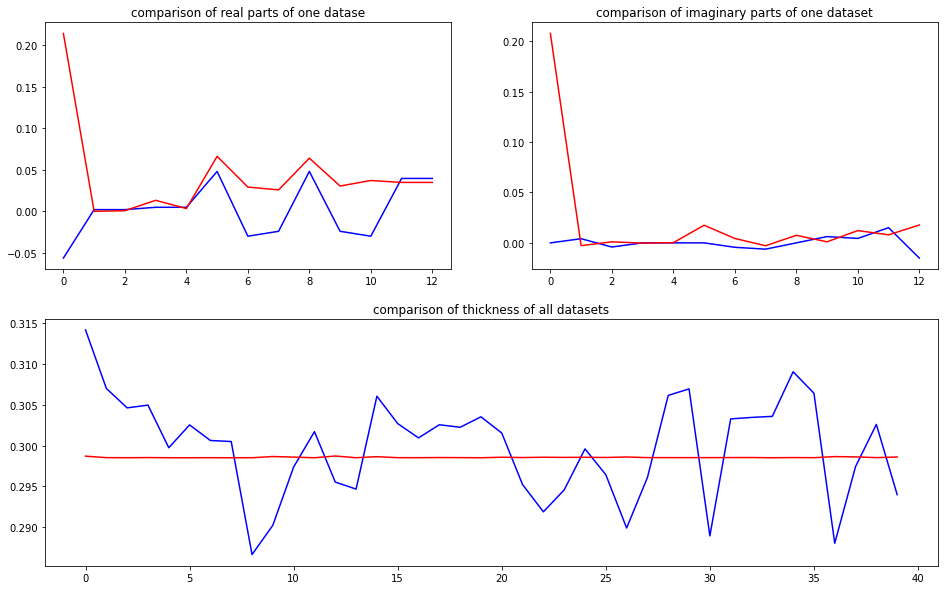

predicted thickness: 0.29855612


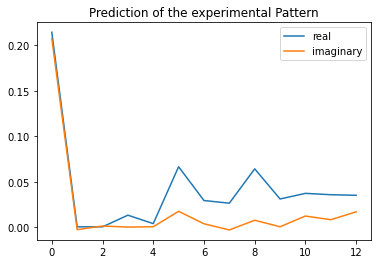

The offset applied on thickness: -0.0005170555214643095

The offset applied on Ug: 2.47326171147563

Applied shift of unit cell origin (fractional coordinates): -0.0003388896584669661 0.006149653253216527
Ug[ 0 ]: 0.43417 0.0  =>  0.43417 0.0
Ug[ 1 ]: 0.00201 -1.37803  =>  0.00201 -1.33939
Ug[ 2 ]: 0.00201 1.37803  =>  0.00201 1.33939
Ug[ 3 ]: 0.00877 0.00213  =>  0.00877 0.0
Ug[ 4 ]: 0.00877 -0.00213  =>  0.00877 -0.0
Ug[ 5 ]: 0.0765 0.07728  =>  0.0765 -0.0
Ug[ 6 ]: 0.03658 -0.14438  =>  0.03658 -0.18515
Ug[ 7 ]: 0.0308 -0.06924  =>  0.0308 -0.10575
Ug[ 8 ]: 0.0765 -0.07728  =>  0.0765 0.0
Ug[ 9 ]: 0.0308 0.06924  =>  0.0308 0.10575
Ug[ 10 ]: 0.03658 0.14438  =>  0.03658 0.18515
Ug[ 11 ]: 0.03915 -0.11734  =>  0.03915 -0.11308
Ug[ 12 ]: 0.03915 0.11734  =>  0.03915 0.11308
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

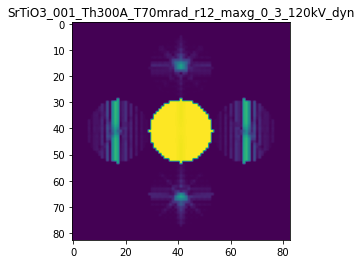

X_sim.max(): 0.9997445552107682
>>>replaced the 66. dataset and train: 
Epoch 1/5
5/5 [==============================] - 12s 2s/step - loss: 0.0157 - mean_absolute_error: 0.0368 - acc: 0.5800 - val_loss: 0.0036 - val_mean_absolute_error: 0.0257 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 5s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0358 - acc: 0.5800 - val_loss: 0.0032 - val_mean_absolute_error: 0.0247 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 4s 942ms/step - loss: 0.0156 - mean_absolute_error: 0.0366 - acc: 0.5800 - val_loss: 0.0036 - val_mean_absolute_error: 0.0270 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 4s 956ms/step - loss: 0.0157 - mean_absolute_error: 0.0366 - acc: 0.5800 - val_loss: 0.0038 - val_mean_absolute_error: 0.0282 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 3s 525ms/step - loss: 0.0158 - mean_absolute_error: 0.0370 - acc: 0.5800 - val_loss: 0.0039 - val_mean_absolute_

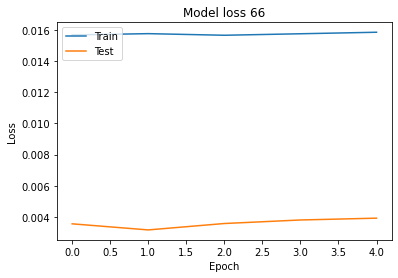

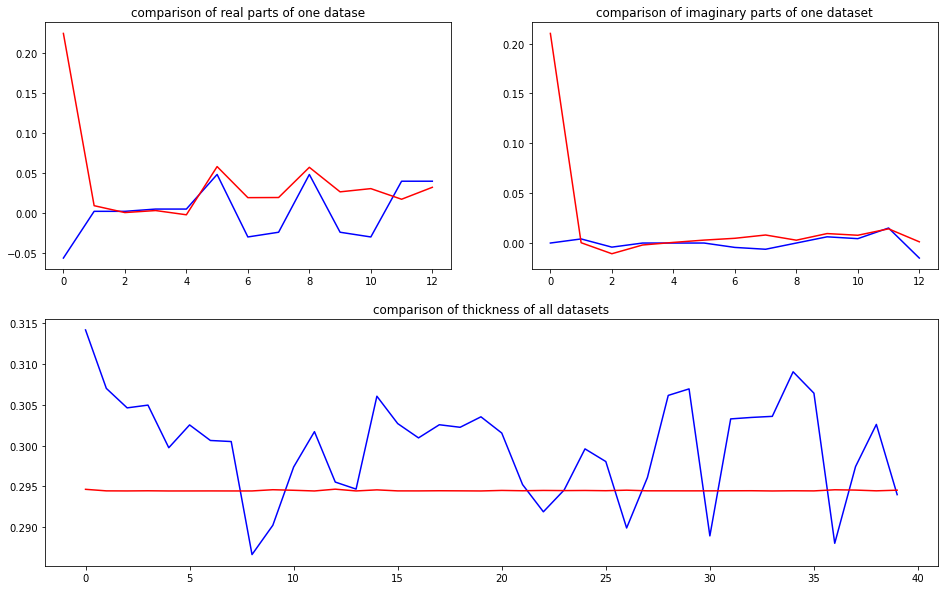

predicted thickness: 0.29450434


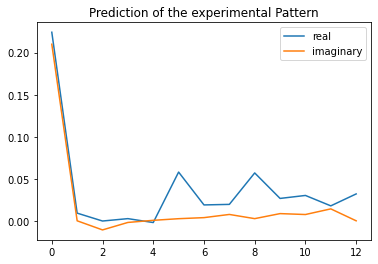

The offset applied on thickness: 0.00044740794112937857

The offset applied on Ug: -2.35917390132115

Applied shift of unit cell origin (fractional coordinates): 0.18050978029207856 -0.00019325302457712555
Ug[ 0 ]: 0.00172 0.0  =>  0.00172 0.0
Ug[ 1 ]: 0.00708 0.87475  =>  0.00708 0.87354
Ug[ 2 ]: 0.00708 -0.87475  =>  0.00708 -0.87354
Ug[ 3 ]: 0.0014 -1.13418  =>  0.0014 0.0
Ug[ 4 ]: 0.0014 1.13418  =>  0.0014 -0.0
Ug[ 5 ]: 0.04979 -0.00243  =>  0.04979 -0.0
Ug[ 6 ]: 0.02323 -0.05415  =>  0.02323 1.08124
Ug[ 7 ]: 0.02188 -0.00716  =>  0.02188 -1.14012
Ug[ 8 ]: 0.04979 0.00243  =>  0.04979 0.0
Ug[ 9 ]: 0.02188 0.00716  =>  0.02188 1.14012
Ug[ 10 ]: 0.02323 0.05415  =>  0.02323 -1.08124
Ug[ 11 ]: 0.02449 0.31302  =>  0.02449 -1.95533
Ug[ 12 ]: 0.02449 -0.31302  =>  0.02449 1.95533
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

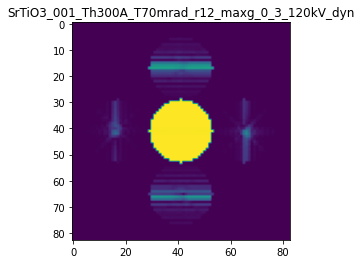

X_sim.max(): 0.9998514144535634
>>>replaced the 67. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 931ms/step - loss: 0.0154 - mean_absolute_error: 0.0361 - acc: 0.5900 - val_loss: 0.0032 - val_mean_absolute_error: 0.0247 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 691ms/step - loss: 0.0154 - mean_absolute_error: 0.0348 - acc: 0.5900 - val_loss: 0.0032 - val_mean_absolute_error: 0.0266 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 5s 969ms/step - loss: 0.0154 - mean_absolute_error: 0.0367 - acc: 0.5900 - val_loss: 0.0034 - val_mean_absolute_error: 0.0267 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 5s 970ms/step - loss: 0.0153 - mean_absolute_error: 0.0367 - acc: 0.5900 - val_loss: 0.0034 - val_mean_absolute_error: 0.0253 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 5s 968ms/step - loss: 0.0153 - mean_absolute_error: 0.0368 - acc: 0.5900 - val_loss: 0.0034 - val_mean_abso

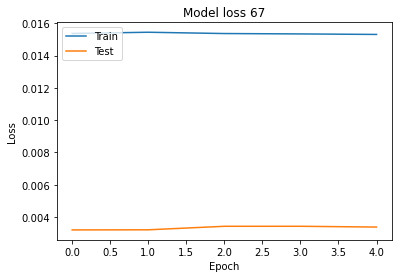

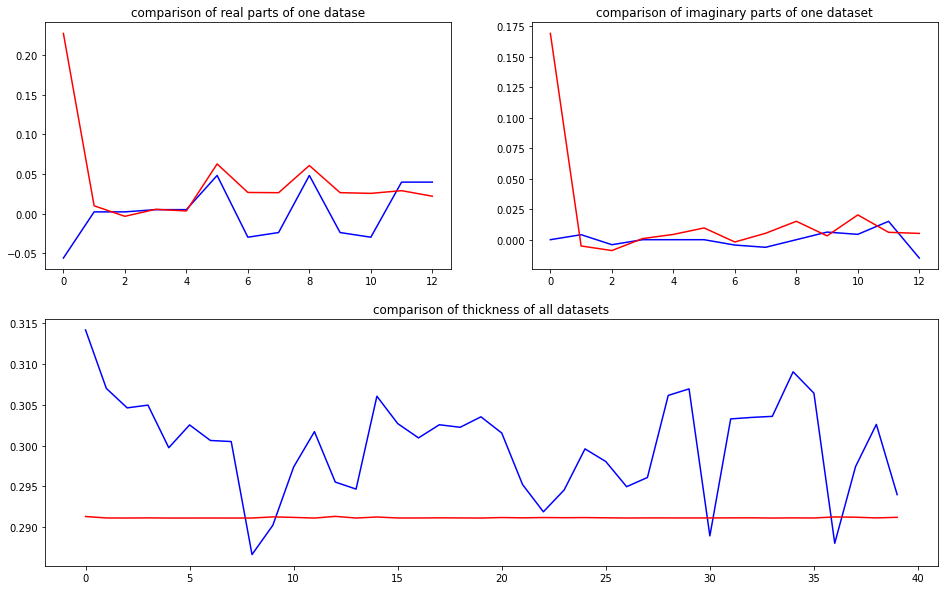

predicted thickness: 0.29117742


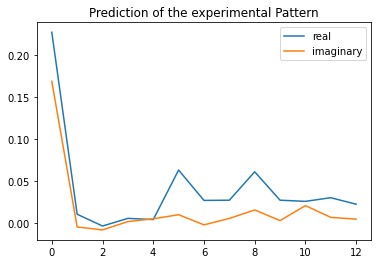

The offset applied on thickness: -0.0005640470617309605

The offset applied on Ug: 0.12806169935727457

Applied shift of unit cell origin (fractional coordinates): 0.05708935531543066 -0.0035868306890113394
Ug[ 0 ]: 0.23767 0.0  =>  0.23767 0.0
Ug[ 1 ]: 0.00354 0.52005  =>  0.00354 0.49751
Ug[ 2 ]: 0.00354 -0.52005  =>  0.00354 -0.49751
Ug[ 3 ]: 0.00477 -0.3587  =>  0.00477 0.0
Ug[ 4 ]: 0.00477 0.3587  =>  0.00477 -0.0
Ug[ 5 ]: 0.06239 -0.04507  =>  0.06239 -0.0
Ug[ 6 ]: 0.02858 -0.41403  =>  0.02858 -0.03279
Ug[ 7 ]: 0.02699 0.04763  =>  0.02699 -0.28854
Ug[ 8 ]: 0.06239 0.04507  =>  0.06239 0.0
Ug[ 9 ]: 0.02699 -0.04763  =>  0.02699 0.28854
Ug[ 10 ]: 0.02858 0.41403  =>  0.02858 0.03279
Ug[ 11 ]: 0.02607 0.04179  =>  0.02607 -0.67561
Ug[ 12 ]: 0.02607 -0.04179  =>  0.02607 0.67561
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

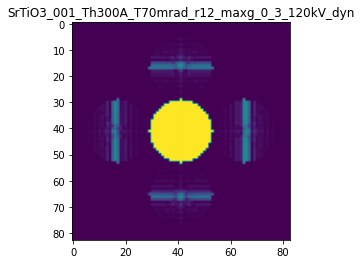

X_sim.max(): 0.9998020523611089
>>>replaced the 68. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 950ms/step - loss: 0.0140 - mean_absolute_error: 0.0357 - acc: 0.6000 - val_loss: 0.0031 - val_mean_absolute_error: 0.0252 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0139 - mean_absolute_error: 0.0342 - acc: 0.6000 - val_loss: 0.0027 - val_mean_absolute_error: 0.0229 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 658ms/step - loss: 0.0140 - mean_absolute_error: 0.0333 - acc: 0.6000 - val_loss: 0.0024 - val_mean_absolute_error: 0.0224 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 4s 939ms/step - loss: 0.0139 - mean_absolute_error: 0.0339 - acc: 0.6000 - val_loss: 0.0025 - val_mean_absolute_error: 0.0234 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 956ms/step - loss: 0.0140 - mean_absolute_error: 0.0334 - acc: 0.6000 - val_loss: 0.0028 - val_mean_abso

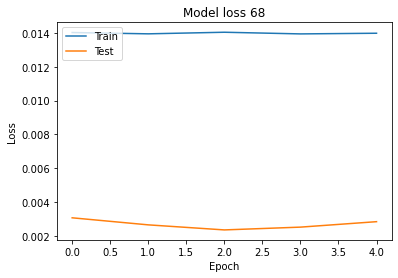

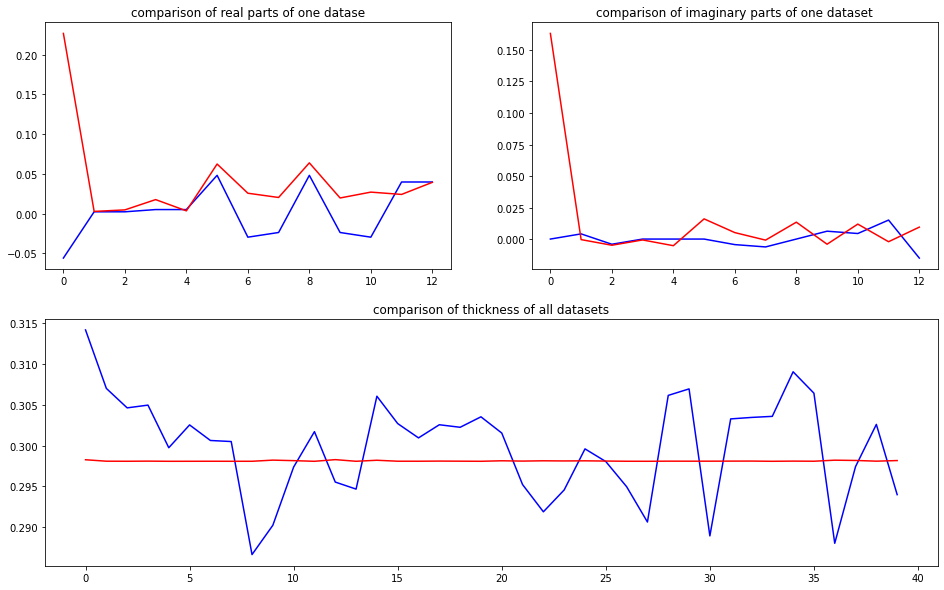

predicted thickness: 0.29816726


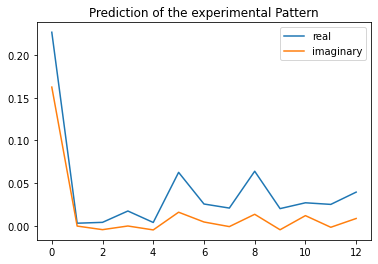

The offset applied on thickness: -0.00022217611779359658

The offset applied on Ug: 0.29658919530918004

Applied shift of unit cell origin (fractional coordinates): -0.03447404114045285 0.0014914367364605504
Ug[ 0 ]: 0.2501 0.0  =>  0.2501 0.0
Ug[ 1 ]: 0.00406 0.54392  =>  0.00406 0.55329
Ug[ 2 ]: 0.00406 -0.54392  =>  0.00406 -0.55329
Ug[ 3 ]: 0.01087 0.21661  =>  0.01087 -0.0
Ug[ 4 ]: 0.01087 -0.21661  =>  0.01087 0.0
Ug[ 5 ]: 0.06455 0.01874  =>  0.06455 0.0
Ug[ 6 ]: 0.02671 -0.14125  =>  0.02671 -0.36723
Ug[ 7 ]: 0.02062 0.09011  =>  0.02062 0.29734
Ug[ 8 ]: 0.06455 -0.01874  =>  0.06455 0.0
Ug[ 9 ]: 0.02062 -0.09011  =>  0.02062 -0.29734
Ug[ 10 ]: 0.02671 0.14125  =>  0.02671 0.36723
Ug[ 11 ]: 0.033 -0.16147  =>  0.033 0.27174
Ug[ 12 ]: 0.033 0.16147  =>  0.033 -0.27174
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

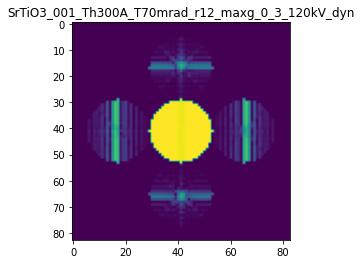

X_sim.max(): 0.999525774667536
>>>replaced the 69. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 962ms/step - loss: 0.0122 - mean_absolute_error: 0.0334 - acc: 0.6100 - val_loss: 0.0026 - val_mean_absolute_error: 0.0235 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 540ms/step - loss: 0.0122 - mean_absolute_error: 0.0334 - acc: 0.6100 - val_loss: 0.0026 - val_mean_absolute_error: 0.0243 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 535ms/step - loss: 0.0121 - mean_absolute_error: 0.0327 - acc: 0.6100 - val_loss: 0.0023 - val_mean_absolute_error: 0.0222 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0121 - mean_absolute_error: 0.0315 - acc: 0.6100 - val_loss: 0.0023 - val_mean_absolute_error: 0.0215 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 3s 773ms/step - loss: 0.0122 - mean_absolute_error: 0.0316 - acc: 0.6100 - val_loss: 0.0021 - val_mean_absol

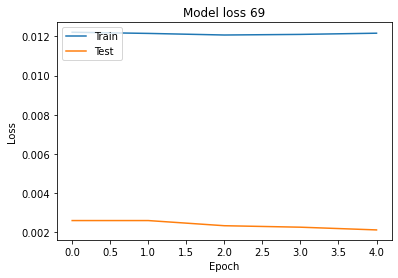

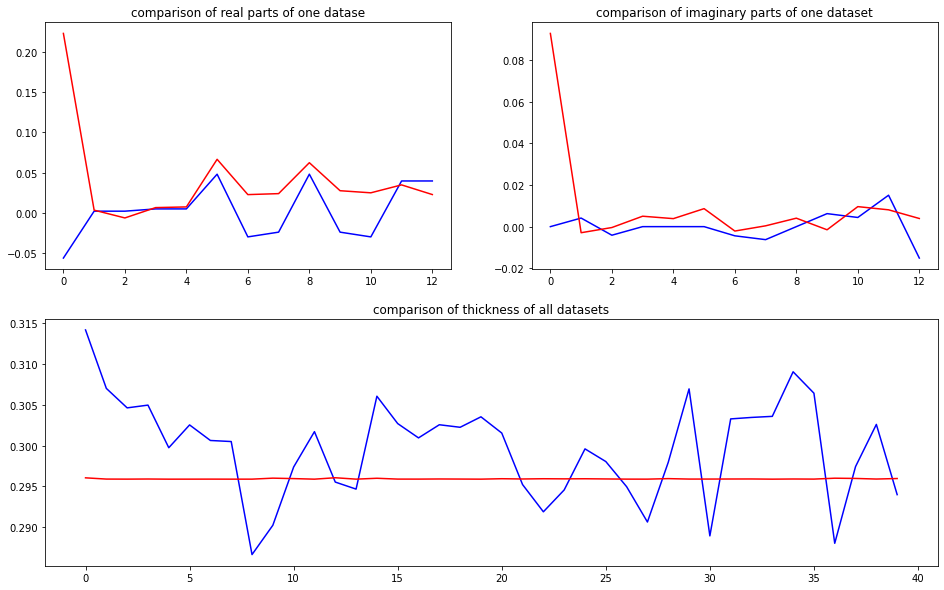

predicted thickness: 0.29595003


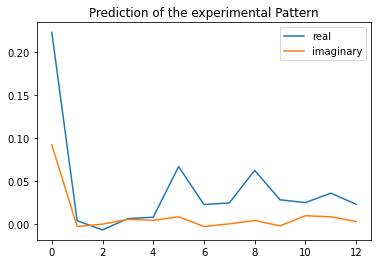

The offset applied on thickness: -0.00033213056468073623

The offset applied on Ug: -2.271468097389779

Applied shift of unit cell origin (fractional coordinates): -0.013484545269040934 0.0025174857333669144
Ug[ 0 ]: 0.09075 0.0  =>  0.09075 0.0
Ug[ 1 ]: 0.00208 -2.44599  =>  0.00208 -2.43017
Ug[ 2 ]: 0.00208 2.44599  =>  0.00208 2.43017
Ug[ 3 ]: 0.00698 0.08473  =>  0.00698 0.0
Ug[ 4 ]: 0.00698 -0.08473  =>  0.00698 0.0
Ug[ 5 ]: 0.05511 0.03164  =>  0.05511 0.0
Ug[ 6 ]: 0.02321 -0.26491  =>  0.02321 -0.36545
Ug[ 7 ]: 0.02482 0.05435  =>  0.02482 0.12325
Ug[ 8 ]: 0.05511 -0.03164  =>  0.05511 0.0
Ug[ 9 ]: 0.02482 -0.05435  =>  0.02482 -0.12325
Ug[ 10 ]: 0.02321 0.26491  =>  0.02321 0.36545
Ug[ 11 ]: 0.02738 0.07293  =>  0.02738 0.24238
Ug[ 12 ]: 0.02738 -0.07293  =>  0.02738 -0.24238
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

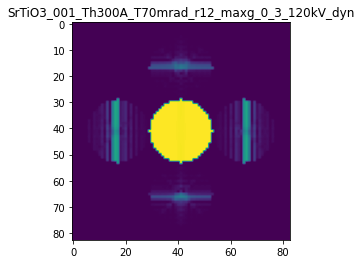

X_sim.max(): 0.9998325205234231
>>>replaced the 70. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 956ms/step - loss: 0.0114 - mean_absolute_error: 0.0309 - acc: 0.6200 - val_loss: 0.0022 - val_mean_absolute_error: 0.0223 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 561ms/step - loss: 0.0114 - mean_absolute_error: 0.0312 - acc: 0.6200 - val_loss: 0.0022 - val_mean_absolute_error: 0.0224 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0114 - mean_absolute_error: 0.0313 - acc: 0.6200 - val_loss: 0.0021 - val_mean_absolute_error: 0.0210 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0114 - mean_absolute_error: 0.0310 - acc: 0.6200 - val_loss: 0.0020 - val_mean_absolute_error: 0.0212 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 786ms/step - loss: 0.0114 - mean_absolute_error: 0.0310 - acc: 0.6200 - val_loss: 0.0021 - val_mean_abso

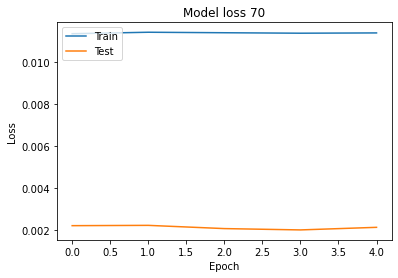

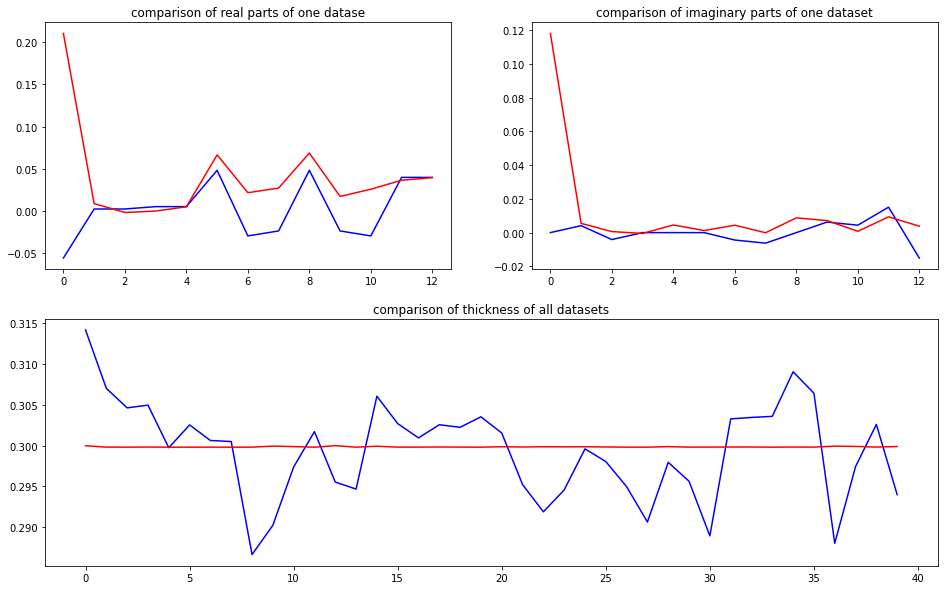

predicted thickness: 0.29991394


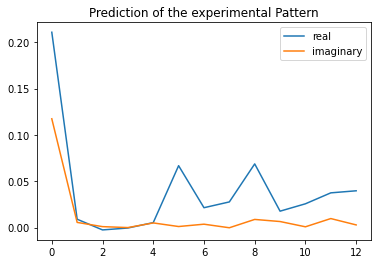

The offset applied on thickness: -0.0009557288405859444

The offset applied on Ug: 0.13159862065243724

Applied shift of unit cell origin (fractional coordinates): 0.1296233305342139 -0.004483985653266515
Ug[ 0 ]: 0.21852 0.0  =>  0.21852 0.0
Ug[ 1 ]: 0.00392 0.62338  =>  0.00392 0.5952
Ug[ 2 ]: 0.00392 -0.62338  =>  0.00392 -0.5952
Ug[ 3 ]: 0.00346 -0.81445  =>  0.00346 -0.0
Ug[ 4 ]: 0.00346 0.81445  =>  0.00346 0.0
Ug[ 5 ]: 0.06844 -0.05635  =>  0.06844 0.0
Ug[ 6 ]: 0.02362 0.05905  =>  0.02362 0.90167
Ug[ 7 ]: 0.02296 -0.14581  =>  0.02296 -0.93208
Ug[ 8 ]: 0.06844 0.05635  =>  0.06844 0.0
Ug[ 9 ]: 0.02296 0.14581  =>  0.02296 0.93208
Ug[ 10 ]: 0.02362 -0.05905  =>  0.02362 -0.90167
Ug[ 11 ]: 0.03889 0.08825  =>  0.03889 -1.54065
Ug[ 12 ]: 0.03889 -0.08825  =>  0.03889 1.54065
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

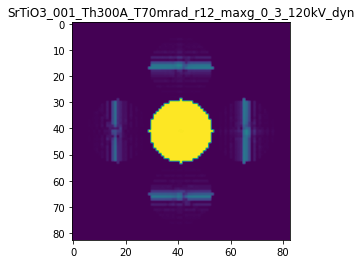

X_sim.max(): 0.9998231744424931
>>>replaced the 71. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 958ms/step - loss: 0.0111 - mean_absolute_error: 0.0300 - acc: 0.6300 - val_loss: 0.0018 - val_mean_absolute_error: 0.0198 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0111 - mean_absolute_error: 0.0296 - acc: 0.6300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0197 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0112 - mean_absolute_error: 0.0296 - acc: 0.6300 - val_loss: 0.0018 - val_mean_absolute_error: 0.0207 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0111 - mean_absolute_error: 0.0299 - acc: 0.6300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0198 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 759ms/step - loss: 0.0111 - mean_absolute_error: 0.0296 - acc: 0.6300 - val_loss: 0.0018 - val_mean_abso

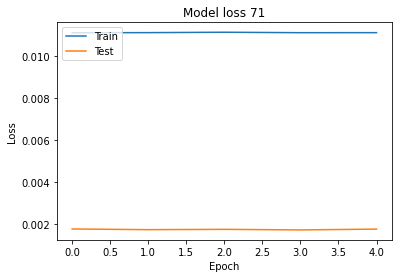

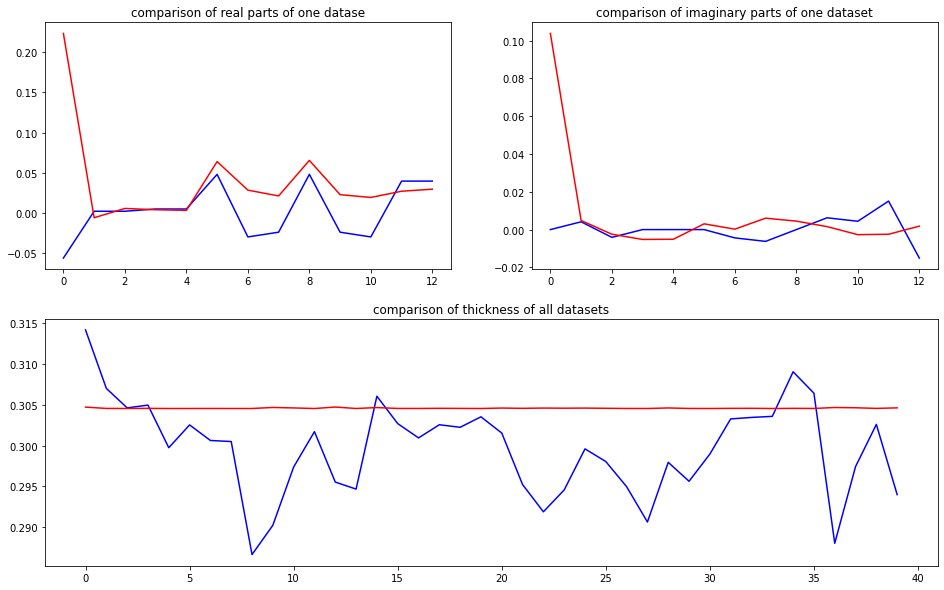

predicted thickness: 0.30465505


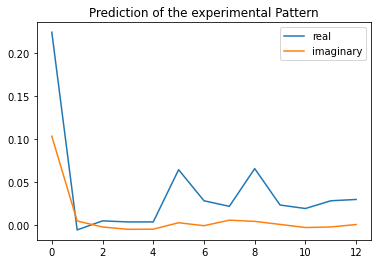

The offset applied on thickness: -0.0009279666445565457

The offset applied on Ug: 0.08987852321206069

Applied shift of unit cell origin (fractional coordinates): 0.002945082357514545 -0.0009796335050413665
Ug[ 0 ]: 0.22924 0.0  =>  0.22924 0.0
Ug[ 1 ]: 0.00348 1.63533  =>  0.00348 1.62918
Ug[ 2 ]: 0.00348 -1.63533  =>  0.00348 -1.62918
Ug[ 3 ]: 0.00378 -0.0185  =>  0.00378 0.0
Ug[ 4 ]: 0.00378 0.0185  =>  0.00378 0.0
Ug[ 5 ]: 0.06539 -0.01231  =>  0.06539 0.0
Ug[ 6 ]: 0.02391 0.04491  =>  0.02391 0.06957
Ug[ 7 ]: 0.02281 0.10814  =>  0.02281 0.09579
Ug[ 8 ]: 0.06539 0.01231  =>  0.06539 0.0
Ug[ 9 ]: 0.02281 -0.10814  =>  0.02281 -0.09579
Ug[ 10 ]: 0.02391 -0.04491  =>  0.02391 -0.06957
Ug[ 11 ]: 0.02919 -0.04855  =>  0.02919 -0.08556
Ug[ 12 ]: 0.02919 0.04855  =>  0.02919 0.08556
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

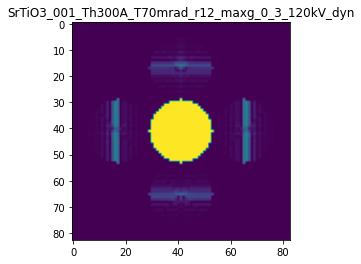

X_sim.max(): 0.9998434515898651
>>>replaced the 72. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 936ms/step - loss: 0.0111 - mean_absolute_error: 0.0295 - acc: 0.6300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0191 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 2s 533ms/step - loss: 0.0111 - mean_absolute_error: 0.0297 - acc: 0.6300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0197 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0111 - mean_absolute_error: 0.0296 - acc: 0.6300 - val_loss: 0.0016 - val_mean_absolute_error: 0.0187 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0112 - mean_absolute_error: 0.0298 - acc: 0.6300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0192 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 3s 773ms/step - loss: 0.0112 - mean_absolute_error: 0.0293 - acc: 0.6300 - val_loss: 0.0016 - val_mean_abso

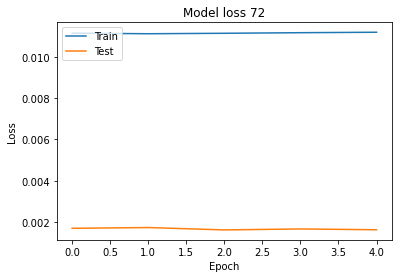

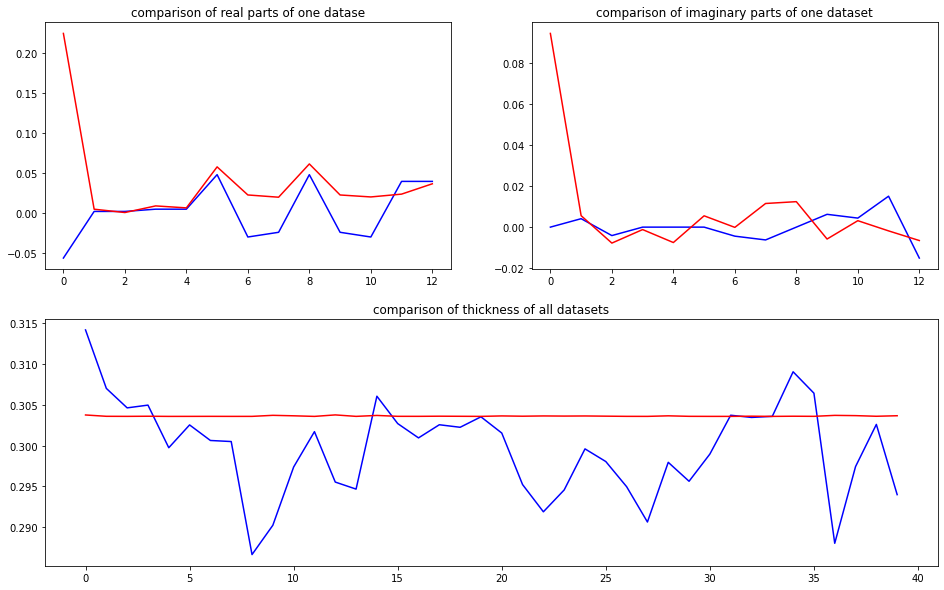

predicted thickness: 0.30368987


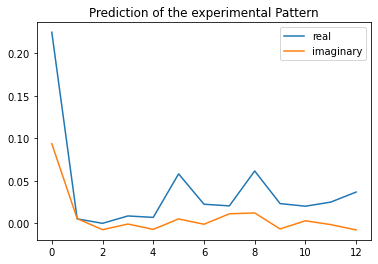

The offset applied on thickness: 0.00013167975240140994

The offset applied on Ug: 1.3683405162216513

Applied shift of unit cell origin (fractional coordinates): -0.058683916108053756 -0.0048632674180790515
Ug[ 0 ]: 0.306 0.0  =>  0.306 0.0
Ug[ 1 ]: 0.0071 1.16216  =>  0.0071 1.1316
Ug[ 2 ]: 0.0071 -1.16216  =>  0.0071 -1.1316
Ug[ 3 ]: 0.00864 0.36872  =>  0.00864 0.0
Ug[ 4 ]: 0.00864 -0.36872  =>  0.00864 0.0
Ug[ 5 ]: 0.06514 -0.06111  =>  0.06514 0.0
Ug[ 6 ]: 0.02214 -0.08952  =>  0.02214 -0.42769
Ug[ 7 ]: 0.02443 0.37125  =>  0.02443 0.77053
Ug[ 8 ]: 0.06514 0.06111  =>  0.06514 0.0
Ug[ 9 ]: 0.02443 -0.37125  =>  0.02443 -0.77053
Ug[ 10 ]: 0.02214 0.08952  =>  0.02214 0.42769
Ug[ 11 ]: 0.0325 0.07723  =>  0.0325 0.81468
Ug[ 12 ]: 0.0325 -0.07723  =>  0.0325 -0.81468
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70m

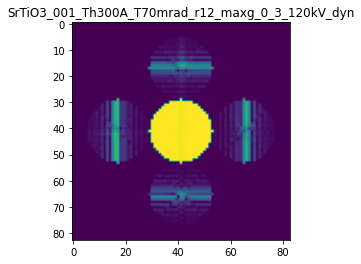

X_sim.max(): 0.9992745135228474
>>>replaced the 73. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 931ms/step - loss: 0.0112 - mean_absolute_error: 0.0308 - acc: 0.6200 - val_loss: 0.0018 - val_mean_absolute_error: 0.0199 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0112 - mean_absolute_error: 0.0307 - acc: 0.6200 - val_loss: 0.0017 - val_mean_absolute_error: 0.0191 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0112 - mean_absolute_error: 0.0307 - acc: 0.6200 - val_loss: 0.0017 - val_mean_absolute_error: 0.0198 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 3s 574ms/step - loss: 0.0112 - mean_absolute_error: 0.0305 - acc: 0.6200 - val_loss: 0.0016 - val_mean_absolute_error: 0.0182 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 897ms/step - loss: 0.0112 - mean_absolute_error: 0.0302 - acc: 0.6200 - val_loss: 0.0017 - val_mean_abso

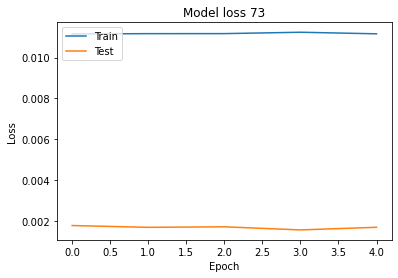

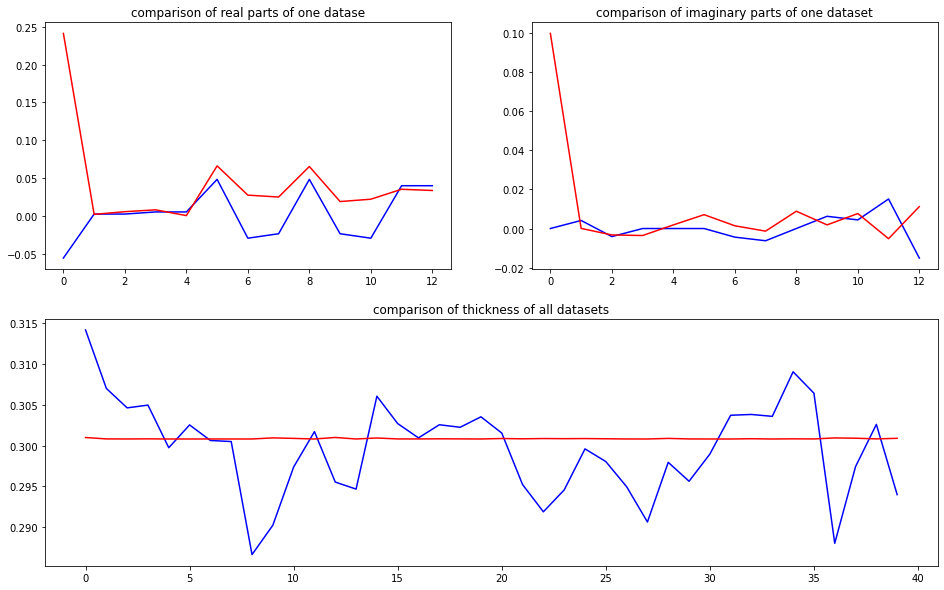

predicted thickness: 0.30091968


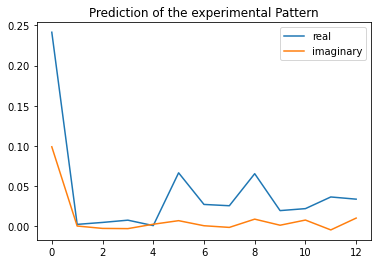

The offset applied on thickness: 0.00014246893304671238

The offset applied on Ug: -1.4301809012403137

Applied shift of unit cell origin (fractional coordinates): 0.09649209989289755 -0.0013439164138252225
Ug[ 0 ]: 0.14414 0.0  =>  0.14414 0.0
Ug[ 1 ]: 0.0037 0.41686  =>  0.0037 0.40841
Ug[ 2 ]: 0.0037 -0.41686  =>  0.0037 -0.40841
Ug[ 3 ]: 0.00487 -0.60628  =>  0.00487 0.0
Ug[ 4 ]: 0.00487 0.60628  =>  0.00487 0.0
Ug[ 5 ]: 0.0596 -0.01689  =>  0.0596 -0.0
Ug[ 6 ]: 0.02381 -0.15454  =>  0.02381 0.46018
Ug[ 7 ]: 0.02171 -0.07073  =>  0.02171 -0.66856
Ug[ 8 ]: 0.0596 0.01689  =>  0.0596 0.0
Ug[ 9 ]: 0.02171 0.07073  =>  0.02171 0.66856
Ug[ 10 ]: 0.02381 0.15454  =>  0.02381 -0.46018
Ug[ 11 ]: 0.03397 -0.22067  =>  0.03397 -1.43322
Ug[ 12 ]: 0.03397 0.22067  =>  0.03397 1.43322
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

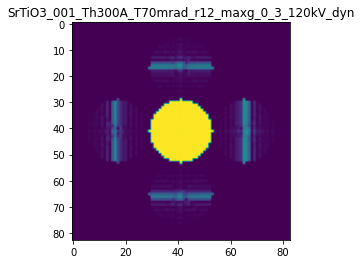

X_sim.max(): 0.9997387460266836
>>>replaced the 74. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 986ms/step - loss: 0.0111 - mean_absolute_error: 0.0298 - acc: 0.6200 - val_loss: 0.0016 - val_mean_absolute_error: 0.0189 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0112 - mean_absolute_error: 0.0303 - acc: 0.6200 - val_loss: 0.0018 - val_mean_absolute_error: 0.0194 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0113 - mean_absolute_error: 0.0308 - acc: 0.6200 - val_loss: 0.0014 - val_mean_absolute_error: 0.0180 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 681ms/step - loss: 0.0112 - mean_absolute_error: 0.0314 - acc: 0.6200 - val_loss: 0.0016 - val_mean_absolute_error: 0.0201 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 3s 581ms/step - loss: 0.0112 - mean_absolute_error: 0.0309 - acc: 0.6200 - val_loss: 0.0016 - val_mean_abso

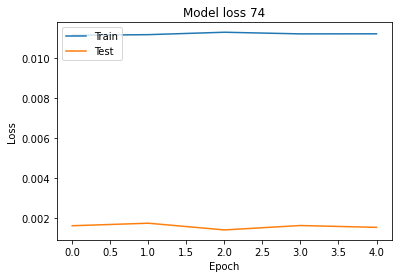

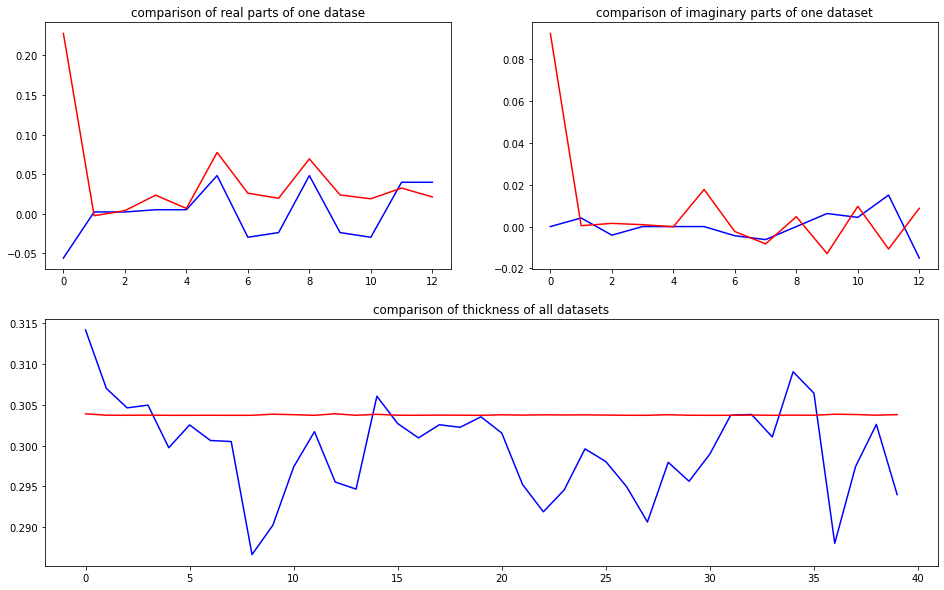

predicted thickness: 0.3038274


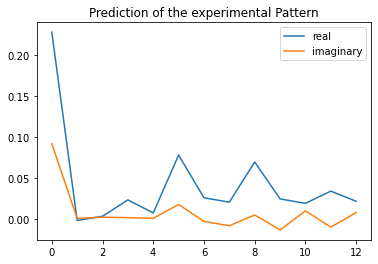

The offset applied on thickness: 0.0004070474694244062

The offset applied on Ug: -1.5309412358591372

Applied shift of unit cell origin (fractional coordinates): -0.0010671734764399917 0.006839682102565372
Ug[ 0 ]: 0.13556 0.0  =>  0.13556 0.0
Ug[ 1 ]: 0.00087 -1.00693  =>  0.00087 -0.96396
Ug[ 2 ]: 0.00087 1.00693  =>  0.00087 0.96396
Ug[ 3 ]: 0.01464 0.00671  =>  0.01464 0.0
Ug[ 4 ]: 0.01464 -0.00671  =>  0.01464 0.0
Ug[ 5 ]: 0.0653 0.08595  =>  0.0653 0.0
Ug[ 6 ]: 0.02241 -0.30017  =>  0.02241 -0.34985
Ug[ 7 ]: 0.02149 0.12915  =>  0.02149 0.09288
Ug[ 8 ]: 0.0653 -0.08595  =>  0.0653 0.0
Ug[ 9 ]: 0.02149 -0.12915  =>  0.02149 -0.09288
Ug[ 10 ]: 0.02241 0.30017  =>  0.02241 0.34985
Ug[ 11 ]: 0.0279 -0.34347  =>  0.0279 -0.33006
Ug[ 12 ]: 0.0279 0.34347  =>  0.0279 0.33006
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

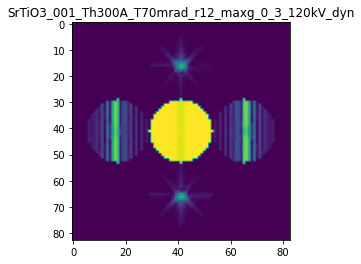

X_sim.max(): 0.9993538118811209
>>>replaced the 75. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 966ms/step - loss: 0.0111 - mean_absolute_error: 0.0298 - acc: 0.6300 - val_loss: 0.0016 - val_mean_absolute_error: 0.0194 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0112 - mean_absolute_error: 0.0301 - acc: 0.6300 - val_loss: 0.0016 - val_mean_absolute_error: 0.0191 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0111 - mean_absolute_error: 0.0300 - acc: 0.6300 - val_loss: 0.0016 - val_mean_absolute_error: 0.0193 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0112 - mean_absolute_error: 0.0299 - acc: 0.6300 - val_loss: 0.0016 - val_mean_absolute_error: 0.0199 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 852ms/step - loss: 0.0111 - mean_absolute_error: 0.0297 - acc: 0.6300 - val_loss: 0.0015 - val_mean_abso

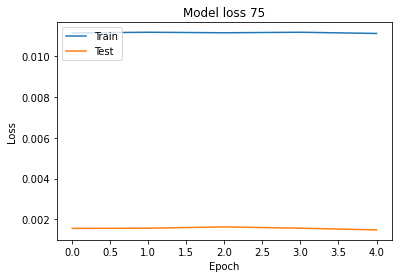

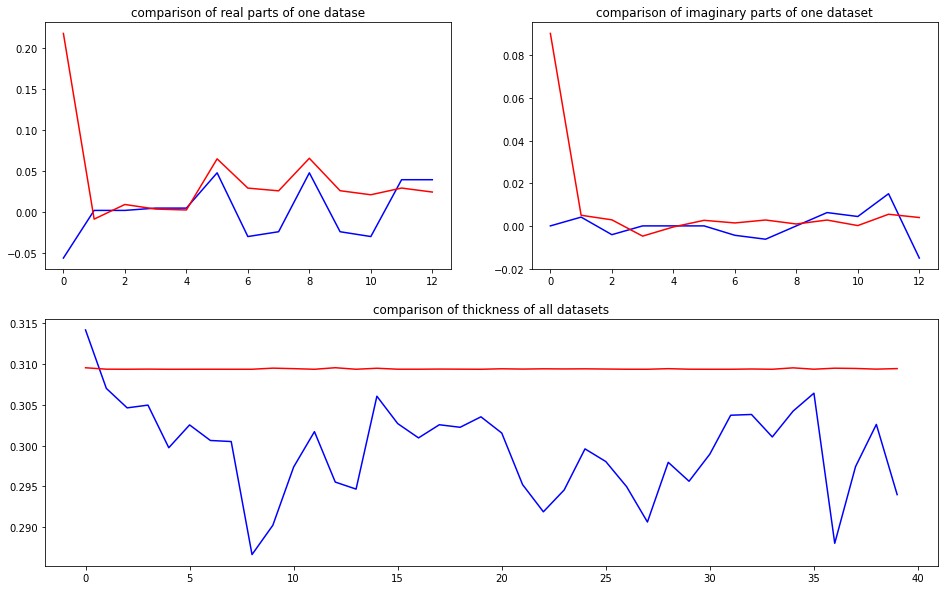

predicted thickness: 0.30949926


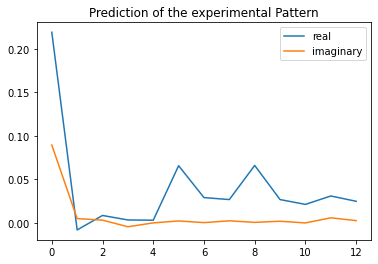

The offset applied on thickness: -0.0009920340175943098

The offset applied on Ug: 0.525674370358618

Applied shift of unit cell origin (fractional coordinates): 0.09315499012627657 0.00093211173321336
Ug[ 0 ]: 0.24822 0.0  =>  0.24822 0.0
Ug[ 1 ]: 0.00098 1.14501  =>  0.00098 1.15087
Ug[ 2 ]: 0.00098 -1.14501  =>  0.00098 -1.15087
Ug[ 3 ]: 0.00402 -0.58531  =>  0.00402 0.0
Ug[ 4 ]: 0.00402 0.58531  =>  0.00402 -0.0
Ug[ 5 ]: 0.06818 0.01171  =>  0.06818 0.0
Ug[ 6 ]: 0.02559 0.01111  =>  0.02559 0.59057
Ug[ 7 ]: 0.02727 0.00869  =>  0.02727 -0.58248
Ug[ 8 ]: 0.06818 -0.01171  =>  0.06818 0.0
Ug[ 9 ]: 0.02727 -0.00869  =>  0.02727 0.58248
Ug[ 10 ]: 0.02559 -0.01111  =>  0.02559 -0.59057
Ug[ 11 ]: 0.02844 0.06037  =>  0.02844 -1.11025
Ug[ 12 ]: 0.02844 -0.06037  =>  0.02844 1.11025
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

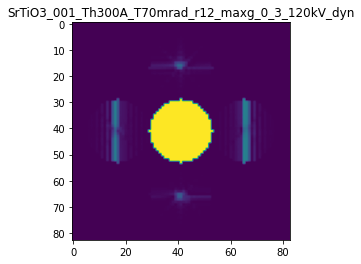

X_sim.max(): 0.9999311506541826
>>>replaced the 76. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 986ms/step - loss: 0.0111 - mean_absolute_error: 0.0290 - acc: 0.6300 - val_loss: 0.0014 - val_mean_absolute_error: 0.0181 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0111 - mean_absolute_error: 0.0289 - acc: 0.6300 - val_loss: 0.0015 - val_mean_absolute_error: 0.0178 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0111 - mean_absolute_error: 0.0289 - acc: 0.6300 - val_loss: 0.0015 - val_mean_absolute_error: 0.0179 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0111 - mean_absolute_error: 0.0289 - acc: 0.6300 - val_loss: 0.0015 - val_mean_absolute_error: 0.0183 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 953ms/step - loss: 0.0111 - mean_absolute_error: 0.0287 - acc: 0.6300 - val_loss: 0.0015 - val_mean_abso

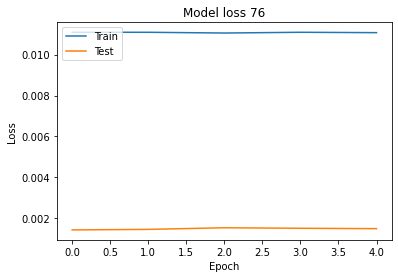

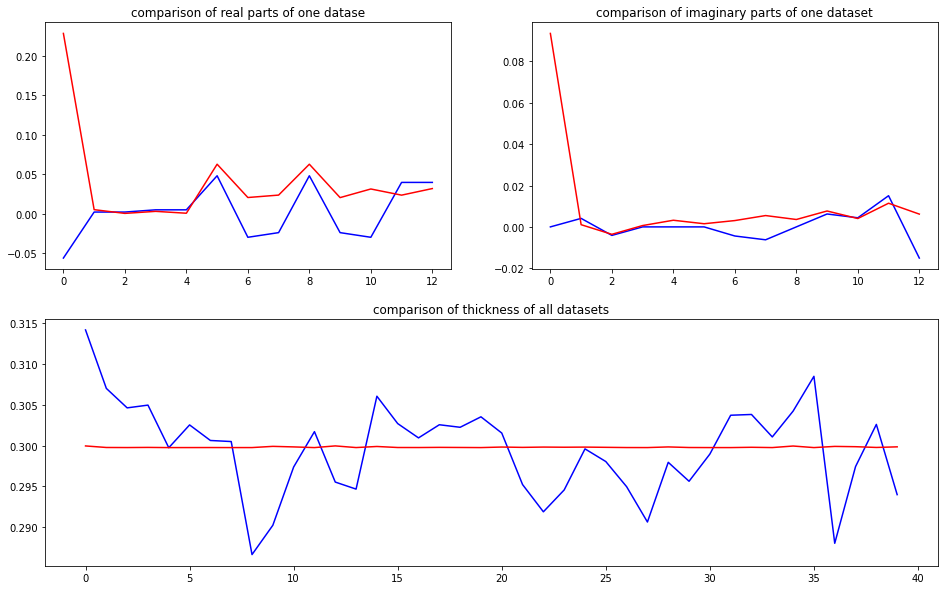

predicted thickness: 0.29989967


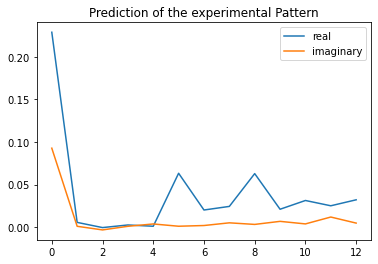

The offset applied on thickness: 0.0007367549552512205

The offset applied on Ug: -0.25164219472660904

Applied shift of unit cell origin (fractional coordinates): 0.09690198669913865 -0.0013740820778807487
Ug[ 0 ]: 0.21332 0.0  =>  0.21332 0.0
Ug[ 1 ]: 0.00342 0.66895  =>  0.00342 0.66032
Ug[ 2 ]: 0.00342 -0.66895  =>  0.00342 -0.66032
Ug[ 3 ]: 0.00239 -0.60885  =>  0.00239 0.0
Ug[ 4 ]: 0.00239 0.60885  =>  0.00239 0.0
Ug[ 5 ]: 0.06212 -0.01727  =>  0.06212 -0.0
Ug[ 6 ]: 0.02567 -0.03391  =>  0.02567 0.58358
Ug[ 7 ]: 0.02269 -0.03881  =>  0.02269 -0.63903
Ug[ 8 ]: 0.06212 0.01727  =>  0.06212 0.0
Ug[ 9 ]: 0.02269 0.03881  =>  0.02269 0.63903
Ug[ 10 ]: 0.02567 0.03391  =>  0.02567 -0.58358
Ug[ 11 ]: 0.0287 0.12538  =>  0.0287 -1.09233
Ug[ 12 ]: 0.0287 -0.12538  =>  0.0287 1.09233
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

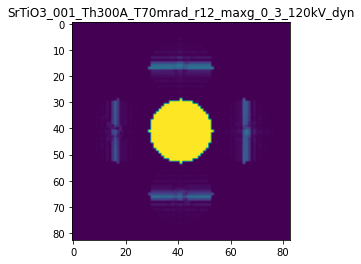

X_sim.max(): 0.9998943197655155
>>>replaced the 77. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 947ms/step - loss: 0.0100 - mean_absolute_error: 0.0281 - acc: 0.6400 - val_loss: 0.0014 - val_mean_absolute_error: 0.0175 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0100 - mean_absolute_error: 0.0282 - acc: 0.6400 - val_loss: 0.0013 - val_mean_absolute_error: 0.0180 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0100 - mean_absolute_error: 0.0282 - acc: 0.6400 - val_loss: 0.0013 - val_mean_absolute_error: 0.0176 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0100 - mean_absolute_error: 0.0286 - acc: 0.6400 - val_loss: 0.0013 - val_mean_absolute_error: 0.0182 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 894ms/step - loss: 0.0100 - mean_absolute_error: 0.0282 - acc: 0.6400 - val_loss: 0.0013 - val_mean_abso

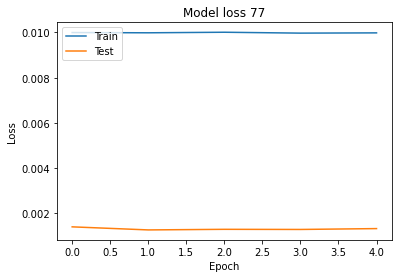

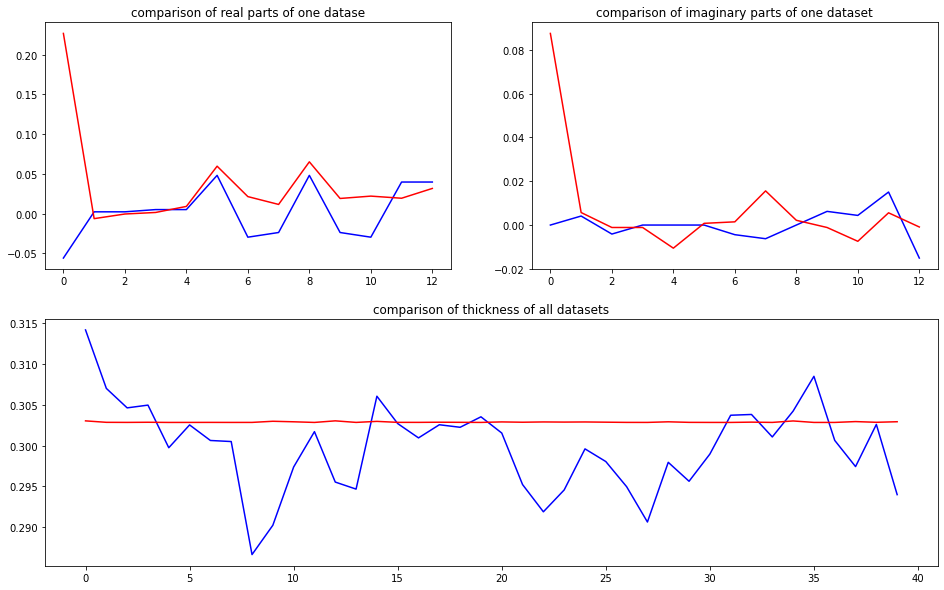

predicted thickness: 0.30297965


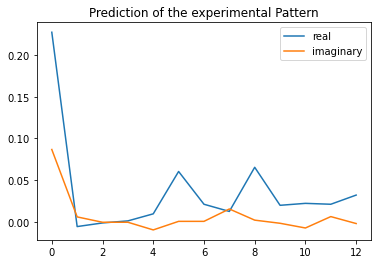

The offset applied on thickness: 0.0005792318544073816

The offset applied on Ug: -1.7782218267323848

Applied shift of unit cell origin (fractional coordinates): -0.11970392593512798 -0.0004820782524320405
Ug[ 0 ]: 0.12207 0.0  =>  0.12207 0.0
Ug[ 1 ]: 0.00484 2.43118  =>  0.00484 2.42815
Ug[ 2 ]: 0.00484 -2.43118  =>  0.00484 -2.42815
Ug[ 3 ]: 0.00697 0.75212  =>  0.00697 0.0
Ug[ 4 ]: 0.00697 -0.75212  =>  0.00697 -0.0
Ug[ 5 ]: 0.05577 -0.00606  =>  0.05577 0.0
Ug[ 6 ]: 0.02104 0.19427  =>  0.02104 -0.55482
Ug[ 7 ]: 0.01758 0.509  =>  0.01758 1.26415
Ug[ 8 ]: 0.05577 0.00606  =>  0.05577 0.0
Ug[ 9 ]: 0.01758 -0.509  =>  0.01758 -1.26415
Ug[ 10 ]: 0.02104 -0.19427  =>  0.02104 0.55482
Ug[ 11 ]: 0.02555 0.18028  =>  0.02555 1.68453
Ug[ 12 ]: 0.02555 -0.18028  =>  0.02555 -1.68453
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

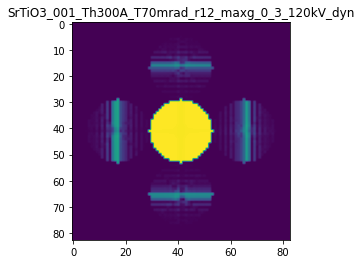

X_sim.max(): 0.9996875340145788
>>>replaced the 78. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 949ms/step - loss: 0.0100 - mean_absolute_error: 0.0285 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0170 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0099 - mean_absolute_error: 0.0276 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0166 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0099 - mean_absolute_error: 0.0276 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0166 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0099 - mean_absolute_error: 0.0272 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0168 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 973ms/step - loss: 0.0099 - mean_absolute_error: 0.0277 - acc: 0.6400 - val_loss: 0.0013 - val_mean_abso

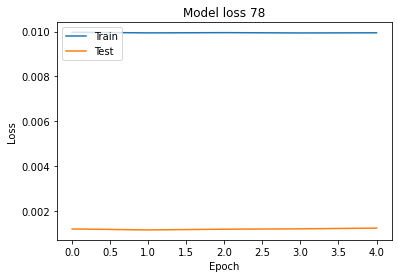

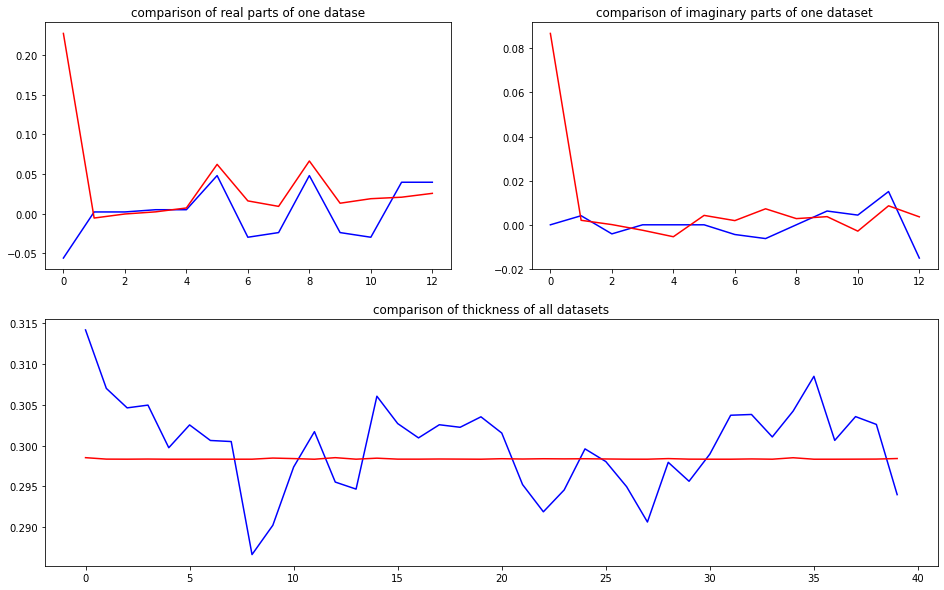

predicted thickness: 0.2984652


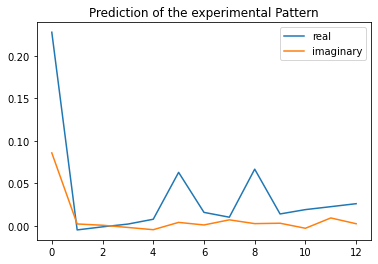

The offset applied on thickness: -0.00022049338342627634

The offset applied on Ug: -1.6855942349224795

Applied shift of unit cell origin (fractional coordinates): -0.045219055730897385 0.0013933808086870228
Ug[ 0 ]: 0.12795 0.0  =>  0.12795 0.0
Ug[ 1 ]: 0.00319 2.91012  =>  0.00319 2.91888
Ug[ 2 ]: 0.00319 -2.91012  =>  0.00319 -2.91888
Ug[ 3 ]: 0.00495 0.28412  =>  0.00495 0.0
Ug[ 4 ]: 0.00495 -0.28412  =>  0.00495 -0.0
Ug[ 5 ]: 0.05771 0.01751  =>  0.05771 0.0
Ug[ 6 ]: 0.017 0.12026  =>  0.017 -0.17261
Ug[ 7 ]: 0.01187 0.17209  =>  0.01187 0.44746
Ug[ 8 ]: 0.05771 -0.01751  =>  0.05771 0.0
Ug[ 9 ]: 0.01187 -0.17209  =>  0.01187 -0.44746
Ug[ 10 ]: 0.017 -0.12026  =>  0.017 0.17261
Ug[ 11 ]: 0.02344 0.14884  =>  0.02344 0.71708
Ug[ 12 ]: 0.02344 -0.14884  =>  0.02344 -0.71708
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

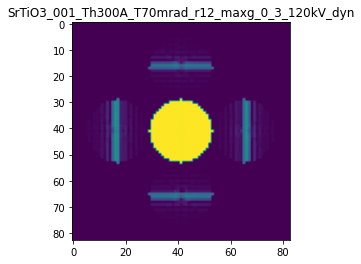

X_sim.max(): 0.9999039728196972
>>>replaced the 79. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 975ms/step - loss: 0.0099 - mean_absolute_error: 0.0277 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0164 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0099 - mean_absolute_error: 0.0273 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0161 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0099 - mean_absolute_error: 0.0277 - acc: 0.6400 - val_loss: 0.0013 - val_mean_absolute_error: 0.0168 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 630ms/step - loss: 0.0099 - mean_absolute_error: 0.0275 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0165 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 5s 982ms/step - loss: 0.0099 - mean_absolute_error: 0.0268 - acc: 0.6400 - val_loss: 0.0011 - val_mean_abso

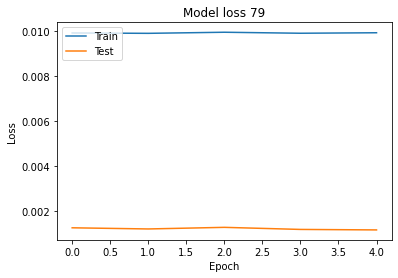

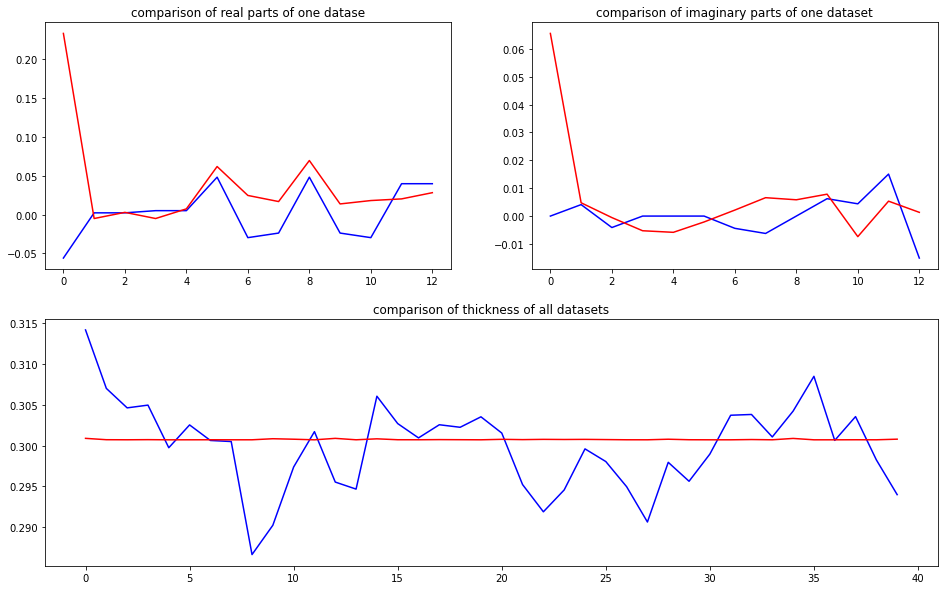

predicted thickness: 0.30083358


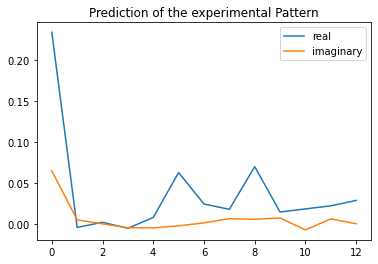

The offset applied on thickness: -0.0006339114549758085

The offset applied on Ug: 1.7148152697307313

Applied shift of unit cell origin (fractional coordinates): -0.011351908781870687 -0.005534166236490218
Ug[ 0 ]: 0.33436 0.0  =>  0.33436 0.0
Ug[ 1 ]: 0.00277 2.03338  =>  0.00277 1.99861
Ug[ 2 ]: 0.00277 -2.03338  =>  0.00277 -1.99861
Ug[ 3 ]: 0.00126 0.07133  =>  0.00126 0.0
Ug[ 4 ]: 0.00126 -0.07133  =>  0.00126 0.0
Ug[ 5 ]: 0.07381 -0.06954  =>  0.07381 0.0
Ug[ 6 ]: 0.02245 0.20111  =>  0.02245 0.16455
Ug[ 7 ]: 0.01657 -0.0205  =>  0.01657 0.0856
Ug[ 8 ]: 0.07381 0.06954  =>  0.07381 0.0
Ug[ 9 ]: 0.01657 0.0205  =>  0.01657 -0.0856
Ug[ 10 ]: 0.02245 -0.20111  =>  0.02245 -0.16455
Ug[ 11 ]: 0.0265 0.10088  =>  0.0265 0.24353
Ug[ 12 ]: 0.0265 -0.10088  =>  0.0265 -0.24353
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

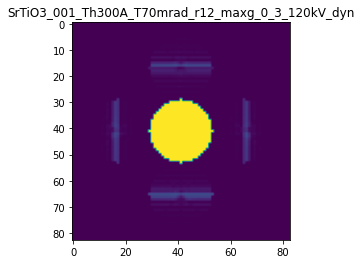

X_sim.max(): 0.9999612120581196
>>>replaced the 80. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 948ms/step - loss: 0.0091 - mean_absolute_error: 0.0269 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0169 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0092 - mean_absolute_error: 0.0269 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0169 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0091 - mean_absolute_error: 0.0270 - acc: 0.6400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0164 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 3s 694ms/step - loss: 0.0091 - mean_absolute_error: 0.0266 - acc: 0.6400 - val_loss: 0.0011 - val_mean_absolute_error: 0.0157 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0091 - mean_absolute_error: 0.0256 - acc: 0.6400 - val_loss: 0.0011 - val_mean_absolut

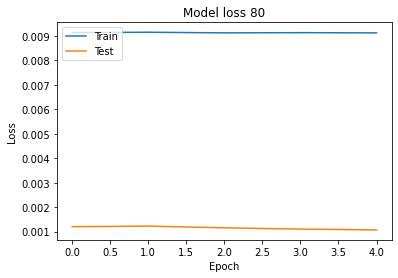

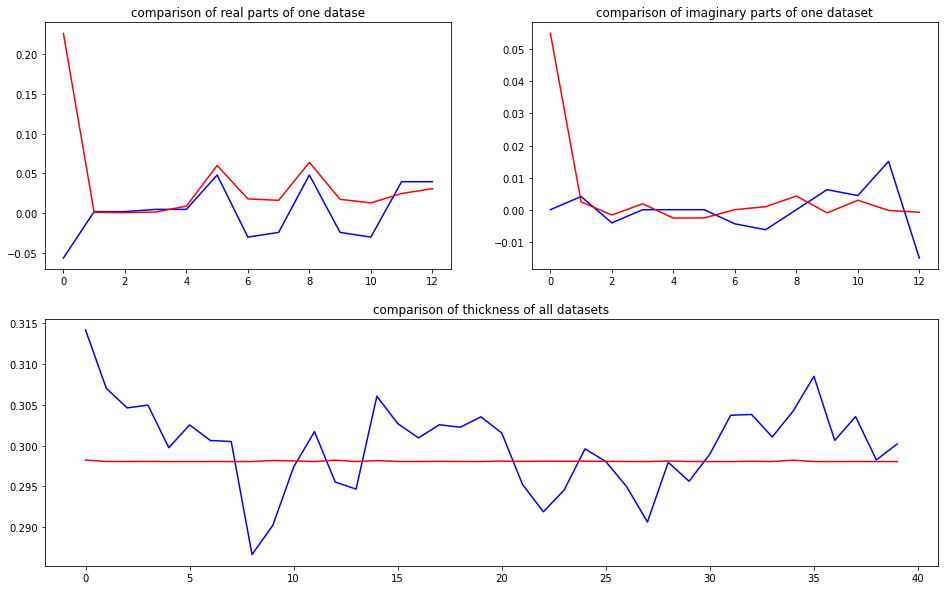

predicted thickness: 0.29816076


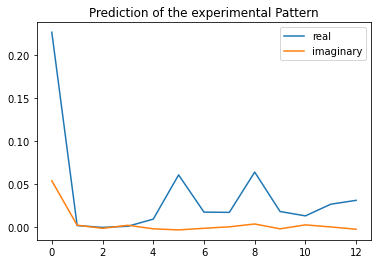

The offset applied on thickness: -0.00039646464728946884

The offset applied on Ug: 1.7780303588375337

Applied shift of unit cell origin (fractional coordinates): -0.05432913108653283 -0.004503487093528759
Ug[ 0 ]: 0.32205 0.0  =>  0.32205 0.0
Ug[ 1 ]: 0.00212 1.05181  =>  0.00212 1.02351
Ug[ 2 ]: 0.00212 -1.05181  =>  0.00212 -1.02351
Ug[ 3 ]: 0.00585 0.34136  =>  0.00585 0.0
Ug[ 4 ]: 0.00585 -0.34136  =>  0.00585 -0.0
Ug[ 5 ]: 0.06946 -0.05659  =>  0.06946 0.0
Ug[ 6 ]: 0.01605 -0.11572  =>  0.01605 -0.42878
Ug[ 7 ]: 0.01848 0.06096  =>  0.01848 0.43062
Ug[ 8 ]: 0.06946 0.05659  =>  0.06946 0.0
Ug[ 9 ]: 0.01848 -0.06096  =>  0.01848 -0.43062
Ug[ 10 ]: 0.01605 0.11572  =>  0.01605 0.42878
Ug[ 11 ]: 0.03062 0.03372  =>  0.03062 0.71644
Ug[ 12 ]: 0.03062 -0.03372  =>  0.03062 -0.71644
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

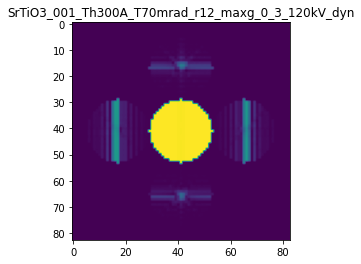

X_sim.max(): 0.9998625089801243
>>>replaced the 81. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 964ms/step - loss: 0.0091 - mean_absolute_error: 0.0255 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0149 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0091 - mean_absolute_error: 0.0259 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0154 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0091 - mean_absolute_error: 0.0259 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0148 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0091 - mean_absolute_error: 0.0264 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0155 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 984ms/step - loss: 0.0092 - mean_absolute_error: 0.0264 - acc: 0.6300 - val_loss: 0.0011 - val_mean_abso

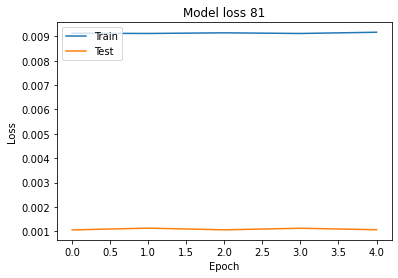

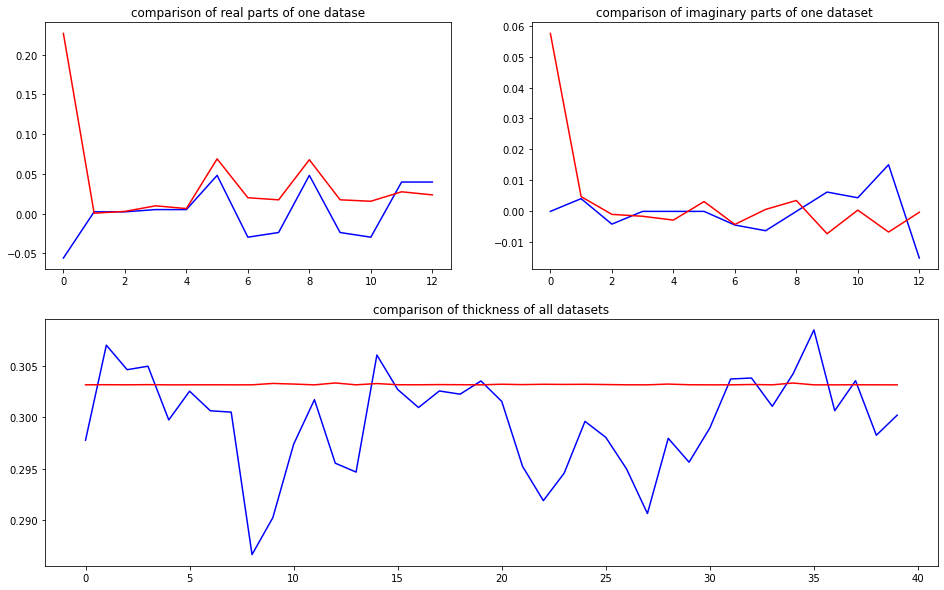

predicted thickness: 0.3032885


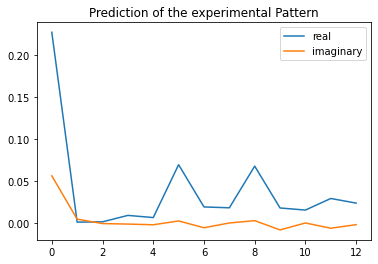

The offset applied on thickness: 0.0005855490741267417

The offset applied on Ug: 0.7539284961306633

Applied shift of unit cell origin (fractional coordinates): -0.008420852556522992 -9.36291554968617e-05
Ug[ 0 ]: 0.26867 0.0  =>  0.26867 0.0
Ug[ 1 ]: 0.00304 1.04739  =>  0.00304 1.0468
Ug[ 2 ]: 0.00304 -1.04739  =>  0.00304 -1.0468
Ug[ 3 ]: 0.00813 0.05291  =>  0.00813 -0.0
Ug[ 4 ]: 0.00813 -0.05291  =>  0.00813 0.0
Ug[ 5 ]: 0.0724 -0.00118  =>  0.0724 0.0
Ug[ 6 ]: 0.01802 -0.15387  =>  0.01802 -0.2062
Ug[ 7 ]: 0.01899 0.21748  =>  0.01899 0.27098
Ug[ 8 ]: 0.0724 0.00118  =>  0.0724 0.0
Ug[ 9 ]: 0.01899 -0.21748  =>  0.01899 -0.27098
Ug[ 10 ]: 0.01802 0.15387  =>  0.01802 0.2062
Ug[ 11 ]: 0.02736 -0.07295  =>  0.02736 0.03287
Ug[ 12 ]: 0.02736 0.07295  =>  0.02736 -0.03287
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

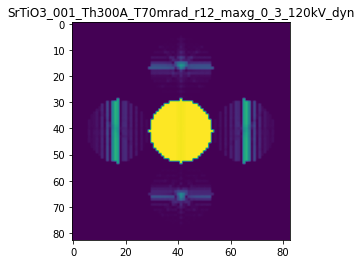

X_sim.max(): 0.9996813300169893
>>>replaced the 82. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 949ms/step - loss: 0.0091 - mean_absolute_error: 0.0272 - acc: 0.6300 - val_loss: 0.0012 - val_mean_absolute_error: 0.0161 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0091 - mean_absolute_error: 0.0272 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0157 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0091 - mean_absolute_error: 0.0261 - acc: 0.6300 - val_loss: 0.0010 - val_mean_absolute_error: 0.0149 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0091 - mean_absolute_error: 0.0270 - acc: 0.6300 - val_loss: 0.0011 - val_mean_absolute_error: 0.0162 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 922ms/step - loss: 0.0091 - mean_absolute_error: 0.0267 - acc: 0.6300 - val_loss: 0.0011 - val_mean_abso

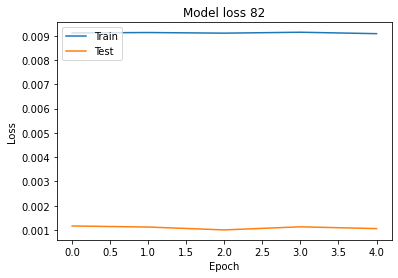

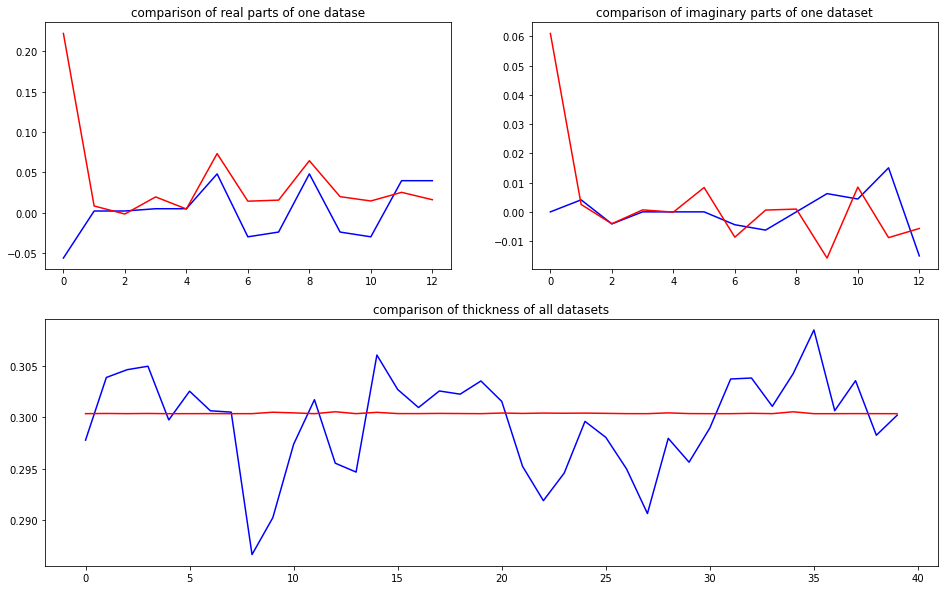

predicted thickness: 0.30048364


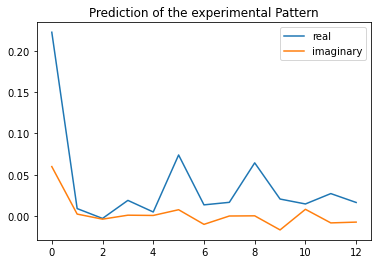

The offset applied on thickness: -0.0005399814681761745

The offset applied on Ug: 2.070106137765218

Applied shift of unit cell origin (fractional coordinates): -0.006855144834267831 0.005789830836144101
Ug[ 0 ]: 0.33215 0.0  =>  0.33215 0.0
Ug[ 1 ]: 0.00466 0.74095  =>  0.00466 0.77733
Ug[ 2 ]: 0.00466 -0.74095  =>  0.00466 -0.77733
Ug[ 3 ]: 0.01259 0.04307  =>  0.01259 0.0
Ug[ 4 ]: 0.01259 -0.04307  =>  0.01259 -0.0
Ug[ 5 ]: 0.07954 0.07276  =>  0.07954 0.0
Ug[ 6 ]: 0.01746 -0.5477  =>  0.01746 -0.62715
Ug[ 7 ]: 0.02136 0.38002  =>  0.02136 0.38671
Ug[ 8 ]: 0.07954 -0.07276  =>  0.07954 -0.0
Ug[ 9 ]: 0.02136 -0.38002  =>  0.02136 -0.38671
Ug[ 10 ]: 0.01746 0.5477  =>  0.01746 0.62715
Ug[ 11 ]: 0.02321 0.00436  =>  0.02321 0.0905
Ug[ 12 ]: 0.02321 -0.00436  =>  0.02321 -0.0905
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

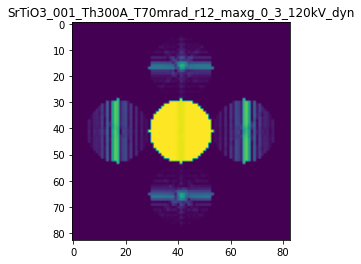

X_sim.max(): 0.999318949299897
>>>replaced the 83. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 944ms/step - loss: 0.0091 - mean_absolute_error: 0.0259 - acc: 0.6200 - val_loss: 9.6898e-04 - val_mean_absolute_error: 0.0152 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0091 - mean_absolute_error: 0.0264 - acc: 0.6200 - val_loss: 9.7896e-04 - val_mean_absolute_error: 0.0152 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0091 - mean_absolute_error: 0.0259 - acc: 0.6200 - val_loss: 9.8926e-04 - val_mean_absolute_error: 0.0148 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0091 - mean_absolute_error: 0.0260 - acc: 0.6200 - val_loss: 0.0010 - val_mean_absolute_error: 0.0151 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 904ms/step - loss: 0.0091 - mean_absolute_error: 0.0260 - acc: 0.6200 - val_loss: 0.0010 - va

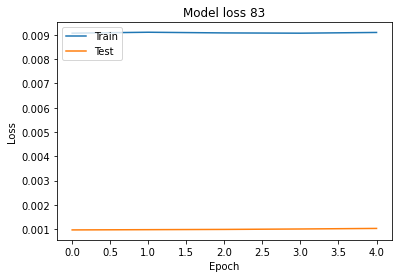

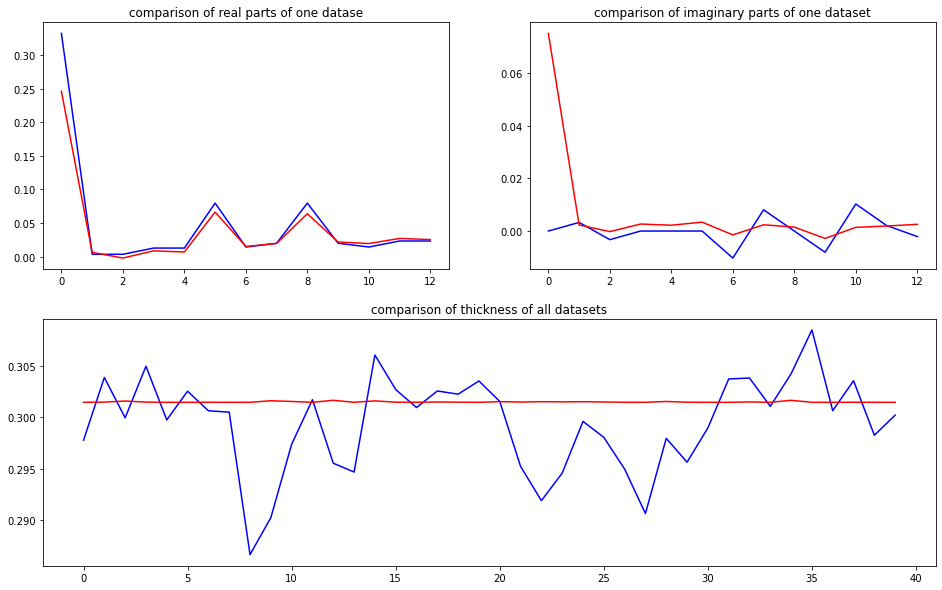

predicted thickness: 0.3016047


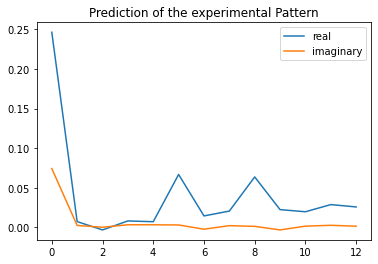

The offset applied on thickness: 0.0007140670693688624

The offset applied on Ug: 1.8351434284038504

Applied shift of unit cell origin (fractional coordinates): -0.0005665288011574421 0.0015241288159587726
Ug[ 0 ]: 0.36782 0.0  =>  0.36782 0.0
Ug[ 1 ]: 0.00233 0.52638  =>  0.00233 0.53595
Ug[ 2 ]: 0.00233 -0.52638  =>  0.00233 -0.53595
Ug[ 3 ]: 0.00769 0.00356  =>  0.00769 0.0
Ug[ 4 ]: 0.00769 -0.00356  =>  0.00769 -0.0
Ug[ 5 ]: 0.073 0.01915  =>  0.073 0.0
Ug[ 6 ]: 0.0177 -0.11945  =>  0.0177 -0.13259
Ug[ 7 ]: 0.02242 0.11579  =>  0.02242 0.10978
Ug[ 8 ]: 0.073 -0.01915  =>  0.073 -0.0
Ug[ 9 ]: 0.02242 -0.11579  =>  0.02242 -0.10978
Ug[ 10 ]: 0.0177 0.11945  =>  0.0177 0.13259
Ug[ 11 ]: 0.02859 0.0259  =>  0.02859 0.03302
Ug[ 12 ]: 0.02859 -0.0259  =>  0.02859 -0.03302
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70

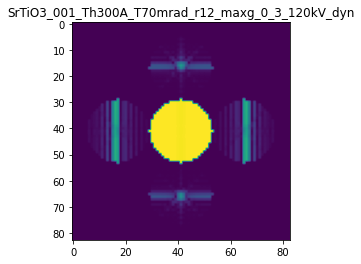

X_sim.max(): 0.9997614430710395
>>>replaced the 84. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 982ms/step - loss: 0.0091 - mean_absolute_error: 0.0260 - acc: 0.6100 - val_loss: 0.0010 - val_mean_absolute_error: 0.0153 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 649ms/step - loss: 0.0091 - mean_absolute_error: 0.0258 - acc: 0.6100 - val_loss: 9.6611e-04 - val_mean_absolute_error: 0.0141 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0091 - mean_absolute_error: 0.0250 - acc: 0.6100 - val_loss: 9.3575e-04 - val_mean_absolute_error: 0.0142 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 3s 736ms/step - loss: 0.0092 - mean_absolute_error: 0.0263 - acc: 0.6100 - val_loss: 0.0011 - val_mean_absolute_error: 0.0161 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 5s 960ms/step - loss: 0.0091 - mean_absolute_error: 0.0273 - acc: 0.6100 - val_loss: 0.0011 - val_m

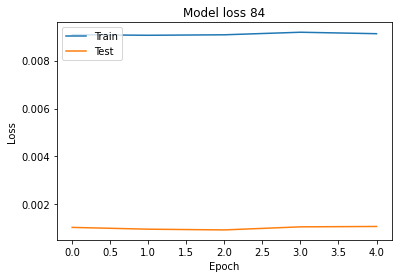

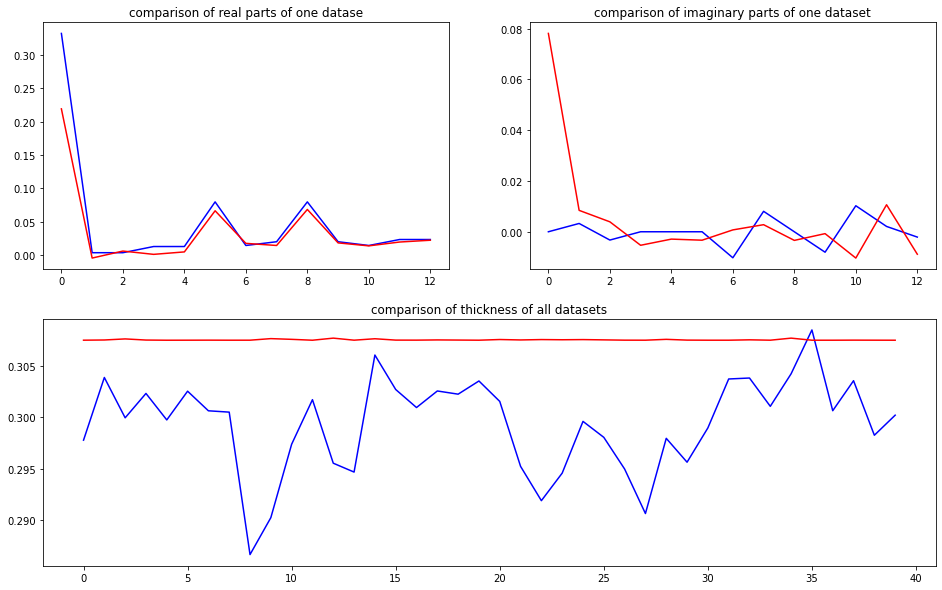

predicted thickness: 0.30768725


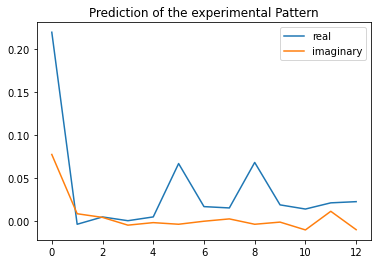

The offset applied on thickness: -0.00047407195989085474

The offset applied on Ug: 2.0281599878510193

Applied shift of unit cell origin (fractional coordinates): 0.08055794484234606 -0.0002603647766361268
Ug[ 0 ]: 0.32908 0.0  =>  0.32908 0.0
Ug[ 1 ]: 0.00226 1.28257  =>  0.00226 1.28093
Ug[ 2 ]: 0.00226 -1.28257  =>  0.00226 -1.28093
Ug[ 3 ]: 0.00303 -0.50616  =>  0.00303 0.0
Ug[ 4 ]: 0.00303 0.50616  =>  0.00303 0.0
Ug[ 5 ]: 0.0767 -0.00327  =>  0.0767 0.0
Ug[ 6 ]: 0.01673 0.30524  =>  0.01673 0.81304
Ug[ 7 ]: 0.0177 0.09799  =>  0.0177 -0.40654
Ug[ 8 ]: 0.0767 0.00327  =>  0.0767 0.0
Ug[ 9 ]: 0.0177 -0.09799  =>  0.0177 0.40654
Ug[ 10 ]: 0.01673 -0.30524  =>  0.01673 -0.81304
Ug[ 11 ]: 0.02538 0.43225  =>  0.02538 -0.58007
Ug[ 12 ]: 0.02538 -0.43225  =>  0.02538 0.58007
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

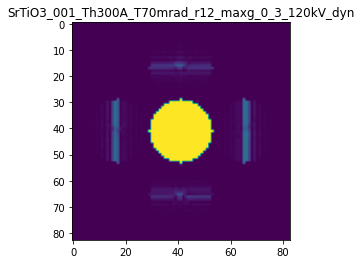

X_sim.max(): 0.999907868909659
>>>replaced the 85. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 941ms/step - loss: 0.0091 - mean_absolute_error: 0.0274 - acc: 0.6000 - val_loss: 0.0011 - val_mean_absolute_error: 0.0159 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0091 - mean_absolute_error: 0.0270 - acc: 0.6000 - val_loss: 8.9962e-04 - val_mean_absolute_error: 0.0148 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0091 - mean_absolute_error: 0.0274 - acc: 0.6000 - val_loss: 9.0087e-04 - val_mean_absolute_error: 0.0145 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0091 - mean_absolute_error: 0.0263 - acc: 0.6000 - val_loss: 9.3768e-04 - val_mean_absolute_error: 0.0147 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 914ms/step - loss: 0.0091 - mean_absolute_error: 0.0265 - acc: 0.6000 - val_loss: 9.6249e-04 

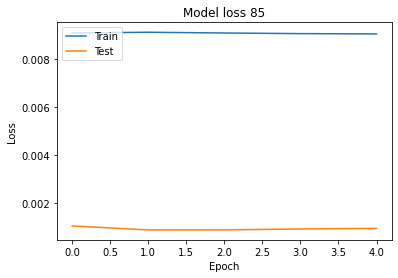

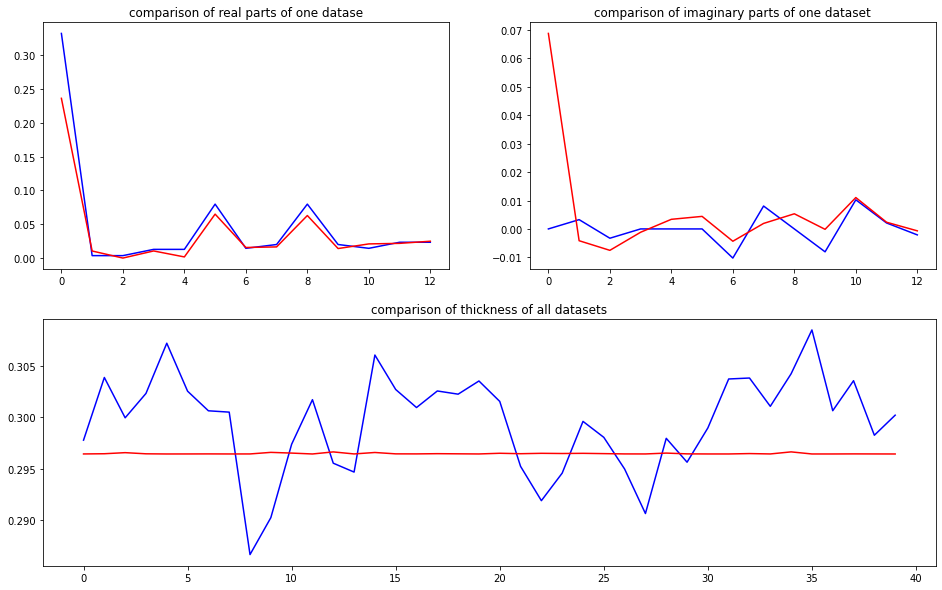

predicted thickness: 0.29658636


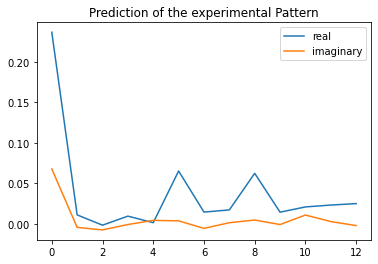

The offset applied on thickness: -0.0006042591035284522

The offset applied on Ug: 0.18300003969315004

Applied shift of unit cell origin (fractional coordinates): 0.06642378903428363 -0.0005732567012351661
Ug[ 0 ]: 0.2475 0.0  =>  0.2475 0.0
Ug[ 1 ]: 0.00522 0.30645  =>  0.00522 0.30284
Ug[ 2 ]: 0.00522 -0.30645  =>  0.00522 -0.30284
Ug[ 3 ]: 0.00629 -0.41735  =>  0.00629 0.0
Ug[ 4 ]: 0.00629 0.41735  =>  0.00629 -0.0
Ug[ 5 ]: 0.06471 -0.0072  =>  0.06471 0.0
Ug[ 6 ]: 0.01982 -0.42954  =>  0.01982 -0.00859
Ug[ 7 ]: 0.01612 0.07031  =>  0.01612 -0.34344
Ug[ 8 ]: 0.06471 0.0072  =>  0.06471 0.0
Ug[ 9 ]: 0.01612 -0.07031  =>  0.01612 0.34344
Ug[ 10 ]: 0.01982 0.42954  =>  0.01982 0.00859
Ug[ 11 ]: 0.02456 0.10112  =>  0.02456 -0.73359
Ug[ 12 ]: 0.02456 -0.10112  =>  0.02456 0.73359
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

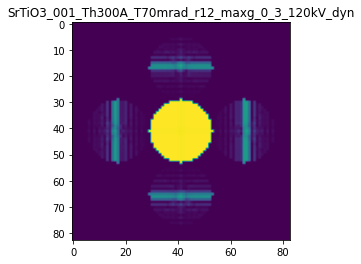

X_sim.max(): 0.9995269342993883
>>>replaced the 86. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 940ms/step - loss: 0.0090 - mean_absolute_error: 0.0264 - acc: 0.6000 - val_loss: 8.5549e-04 - val_mean_absolute_error: 0.0148 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0090 - mean_absolute_error: 0.0263 - acc: 0.6000 - val_loss: 8.4597e-04 - val_mean_absolute_error: 0.0143 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0091 - mean_absolute_error: 0.0254 - acc: 0.6000 - val_loss: 7.8963e-04 - val_mean_absolute_error: 0.0138 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0091 - mean_absolute_error: 0.0257 - acc: 0.6000 - val_loss: 8.5375e-04 - val_mean_absolute_error: 0.0150 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 924ms/step - loss: 0.0091 - mean_absolute_error: 0.0260 - acc: 0.6000 - val_loss: 8.8851

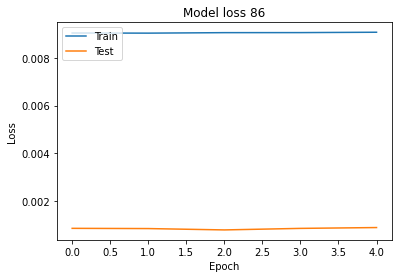

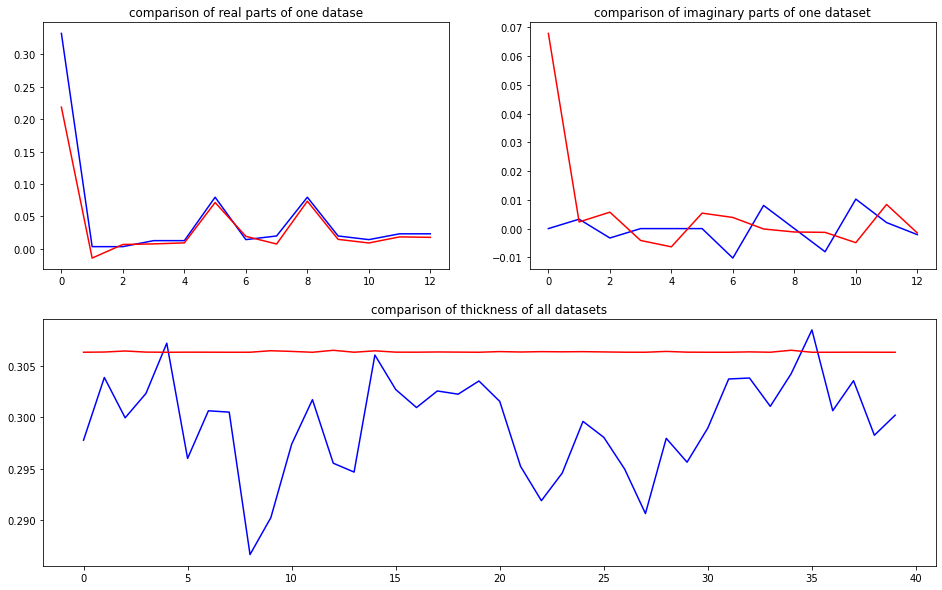

predicted thickness: 0.3065067


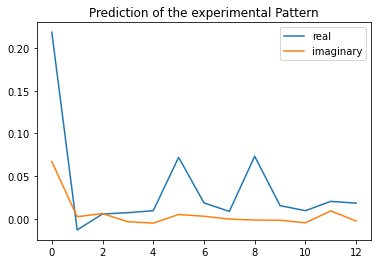

The offset applied on thickness: -0.0003252168186612061

The offset applied on Ug: 2.0347960879418556

Applied shift of unit cell origin (fractional coordinates): -0.013992058499190546 0.0028703190743408695
Ug[ 0 ]: 0.3253 0.0  =>  0.3253 0.0
Ug[ 1 ]: 0.00395 -2.69037  =>  0.00395 -2.67234
Ug[ 2 ]: 0.00395 2.69037  =>  0.00395 2.67234
Ug[ 3 ]: 0.00844 0.08791  =>  0.00844 -0.0
Ug[ 4 ]: 0.00844 -0.08791  =>  0.00844 0.0
Ug[ 5 ]: 0.08349 0.03607  =>  0.08349 0.0
Ug[ 6 ]: 0.01505 0.27667  =>  0.01505 0.17072
Ug[ 7 ]: 0.0123 0.03893  =>  0.0123 0.10881
Ug[ 8 ]: 0.08349 -0.03607  =>  0.08349 0.0
Ug[ 9 ]: 0.0123 -0.03893  =>  0.0123 -0.10881
Ug[ 10 ]: 0.01505 -0.27667  =>  0.01505 -0.17072
Ug[ 11 ]: 0.02108 0.29427  =>  0.02108 0.4701
Ug[ 12 ]: 0.02108 -0.29427  =>  0.02108 -0.4701
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

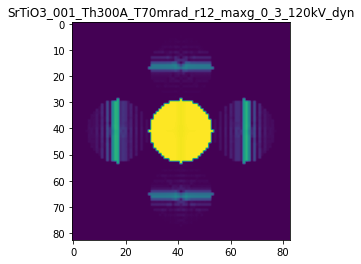

X_sim.max(): 0.9996356850090143
>>>replaced the 87. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 949ms/step - loss: 0.0091 - mean_absolute_error: 0.0262 - acc: 0.5900 - val_loss: 7.7275e-04 - val_mean_absolute_error: 0.0141 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0091 - mean_absolute_error: 0.0272 - acc: 0.5900 - val_loss: 8.9792e-04 - val_mean_absolute_error: 0.0161 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0090 - mean_absolute_error: 0.0267 - acc: 0.5900 - val_loss: 8.7595e-04 - val_mean_absolute_error: 0.0145 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0090 - mean_absolute_error: 0.0258 - acc: 0.5900 - val_loss: 7.9691e-04 - val_mean_absolute_error: 0.0139 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 883ms/step - loss: 0.0090 - mean_absolute_error: 0.0257 - acc: 0.5900 - val_loss: 7.8957

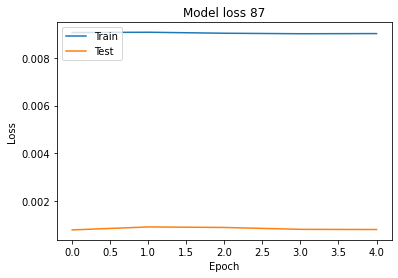

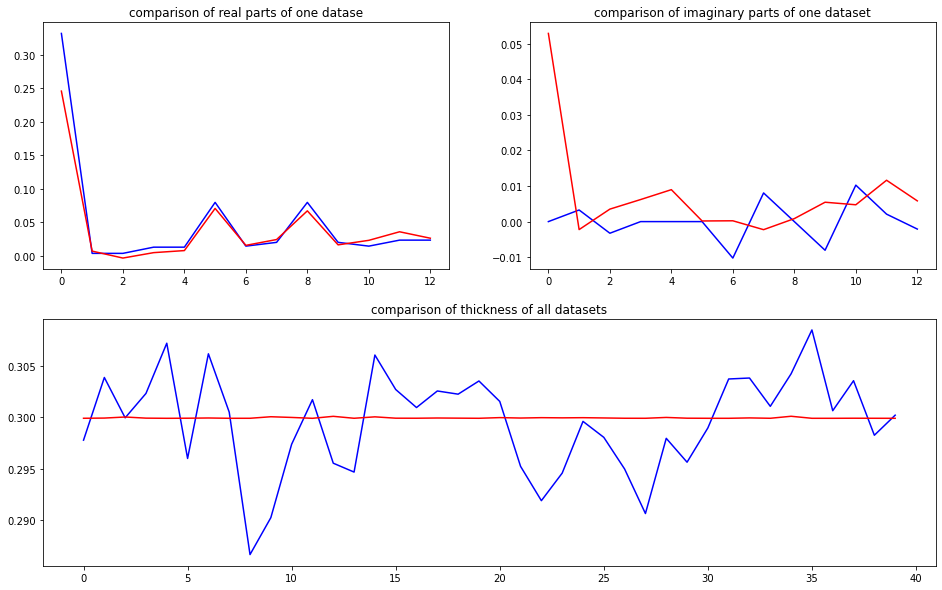

predicted thickness: 0.30006617


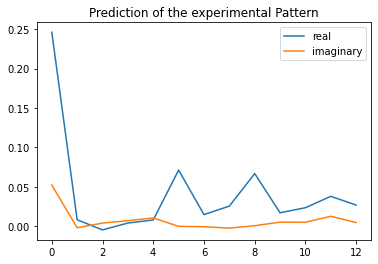

The offset applied on thickness: 0.0005838456341304999

The offset applied on Ug: 1.2226490702378239

Applied shift of unit cell origin (fractional coordinates): 0.04645360551899697 6.852035300226585e-05
Ug[ 0 ]: 0.32363 0.0  =>  0.32363 0.0
Ug[ 1 ]: 0.00336 -1.06921  =>  0.00336 -1.06878
Ug[ 2 ]: 0.00336 1.06921  =>  0.00336 1.06878
Ug[ 3 ]: 0.0062 -0.29188  =>  0.0062 0.0
Ug[ 4 ]: 0.0062 0.29188  =>  0.0062 0.0
Ug[ 5 ]: 0.07472 0.00086  =>  0.07472 0.0
Ug[ 6 ]: 0.01966 -0.15725  =>  0.01966 0.13419
Ug[ 7 ]: 0.022 -0.16272  =>  0.022 -0.45503
Ug[ 8 ]: 0.07472 -0.00086  =>  0.07472 -0.0
Ug[ 9 ]: 0.022 0.16272  =>  0.022 0.45503
Ug[ 10 ]: 0.01966 0.15725  =>  0.01966 -0.13419
Ug[ 11 ]: 0.03393 0.1346  =>  0.03393 -0.44915
Ug[ 12 ]: 0.03393 -0.1346  =>  0.03393 0.44915
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad

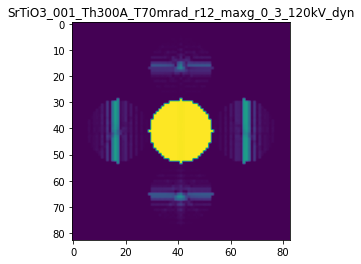

X_sim.max(): 0.999752200701339
>>>replaced the 88. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 975ms/step - loss: 0.0090 - mean_absolute_error: 0.0255 - acc: 0.5800 - val_loss: 7.9740e-04 - val_mean_absolute_error: 0.0141 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0090 - mean_absolute_error: 0.0259 - acc: 0.5800 - val_loss: 8.0886e-04 - val_mean_absolute_error: 0.0135 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0090 - mean_absolute_error: 0.0258 - acc: 0.5800 - val_loss: 7.7537e-04 - val_mean_absolute_error: 0.0138 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 3s 575ms/step - loss: 0.0091 - mean_absolute_error: 0.0259 - acc: 0.5800 - val_loss: 7.6773e-04 - val_mean_absolute_error: 0.0137 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 4s 959ms/step - loss: 0.0090 - mean_absolute_error: 0.0254 - acc: 0.5800 - val_loss: 7.3170e

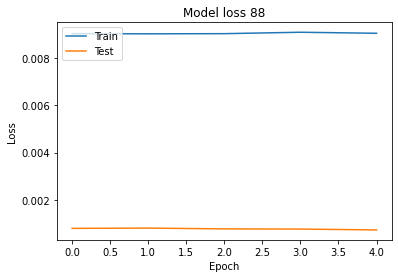

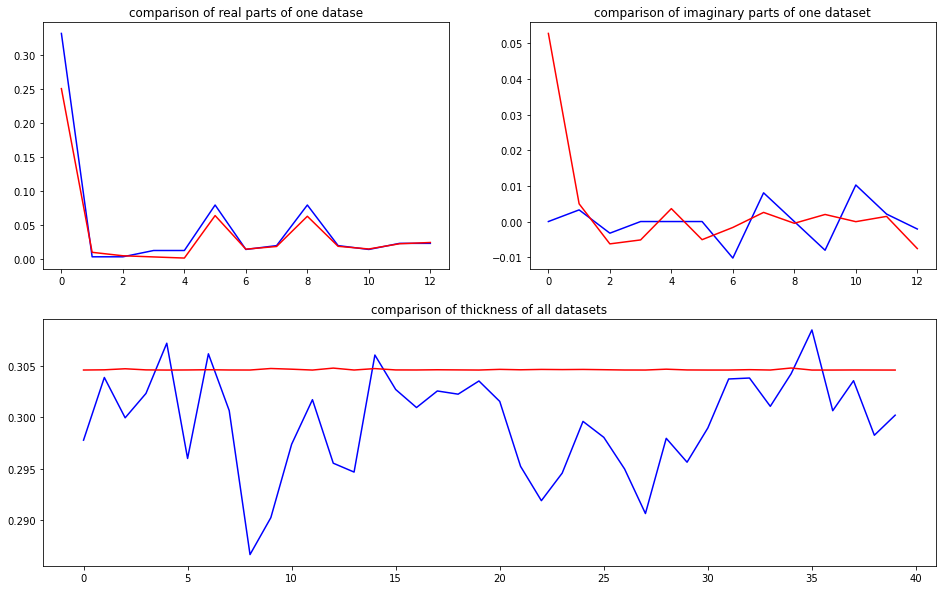

predicted thickness: 0.30476484


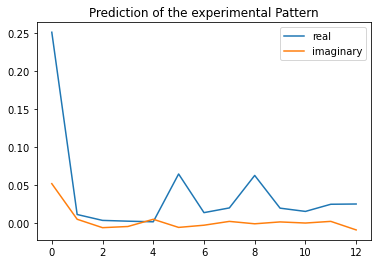

The offset applied on thickness: -0.0008946935853413924

The offset applied on Ug: 0.11673192790122443

Applied shift of unit cell origin (fractional coordinates): 0.18292594143060145 -0.002933401621799054
Ug[ 0 ]: 0.25887 0.0  =>  0.25887 0.0
Ug[ 1 ]: 0.0093 0.63882  =>  0.0093 0.62039
Ug[ 2 ]: 0.0093 -0.63882  =>  0.0093 -0.62039
Ug[ 3 ]: 0.00521 -1.14936  =>  0.00521 -0.0
Ug[ 4 ]: 0.00521 1.14936  =>  0.00521 0.0
Ug[ 5 ]: 0.06421 -0.03686  =>  0.06421 0.0
Ug[ 6 ]: 0.01468 -0.09807  =>  0.01468 1.06972
Ug[ 7 ]: 0.01988 0.0176  =>  0.01988 -1.11333
Ug[ 8 ]: 0.06421 0.03686  =>  0.06421 0.0
Ug[ 9 ]: 0.01988 -0.0176  =>  0.01988 1.11333
Ug[ 10 ]: 0.01468 0.09807  =>  0.01468 -1.06972
Ug[ 11 ]: 0.02567 0.22053  =>  0.02567 -2.07818
Ug[ 12 ]: 0.02567 -0.22053  =>  0.02567 2.07818
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

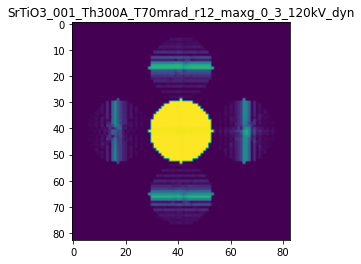

X_sim.max(): 0.9993743679275203
>>>replaced the 89. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 941ms/step - loss: 0.0090 - mean_absolute_error: 0.0253 - acc: 0.5800 - val_loss: 7.2574e-04 - val_mean_absolute_error: 0.0141 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0089 - mean_absolute_error: 0.0256 - acc: 0.5800 - val_loss: 7.2485e-04 - val_mean_absolute_error: 0.0133 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0090 - mean_absolute_error: 0.0249 - acc: 0.5800 - val_loss: 6.9674e-04 - val_mean_absolute_error: 0.0127 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0090 - mean_absolute_error: 0.0261 - acc: 0.5800 - val_loss: 8.2417e-04 - val_mean_absolute_error: 0.0145 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 4s 949ms/step - loss: 0.0090 - mean_absolute_error: 0.0261 - acc: 0.5800 - val_loss: 7.4807

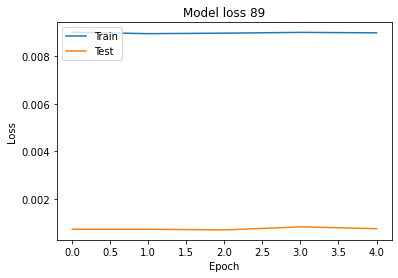

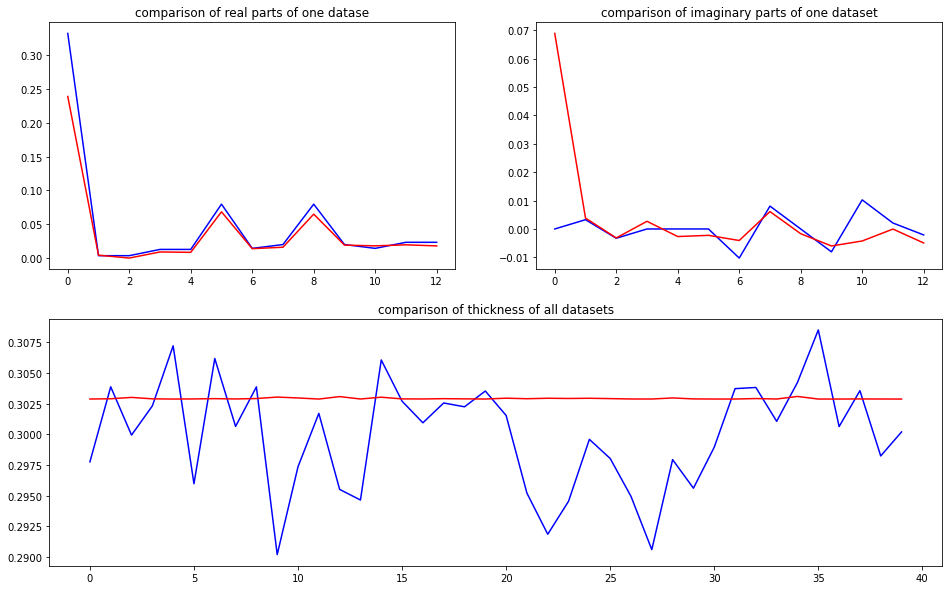

predicted thickness: 0.3030698


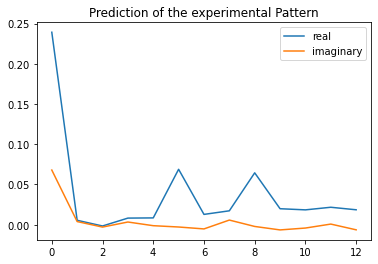

The offset applied on thickness: 0.0006174888868990985

The offset applied on Ug: -0.20129129519889385

Applied shift of unit cell origin (fractional coordinates): -0.04242063165624094 -0.0004837050216220514
Ug[ 0 ]: 0.22673 0.0  =>  0.22673 0.0
Ug[ 1 ]: 0.00395 1.04627  =>  0.00395 1.04323
Ug[ 2 ]: 0.00395 -1.04627  =>  0.00395 -1.04323
Ug[ 3 ]: 0.00866 0.26654  =>  0.00866 -0.0
Ug[ 4 ]: 0.00866 -0.26654  =>  0.00866 0.0
Ug[ 5 ]: 0.0658 -0.00608  =>  0.0658 0.0
Ug[ 6 ]: 0.01563 -0.03353  =>  0.01563 -0.29703
Ug[ 7 ]: 0.01951 0.31936  =>  0.01951 0.58893
Ug[ 8 ]: 0.0658 0.00608  =>  0.0658 -0.0
Ug[ 9 ]: 0.01951 -0.31936  =>  0.01951 -0.58893
Ug[ 10 ]: 0.01563 0.03353  =>  0.01563 0.29703
Ug[ 11 ]: 0.02038 0.17554  =>  0.02038 0.70861
Ug[ 12 ]: 0.02038 -0.17554  =>  0.02038 -0.70861
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

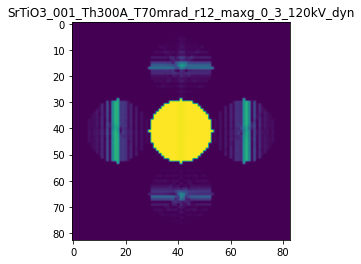

X_sim.max(): 0.9995725794476658
>>>replaced the 90. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 947ms/step - loss: 0.0090 - mean_absolute_error: 0.0255 - acc: 0.5800 - val_loss: 7.3468e-04 - val_mean_absolute_error: 0.0138 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 540ms/step - loss: 0.0089 - mean_absolute_error: 0.0255 - acc: 0.5800 - val_loss: 6.8633e-04 - val_mean_absolute_error: 0.0131 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0089 - mean_absolute_error: 0.0248 - acc: 0.5800 - val_loss: 6.9083e-04 - val_mean_absolute_error: 0.0126 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0089 - mean_absolute_error: 0.0246 - acc: 0.5800 - val_loss: 7.3595e-04 - val_mean_absolute_error: 0.0125 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 957ms/step - loss: 0.0089 - mean_absolute_error: 0.0254 - acc: 0.5800 - val_loss: 7.6661

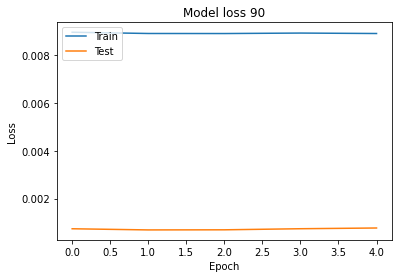

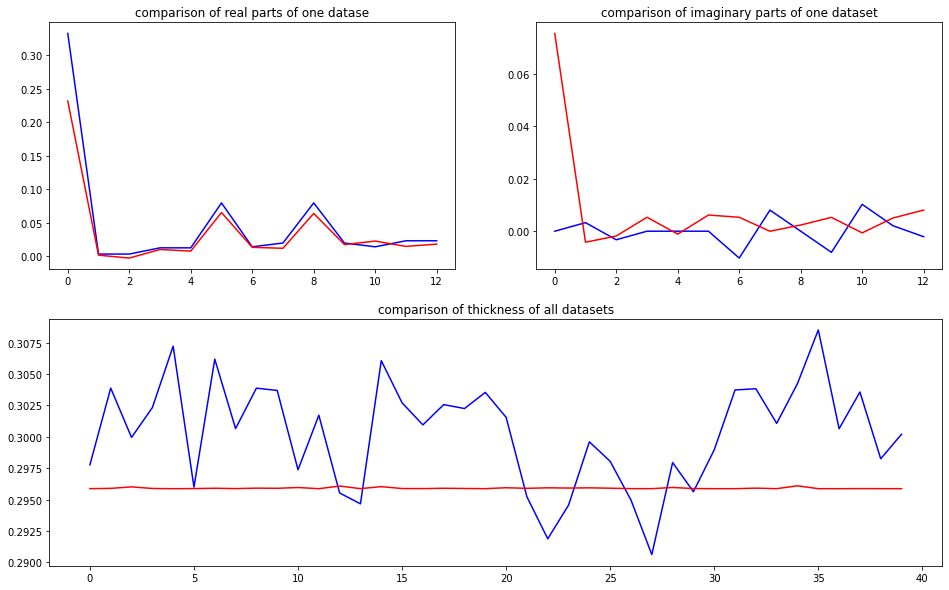

predicted thickness: 0.2960756


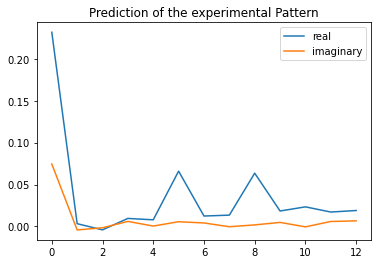

The offset applied on thickness: 0.0002463479470871228

The offset applied on Ug: -1.4347566862925005

Applied shift of unit cell origin (fractional coordinates): -0.048867563630603864 0.002309594315693661
Ug[ 0 ]: 0.14671 0.0  =>  0.14671 0.0
Ug[ 1 ]: 0.00135 -1.8866  =>  0.00135 -1.87209
Ug[ 2 ]: 0.00135 1.8866  =>  0.00135 1.87209
Ug[ 3 ]: 0.00903 0.30704  =>  0.00903 0.0
Ug[ 4 ]: 0.00903 -0.30704  =>  0.00903 0.0
Ug[ 5 ]: 0.05874 0.02902  =>  0.05874 -0.0
Ug[ 6 ]: 0.01758 0.14751  =>  0.01758 -0.17405
Ug[ 7 ]: 0.01578 -0.15659  =>  0.01578 0.13594
Ug[ 8 ]: 0.05874 -0.02902  =>  0.05874 0.0
Ug[ 9 ]: 0.01578 0.15659  =>  0.01578 -0.13594
Ug[ 10 ]: 0.01758 -0.14751  =>  0.01758 0.17405
Ug[ 11 ]: 0.01757 -0.01918  =>  0.01757 0.59491
Ug[ 12 ]: 0.01757 0.01918  =>  0.01757 -0.59491
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

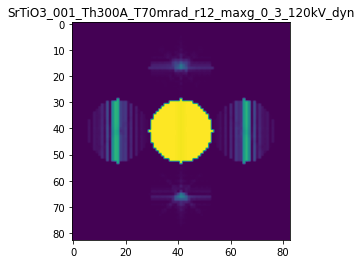

X_sim.max(): 0.9997551530647656
>>>replaced the 91. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 942ms/step - loss: 0.0089 - mean_absolute_error: 0.0254 - acc: 0.5800 - val_loss: 7.3696e-04 - val_mean_absolute_error: 0.0126 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0089 - mean_absolute_error: 0.0253 - acc: 0.5800 - val_loss: 7.2019e-04 - val_mean_absolute_error: 0.0130 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0089 - mean_absolute_error: 0.0249 - acc: 0.5800 - val_loss: 6.7300e-04 - val_mean_absolute_error: 0.0121 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0089 - mean_absolute_error: 0.0245 - acc: 0.5800 - val_loss: 6.6212e-04 - val_mean_absolute_error: 0.0122 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0089 - mean_absolute_error: 0.0243 - acc: 0.5800 - val_loss: 6.5691e-0

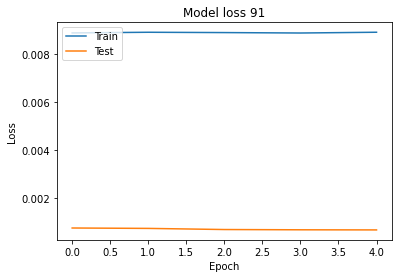

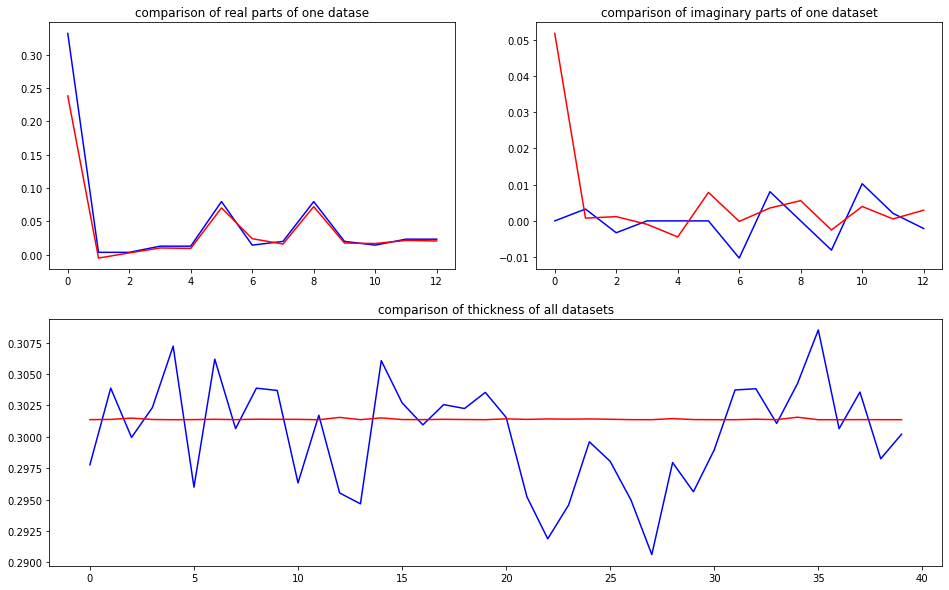

predicted thickness: 0.30151588


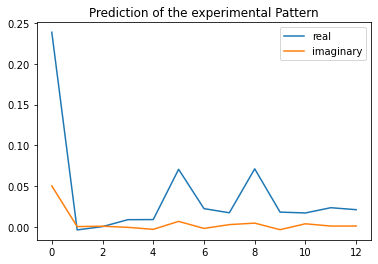

The offset applied on thickness: 0.00015105044236977827

The offset applied on Ug: -1.2561739808320442

Applied shift of unit cell origin (fractional coordinates): -0.02099648460554532 0.0013291147910433306
Ug[ 0 ]: 0.16383 0.0  =>  0.16383 0.0
Ug[ 1 ]: 0.00125 -2.94704  =>  0.00125 -2.93869
Ug[ 2 ]: 0.00125 2.94704  =>  0.00125 2.93869
Ug[ 3 ]: 0.0093 0.13192  =>  0.0093 0.0
Ug[ 4 ]: 0.0093 -0.13192  =>  0.0093 -0.0
Ug[ 5 ]: 0.06476 0.0167  =>  0.06476 0.0
Ug[ 6 ]: 0.01984 -0.14905  =>  0.01984 -0.28932
Ug[ 7 ]: 0.01796 0.17397  =>  0.01796 0.29754
Ug[ 8 ]: 0.06476 -0.0167  =>  0.06476 -0.0
Ug[ 9 ]: 0.01796 -0.17397  =>  0.01796 -0.29754
Ug[ 10 ]: 0.01984 0.14905  =>  0.01984 0.28932
Ug[ 11 ]: 0.02205 -0.00324  =>  0.02205 0.26061
Ug[ 12 ]: 0.02205 0.00324  =>  0.02205 -0.26061
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

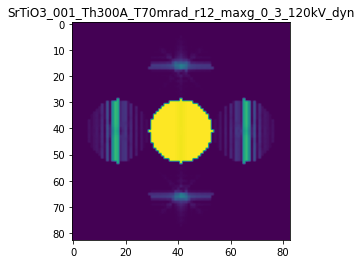

X_sim.max(): 0.999755158147855
>>>replaced the 92. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 943ms/step - loss: 0.0080 - mean_absolute_error: 0.0246 - acc: 0.5900 - val_loss: 7.2920e-04 - val_mean_absolute_error: 0.0134 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0080 - mean_absolute_error: 0.0247 - acc: 0.5900 - val_loss: 6.9084e-04 - val_mean_absolute_error: 0.0126 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0080 - mean_absolute_error: 0.0236 - acc: 0.5900 - val_loss: 6.4820e-04 - val_mean_absolute_error: 0.0123 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0080 - mean_absolute_error: 0.0234 - acc: 0.5900 - val_loss: 6.0170e-04 - val_mean_absolute_error: 0.0117 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 4s 957ms/step - loss: 0.0080 - mean_absolute_error: 0.0234 - acc: 0.5900 - val_loss: 6.1021e

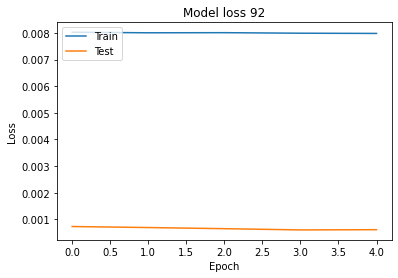

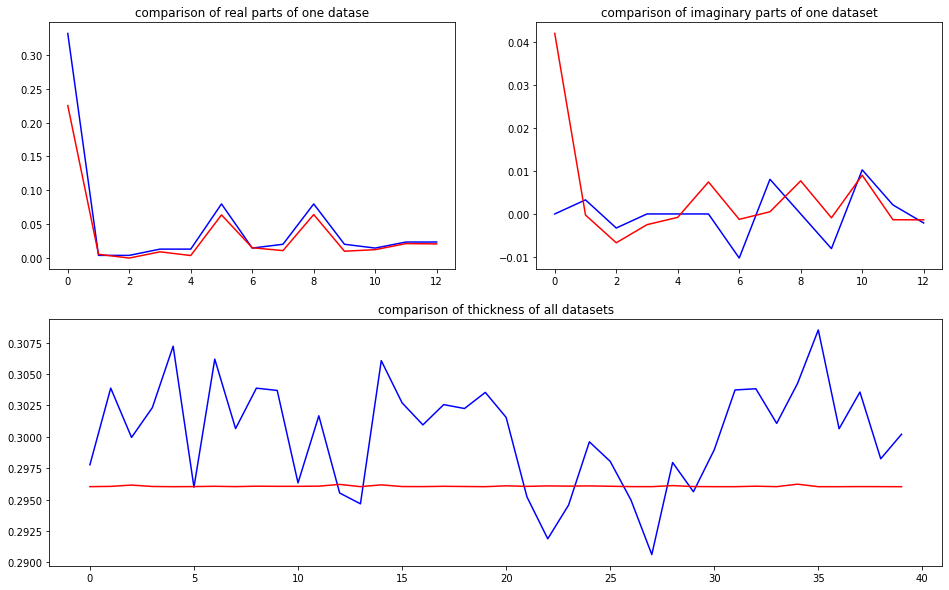

predicted thickness: 0.29618475


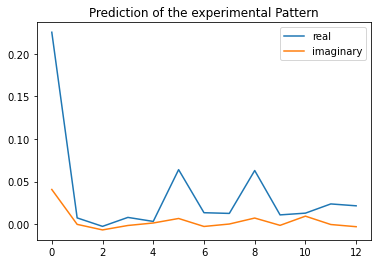

The offset applied on thickness: 0.0002791796583656641

The offset applied on Ug: -1.25694353605267

Applied shift of unit cell origin (fractional coordinates): 0.041835192278913205 -0.00042624335269165657
Ug[ 0 ]: 0.15949 0.0  =>  0.15949 0.0
Ug[ 1 ]: 0.00401 0.94901  =>  0.00401 0.94633
Ug[ 2 ]: 0.00401 -0.94901  =>  0.00401 -0.94633
Ug[ 3 ]: 0.00574 -0.26286  =>  0.00574 0.0
Ug[ 4 ]: 0.00574 0.26286  =>  0.00574 -0.0
Ug[ 5 ]: 0.05842 -0.00536  =>  0.05842 0.0
Ug[ 6 ]: 0.01426 -0.43519  =>  0.01426 -0.16965
Ug[ 7 ]: 0.01163 0.06554  =>  0.01163 -0.19464
Ug[ 8 ]: 0.05842 0.00536  =>  0.05842 0.0
Ug[ 9 ]: 0.01163 -0.06554  =>  0.01163 0.19464
Ug[ 10 ]: 0.01426 0.43519  =>  0.01426 0.16965
Ug[ 11 ]: 0.02206 0.05592  =>  0.02206 -0.4698
Ug[ 12 ]: 0.02206 -0.05592  =>  0.02206 0.4698
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

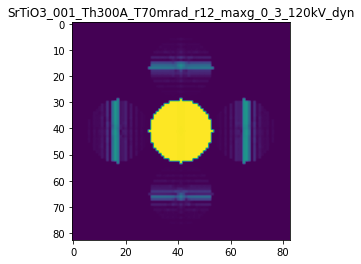

X_sim.max(): 0.9997121559205593
>>>replaced the 93. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 964ms/step - loss: 0.0080 - mean_absolute_error: 0.0236 - acc: 0.5900 - val_loss: 6.1304e-04 - val_mean_absolute_error: 0.0119 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0080 - mean_absolute_error: 0.0236 - acc: 0.5900 - val_loss: 6.1387e-04 - val_mean_absolute_error: 0.0118 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0080 - mean_absolute_error: 0.0234 - acc: 0.5900 - val_loss: 5.9417e-04 - val_mean_absolute_error: 0.0115 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 4s 824ms/step - loss: 0.0080 - mean_absolute_error: 0.0243 - acc: 0.5900 - val_loss: 6.6026e-04 - val_mean_absolute_error: 0.0126 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 5s 987ms/step - loss: 0.0080 - mean_absolute_error: 0.0247 - acc: 0.5900 - val_loss: 6.3607

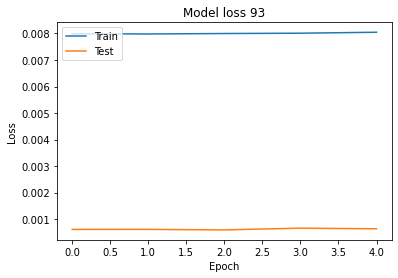

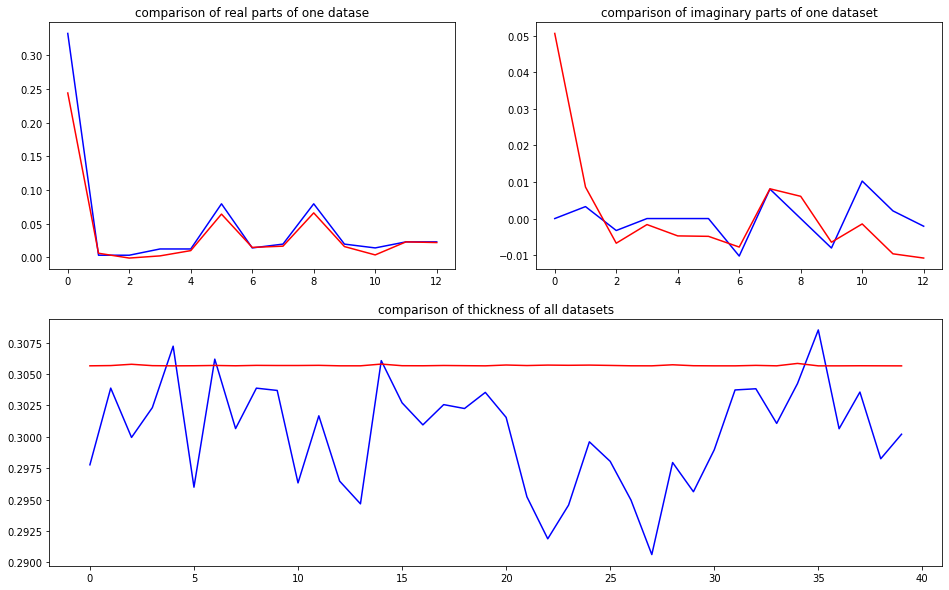

predicted thickness: 0.30580348


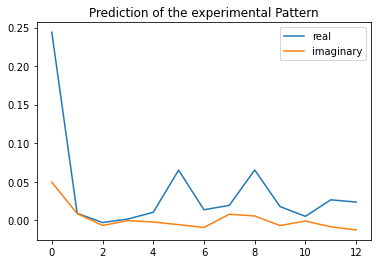

The offset applied on thickness: 0.0009933452159558043

The offset applied on Ug: -1.6169113810104359

Applied shift of unit cell origin (fractional coordinates): -0.02570071248589684 -0.007674777430262146
Ug[ 0 ]: 0.14379 0.0  =>  0.14379 0.0
Ug[ 1 ]: 0.00817 1.2181  =>  0.00817 1.16987
Ug[ 2 ]: 0.00817 -1.2181  =>  0.00817 -1.16987
Ug[ 3 ]: 0.0059 0.16148  =>  0.0059 0.0
Ug[ 4 ]: 0.0059 -0.16148  =>  0.0059 0.0
Ug[ 5 ]: 0.0585 -0.09644  =>  0.0585 0.0
Ug[ 6 ]: 0.01006 -0.4494  =>  0.01006 -0.56266
Ug[ 7 ]: 0.0193 0.38895  =>  0.0193 0.59866
Ug[ 8 ]: 0.0585 0.09644  =>  0.0585 -0.0
Ug[ 9 ]: 0.0193 -0.38895  =>  0.0193 -0.59866
Ug[ 10 ]: 0.01006 0.4494  =>  0.01006 0.56266
Ug[ 11 ]: 0.02388 0.08233  =>  0.02388 0.40529
Ug[ 12 ]: 0.02388 -0.08233  =>  0.02388 -0.40529
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad

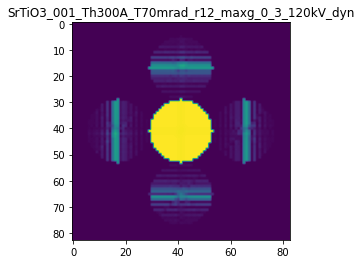

X_sim.max(): 0.9993575215797345
>>>replaced the 94. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 951ms/step - loss: 0.0075 - mean_absolute_error: 0.0244 - acc: 0.6000 - val_loss: 5.7914e-04 - val_mean_absolute_error: 0.0132 - val_acc: 0.7250
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0075 - mean_absolute_error: 0.0236 - acc: 0.6000 - val_loss: 5.4070e-04 - val_mean_absolute_error: 0.0122 - val_acc: 0.7250
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0076 - mean_absolute_error: 0.0233 - acc: 0.6000 - val_loss: 5.3824e-04 - val_mean_absolute_error: 0.0127 - val_acc: 0.7250
Epoch 4/5
5/5 [==============================] - 3s 709ms/step - loss: 0.0075 - mean_absolute_error: 0.0233 - acc: 0.6000 - val_loss: 5.5048e-04 - val_mean_absolute_error: 0.0118 - val_acc: 0.7250
Epoch 5/5
5/5 [==============================] - 4s 958ms/step - loss: 0.0075 - mean_absolute_error: 0.0228 - acc: 0.6000 - val_loss: 5.3823

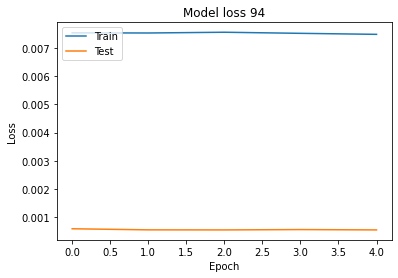

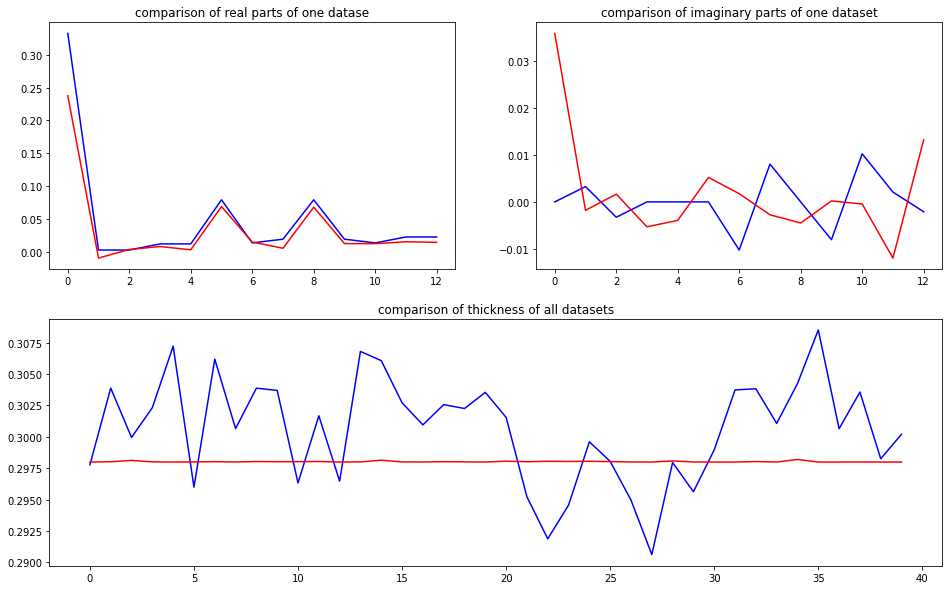

predicted thickness: 0.29817232


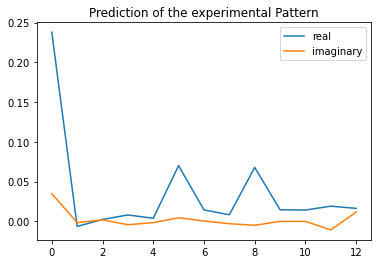

The offset applied on thickness: -0.0006462449721747953

The offset applied on Ug: 1.3058701411189728

Applied shift of unit cell origin (fractional coordinates): 0.03358926303773417 0.005294284155485128
Ug[ 0 ]: 0.31324 0.0  =>  0.31324 0.0
Ug[ 1 ]: 0.0027 -2.46223  =>  0.0027 -2.42896
Ug[ 2 ]: 0.0027 2.46223  =>  0.0027 2.42896
Ug[ 3 ]: 0.00603 -0.21105  =>  0.00603 0.0
Ug[ 4 ]: 0.00603 0.21105  =>  0.00603 0.0
Ug[ 5 ]: 0.07526 0.06653  =>  0.07526 -0.0
Ug[ 6 ]: 0.01441 0.0171  =>  0.01441 0.19488
Ug[ 7 ]: 0.0116 -0.13272  =>  0.0116 -0.37703
Ug[ 8 ]: 0.07526 -0.06653  =>  0.07526 0.0
Ug[ 9 ]: 0.0116 0.13272  =>  0.0116 0.37703
Ug[ 10 ]: 0.01441 -0.0171  =>  0.01441 -0.19488
Ug[ 11 ]: 0.02133 -0.55219  =>  0.02133 -0.97429
Ug[ 12 ]: 0.02133 0.55219  =>  0.02133 0.97429
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70

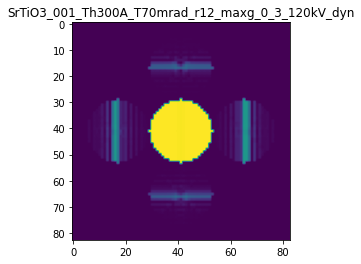

X_sim.max(): 0.9998445828144542
>>>replaced the 95. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0075 - mean_absolute_error: 0.0227 - acc: 0.5900 - val_loss: 5.4411e-04 - val_mean_absolute_error: 0.0117 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0075 - mean_absolute_error: 0.0231 - acc: 0.5900 - val_loss: 5.4925e-04 - val_mean_absolute_error: 0.0118 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0075 - mean_absolute_error: 0.0227 - acc: 0.5900 - val_loss: 5.3465e-04 - val_mean_absolute_error: 0.0109 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 4s 817ms/step - loss: 0.0076 - mean_absolute_error: 0.0226 - acc: 0.5900 - val_loss: 4.9170e-04 - val_mean_absolute_error: 0.0103 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 4s 944ms/step - loss: 0.0075 - mean_absolute_error: 0.0230 - acc: 0.5900 - val_loss: 5.4592e-0

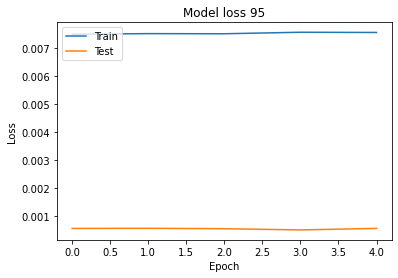

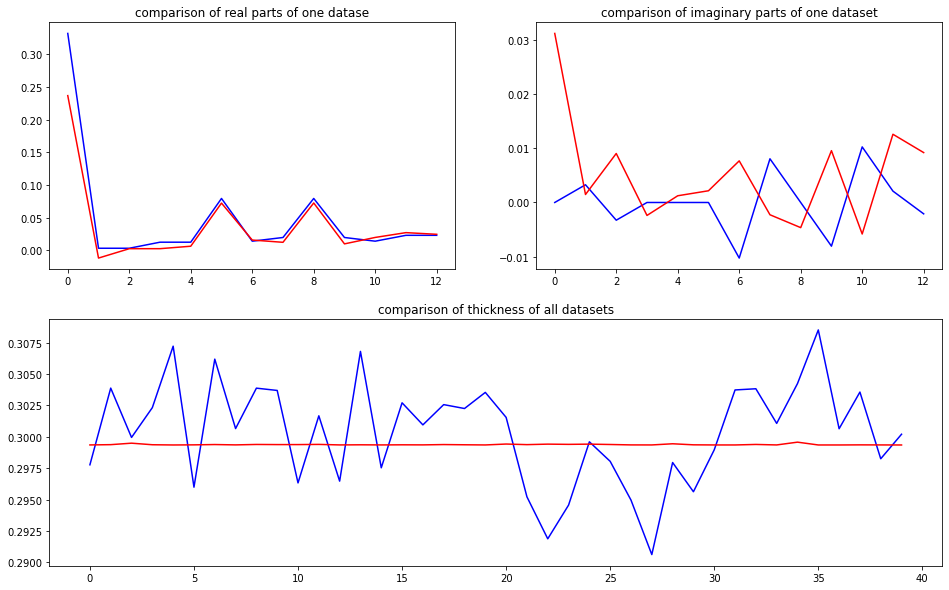

predicted thickness: 0.29959324


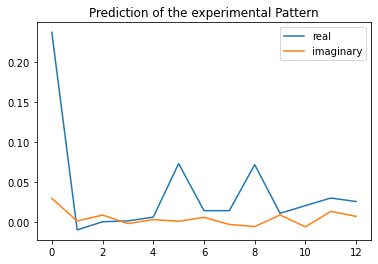

The offset applied on thickness: -0.0006481370776177719

The offset applied on Ug: 0.4610884821195111

Applied shift of unit cell origin (fractional coordinates): 0.0845365693454795 0.003513237153853809
Ug[ 0 ]: 0.26351 0.0  =>  0.26351 0.0
Ug[ 1 ]: 0.00571 -2.41922  =>  0.00571 -2.39715
Ug[ 2 ]: 0.00571 2.41922  =>  0.00571 2.39715
Ug[ 3 ]: 0.00486 -0.53116  =>  0.00486 -0.0
Ug[ 4 ]: 0.00486 0.53116  =>  0.00486 0.0
Ug[ 5 ]: 0.07516 0.04415  =>  0.07516 0.0
Ug[ 6 ]: 0.01885 0.31683  =>  0.01885 0.82591
Ug[ 7 ]: 0.01431 -0.42466  =>  0.01431 -0.9779
Ug[ 8 ]: 0.07516 -0.04415  =>  0.07516 -0.0
Ug[ 9 ]: 0.01431 0.42466  =>  0.01431 0.9779
Ug[ 10 ]: 0.01885 -0.31683  =>  0.01885 -0.82591
Ug[ 11 ]: 0.02879 0.11159  =>  0.02879 -0.95073
Ug[ 12 ]: 0.02879 -0.11159  =>  0.02879 0.95073
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

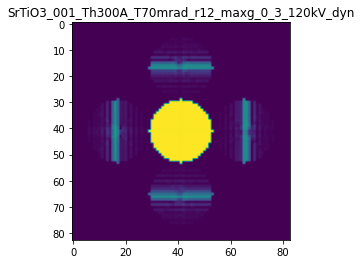

X_sim.max(): 0.9998300261863153
>>>replaced the 96. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 947ms/step - loss: 0.0076 - mean_absolute_error: 0.0233 - acc: 0.5900 - val_loss: 5.1159e-04 - val_mean_absolute_error: 0.0108 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 538ms/step - loss: 0.0075 - mean_absolute_error: 0.0224 - acc: 0.5900 - val_loss: 5.1215e-04 - val_mean_absolute_error: 0.0108 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 535ms/step - loss: 0.0075 - mean_absolute_error: 0.0224 - acc: 0.5900 - val_loss: 5.4610e-04 - val_mean_absolute_error: 0.0109 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 3s 673ms/step - loss: 0.0075 - mean_absolute_error: 0.0223 - acc: 0.5900 - val_loss: 5.7032e-04 - val_mean_absolute_error: 0.0112 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 4s 945ms/step - loss: 0.0075 - mean_absolute_error: 0.0226 - acc: 0.5900 - val_loss: 5.2765

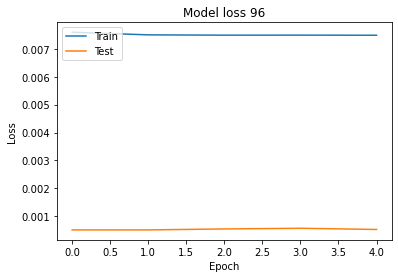

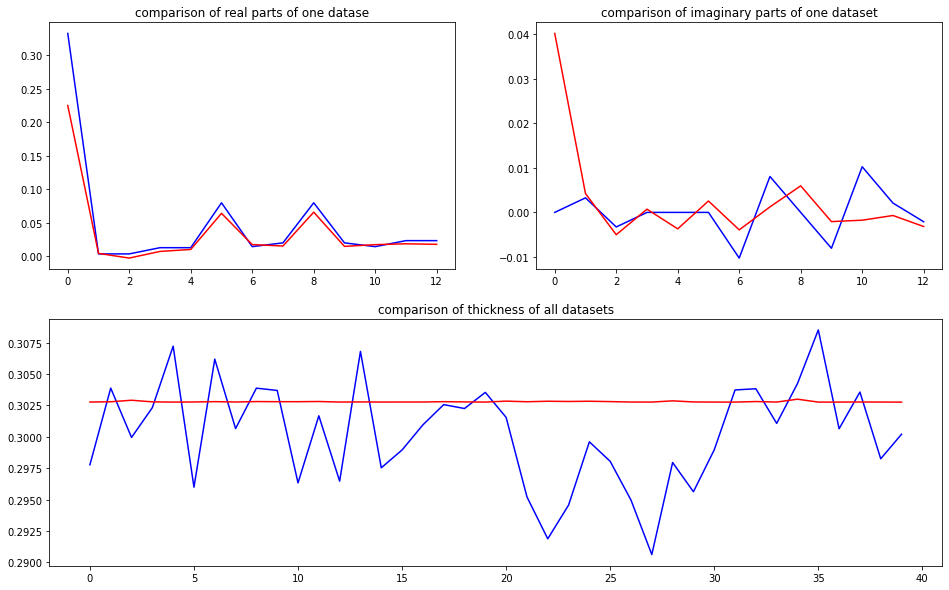

predicted thickness: 0.303016


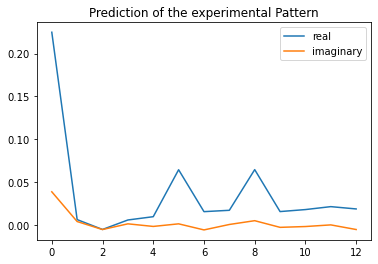

The offset applied on thickness: 0.0003994143686297613

The offset applied on Ug: 1.0802100643520145

Applied shift of unit cell origin (fractional coordinates): -0.02857751629414995 -0.0021362009893556577
Ug[ 0 ]: 0.28104 0.0  =>  0.28104 0.0
Ug[ 1 ]: 0.00475 1.37809  =>  0.00475 1.36466
Ug[ 2 ]: 0.00475 -1.37809  =>  0.00475 -1.36466
Ug[ 3 ]: 0.00829 0.17956  =>  0.00829 -0.0
Ug[ 4 ]: 0.00829 -0.17956  =>  0.00829 0.0
Ug[ 5 ]: 0.06932 -0.02684  =>  0.06932 -0.0
Ug[ 6 ]: 0.01752 -0.11454  =>  0.01752 -0.28068
Ug[ 7 ]: 0.01709 0.09948  =>  0.01709 0.29246
Ug[ 8 ]: 0.06932 0.02684  =>  0.06932 0.0
Ug[ 9 ]: 0.01709 -0.09948  =>  0.01709 -0.29246
Ug[ 10 ]: 0.01752 0.11454  =>  0.01752 0.28068
Ug[ 11 ]: 0.021 0.13114  =>  0.021 0.49025
Ug[ 12 ]: 0.021 -0.13114  =>  0.021 -0.49025
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

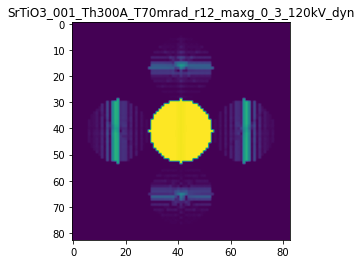

X_sim.max(): 0.999492921663444
>>>replaced the 97. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 940ms/step - loss: 0.0048 - mean_absolute_error: 0.0204 - acc: 0.6000 - val_loss: 4.7614e-04 - val_mean_absolute_error: 0.0098 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0048 - mean_absolute_error: 0.0194 - acc: 0.6000 - val_loss: 4.7875e-04 - val_mean_absolute_error: 0.0098 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0048 - mean_absolute_error: 0.0195 - acc: 0.6000 - val_loss: 4.6719e-04 - val_mean_absolute_error: 0.0093 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0048 - mean_absolute_error: 0.0194 - acc: 0.6000 - val_loss: 4.8223e-04 - val_mean_absolute_error: 0.0098 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 4s 951ms/step - loss: 0.0048 - mean_absolute_error: 0.0199 - acc: 0.6000 - val_loss: 4.8803e

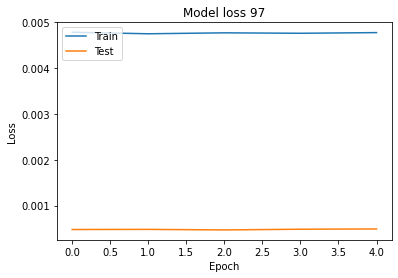

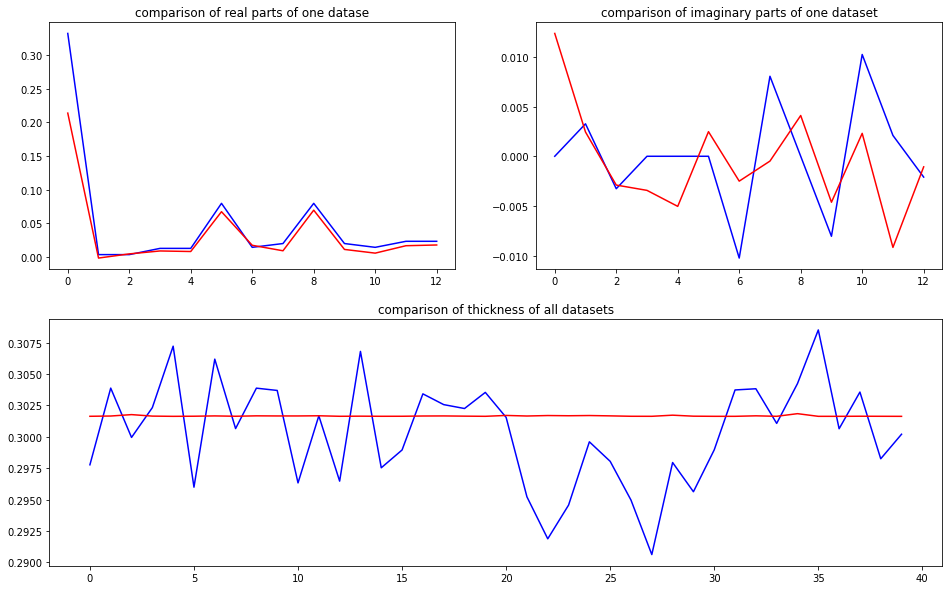

predicted thickness: 0.30185854


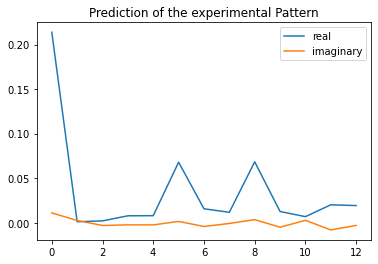

The offset applied on thickness: -0.00022472267613465348

The offset applied on Ug: 1.4563594994383693

Applied shift of unit cell origin (fractional coordinates): -0.00034712937162693696 -0.001151058028234586
Ug[ 0 ]: 0.28048 0.0  =>  0.28048 0.0
Ug[ 1 ]: 0.00325 1.03296  =>  0.00325 1.02573
Ug[ 2 ]: 0.00325 -1.03296  =>  0.00325 -1.02573
Ug[ 3 ]: 0.00799 0.00218  =>  0.00799 0.0
Ug[ 4 ]: 0.00799 -0.00218  =>  0.00799 0.0
Ug[ 5 ]: 0.07496 -0.01446  =>  0.07496 0.0
Ug[ 6 ]: 0.01198 -0.27885  =>  0.01198 -0.2738
Ug[ 7 ]: 0.01261 0.16453  =>  0.01261 0.17394
Ug[ 8 ]: 0.07496 0.01446  =>  0.07496 -0.0
Ug[ 9 ]: 0.01261 -0.16453  =>  0.01261 -0.17394
Ug[ 10 ]: 0.01198 0.27885  =>  0.01198 0.2738
Ug[ 11 ]: 0.0205 -0.12016  =>  0.0205 -0.11579
Ug[ 12 ]: 0.0205 0.12016  =>  0.0205 0.11579
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

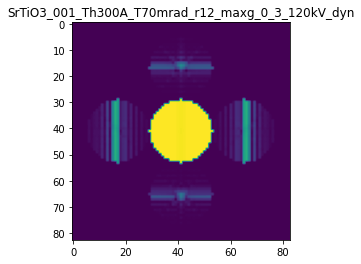

X_sim.max(): 0.9996841263687061
>>>replaced the 98. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 941ms/step - loss: 0.0046 - mean_absolute_error: 0.0194 - acc: 0.6100 - val_loss: 4.7252e-04 - val_mean_absolute_error: 0.0095 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0046 - mean_absolute_error: 0.0190 - acc: 0.6100 - val_loss: 4.8726e-04 - val_mean_absolute_error: 0.0092 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0046 - mean_absolute_error: 0.0190 - acc: 0.6100 - val_loss: 4.8042e-04 - val_mean_absolute_error: 0.0104 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 3s 709ms/step - loss: 0.0046 - mean_absolute_error: 0.0194 - acc: 0.6100 - val_loss: 4.7940e-04 - val_mean_absolute_error: 0.0102 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 4s 954ms/step - loss: 0.0046 - mean_absolute_error: 0.0197 - acc: 0.6100 - val_loss: 4.7230

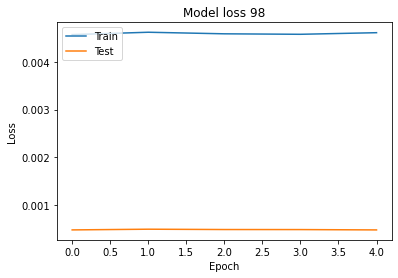

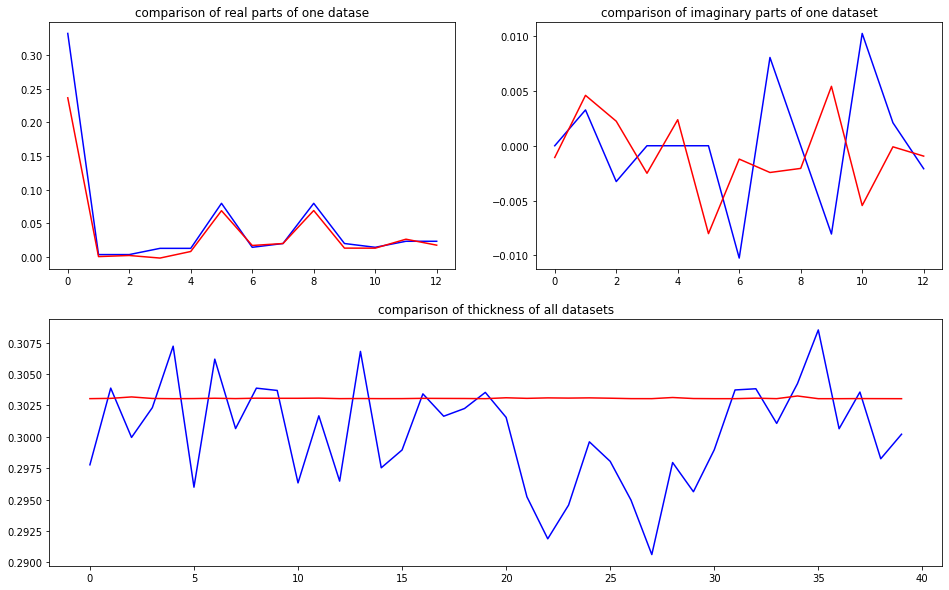

predicted thickness: 0.30329952


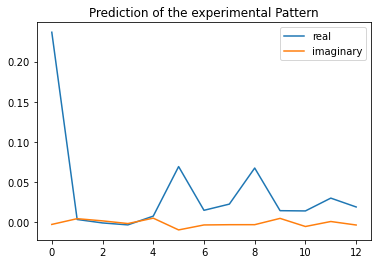

The offset applied on thickness: 0.0006288229849220006

The offset applied on Ug: 1.6336479598545708

Applied shift of unit cell origin (fractional coordinates): 0.14790052108584884 -0.0030235281036724705
Ug[ 0 ]: 0.32783 0.0  =>  0.32783 0.0
Ug[ 1 ]: 0.00215 0.70508  =>  0.00215 0.68608
Ug[ 2 ]: 0.00215 -0.70508  =>  0.00215 -0.68608
Ug[ 3 ]: 0.00427 -0.92929  =>  0.00427 -0.0
Ug[ 4 ]: 0.00427 0.92929  =>  0.00427 0.0
Ug[ 5 ]: 0.07641 -0.03799  =>  0.07641 0.0
Ug[ 6 ]: 0.01518 0.06395  =>  0.01518 1.01223
Ug[ 7 ]: 0.01975 -0.18683  =>  0.01975 -1.09712
Ug[ 8 ]: 0.07641 0.03799  =>  0.07641 0.0
Ug[ 9 ]: 0.01975 0.18683  =>  0.01975 1.09712
Ug[ 10 ]: 0.01518 -0.06395  =>  0.01518 -1.01223
Ug[ 11 ]: 0.026 0.10304  =>  0.026 -1.75553
Ug[ 12 ]: 0.026 -0.10304  =>  0.026 1.75553
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

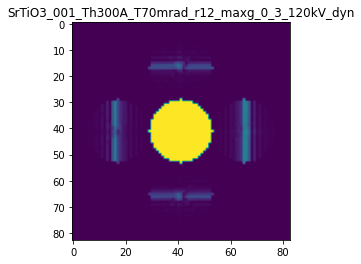

X_sim.max(): 0.999895805839313
>>>replaced the 99. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 937ms/step - loss: 0.0046 - mean_absolute_error: 0.0191 - acc: 0.6000 - val_loss: 4.8175e-04 - val_mean_absolute_error: 0.0101 - val_acc: 0.6750
Epoch 2/5
5/5 [==============================] - 2s 530ms/step - loss: 0.0046 - mean_absolute_error: 0.0196 - acc: 0.6000 - val_loss: 4.6808e-04 - val_mean_absolute_error: 0.0095 - val_acc: 0.6750
Epoch 3/5
5/5 [==============================] - 3s 772ms/step - loss: 0.0046 - mean_absolute_error: 0.0190 - acc: 0.6000 - val_loss: 4.7451e-04 - val_mean_absolute_error: 0.0097 - val_acc: 0.6750
Epoch 4/5
5/5 [==============================] - 135s 33s/step - loss: 0.0046 - mean_absolute_error: 0.0192 - acc: 0.6000 - val_loss: 4.8034e-04 - val_mean_absolute_error: 0.0099 - val_acc: 0.6750
Epoch 5/5
5/5 [==============================] - 4s 741ms/step - loss: 0.0045 - mean_absolute_error: 0.0191 - acc: 0.6000 - val_loss: 4.7126e

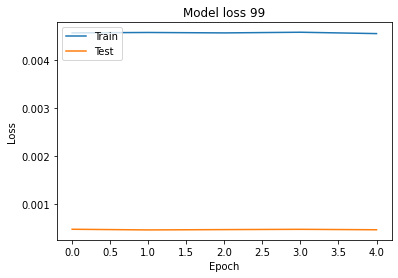

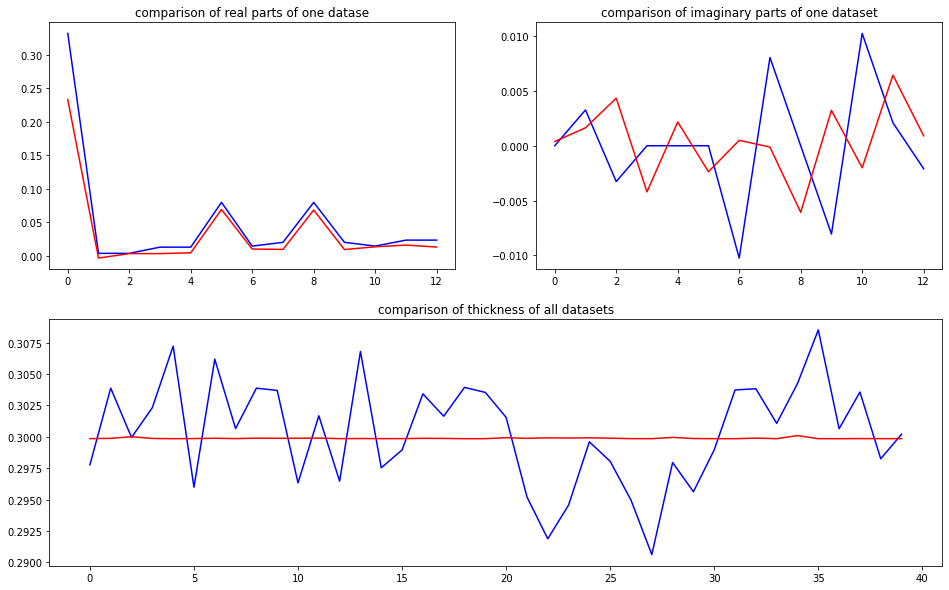

predicted thickness: 0.30017224


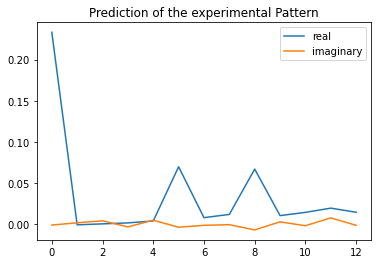

The offset applied on thickness: 0.00047227861285022545

The offset applied on Ug: 0.40084895378128094

Applied shift of unit cell origin (fractional coordinates): 0.15084339021119283 0.001924876086519965
Ug[ 0 ]: 0.25511 0.0  =>  0.25511 0.0
Ug[ 1 ]: 0.00123 -1.59351  =>  0.00123 -1.58141
Ug[ 2 ]: 0.00123 1.59351  =>  0.00123 1.58141
Ug[ 3 ]: 0.00502 -0.94778  =>  0.00502 -0.0
Ug[ 4 ]: 0.00502 0.94778  =>  0.00502 0.0
Ug[ 5 ]: 0.07042 0.02419  =>  0.07042 0.0
Ug[ 6 ]: 0.01136 0.01797  =>  0.01136 0.95366
Ug[ 7 ]: 0.0115 -0.14837  =>  0.0115 -1.10824
Ug[ 8 ]: 0.07042 -0.02419  =>  0.07042 0.0
Ug[ 9 ]: 0.0115 0.14837  =>  0.0115 1.10824
Ug[ 10 ]: 0.01136 -0.01797  =>  0.01136 -0.95366
Ug[ 11 ]: 0.01787 0.25888  =>  0.01787 -1.63667
Ug[ 12 ]: 0.01787 -0.25888  =>  0.01787 1.63667
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

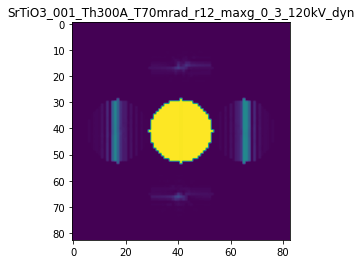

X_sim.max(): 0.999918803988288
>>>replaced the 100. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0045 - mean_absolute_error: 0.0190 - acc: 0.6000 - val_loss: 4.5057e-04 - val_mean_absolute_error: 0.0086 - val_acc: 0.7000
Epoch 2/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0045 - mean_absolute_error: 0.0187 - acc: 0.6000 - val_loss: 4.5015e-04 - val_mean_absolute_error: 0.0090 - val_acc: 0.7000
Epoch 3/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0045 - mean_absolute_error: 0.0185 - acc: 0.6000 - val_loss: 4.7886e-04 - val_mean_absolute_error: 0.0090 - val_acc: 0.7000
Epoch 4/5
5/5 [==============================] - 3s 561ms/step - loss: 0.0045 - mean_absolute_error: 0.0188 - acc: 0.6000 - val_loss: 4.6287e-04 - val_mean_absolute_error: 0.0094 - val_acc: 0.7000
Epoch 5/5
5/5 [==============================] - 3s 620ms/step - loss: 0.0045 - mean_absolute_error: 0.0187 - acc: 0.6000 - val_loss: 4.5615e-0

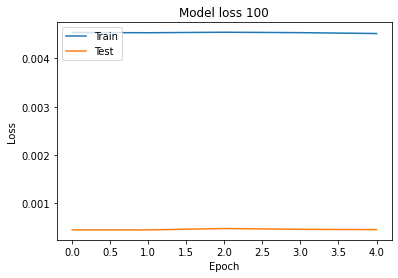

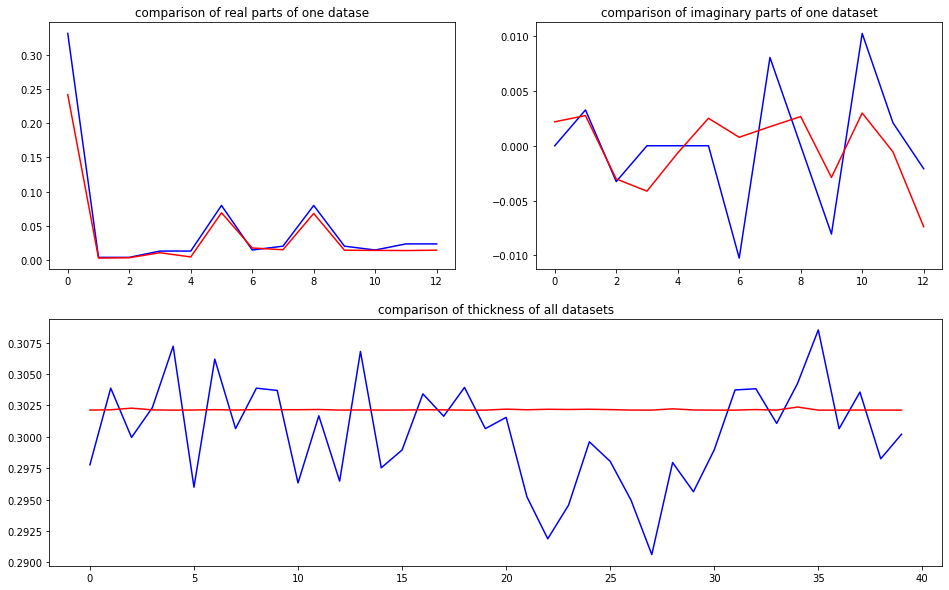

predicted thickness: 0.30245128


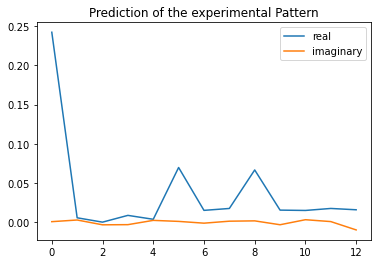

The offset applied on thickness: -0.0008230467694666144

The offset applied on Ug: 0.26308145176159853

Applied shift of unit cell origin (fractional coordinates): 0.06401962239149527 -0.0003161104065420661
Ug[ 0 ]: 0.25761 0.0  =>  0.25761 0.0
Ug[ 1 ]: 0.0043 0.79237  =>  0.0043 0.79039
Ug[ 2 ]: 0.0043 -0.79237  =>  0.0043 -0.79039
Ug[ 3 ]: 0.00694 -0.40225  =>  0.00694 0.0
Ug[ 4 ]: 0.00694 0.40225  =>  0.00694 0.0
Ug[ 5 ]: 0.06953 -0.00397  =>  0.06953 0.0
Ug[ 6 ]: 0.01541 -0.14327  =>  0.01541 0.26096
Ug[ 7 ]: 0.01684 0.13522  =>  0.01684 -0.26505
Ug[ 8 ]: 0.06953 0.00397  =>  0.06953 0.0
Ug[ 9 ]: 0.01684 -0.13522  =>  0.01684 0.26505
Ug[ 10 ]: 0.01541 0.14327  =>  0.01541 -0.26096
Ug[ 11 ]: 0.01774 0.30353  =>  0.01774 -0.50096
Ug[ 12 ]: 0.01774 -0.30353  =>  0.01774 0.50096
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

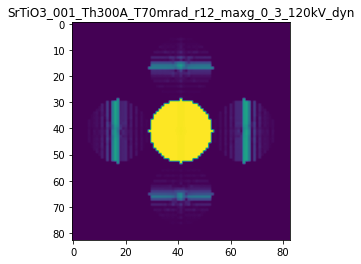

X_sim.max(): 0.9996071403664933
Time:  3290.232689595


In [13]:
Ug_t_exp_pred_matrix = [] #matrix to save the predicted {Ug,t} of the experimental pattern
Ug_exp_pred_matrix = [] #matrix to save the predicted Ug of the experimental pattern
t_exp_pred_matrix = [] #matrix to save the predicted t of the experimental pattern
simulation_pattern = [] #matrix to save the simulation pattern produced by predicted {Ug,t}
scale = 5 # scale of random offset 

DoDiverse = True

start = timeit.default_timer()
for i in range(0,trainsize+1):
    
    if i == 0:
        print('>>>train the initial training set:')
        Epochs = 20
        
    else:
        print('>>>replaced the {0:d}. dataset and train: '.format(i))
        Epochs = 5
    
    # load and compile the model
    model = load_model(name+'.h5')

    # invert the 1 channel image Array to 3 Channel, to use ResNet50
    X_train_3C = np.concatenate((X_train,X_train,X_train),axis=3) #same value for every channel
    X_test_3C = np.concatenate((X_test,X_test,X_test),axis=3)
    

    # train the model
    model.fit(X_train_3C, y_train, validation_data=(X_test_3C, y_test), batch_size=20, epochs=Epochs)
        
    # save the trained weigths of the model, delete the existing model
    model.save(name + ".h5")


    # plot the model loss
    plt.plot(model.history.history['loss'])
    plt.plot(model.history.history['val_loss'])
    plt.title('Model loss {0:d}'.format(i))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    #plt.savefig(trainingFolder  + 'My_Model_ZnO' + '/' + 'My_Model_Loss' + '/' + 'Model_Loss{0:d}.png'.format(i))
    plt.show()
    plt.close()
    

    # Prediction of the testing set
    y_test_pred = model.predict(X_test_3C)    
    Ug_test_pred_complex = y_test_pred[:,:2*numUg].reshape(-1,numUg,2)
    Ug_test_complex = y_test[:,:2*numUg].reshape(-1,numUg,2)    
    t_test_pred = y_test_pred[:,2*numUg]
    t_test = y_test[:,2*numUg]
    
    # plot the comparison of imaginary parts, real parts and thickness
    gs = gridspec.GridSpec(2, 2)
    fig = plt.figure(figsize=(16,10))
    
    ax1 = fig.add_subplot(gs[0, 0]) 
    ax1.plot(Ug_test_complex[2,:,0],'b')
    ax1.plot(Ug_test_pred_complex[2,:,0],'r')
    ax1.set_title('comparison of real parts of one datase')
    
    ax2 = fig.add_subplot(gs[0, 1]) 
    ax2.plot(Ug_test_complex[2,:,1],'b')
    ax2.plot(Ug_test_pred_complex[2,:,1],'r')
    ax2.set_title('comparison of imaginary parts of one dataset')
    
    ax3 = fig.add_subplot(gs[1, :])
    ax3.plot(t_test[:],'b')
    ax3.plot(t_test_pred[:],'r')
    ax3.set_title('comparison of thickness of all datasets')
    plt.show()
    plt.close()
    
    
    # Prediction of the experimental Pattern
    X_exp_3C = np.concatenate((nlogf_I,nlogf_I,nlogf_I),axis=3)
    y_exp_pred = model.predict(X_exp_3C)
    
    Ug_t_exp_pred = y_exp_pred[0,:] 
    Ug_exp_pred = Ug_t_exp_pred[0:2*numUg] 
    t_exp_pred = Ug_t_exp_pred[-1] 
    
    Ug_t_exp_pred_matrix.append(Ug_t_exp_pred)
    Ug_exp_pred_matrix.append(Ug_exp_pred)
    t_exp_pred_matrix.append(t_exp_pred)
    print("predicted thickness:", t_exp_pred)
 
    
    # plot the results
    plt.plot(Ug_exp_pred[0:2*numUg:2],label='real')
    plt.plot(Ug_exp_pred[1:2*numUg:2],label='imaginary')
    plt.legend()
    plt.title('Prediction of the experimental Pattern')
    plt.show()
    plt.close()
    
    # diverse the predicted Ug and thickness
    if DoDiverse == True:
        # scale will be reduced by iterations
        scale *= 0.99
        Ug_t_diverse = diverse_Ug_t(Ug_t_exp_pred, scale_Ug=scale)
        Ug_t_exp_pred = Ug_t_diverse
                        

    # normalization --> normalized complex Ug
    Ug_pred = np.array(range( np.int((Ug_t_exp_pred.size - 1)/2) ), dtype=complex)
    Ug_pred.real = Ug_t_exp_pred[0:-1:2]
    Ug_pred.imag = Ug_t_exp_pred[1:-1:2]
    Ug_pred_normalized = nf.normalization(file=File, origin_Ug=Ug_pred)
    Ug_pred_normalized = np.asarray(Ug_pred_normalized)
    
    # Make unique Ug
    if makeUniqueUgVector == True:
        UgUnique, r0 = mu.makeUniqueUgVector(Ug_pred_normalized,beam1,beam2,file = File)
        Ug_pred_normalized = UgUnique
    

    # reshape
    Ug_pred_normalized_2real = np.concatenate((np.array(Ug_pred_normalized.real,ndmin=2).T, np.array(Ug_pred_normalized.imag,ndmin=2).T),axis=1)  
    Ug_pred_normalized_2real = np.asarray(Ug_pred_normalized_2real)
    Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(numUg*2), Ug_t_exp_pred[-1])
    #Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(numUg*2), thickness)
        
    
    # Compute the LARBED pattern: X_sim, from the predicted {Ug,t}: Y_exp_pred
    file = File+".qed"
    X_sim = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_pred_normalized_2real, InputUgdoFlip=False)
    X_sim = X_sim.reshape(Nx,Nx,1)
    #nlogf_X_sim = nlogf(X_sim)
    
    simulation_pattern.append(X_sim)
    print("X_sim.max():",X_sim.max())
        
    
    # replace the training set & testing set with new training set
    if i < trainsize:
        #X_train[i] = nlogf_X_sim               
        X_train[i] = X_sim               
        y_train[i] = Ug_t_pred_normalized_2real
        
        X_test[i%testsize] = X_sim
        y_test[i%testsize] = Ug_t_pred_normalized_2real
        #else:
        #    X_test = X_train[i+1-testsize:i+1]
        #    Y_test = Y_train[i+1-testsize:i+1]

stop = timeit.default_timer()
print('Time: ', stop - start)

-------------------------------------------------------------------------------------------------------------------

# IV. Compare the Prediction with the true value

1. diffraction pattern:

In [14]:
simulation_pattern = np.asarray(simulation_pattern)
print('the shape of the simulated pattern', simulation_pattern.shape)
print('the shape of the experimental pattern', I.shape)

the shape of the simulated pattern (101, 83, 83, 1)
the shape of the experimental pattern (1, 83, 83, 1)


Text(0.5, 1.0, 'experimental Pattern')

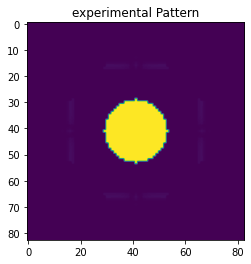

In [15]:
# plot the experimental Pattern:
plt.imshow(nlogf_I[0])
plt.title('experimental Pattern')

Text(0.5, 1.0, 'simulation pattern')

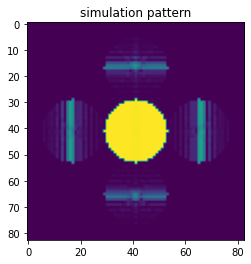

In [16]:
# plot the final simulated Pattern:
plt.imshow(nlogf(simulation_pattern[-1]))
plt.title("simulation pattern")

2. thickness:

Text(0.5, 0, 'iteration')

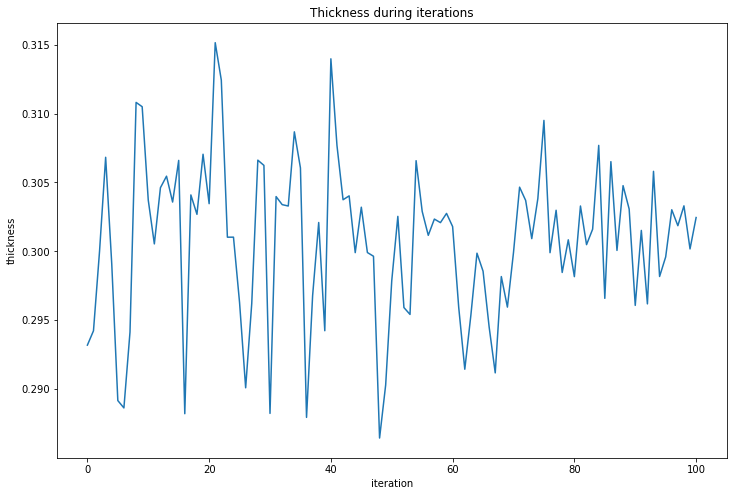

In [17]:
# plot the prediction of thickness during iterations:
plt.figure(figsize=(12,8))
plt.plot(t_exp_pred_matrix)
plt.title("Thickness during iterations")
plt.ylabel("thickness")
plt.xlabel("iteration")

3. R-factors:

Text(0.5, 0, 'Iteration')

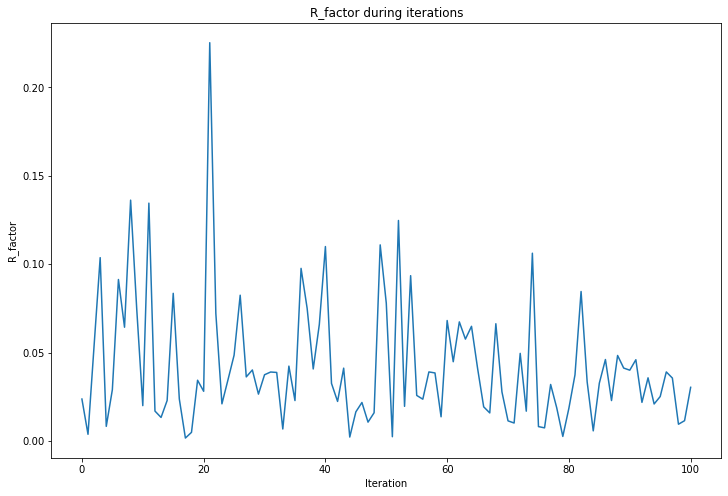

In [18]:
# plot the R-factors during iterations
exp_Intensity = I.reshape(-1)
sim_Intensities = []
R_factors = []
for i in range(len(simulation_pattern)):
    sim_Intensity = simulation_pattern[i].reshape(-1)
    R = np.sum(np.abs(sim_Intensity - exp_Intensity))/np.sum(exp_Intensity)
    R_factors = np.append(R_factors, R)

plt.figure(figsize=(12,8))
plt.plot(R_factors[:])
plt.title('R_factor during iterations')
plt.ylabel('R_factor')
plt.xlabel('Iteration')

R_min: 0.0016349217065370605


Text(0.5, 1.0, 'simulation pattern')

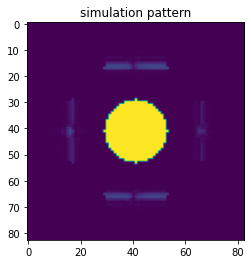

In [19]:
R_argmin = R_factors.argmin()
R_min = R_factors.min()
print("R_min:", R_min)
plt.imshow(nlogf(simulation_pattern[R_argmin].reshape(Nx,Nx,1)))
plt.title("simulation pattern")

In [20]:
t_exp_pred_matrix[R_argmin]

0.30409145

R-factor:  0.0016349217065370605


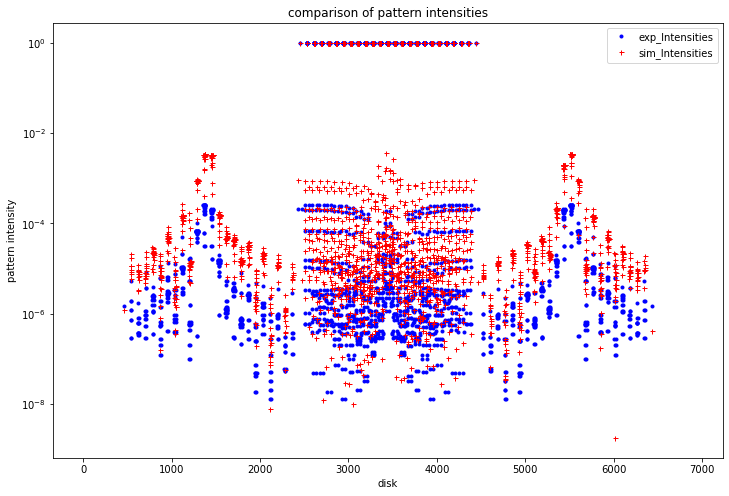

In [21]:
exp_Intensities = I[0].reshape(Nx*Nx)
sim_Intensities = simulation_pattern[R_argmin].reshape(Nx*Nx)
R = np.sum(np.abs(sim_Intensities - exp_Intensities))/np.sum(exp_Intensities)
print("R-factor: ", R)    
plt.figure(figsize=(12,8))
plt.axes(yscale = "log")
plt.plot(exp_Intensities, "bo", markersize=3, label="exp_Intensities")
plt.plot(sim_Intensities, "r+", markersize=5, label="sim_Intensities")
plt.legend()
plt.xlabel("disk")
plt.ylabel("pattern intensity")
plt.title("comparison of pattern intensities")
plt.show()